In [ ]:
import pandas as pd
import csv
import os
import re
import ast
import math
import spacy
from spacy.pipeline import EntityRuler
from google.colab import drive
from spacy import displacy
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import plotly.express as px
from matplotlib.colors import Normalize, ListedColormap, LogNorm, PowerNorm
import seaborn as sns
import geopandas as gpd
import plotly.graph_objects as go
from collections import Counter, defaultdict

drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/EquityInClimateChangeResearch')

Mounted at /content/drive


In [ ]:
country_mapping = {
    'Alabama': 'United States',
    'Alaska': 'United States',
    'Albuquerque': 'United States',
    'Ann Arbor': 'United States',
    'Anchorage': 'United States',
    'Arizona': 'United States',
    'Arkansas': 'United States',
    'Atlanta': 'United States',
    'Berkeley': 'United States',
    'Boston': 'United States',
    'Boulder': 'United States',
    'Buffalo': 'United States',
    'California': 'United States',
    'Clayton': 'United States',
    'Chicago': 'United States',
    'Colorado': 'United States',
    'Connecticut': 'United States',
    'Denver': 'United States',
    'Eastern United States': 'United States',
    'Eastern North Carolina': 'United States',
    'Florida': 'United States',
    'Fort Collins': 'United States',
    'Hawaii': 'United States',
    'Honolulu': 'United States',
    'Houston': 'United States',
    'Huntsville': 'United States',
    'Indiana': 'United States',
    'Ithaca': 'United States',
    'Knoxville': 'United States',
    'La Crosse': 'United States',
    'Long Island': 'United States',
    'Los Angeles': 'United States',
    'Louisiana': 'United States',
    'Lower Colorado': 'United States',
    'Manhattan': 'United States',
    'Maryland': 'United States',
    'Massachusetts': 'United States',
    'Miami': 'United States',
    'Michigan': 'United States',
    'Midwest USA': 'United States',
    'Minnesota': 'United States',
    'Missoula': 'United States',
    'Nevada': 'United States',
    'New England': 'United States',
    'New Haven': 'United States',
    'New Jersey': 'United States',
    'New Mexico': 'United States',
    'New York': 'United States',
    'New York City': 'United States',
    'New York Metropolitan': 'United States',
    'North Carolina': 'United States',
    'North Dakota': 'United States',
    'Oklahoma': 'United States',
    'Pasadena': 'United States',
    'Pennsylvania': 'United States',
    'Philadelphia': 'United States',
    'Piscataway': 'United States',
    'Portland': 'United States',
    'Providence': 'United States',
    'Santa Barbara': 'United States',
    'Santa Cruz': 'United States',
    'San Diego': 'United States',
    'San Francisco': 'United States',
    'Saint Paul': 'United States',
    'Seattle': 'United States',
    'Southeast United States': 'United States',
    'Southwest USA': 'United States',
    'Syracuse': 'United States',
    'Tampa': 'United States',
    'Tempe': 'United States',
    'Texas': 'United States',
    'The Midwest USA': 'United States',
    'The Midwestern United States': 'United States',
    'The Northeastern United States': 'United States',
    'The Southwest United States': 'United States',
    'The Western United States': 'United States',
    'The United States': 'United States',
    'The United States of America': 'United States',
    'the United States Southwest': 'United States',
    'US': 'United States',
    'USA': 'United States',
    'US East Coast': 'United States',
    'US Midwest': 'United States',
    'US West Coast': 'United States',
    'Utah': 'United States',
    'United States of America': 'United States',
    'University Park': 'United States',
    'Urbana': 'United States',
    'Vermont': 'United States',
    'Washington': 'United States',
    'Western United States': 'United States',
    'Wilmington': 'United States',

    'Beijing': 'China',
    'Central China': 'China',
    'Chongqing': 'China',
    'East China': 'China',
    'Eastern China': 'China',
    'Fuzhou': 'China',
    'Guangxi': 'China',
    'Guangzhou': 'China',
    'Guizhou': 'China',
    'Hangzhou': 'China',
    'Hebei': 'China',
    'Heilongjiang': 'China',
    # 'Hongkong': 'China',
    # 'Hong Kong': 'China',
    'Hubei': 'China',
    'Hubei Province': 'China',
    'Jinan': 'China',
    'Nanchang': 'China',
    'Nanning': 'China',
    'North China': 'China',
    'Northeast China': 'China',
    'Northern China': 'China',
    'Northwest China': 'China',
    'Northwestern China': 'China',
    "People Republic of China": 'China',
    "People's Republic of China": 'China',
    "People’s Republic of China": 'China',
    'Qingdao': 'China',
    'Qinghai': 'China',
    'Shanghai': 'China',
    'Shanxi': 'China',
    'Shenyang': 'China',
    'Shenzhen': 'China',
    'Shijiazhuang': 'China',
    'Sichuan': 'China',
    'Sichuan Province': 'China',
    'South China': 'China',
    'Southern China': 'China',
    'Southwest China': 'China',
    # 'Taiwan': 'China',
    'Weihai': 'China',
    'Western China': 'China',
    'Wuhan': 'China',
    'Xiamen': 'China',
    'Yunnan': 'China',

    'Britain': 'United Kingdom',
    'Cambridge': 'United Kingdom',
    'England': 'United Kingdom',
    'Great Britain': 'United Kingdom',
    'Greater London': 'United Kingdom',
    'London': 'United Kingdom',
    'Northern Ireland': 'United Kingdom',
    'Southern England': 'United Kingdom',
    'Scotland': 'United Kingdom',
    'The United Kingdom': 'United Kingdom',
    'UK': 'United Kingdom',
    'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
    'Wales': 'United Kingdom',

    'Ahmedabad': 'India',
    'Bengal': 'India',
    'Central India': 'India',
    'Delhi': 'India',
    'Kerala': 'India',
    'Kolkata': 'India',
    'New Delhi': 'India',
    'North India': 'India',
    'Northeast India': 'India',
    'Northeastern India': 'India',
    'Northern India': 'India',
    'Peninsular India': 'India',
    'Punjab': 'India',
    'South India': 'India',
    'Southern India': 'India',

    'Congo, the democratic republic o': 'Democratic Republic of Congo',
    'Congo, the democratic republic of': 'Democratic Republic of Congo',
    'Dem Rep Congo': 'Democratic Republic of Congo',
    'Dem. Rep. Congo': 'Democratic Republic of Congo',
    'Democratic Republic of the Congo': 'Democratic Republic of Congo',
    'DR Congo': 'Democratic Republic of Congo',
    'DR of Congo': 'Democratic Republic of Congo',
    'The Democratic Republic of Congo': 'Democratic Republic of Congo',
    'The Democratic Republic of the Congo': 'Democratic Republic of Congo',
    'Yangambi': 'Democratic Republic of Congo',

    'Greenland': 'Denmark',
    'East Greenland': 'Denmark',
    'North Greenland': 'Denmark',
    'Northeast Greenland': 'Denmark',
    'Northern Greenland': 'Denmark',
    'Northwest Greenland': 'Denmark',
    'Southeast Greenland': 'Denmark',
    'West Greenland': 'Denmark',

    'Brisbane': 'Australia',
    'East Australia': 'Australia',
    'New South Wales': 'Australia',
    'North Australia': 'Australia',
    'Perth': 'Australia',
    'Sydney': 'Australia',

    "Democratic People Republic of Korea": 'North Korea',
    "Democratic People's Republic of Korea": 'North Korea',
    "Korea, Democratic People Repub": 'North Korea',
    "Korea, Democratic People Republic": 'North Korea',
    "Korea, Democratic People's Repub": 'North Korea',
    "Korea, Democratic People's Republic": 'North Korea',

    'Lao': 'Laos',
    'Lao PDR': 'Laos',
    "Lao People's Democratic Republic": 'Laos',
    "Lao People Democratic Republic": 'Laos',
    'LPDR': 'Laos',

    'Ansan Republic of Korea': 'South Korea',
    'Ansan, Republic of Korea': 'South Korea',
    'Busan': 'South Korea',
    'Daegu': 'South Korea',
    'Gwangju': 'South Korea',
    'Korea, republic of': 'South Korea',
    'Republic of Korea': 'South Korea',
    'Seoul': 'South Korea',

    'Antigua': 'Antigua and Barbuda',
    'Barbuda': 'Antigua and Barbuda',
    'Antigua and Barb': 'Antigua and Barbuda',
    'Antigua and Barb.': 'Antigua and Barbuda',

    'Bosnia': 'Bosnia and Herzegovina',
    'Herzegovina': 'Bosnia and Herzegovina',
    'Bosnia and Herz': 'Bosnia and Herzegovina',
    'Bosnia and Herz.': 'Bosnia and Herzegovina',

    'Alberta': 'Canada',
    'Eastern Canada': 'Canada',
    'Ontario': 'Canada',
    'The Northwest territories of Canada': 'Canada',

    'Amsterdam': 'Netherlands',
    'Hague': 'Netherlands',
    'The Netherlands': 'Netherlands',
    'Utrecht': 'Netherlands',

    'St Vincent': 'Saint Vincent and the Grenadines',
    'St Vincent and the Grenadines': 'Saint Vincent and the Grenadines',
    'St. Vin. and Gren.': 'Saint Vincent and the Grenadines',
    'St Vin and Gren': 'Saint Vincent and the Grenadines',

    'Bratislava': 'Slovakia',
    'Bratislava, Bratislava': 'Slovakia',
    'Slovak Republic': 'Slovakia',
    'Svit': 'Slovakia',
    'Zvolen': 'Slovakia',

    'Central Siberia': 'Russia',
    'Russian Federation': 'Russia',
    'Siberia': 'Russia',
    'The Russian Federation': 'Russia',
    'West Siberia': 'Russia',
    'Western Siberia': 'Russia',
    'Yakutia': 'Russia',

    'Caribbean': 'Carribean',
    'Puerto': 'Carribean',
    'Puerto Rico': 'Carribean',

    'African Republic': 'Central African Republic',
    'Bangui': 'Central African Republic',
    'Central African Rep': 'Central African Republic',

    'Czhechia': 'Czech Republic',
    'Czechia': 'Czech Republic',
    'The Czech Republic': 'Czech Republic',

    'Dominican Rep': 'Dominican Republic',
    'Dominican Rep.': 'Dominican Republic',

    'INRA': 'France',
    'INRAE': 'France',
    'Paris': 'France',

    'Hateruma': 'Japan',
    'South Japan': 'Japan',
    'Tokyo': 'Japan',

    'Cancun': 'Mexico',
    'México': 'Mexico',
    'Oaxaca': 'Mexico',

    'Ancón': 'Peru',
    'Lima': 'Peru',
    'Perú': 'Peru',

    'Northern Taiwan': 'Taiwan',
    'Republic of China': 'Taiwan',
    'ROC': 'Taiwan',

    'Abu Dhabi': 'United Arab Emirates',
    'Dubai': 'United Arab Emirates',
    'UAE': 'United Arab Emirates',

    'Bolivia, Plurinational State of': 'Bolivia',
    'Bolivia (Plurinational State of)': 'Bolivia',

    'São Paulo': 'Brazil',
    'Sao Paulo': 'Brazil',

    'Brunei': 'Brunei Darussalam',
    'Gadong': 'Brunei Darussalam',

    "Republic of Congo": 'Congo',
    'Republic of the Congo': 'Congo',

    'Eq Guinea': 'Equatorial Guinea',
    'Eq. Guinea': 'Equatorial Guinea',

    'Iran, Islamic Republic of': 'Iran',
    'Iran (Islamic Republic of)': 'Iran',

    'Northern Italy': 'Italy',
    'Venice': 'Italy',

    "Côte d'Ivoire": 'Ivory Coast',
    "Cote d'Ivoire": 'Ivory Coast',

    'Marshall Is': 'Marshall Islands',
    'Marshall Is.': 'Marshall Islands',

    'Micronesia (Federated States of)': 'Micronesia',
    'Micronesia, Federated States Of': 'Micronesia',

    'Republic of Moldova': 'Moldova',
    'Moldova, Republic of': 'Moldova',

    'Panamá': 'Panama',
    'Republic of Panama': 'Panama',

    'St Kitts and Nevis': 'Saint Kitts and Nevis',
    'St. Kitts and Nevis': 'Saint Kitts and Nevis',

    'Solomon Is': 'Solomon Islands',
    'Solomon Is.': 'Solomon Islands',

    'United Republic of Tanzania': 'Tanzania',
    'Tanzania, United Republic of': 'Tanzania',

    'Trinidad': 'Trinidad and Tobago',
    'Tobago': 'Trinidad and Tobago',

    'Venezuela, Bolivarian Republic o': 'Venezuela',
    'Venezuela (Bolivarian Republic of)': 'Venezuela',

    'Ho Chi Minh City': 'Vietnam',
    'Viet Nam': 'Vietnam',

    "Auckland, New Zealand": 'New Zealand',
    'Bangkok': 'Thailand',
    'Benguela': 'Angola',
    'Cape Town': 'South Africa',
    'Cabo Verde': 'Cape Verde',
    'Dakar': 'Senegal',
    'Dhaka': 'Bangaldesh',
    'Doha': 'Qatar',
    'East Malaysia': 'Malaysia',
    'Guinea Bissau': 'Guinea-Bissau',
    'Hong Kong': 'HongKong',
    'Instituto Geofísico': 'Ecuador',
    'Libreville': 'Gabon',
    'Libyan Arab Jamahiriya': 'Libya',
    'Macedonia': 'North Macedonia',
    'Maradi': 'Niger',
    'Mombasa': 'Kenya',
    'Nicosia': 'Cyprus',
    'Pacific Island': 'Pacific Islands',
    'Republic of Ireland': 'Ireland',
    'S Sudan': 'South Sudan',
    'Santa Teresa': 'Costa Rica',
    "São Tomé and Principe": 'Sao Tome and Principe',
    'SIDS': 'Small Island Developing States',
    'Split, Croatia': 'Croatia',
    'Srilanka': 'Sri Lanka',
    'St Lucia': 'Saint Lucia',
    'State of Palestine': 'Palestine',
    'Stockholm': 'Sweden',
    'Sub Saharan Africa': 'Sub-Saharan Africa',
    'Sumatra': 'Indonesia',
    'Swaziland': 'Eswatini',
    'Syrian Arab Republic': 'Syria',
    'Türkiye': 'Turkey',
    'Timor Leste': 'Timor-Leste',
    'Western Norway': 'Norway',
    'Western Uganda': 'Uganda',
    'Yanbu':' Saudi Arabia',
    'Yangon': 'Myanmar',

    'Eastern Asia': 'East Asia',

    'Western Asia': 'West Asia',

    'Southern Asia': 'South Asia',
    'West South Asia': 'South Asia',

    'Equatorial Asia': 'Asia',

    'Mainland Southeast Asia': 'Southeast Asia',
    'South/Southeast asia': 'Southeast Asia',

    'Americas': 'America',
    'Sahel': 'Sahelian Africa',

    'Central North America': 'North America',
    'East North America': 'North America',
    'North-America': 'North America',
    'Northern America': 'North America',
    'Northeast North America': 'North America',
    'Northwestern North America': 'North America',
    'The Northwestern North America': 'North America',
    'Western North America': 'North America',

    'Northeast South America': 'South America',
    'Eastern South America': 'South America',
    'Southeast South America': 'South America',
    'Southeastern South America': 'South America',
    'Southwestern South America': 'South America',

    'Central-East Africa': 'East Africa',
    'Eastern Africa': 'East Africa',
    'Southeastern Africa': 'East Africa',

    'Northern Africa': 'North Africa',

    'Eastern Europe': 'East Europe',
    'South-eastern Europe': 'East Europe',

    'EU': 'Europe',
    'Mediterranean Europe': 'Europe',

    'Northeastern Europe': 'North Europe',
    'Northern Europe': 'North Europe',
    'Northwestern Europe': 'North Europe',
    'Northwest Europe': 'North Europe',

    'Western Europe': 'West Europe',

    'Southern Europe': 'South Europe',
    }

author_mapping = {
    'Alabama': 'United States',
    'Alaska': 'United States',
    'Albuquerque': 'United States',
    'Ann Arbor': 'United States',
    'Anchorage': 'United States',
    'Arizona': 'United States',
    'Arkansas': 'United States',
    'Atlanta': 'United States',
    'Berkeley': 'United States',
    'Boston': 'United States',
    'Boulder': 'United States',
    'Buffalo': 'United States',
    'California': 'United States',
    'Clayton': 'United States',
    'Chicago': 'United States',
    'Colorado': 'United States',
    'Connecticut': 'United States',
    'DC': 'United States',
    'Denver': 'United States',
    'Eastern United States': 'United States',
    'Eastern North Carolina': 'United States',
    'Florida': 'United States',
    'Fort Collins': 'United States',
    'Hawaii': 'United States',
    'Honolulu': 'United States',
    'Houston': 'United States',
    'Huntsville': 'United States',
    'IA': 'United States',
    'Indiana': 'United States',
    'Ithaca': 'United States',
    'Knoxville': 'United States',
    'LA': 'United States',
    'La Crosse': 'United States',
    'Long Island': 'United States',
    'Los Angeles': 'United States',
    'Louisiana': 'United States',
    'Lower Colorado': 'United States',
    'MA': 'United States',
    'Manhattan': 'United States',
    'Maryland': 'United States',
    'Massachusetts': 'United States',
    'Miami': 'United States',
    'Michigan': 'United States',
    'Midwest USA': 'United States',
    'Minnesota': 'United States',
    'Missoula': 'United States',
    'MD': 'United States',
    'Nevada': 'United States',
    'New England': 'United States',
    'New Haven': 'United States',
    'New Jersey': 'United States',
    'New Mexico': 'United States',
    'New York': 'United States',
    'New York City': 'United States',
    'New York Metropolitan': 'United States',
    'North Carolina': 'United States',
    'North Dakota': 'United States',
    'NC': 'United States',
    'NYC': 'United States',
    'Oklahoma': 'United States',
    'PA': 'United States',
    'Pasadena': 'United States',
    'Pennsylvania': 'United States',
    'Philadelphia': 'United States',
    'Piscataway': 'United States',
    'Portland': 'United States',
    'Providence': 'United States',
    'Santa Barbara': 'United States',
    'Santa Cruz': 'United States',
    'San Diego': 'United States',
    'San Francisco': 'United States',
    'Saint Paul': 'United States',
    'Seattle': 'United States',
    'Southeast United States': 'United States',
    'Southwest USA': 'United States',
    'Syracuse': 'United States',
    'Tampa': 'United States',
    'Tempe': 'United States',
    'Texas': 'United States',
    'The Midwest USA': 'United States',
    'The Midwestern United States': 'United States',
    'The Northeastern United States': 'United States',
    'The Southwest United States': 'United States',
    'The Western United States': 'United States',
    'The United States': 'United States',
    'The United States of America': 'United States',
    'the United States Southwest': 'United States',
    'US': 'United States',
    'USA': 'United States',
    'US East Coast': 'United States',
    'US Midwest': 'United States',
    'US West Coast': 'United States',
    'Utah': 'United States',
    'United States of America': 'United States',
    'University Park': 'United States',
    'Urbana': 'United States',
    'VA': 'United States',
    'Vermont': 'United States',
    'Washington': 'United States',
    'Western United States': 'United States',
    'Wilmington': 'United States',

    'Beijing': 'China',
    'Central China': 'China',
    'Chongqing': 'China',
    'East China': 'China',
    'Eastern China': 'China',
    'Fuzhou': 'China',
    'Guangxi': 'China',
    'Guangzhou': 'China',
    'Guizhou': 'China',
    'Hangzhou': 'China',
    'Hebei': 'China',
    'Heilongjiang': 'China',
    # 'Hongkong': 'China',
    # 'Hong Kong': 'China',
    'Hubei': 'China',
    'Hubei Province': 'China',
    'Jinan': 'China',
    'Nanchang': 'China',
    'Nanning': 'China',
    'North China': 'China',
    'Northeast China': 'China',
    'Northern China': 'China',
    'Northwest China': 'China',
    'Northwestern China': 'China',
    "People Republic of China": 'China',
    "People's Republic of China": 'China',
    "People’s Republic of China": 'China',
    'Qingdao': 'China',
    'Qinghai': 'China',
    'Shanghai': 'China',
    'Shanxi': 'China',
    'Shenyang': 'China',
    'Shenzhen': 'China',
    'Shijiazhuang': 'China',
    'Sichuan': 'China',
    'Sichuan Province': 'China',
    'South China': 'China',
    'Southern China': 'China',
    'Southwest China': 'China',
    # 'Taiwan': 'China',
    'Weihai': 'China',
    'Western China': 'China',
    'Wuhan': 'China',
    'Xiamen': 'China',
    'Yunnan': 'China',

    'Britain': 'United Kingdom',
    'Cambridge': 'United Kingdom',
    'England': 'United Kingdom',
    'Great Britain': 'United Kingdom',
    'Greater London': 'United Kingdom',
    'London': 'United Kingdom',
    'Northern Ireland': 'United Kingdom',
    'Southern England': 'United Kingdom',
    'Scotland': 'United Kingdom',
    'The United Kingdom': 'United Kingdom',
    'UK': 'United Kingdom',
    'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom',
    'Wales': 'United Kingdom',

    'Ahmedabad': 'India',
    'Bengal': 'India',
    'Central India': 'India',
    'Delhi': 'India',
    'Kerala': 'India',
    'Kolkata': 'India',
    'New Delhi': 'India',
    'North India': 'India',
    'Northeast India': 'India',
    'Northeastern India': 'India',
    'Northern India': 'India',
    'Peninsular India': 'India',
    'Punjab': 'India',
    'South India': 'India',
    'Southern India': 'India',

    'Congo, the democratic republic o': 'Democratic Republic of Congo',
    'Congo, the democratic republic of': 'Democratic Republic of Congo',
    'Dem Rep Congo': 'Democratic Republic of Congo',
    'Dem. Rep. Congo': 'Democratic Republic of Congo',
    'Democratic Republic of the Congo': 'Democratic Republic of Congo',
    'DR Congo': 'Democratic Republic of Congo',
    'DR of Congo': 'Democratic Republic of Congo',
    'The Democratic Republic of Congo': 'Democratic Republic of Congo',
    'The Democratic Republic of the Congo': 'Democratic Republic of Congo',
    'Yangambi': 'Democratic Republic of Congo',

    'Greenland': 'Denmark',
    'East Greenland': 'Denmark',
    'North Greenland': 'Denmark',
    'Northeast Greenland': 'Denmark',
    'Northern Greenland': 'Denmark',
    'Northwest Greenland': 'Denmark',
    'Southeast Greenland': 'Denmark',
    'West Greenland': 'Denmark',

    'Brisbane': 'Australia',
    'East Australia': 'Australia',
    'New South Wales': 'Australia',
    'North Australia': 'Australia',
    'Perth': 'Australia',
    'Sydney': 'Australia',

    "Democratic People Republic of Korea": 'North Korea',
    "Democratic People's Republic of Korea": 'North Korea',
    "Korea, Democratic People Repub": 'North Korea',
    "Korea, Democratic People Republic": 'North Korea',
    "Korea, Democratic People's Repub": 'North Korea',
    "Korea, Democratic People's Republic": 'North Korea',

    'Lao': 'Laos',
    'Lao PDR': 'Laos',
    "Lao People's Democratic Republic": 'Laos',
    "Lao People Democratic Republic": 'Laos',
    'LPDR': 'Laos',

    'Ansan Republic of Korea': 'South Korea',
    'Ansan, Republic of Korea': 'South Korea',
    'Busan': 'South Korea',
    'Daegu': 'South Korea',
    'Gwangju': 'South Korea',
    'Korea, republic of': 'South Korea',
    'Republic of Korea': 'South Korea',
    'Seoul': 'South Korea',

    'Antigua': 'Antigua and Barbuda',
    'Barbuda': 'Antigua and Barbuda',
    'Antigua and Barb': 'Antigua and Barbuda',
    'Antigua and Barb.': 'Antigua and Barbuda',

    'Bosnia': 'Bosnia and Herzegovina',
    'Herzegovina': 'Bosnia and Herzegovina',
    'Bosnia and Herz': 'Bosnia and Herzegovina',
    'Bosnia and Herz.': 'Bosnia and Herzegovina',

    'Alberta': 'Canada',
    'Eastern Canada': 'Canada',
    'Ontario': 'Canada',
    'The Northwest territories of Canada': 'Canada',

    'Amsterdam': 'Netherlands',
    'Hague': 'Netherlands',
    'The Netherlands': 'Netherlands',
    'Utrecht': 'Netherlands',

    'St Vincent': 'Saint Vincent and the Grenadines',
    'St Vincent and the Grenadines': 'Saint Vincent and the Grenadines',
    'St. Vin. and Gren.': 'Saint Vincent and the Grenadines',
    'St Vin and Gren': 'Saint Vincent and the Grenadines',

    'Bratislava': 'Slovakia',
    'Bratislava, Bratislava': 'Slovakia',
    'Slovak Republic': 'Slovakia',
    'Svit': 'Slovakia',
    'Zvolen': 'Slovakia',

    'Central Siberia': 'Russia',
    'Russian Federation': 'Russia',
    'Siberia': 'Russia',
    'The Russian Federation': 'Russia',
    'West Siberia': 'Russia',
    'Western Siberia': 'Russia',
    'Yakutia': 'Russia',

    'Caribbean': 'Carribean',
    'Puerto': 'Carribean',
    'Puerto Rico': 'Carribean',

    'African Republic': 'Central African Republic',
    'Bangui': 'Central African Republic',
    'Central African Rep': 'Central African Republic',

    'Czhechia': 'Czech Republic',
    'Czechia': 'Czech Republic',
    'The Czech Republic': 'Czech Republic',

    'Dominican Rep': 'Dominican Republic',
    'Dominican Rep.': 'Dominican Republic',

    'INRA': 'France',
    'INRAE': 'France',
    'Paris': 'France',

    'Hateruma': 'Japan',
    'South Japan': 'Japan',
    'Tokyo': 'Japan',

    'Cancun': 'Mexico',
    'México': 'Mexico',
    'Oaxaca': 'Mexico',

    'Ancón': 'Peru',
    'Lima': 'Peru',
    'Perú': 'Peru',

    'Northern Taiwan': 'Taiwan',
    'Republic of China': 'Taiwan',
    'ROC': 'Taiwan',

    'Abu Dhabi': 'United Arab Emirates',
    'Dubai': 'United Arab Emirates',
    'UAE': 'United Arab Emirates',

    'Bolivia, Plurinational State of': 'Bolivia',
    'Bolivia (Plurinational State of)': 'Bolivia',

    'São Paulo': 'Brazil',
    'Sao Paulo': 'Brazil',

    'Brunei': 'Brunei Darussalam',
    'Gadong': 'Brunei Darussalam',

    "Republic of Congo": 'Congo',
    'Republic of the Congo': 'Congo',

    'Eq Guinea': 'Equatorial Guinea',
    'Eq. Guinea': 'Equatorial Guinea',

    'Iran, Islamic Republic of': 'Iran',
    'Iran (Islamic Republic of)': 'Iran',

    'Northern Italy': 'Italy',
    'Venice': 'Italy',

    "Côte d'Ivoire": 'Ivory Coast',
    "Cote d'Ivoire": 'Ivory Coast',

    'Marshall Is': 'Marshall Islands',
    'Marshall Is.': 'Marshall Islands',

    'Micronesia (Federated States of)': 'Micronesia',
    'Micronesia, Federated States Of': 'Micronesia',

    'Republic of Moldova': 'Moldova',
    'Moldova, Republic of': 'Moldova',

    'Panamá': 'Panama',
    'Republic of Panama': 'Panama',

    'St Kitts and Nevis': 'Saint Kitts and Nevis',
    'St. Kitts and Nevis': 'Saint Kitts and Nevis',

    'Solomon Is': 'Solomon Islands',
    'Solomon Is.': 'Solomon Islands',

    'United Republic of Tanzania': 'Tanzania',
    'Tanzania, United Republic of': 'Tanzania',

    'Trinidad': 'Trinidad and Tobago',
    'Tobago': 'Trinidad and Tobago',

    'Venezuela, Bolivarian Republic o': 'Venezuela',
    'Venezuela (Bolivarian Republic of)': 'Venezuela',

    'Ho Chi Minh City': 'Vietnam',
    'Viet Nam': 'Vietnam',

    "Auckland, New Zealand": 'New Zealand',
    'Bangkok': 'Thailand',
    'Benguela': 'Angola',
    'Cape Town': 'South Africa',
    'Cabo Verde': 'Cape Verde',
    'Dakar': 'Senegal',
    'Dhaka': 'Bangaldesh',
    'Doha': 'Qatar',
    'East Malaysia': 'Malaysia',
    'Guinea Bissau': 'Guinea-Bissau',
    'Hong Kong': 'HongKong',
    'Instituto Geofísico': 'Ecuador',
    'Libreville': 'Gabon',
    'Libyan Arab Jamahiriya': 'Libya',
    'Macedonia': 'North Macedonia',
    'Maradi': 'Niger',
    'Mombasa': 'Kenya',
    'Nicosia': 'Cyprus',
    'Pacific Island': 'Pacific Islands',
    'Republic of Ireland': 'Ireland',
    'S Sudan': 'South Sudan',
    'Santa Teresa': 'Costa Rica',
    "São Tomé and Principe": 'Sao Tome and Principe',
    'SIDS': 'Small Island Developing States',
    'Split, Croatia': 'Croatia',
    'Srilanka': 'Sri Lanka',
    'St Lucia': 'Saint Lucia',
    'State of Palestine': 'Palestine',
    'Stockholm': 'Sweden',
    'Sub Saharan Africa': 'Sub-Saharan Africa',
    'Sumatra': 'Indonesia',
    'Swaziland': 'Eswatini',
    'Syrian Arab Republic': 'Syria',
    'Türkiye': 'Turkey',
    'Timor Leste': 'Timor-Leste',
    'Western Norway': 'Norway',
    'Western Uganda': 'Uganda',
    'Yanbu':' Saudi Arabia',
    'Yangon': 'Myanmar',

    'Eastern Asia': 'East Asia',

    'Western Asia': 'West Asia',

    'Southern Asia': 'South Asia',
    'West South Asia': 'South Asia',

    'Equatorial Asia': 'Asia',

    'Mainland Southeast Asia': 'Southeast Asia',
    'South/Southeast asia': 'Southeast Asia',

    'Americas': 'America',
    'Sahel': 'Sahelian Africa',

    'Central North America': 'North America',
    'East North America': 'North America',
    'North-America': 'North America',
    'Northern America': 'North America',
    'Northeast North America': 'North America',
    'Northwestern North America': 'North America',
    'The Northwestern North America': 'North America',
    'Western North America': 'North America',

    'Northeast South America': 'South America',
    'Eastern South America': 'South America',
    'Southeast South America': 'South America',
    'Southeastern South America': 'South America',
    'Southwestern South America': 'South America',

    'Central-East Africa': 'East Africa',
    'Eastern Africa': 'East Africa',
    'Southeastern Africa': 'East Africa',

    'Northern Africa': 'North Africa',

    'Eastern Europe': 'East Europe',
    'South-eastern Europe': 'East Europe',

    'EU': 'Europe',
    'Mediterranean Europe': 'Europe',

    'Northeastern Europe': 'North Europe',
    'Northern Europe': 'North Europe',
    'Northwestern Europe': 'North Europe',
    'Northwest Europe': 'North Europe',

    'Western Europe': 'West Europe',

    'Southern Europe': 'South Europe',
    }

In [ ]:
annex1 = ['Australia',
          'Austria',
          'Belarus',
          'Belgium',
          'Bulgaria',
          'Canada',
          'Croatia',
          'Cyprus',
          'Czech Republic',
          'Denmark',
          'Estonia',
          'European Union',
          'Finland',
          'France',
          'Germany',
          'Greece',
          'Hungary',
          'Iceland',
          'Ireland',
          'Italy',
          'Japan',
          'Latvia',
          'Liechtenstein',
          'Lithuania',
          'Luxembourg',
          'Malta',
          'Monaco',
          'Netherlands',
          'New Zealand',
          'Norway',
          'Poland',
          'Portugal',
          'Romania',
          'Russia',
          'Slovakia',
          'Slovenia',
          'Spain',
          'Sweden',
          'Switzerland',
          'Turkey',
          'Ukraine',
          'United Kingdom',
          'United States']

non_annex1 = ['Afghanistan',
              'Albania',
              'Algeria',
              'Andorra',
              'Angola',
              'Antigua and Barbuda',
              'Argentina',
              'Armenia',
              'Azerbaijan',
              'Bahamas',
              'Bahrain',
              'Bangladesh',
              'Barbados',
              'Belize',
              'Benin',
              'Bhutan',
              'Bolivia',
              'Bosnia and Herzegovina',
              'Botswana',
              'Brazil',
              'Brunei Darussalam',
              'Burkina Faso',
              'Burundi',
              'Cape Verde',
              'Cambodia',
              'Cameroon',
              'Central African Republic',
              'Chad',
              'Chile',
              'China',
              'Colombia',
              'Comoros',
              'Congo',
              'Cook Islands',
              'Costa Rica',
              'Cuba',
              'Democratic Republic of Congo',
              'Djibouti',
              'Dominica',
              'Dominican Republic',
              'Ecuador',
              'Egypt',
              'El Salvador',
              'Equatorial Guinea',
              'Eritrea',
              'Eswatini',
              'Ethiopia',
              'Fiji',
              'Gabon',
              'Gambia',
              'Georgia',
              'Ghana',
              'Grenada',
              'Guatemala',
              'Guinea',
              'Guinea-Bissau',
              'Guyana',
              'Haiti',
              'Holy See',
              'Honduras',
              'HongKong',
              'India',
              'Indonesia',
              'Iran',
              'Iraq',
              'Israel',
              'Ivory Coast',
              'Jamaica',
              'Jordan',
              'Kazakhstan',
              'Kenya',
              'Kiribati',
              'Kuwait',
              'Kyrgyzstan',
              'Laos',
              'Lebanon',
              'Lesotho',
              'Liberia',
              'Libya',
              'Madagascar',
              'Malawi',
              'Malaysia',
              'Maldives',
              'Mali',
              'Marshall Islands',
              'Mauritania',
              'Mauritius',
              'Mexico',
              'Micronesia',
              'Moldova',
              'Mongolia',
              'Montenegro',
              'Morocco',
              'Mozambique',
              'Myanmar',
              'Namibia',
              'Nauru',
              'Nepal',
              'Nicaragua',
              'Niger',
              'Nigeria',
              'Niue',
              'North Macedonia',
              'North Korea',
              'Oman',
              'Pakistan',
              'Palau',
              'Panama',
              'Papua New Guinea',
              'Paraguay',
              'Peru',
              'Philippines',
              'Qatar',
              'Rwanda',
              'Saint Kitts and Nevis',
              'Saint Lucia',
              'Saint Vincent and the Grenadines',
              'Samoa',
              'San Marino',
              'Sao Tome and Principe',
              'Saudi Arabia',
              'Senegal',
              'Serbia',
              'Seychelles',
              'Sierra Leone',
              'Singapore',
              'Solomon Islands',
              'Somalia',
              'South Africa',
              'South Korea',
              'South Sudan',
              'Sri Lanka',
              'Palestine',
              'Sudan',
              'Suriname',
              'Syria',
              'Taiwan',
              'Tajikistan',
              'Tanzania',
              'Thailand',
              'Timor-Leste',
              'Togo',
              'Tonga',
              'Trinidad and Tobago',
              'Tunisia',
              'Turkmenistan',
              'Tuvalu',
              'Uganda',
              'United Arab Emirates',
              'Uruguay',
              'Uzbekistan',
              'Vanuatu',
              'Venezuela',
              'Vietnam',
              'Yemen',
              'Zambia',
              'Zimbabwe']

ldc = ['Afghanistan',
       'Angola',
       'Bangladesh',
       'Benin',
       'Bhutan',
       'Burkina Faso',
       'Burundi',
       'Cambodia',
       'Central African Republic',
       'Chad',
       'Comoros',
       'Democratic Republic of Congo',
       'Djibouti',
       'Eritrea',
       'Ethiopia',
       'Gambia',
       'Guinea',
       'Guinea-Bissau',
       'Haiti',
       'Kiribati',
       'Laos',
       'Lesotho',
       'Liberia',
       'Madagascar',
       'Malawi',
       'Mali',
       'Mauritania',
       'Mozambique',
       'Myanmar',
       'Nepal',
       'Niger',
       'Rwanda',
       'Sao Tome and Principe',
       'Senegal',
       'Sierra Leone',
       'Solomon Islands',
       'Somalia',
       'South Sudan',
       'Sudan',
       'Timor-Leste',
       'Togo',
       'Tuvalu',
       'Uganda',
       'Tanzania',
       'Yemen',
       'Zambia']

annex1_regions = ['East Asia',
                  'Europe',
                  'America',
                  'Asia',
                  'North America',
                  'East Europe',
                  'North Europe',
                  'West Europe',
                  'South Europe',
                  'Central Europe']

non_annex1_regions = [
                      'Amazon',
                      'Asia',
                      'East Asia',
                      'North Asia',
                      'West Asia',
                      'South Asia',
                      'Southeast Asia',
                      'Central Asia',
                      'America',
                      'South America',
                      'Central America',
                      'Latin America',
                      'Africa',
                      'East Africa',
                      'North Africa',
                      'West Africa',
                      'Southern Africa',
                      'Central Africa',
                      'Sub-Saharan Africa',
                      'Sahel',
                      'Sahelian Africa',
                      'Pacific Islands',
                      'Carribean',
                      'Small Island Developing States',
                      'Korea',
                      'South Europe',
                      'Europe',
                      'North America']

ldc_regions = ['Asia',
               'South Asia',
               'Southeast Asia',
               'Sahelian Africa',
               'Sub-Saharan Africa',
               'West Africa',
               'Central Africa',
               'East Africa',
               'North Africa',
               'Africa']

african_regions = [
                   'Algeria',
                   'Angola',
                   'Benin',
                   'Botswana',
                   'Burkina Faso',
                   'Burundi',
                   'Cameroon',
                   'Cape Verde',
                   'Chad',
                   'Central African Republic',
                   'Comoros',
                   'Congo',
                   'Democratic Republic of Congo',
                   'Djibouti',
                   'Egypt',
                   'Eritrea',
                   'Eswatini',
                   'Ethiopia',
                   'Equatorial Guinea'
                   'Gabon',
                   'Gambia',
                   'Ghana',
                   'Guinea',
                   'Guinea-Bissau'
                   'Ivory Coast',
                   'Kenya',
                   'Lesotho',
                   'Liberia',
                   'Libya',
                   'Madagascar',
                   'Malawi',
                   'Mali',
                   'Mauritania',
                   'Mauritius',
                   'Morocco',
                   'Mozambique',
                   'Namibia',
                   'Niger',
                   'Nigeria',
                   'Rwanda',
                   'Sao Tome and Principe',
                   'Senegal',
                   'Seychelles',
                   'Sierra Leone',
                   'Somalia',
                   'South Africa',
                   'South Sudan',
                   'Sudan',
                   'Tanzania',
                   'Togo',
                   'Tunisia',
                   'Uganda',
                   'Zambia',
                   'Zimbabwe',
                   ]

latam_regions = ['Belize',
                 'Costa Rica',
                 'El Salvador',
                 'Guatemala',
                 'Honduras',
                 'Mexico',
                 'Nicaragua',
                 'Panama',
                 'Argentina',
                 'Bolivia',
                 'Brazil',
                 'Chile',
                 'Colombia',
                 'Ecuador',
                 'French Guiana',
                 'Guyana',
                 'Paraguay',
                 'Peru',
                 'Suriname',
                 'Uruguay',
                 'Venezuela',
                 'Cuba',
                 'Dominican Republic',
                 'Martinique',
                 'Puerto Rico']

# annex1_regions = ['Europe',
#                   'East Europe',
#                   'North Europe',
#                   'West Europe',
#                   'South Europe',
#                   'Central Europe',
#                   'North America']

research_regions = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India']

split_regions_list = ['central and south america',
                      'north and south america',
                      'central and south china',
                      'central and east africa',
                      'central and southern africa',
                      'central and northern europe',
                      'central and southern asia',
                      'northern and eastern europe',
                      'south and southeast asia'
                      ]

region_check_list = list(set(annex1 + non_annex1 + ldc + non_annex1_regions + annex1_regions + ldc_regions + latam_regions + ['Global']))
# region_check_list = list(set(annex1 + non_annex1 + ldc + ['Global']))
region_check_list_lower = [region.lower() for region in region_check_list]

country_check_list = list(set(annex1 + non_annex1 + ldc + latam_regions))
country_check_list_lower = [country.lower() for country in country_check_list]

exclude_regions = non_annex1_regions + annex1_regions + ldc_regions
exclude_regions = [r.lower() for r in exclude_regions]

theme_mapping = {'Climate Change Impacts on Ecosystems': 'Impacts on Earth Systems',
                 'Climate Change Ecology': 'Impacts on Earth Systems',
                 'Climate Change/Climate Change Impacts': 'Impacts on Earth Systems',
                 'Climate Impact on Ecosystems': 'Impacts on Earth Systems',
                 'Scientific Modeling & Predictions': 'Scientific data, models, and prediction',
                 'Climate Change Mitigation': 'Mitigation Strategies',
                 'Climate Change Adaptation': 'Adaptation & Resilience',
                 'Climate-change policy': 'Economic & Policy Implications',
                 'Climate Change & Human Health': 'Human Health & Climate Change',
                 'Climate Impacts on Ecosystems': 'Impacts on Earth Systems',
                 'Climate Change & Equity': 'Climate Justice & Equity',
                 'Climate-change mitigation': 'Mitigation Strategies',
                 'Environmental Monitoring': 'Scientific data, models, and prediction',
                 'Renewable energy': 'Impacts on Earth Systems',
                 'Atmospheric Protection/Air Quality Control/Air Pollution': 'Scientific data, models, and prediction'}

region_palette = {
    'Annex1': '#1f77b4',  # blue
    'NonAnnex1': '#ff7f0e',  # orange
    'LDC': '#2ca02c',  # green
    'Africa': '#e377c2', #pink
    'LATAM': '#7f7f7f', #grey
    'USA': '#d62728',  # red
    'China': '#9467bd',  # purple
    'India': '#8c564b'   # brown
}

In [ ]:
NER = spacy.load("en_core_web_sm")

# ruler = EntityRuler(NER, overwrite_ents=True)
ruler = NER.add_pipe("entity_ruler", before="ner")
patterns = [
    {"label": "EVENT", "pattern": "Paris Agreement"},
    {"label": "EVENT", "pattern": "Paris agreement"},
    {"label": "EVENT", "pattern": "Doha Agreement"},
    {"label": "EVENT", "pattern": "Doha agreement"},
    {"label": "EVENT", "pattern": "Doha negotiations"},
    {"label": "LOC", "pattern": "Amazon"},
    {"label": "LOC", "pattern": "EU"},
    {"label": "LOC", "pattern": "U.S."},
]
ruler.add_patterns(patterns)

def tag_entities(text):
    entities = NER(text)
    region = []
    for word in entities.ents:
        if word.label_ in ("GPE", "LOC"):
            region.append(word.text)
    # displacy.render(entities, style="ent", jupyter=True)
    return set(region)

def tag_and_display_entities(text):
    entities = NER(text)
    region = []
    for word in entities.ents:
        if word.label_ in ("GPE", "LOC"):
            region.append(word.text)
    displacy.render(entities, style="ent", jupyter=True)
    return set(region)

# Function to check if any country in Title_Regions is present in annex1
def check_annex1(test_region):
  for region in annex1+annex1_regions:
  # for region in annex1:
    # if test_region == region.lower() and test_region not in ['united states']:
    if test_region == region.lower():
        return 1
  return 0

def check_non_annex1(test_region):
  for region in non_annex1+non_annex1_regions:
  # for region in non_annex1:
    if test_region == region.lower():
      # if (test_region not in ['china', 'india']) and (test_region not in [country.lower() for country in ldc]):
      # if (test_region not in ['china', 'india']):
        return 1
  return 0

def check_ldc(test_region):
  for region in ldc+ldc_regions:
  # for region in ldc:
    if test_region == region.lower():
      return 1
  return 0

def check_global(annex1, nonannex1, ldc, region):
  if annex1 == 1 and nonannex1 == 1 and ldc == 1:
    return 1
  if region == 'global':
      return 1

  return 0

def check_usa(region):
  if region == 'united states':
    return 1
  return 0

def check_india(region):
  if region == 'india':
      return 1
  return 0

def check_china(region):
  if region == 'china':
      return 1
  return 0

def check_drc(region):
  if region == 'democratic republic of congo':
    return 1
  return 0

def check_bangladesh(region):
  if region == 'bangladesh':
      return 1
  return 0

def check_sudan(region):
  if region == 'sudan':
      return 1
  return 0

def check_africa(test_region):
  if test_region == 'africa':
      return 1
  for region in african_regions:
    if test_region == region.lower():
        return 1
  return 0

def check_latam(test_region):
  for region in latam_regions:
    if test_region == region.lower():
        return 1
  return 0

# Function to impute empty sets with {'global'}
def impute_global_old(x):
  return list(x) if x != set() else ['Global']

def impute_global(region, global_flag):
  print(region)
  print(global_flag)
  print(region == set())
  if region == set():
  # if not region:
    print("Empty set so returns global")
    return ['Global']
  if global_flag == 1:
    print("not empty set, appending global")
    return list(region)+['Global']
  print("not global")
  return list(region)


# Function to get the region classification based on binary flags
def get_research_regions(row):
    regions = []
    if row['Annex1'] == 1:
        regions.append('Annex1')
    if row['NonAnnex1'] == 1:
        regions.append('NonAnnex1')
    if row['LDC'] == 1:
        regions.append('LDC')
    if row['USA'] == 1:
        regions.append('USA')
    if row['India'] == 1:
        regions.append('India')
    if row['China'] == 1:
        regions.append('China')
    if row['Africa'] == 1:
        regions.append('Africa')
    # if row['Brazil'] == 1:
    #     regions.append('Brazil')
    return regions

def get_author_regions(country):
    regions = []
    if check_annex1(country):
        regions.append('Annex1')
    if check_non_annex1(country):
        regions.append('NonAnnex1')
    if check_ldc(country):
        regions.append('LDC')
    if check_usa(country):
        regions.append('USA')
    if check_india(country):
        regions.append('India')
    if check_china(country):
        regions.append('China')
    if check_drc(country):
        regions.append('DRC')
    if check_bangladesh(country):
        regions.append('Bangladesh')
    if check_sudan(country):
        regions.append('Sudan')
    if check_africa(country):
        regions.append('Africa')
    if check_latam(country):
        regions.append('LATAM')
    if check_bangladesh(country):
        regions.append('Bangladesh')
    if check_sudan(country):
        regions.append('Sudan')
    if check_drc(country):
        regions.append('DRC')
    # if check_brazil(country):
    #     regions.append('Brazil')
    if not regions:  # If no region matches, classify as Unknown
        regions.append('Unknown')
    return regions

def get_region(country):
  # if country == 'united states':
  #   return 'USA'
  # if country == 'china':
  #   return 'China'
  # if country == 'india':
  #   return 'India'
  if country in [c.lower() for c in ldc]:
    return 'LDC'
  if country in [c.lower() for c in non_annex1 + non_annex1_regions]:
    return 'NonAnnex1'
  if country in [c.lower() for c in annex1]:
    return 'Annex1'
  else:
    return ''


def clean_regions(region):
  region = region.lower()
  region = region.strip()
  region = region.replace('.', '')
  region = region.replace('\xa0', ' ')
  region = re.sub(r"'s\b", "", region)
  region = re.sub(r"’s\b", "", region)

  if region in split_regions_list:
    parts = region.split(' and ')
    suffix = parts[1].split()[-1]
    # Return the two parts with reconstructed phrases
    region = [parts[0]+ ' ' + suffix, parts[1]]
  else:
    region = [region]

  country_mapping_lower = dict((k.lower(), v.lower()) for k,v in country_mapping.items())

  cleaned_region = []

  for r in region:
    if r in country_mapping_lower.keys():
      cleaned_region.append(country_mapping_lower[r])
    else:
      cleaned_region.append(r)

  return cleaned_region

def find_global(text):
  text = text.lower()
  if 'global' in text:
    return 1
  return 0

def ensure_list(x):
    if isinstance(x, str):
        try:
            val = ast.literal_eval(x)
            if isinstance(val, list):
                return val
            else:
                return [x]
        except:
            return [x]
    return x

# Data Cleaning

(No need to re-run, just read climate_change_research_preprocessed.csv)

In [ ]:
# data = pd.read_csv('climate_change_research.csv', encoding='utf-8')
# data.head(10)

In [ ]:
# Fix date issues for data elements that it hasn't been populated for
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09394', 'Date Published'] = '2010-09-23'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09388', 'Date Published'] = '2010-09-16'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09314', 'Date Published'] = '2010-08-12'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09186', 'Date Published'] = '2010-07-22'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09210', 'Date Published'] = '2010-07-22'

# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09213', 'Date Published'] = '2010-07-08'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09176', 'Date Published'] = '2010-07-01'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09043', 'Date Published'] = '2010-05-20'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09098', 'Date Published'] = '2010-05-20'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature09044', 'Date Published'] = '2010-05-13'

# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature08985', 'Date Published'] = '2010-04-22'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature08955', 'Date Published'] = '2010-04-01'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature08930', 'Date Published'] = '2010-03-25'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature08707', 'Date Published'] = '2010-01-14'
# data.loc[data['DOI'] == 'https://doi.org/10.1038/nature08687', 'Date Published'] = '2010-01-07'

In [ ]:
# data['Title_Regions'] = data['Title'].apply(tag_entities)
# data['Abstract_Regions'] = data['Abstract'].apply(tag_entities)
# # data['Text_Regions'] = data['Text'].apply(tag_entities)

In [ ]:
# data.to_csv('climate_change_research_preprocessed.csv', index=False)

# Data Pre-processing

In [ ]:
# data = pd.read_csv('climate_change_research_preprocessed.csv')
data = pd.read_csv('climate_change_preprocessed_llm.csv')
# data = pd.read_csv('new_theme_classification.csv')


# data['Date Published'] = pd.to_datetime(data['Date Published'])
# data['Date Modified'] = pd.to_datetime(data['Date Modified'])
# data['Keywords'] = data['Keywords'].fillna('[]')
# data['Keywords'] = data['Keywords'].apply(ast.literal_eval)
# One element is null, 4 are atmos (not part of any list)
data['Title_Regions'] = data['Title'].apply(tag_entities)
data['Abstract_Regions'] = data['Abstract'].apply(tag_entities)
# data['Title_Regions'] = data['Title_Regions'].apply(ast.literal_eval)
# data['Abstract_Regions'] = data['Abstract_Regions'].apply(ast.literal_eval)
data['Date Modified'] = data['Date Modified'].fillna(data['Date Published'])
data['Year Published'] = pd.to_datetime(data['Date Published']).dt.year.astype(str)
data['Keywords'] = data['Keywords'].fillna('[]')
data['Accesses'] = data['Accesses'].fillna(0)
data['Altmetric'] = data['Altmetric'].fillna(0)
data['Citation'] = data['Citation'].fillna(0)
data['Downloads'] = data['Downloads'].fillna(0)
data['Other Metrics'] = data['Other Metrics'].fillna('')
data['Description'] = data['Description'].fillna('')
data['Text'] = data['Text'].fillna('')
data['Methods'] = data['Methods'].fillna('')
data['Conclusions'] = data['Conclusions'].fillna('')
# data['AuthorCountry'] = data['AuthorCountry'].apply(ast.literal_eval)
data.head(2)

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,Title_Regions,Abstract_Regions,Theme,Year Published
0,Global radiative forcing from contrail cirrus,Aviation makes a significant contribution to a...,2011-03-29,2011-03-29,"['Atmospheric science', 'Climate change', 'Env...",Nature Climate Change,https://doi.org/10.1038/nclimate1068,"['Ulrike Burkhardt', 'Bernd Kärcher']",['Ulrike Burkhardt'],"{'Ulrike Burkhardt': 'Germany', 'Bernd Kärcher...",...,0,,Aviation makes a significant contribution to a...,,,,{},{},"['Scientific Modeling & Predictions', 'Mitigat...",2011
1,"Climate, health, agricultural and economic imp...",Non-CO2 air pollutants from motor vehicles hav...,2011-03-29,2011-03-29,"['Climate-change impacts', 'Environment', 'gen...",Nature Climate Change,https://doi.org/10.1038/nclimate1066,"['Drew Shindell', 'Greg Faluvegi', 'Michael Wa...",['Drew Shindell'],"{'Drew Shindell': 'USA', 'Greg Faluvegi': 'USA...",...,0,,Non-CO 2 air pollutants from motor vehicles h...,,,,{},{Northern Hemisphere},"['Human Health & Climate Change', 'Economic & ...",2011


In [ ]:
# data.head(2).to_csv("climate_data_sample.csv", index=False)

In [ ]:
# data[(data['Text'] != '') & (data['Methods'] != '') & (data['Conclusions'] != '')].head(1).to_csv("climate_data_sample.csv", index=False)

In [ ]:
data.shape

(4931, 23)

In [ ]:
data['Journal'].value_counts()

,count
Journal,
Nature Communications,1501
Nature Climate Change,1349
Nature,486
npj Climate and Atmospheric Science,466
Science Advances,417
Communications Earth & Environment,360
Science,255
PNAS,97


In [ ]:
data.groupby('Journal')['Date Published'].min()

,Date Published
Journal,
Communications Earth & Environment,2020-08-20
Nature,2010-01-07
Nature Climate Change,2011-03-13
Nature Communications,2010-08-10
PNAS,2019-07-08
Science,2010-01-15
Science Advances,2015-02-12
npj Climate and Atmospheric Science,2018-01-09


In [ ]:
# df_redacted = pd.read_csv('all_redactions.csv')
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/science.1201068', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/science.1256151', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/sciadv.1400220', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/sciadv.aba5168', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/sciadv.aba0145', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/sciadv.abd7180', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/sciadv.aax7894', 'Reasons'] = 'Redacted'
# df_redacted.loc[df_redacted['URLs'] == 'https://www.science.org/doi/10.1126/science.1188013', 'Reasons'] = 'Redacted'
# df_redacted.to_csv('all_redacted_articles.csv', index=False)

In [ ]:
df_redacted = pd.read_csv('all_redacted_articles.csv')
df_redacted = df_redacted[df_redacted['Reasons'] == 'Redacted']
df_redacted.head(2)

,Unnamed: 0.1,Unnamed: 0,URLs,Reasons,Keywords
4,4,4,https://www.science.org/doi/10.1126/science.ad...,Redacted,[]
6,1,1,https://www.science.org/doi/10.1126/science.aa...,Redacted,[]


In [ ]:
data = data[~(data['DOI'].isin(list(df_redacted['URLs'])))]

In [ ]:
data.shape

(4931, 23)

In [ ]:
data['DOI'].nunique()

4931

In [ ]:
data.columns

Index(['Title', 'Description', 'Date Published', 'Date Modified', 'Keywords',
       'Journal', 'DOI', 'Authors', 'CorrespondingAuthors', 'AuthorCountry',
       'Accesses', 'Altmetric', 'Citation', 'Downloads', 'Other Metrics',
       'Abstract', 'Text', 'Methods', 'Conclusions', 'Title_Regions',
       'Abstract_Regions', 'Theme', 'Year Published'],
      dtype='object')

In [ ]:
data

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,Title_Regions,Abstract_Regions,Theme,Year Published
0,Global radiative forcing from contrail cirrus,Aviation makes a significant contribution to a...,2011-03-29,2011-03-29,"['Atmospheric science', 'Climate change', 'Env...",Nature Climate Change,https://doi.org/10.1038/nclimate1068,"['Ulrike Burkhardt', 'Bernd Kärcher']",['Ulrike Burkhardt'],"{'Ulrike Burkhardt': 'Germany', 'Bernd Kärcher...",...,0,,Aviation makes a significant contribution to a...,,,,{},{},"['Scientific Modeling & Predictions', 'Mitigat...",2011
1,"Climate, health, agricultural and economic imp...",Non-CO2 air pollutants from motor vehicles hav...,2011-03-29,2011-03-29,"['Climate-change impacts', 'Environment', 'gen...",Nature Climate Change,https://doi.org/10.1038/nclimate1066,"['Drew Shindell', 'Greg Faluvegi', 'Michael Wa...",['Drew Shindell'],"{'Drew Shindell': 'USA', 'Greg Faluvegi': 'USA...",...,0,,Non-CO 2 air pollutants from motor vehicles h...,,,,{},{Northern Hemisphere},"['Human Health & Climate Change', 'Economic & ...",2011
2,Variation in plastic responses of a globally d...,Phytoplankton are the basis of marine food web...,2012-12-23,2012-12-23,"['Biogeochemistry', 'Biooceanography', 'Marine...",Nature Climate Change,https://doi.org/10.1038/nclimate1774,"['Elisa Schaum', 'Björn Rost', 'Andrew J. Mill...",['Elisa Schaum'],"{'Elisa Schaum': 'UK', 'Björn Rost': 'Germany'...",...,0,,Phytoplankton are the basis of marine food web...,Marine phytoplankton are the foundation of oce...,O. tauri ecotypes were obtained from the Rosc...,To predict how future phytoplankton communitie...,{picoplankton},"{Ostreococcus, picoplankton}","['Climate Impact on Ecosystems', 'Scientific M...",2012
3,2020 emissions levels required to limit warmin...,This paper presents a systematic scenario anal...,2012-12-16,2012-12-16,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate1758,"['Joeri Rogelj', 'David L. McCollum', 'Brian C...",['Joeri Rogelj'],"{'Joeri Rogelj': 'Switzerland', 'David L. McCo...",...,0,,This paper presents a systematic scenario anal...,A large body of scientific literature shows th...,We employ the MESSAGE IAM to project and analy...,,{},{},"['Economic & Policy Implications', 'Mitigation...",2012
4,Comparing the effectiveness of monetary versus...,Environmental campaigns often promote energy c...,2012-12-09,2012-12-09,"['Climate-change mitigation', 'Conservation bi...",Nature Climate Change,https://doi.org/10.1038/nclimate1767,"['J. W. Bolderdijk', 'L. Steg', 'E. S. Geller'...",['J. W. Bolderdijk'],"{'J. W. Bolderdijk': 'The Netherlands', 'L. St...",...,0,,Environmental campaigns often promote energy c...,Persuasive appeals are widely used to promote ...,We tested our reasoning in both laboratory and...,It is critical to have an accurate understandi...,{},{},Public Perception & Communication,2012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4926,Deep drilling reveals massive shifts in evolut...,,2020-09-30,2020-09-30,"paleontology, paleontology",Science Advances,https://doi.org/10.1126/sciadv.abb2943,"['Thomas Wilke', 'Torsten Hauffe', 'Elena Jova...",['Thomas Wilke'],"{'Thomas Wilke': 'Germany', 'Torsten Hauffe': ...",...,0,,The scarcity of high-resolution empirical data...,One of the fundamental questions in biology is...,,One of the fundamental questions in biology is...,{},{Lake Ohrid},Climate Impact on Ecosystems,2020
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben Rick': '...",...,0,,The eastern oyster (Crassostrea virginica) is ...,Anthropol

In [ ]:
data['Title_Global'] = data['Title'].apply(find_global)
data['Abstract_Global'] = data['Abstract'].apply(find_global)
# data['Title_Regions'] = data.apply(lambda row: impute_global(row['Title_Regions'], row['Title_Global']), axis=1)
# data['Abstract_Regions'] = data.apply(lambda row: impute_global(row['Abstract_Regions'], row['Abstract_Global']), axis=1)
# data['Title_Regions'] = data['Title_Regions'].apply(impute_global)
# data['Abstract_Regions'] = data['Abstract_Regions'].apply(impute_global)
# data['Text_Regions'] = data['Text_Regions'].apply(impute_global)

In [ ]:
data['Title_Regions'] = data.apply(lambda row: impute_global(row['Title_Regions'], row['Title_Global']), axis=1)

set()
1
True
Empty set so returns global
set()
0
True
Empty set so returns global
{'picoplankton'}
1
False
not empty set, appending global
set()
0
True
Empty set so returns global
set()
0
True
Empty set so returns global
set()
0
True
Empty set so returns global
{'South Pacific'}
0
False
not global
set()
0
True
Empty set so returns global
set()
1
True
Empty set so returns global
set()
0
True
Empty set so returns global
set()
0
True
Empty set so returns global
set()
1
True
Empty set so returns global
set()
0
True
Empty set so returns global
set()
0
True
Empty set so returns global
set()
1
True
Empty set so returns global
set()
1
True
Empty set so returns global
{'Colorado'}
0
False
not global
{'Asia'}
0
False
not global
set()
0
True
Empty set so returns global
{'Stockholm', 'Sweden'}
0
False
not global
set()
0
True
Empty set so returns global
{'Alaska'}
0
False
not global
{'Pacific'}
0
False
not global
set()
0
True
Empty set so returns global
set()
1
True
Empty set so returns global
set(

In [ ]:
data['Abstract_Regions'] = data.apply(lambda row: impute_global(row['Abstract_Regions'], row['Abstract_Global']), axis=1)

Streaming output truncated to the last 5000 lines.
set()
0
True
Empty set so returns global
set()
1
True
Empty set so returns global
{'Antarctic ice', 'Antarctic'}
1
False
not empty set, appending global
set()
0
True
Empty set so returns global
set()
0
True
Empty set so returns global
{'Alps'}
0
False
not global
{'China'}
1
False
not empty set, appending global
{'East Malaysia', 'Mount Kinabalu', 'Sabah'}
0
False
not global
{'the Arctic Ocean', 'the Mackenzie River'}
0
False
not global
{'China'}
1
False
not empty set, appending global
{'ZZ'}
1
False
not empty set, appending global
{'the Luzon Strait', 'the South China Sea'}
0
False
not global
set()
1
True
Empty set so returns global
{'South America', 'Amazon'}
1
False
not empty set, appending global
{'Earth', 'Alaska'}
1
False
not empty set, appending global
{'North America', 'pH'}
0
False
not global
{'California', 'Benguela'}
0
False
not global
{'macroalgae'}
0
False
not global
{'Arctic'}
1
False
not empty set, appending global
{'Glou

In [ ]:
data

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,Abstract,Text,Methods,Conclusions,Title_Regions,Abstract_Regions,Theme,Year Published,Title_Global,Abstract_Global
0,Global radiative forcing from contrail cirrus,Aviation makes a significant contribution to a...,2011-03-29,2011-03-29,"['Atmospheric science', 'Climate change', 'Env...",Nature Climate Change,https://doi.org/10.1038/nclimate1068,"['Ulrike Burkhardt', 'Bernd Kärcher']",['Ulrike Burkhardt'],"{'Ulrike Burkhardt': 'Germany', 'Bernd Kärcher...",...,Aviation makes a significant contribution to a...,,,,[Global],[Global],"['Scientific Modeling & Predictions', 'Mitigat...",2011,1,1
1,"Climate, health, agricultural and economic imp...",Non-CO2 air pollutants from motor vehicles hav...,2011-03-29,2011-03-29,"['Climate-change impacts', 'Environment', 'gen...",Nature Climate Change,https://doi.org/10.1038/nclimate1066,"['Drew Shindell', 'Greg Faluvegi', 'Michael Wa...",['Drew Shindell'],"{'Drew Shindell': 'USA', 'Greg Faluvegi': 'USA...",...,Non-CO 2 air pollutants from motor vehicles h...,,,,[Global],"[Northern Hemisphere, Global]","['Human Health & Climate Change', 'Economic & ...",2011,0,1
2,Variation in plastic responses of a globally d...,Phytoplankton are the basis of marine food web...,2012-12-23,2012-12-23,"['Biogeochemistry', 'Biooceanography', 'Marine...",Nature Climate Change,https://doi.org/10.1038/nclimate1774,"['Elisa Schaum', 'Björn Rost', 'Andrew J. Mill...",['Elisa Schaum'],"{'Elisa Schaum': 'UK', 'Björn Rost': 'Germany'...",...,Phytoplankton are the basis of marine food web...,Marine phytoplankton are the foundation of oce...,O. tauri ecotypes were obtained from the Rosc...,To predict how future phytoplankton communitie...,"[picoplankton, Global]","[Ostreococcus, picoplankton]","['Climate Impact on Ecosystems', 'Scientific M...",2012,1,0
3,2020 emissions levels required to limit warmin...,This paper presents a systematic scenario anal...,2012-12-16,2012-12-16,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate1758,"['Joeri Rogelj', 'David L. McCollum', 'Brian C...",['Joeri Rogelj'],"{'Joeri Rogelj': 'Switzerland', 'David L. McCo...",...,This paper presents a systematic scenario anal...,A large body of scientific literature shows th...,We employ the MESSAGE IAM to project and analy...,,[Global],[Global],"['Economic & Policy Implications', 'Mitigation...",2012,0,0
4,Comparing the effectiveness of monetary versus...,Environmental campaigns often promote energy c...,2012-12-09,2012-12-09,"['Climate-change mitigation', 'Conservation bi...",Nature Climate Change,https://doi.org/10.1038/nclimate1767,"['J. W. Bolderdijk', 'L. Steg', 'E. S. Geller'...",['J. W. Bolderdijk'],"{'J. W. Bolderdijk': 'The Netherlands', 'L. St...",...,Environmental campaigns often promote energy c...,Persuasive appeals are widely used to promote ...,We tested our reasoning in both laboratory and...,It is critical to have an accurate understandi...,[Global],[Global],Public Perception & Communication,2012,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4926,Deep drilling reveals massive shifts in evolut...,,2020-09-30,2020-09-30,"paleontology, paleontology",Science Advances,https://doi.org/10.1126/sciadv.abb2943,"['Thomas Wilke', 'Torsten Hauffe', 'Elena Jova...",['Thomas Wilke'],"{'Thomas Wilke': 'Germany', 'Torsten Hauffe': ...",...,The scarcity of high-resolution empirical data...,One of the fundamental questions in biology is...,,One of the fundamental questions in biology is...,[Global],[Lake Ohrid],Climate Impact on Ecosystems,2020,0,0
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben 

In [ ]:
# Create a new column with unique combinations
data['Regions'] = data.apply(lambda row: list(set(row['Title_Regions'] + row['Abstract_Regions'])), axis=1)
data[['Title_Regions', 'Abstract_Regions', 'Regions']]

,Title_Regions,Abstract_Regions,Regions
0,[Global],[Global],[Global]
1,[Global],"[Northern Hemisphere, Global]","[Northern Hemisphere, Global]"
2,"[picoplankton, Global]","[Ostreococcus, picoplankton]","[Ostreococcus, Global, picoplankton]"
3,[Global],[Global],[Global]
4,[Global],[Global],[Global]
...,...,...,...
4926,[Global],[Lake Ohrid],"[Lake Ohrid, Global]"
4927,"[the Atlantic Coast, the United States]","[the Atlantic Coast, the United States, Global]","[the Atlantic Coast, Global, the United States]"
4928,[Global],[Global],[Global]
4929,[Global],[Global],[Global]


In [ ]:
# text = data[data['DOI'] == "https://doi.org/10.1038/nclimate2222"]['Abstract'][888]
# text

In [ ]:
# data['Theme'] = data['Theme'].apply(ensure_list)
# data['Theme_First'] = data['Theme'].apply(lambda x: x[0])
# data['Theme_First'] = data['Theme_First'].replace(theme_mapping)
# data = data[data['Theme_First'] != 'No Theme']

In [ ]:
exploded_data = data.explode('Regions')
exploded_data['Regions_updated'] = exploded_data['Regions'].apply(clean_regions)
exploded_data = exploded_data.explode('Regions_updated')
exploded_data['row_num'] = range(len(exploded_data))
exploded_data = exploded_data[exploded_data['Regions_updated'].isin(region_check_list_lower)]
exploded_data

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,Conclusions,Title_Regions,Abstract_Regions,Theme,Year Published,Title_Global,Abstract_Global,Regions,Regions_updated,row_num
0,Global radiative forcing from contrail cirrus,Aviation makes a significant contribution to a...,2011-03-29,2011-03-29,"['Atmospheric science', 'Climate change', 'Env...",Nature Climate Change,https://doi.org/10.1038/nclimate1068,"['Ulrike Burkhardt', 'Bernd Kärcher']",['Ulrike Burkhardt'],"{'Ulrike Burkhardt': 'Germany', 'Bernd Kärcher...",...,,[Global],[Global],"['Scientific Modeling & Predictions', 'Mitigat...",2011,1,1,Global,global,0
1,"Climate, health, agricultural and economic imp...",Non-CO2 air pollutants from motor vehicles hav...,2011-03-29,2011-03-29,"['Climate-change impacts', 'Environment', 'gen...",Nature Climate Change,https://doi.org/10.1038/nclimate1066,"['Drew Shindell', 'Greg Faluvegi', 'Michael Wa...",['Drew Shindell'],"{'Drew Shindell': 'USA', 'Greg Faluvegi': 'USA...",...,,[Global],"[Northern Hemisphere, Global]","['Human Health & Climate Change', 'Economic & ...",2011,0,1,Global,global,2
2,Variation in plastic responses of a globally d...,Phytoplankton are the basis of marine food web...,2012-12-23,2012-12-23,"['Biogeochemistry', 'Biooceanography', 'Marine...",Nature Climate Change,https://doi.org/10.1038/nclimate1774,"['Elisa Schaum', 'Björn Rost', 'Andrew J. Mill...",['Elisa Schaum'],"{'Elisa Schaum': 'UK', 'Björn Rost': 'Germany'...",...,To predict how future phytoplankton communitie...,"[picoplankton, Global]","[Ostreococcus, picoplankton]","['Climate Impact on Ecosystems', 'Scientific M...",2012,1,0,Global,global,4
3,2020 emissions levels required to limit warmin...,This paper presents a systematic scenario anal...,2012-12-16,2012-12-16,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate1758,"['Joeri Rogelj', 'David L. McCollum', 'Brian C...",['Joeri Rogelj'],"{'Joeri Rogelj': 'Switzerland', 'David L. McCo...",...,,[Global],[Global],"['Economic & Policy Implications', 'Mitigation...",2012,0,0,Global,global,6
4,Comparing the effectiveness of monetary versus...,Environmental campaigns often promote energy c...,2012-12-09,2012-12-09,"['Climate-change mitigation', 'Conservation bi...",Nature Climate Change,https://doi.org/10.1038/nclimate1767,"['J. W. Bolderdijk', 'L. Steg', 'E. S. Geller'...",['J. W. Bolderdijk'],"{'J. W. Bolderdijk': 'The Netherlands', 'L. St...",...,It is critical to have an accurate understandi...,[Global],[Global],Public Perception & Communication,2012,0,0,Global,global,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben Rick': '...",...,Anthropologists and historians are increasingl...,"[the Atlantic Coast, the United States]","[the Atlantic Coast, the United States, Global]",Climate Impact on Ecosystems,2020,0,1,Global,global,11404
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben Rick': '...",...,Anthropologists and historians are increasingl...,"[the Atlantic Coast, the United States]","[the Atlantic Coast, the United States, Global]",Climate Impact on Ecosystems,2020,0,1,the United States,united states,11405
4928,Respiratory capacity is twice as important as ...,,2021-05-05,2021-05-05,"ecology, ecology, physiology",Science Advances,https://doi.org/10.1126/sciadv.abe5163,"['Jennifer S. Bigman', 'Leithen K. M’Gonigle',...

In [ ]:
# All DOIs before filtering
# original_dois = set(data['DOI'].unique())

# # DOIs after filtering
# filtered_dois = set(exploded_data['DOI'].unique())

# # DOIs that were removed
# excluded_dois = original_dois - filtered_dois

# Get all rows for those excluded DOIs from the original exploded data
# excluded_papers = exploded_data[exploded_data['DOI'].isin(excluded_dois)]

In [ ]:
# excluded_papers['Theme'] = excluded_papers['Theme'].astype(str)
# excluded_papers['Title_Regions'] = excluded_papers['Title_Regions'].astype(str)
# excluded_papers['Abstract_Regions'] = excluded_papers['Abstract_Regions'].astype(str)

In [ ]:
# test_grouped = excluded_papers.drop(['row_num', 'Regions_updated'], axis=1).drop_duplicates()
# group_by_columns = list(test_grouped.columns[test_grouped.columns != 'Regions'])
# test_grouped = test_grouped.groupby(group_by_columns, as_index=False).agg({'Regions': lambda x: list(set(list(x)))})
# test_grouped[0:100].to_csv('no_regions_found.csv', index=False)

In [ ]:
# # exploded_data['row_num'] = range(len(exploded_data))
# exploded_data_filt = exploded_data[exploded_data['Regions_updated'].isin(region_check_list_lower)]
# test1_g = exploded_data.groupby('Regions_updated')['DOI'].count().reset_index()
# test1_g.columns = ['Regions_updated', 'DOI_og']
# test2_g = exploded_data_filt.groupby('Regions_updated')['DOI'].count().reset_index()
# test2_g.columns = ['Regions_updated', 'DOI_filt_in']
# test3_g = pd.merge(test1_g, test2_g, on='Regions_updated', how='left')
# test3_g['DOI_filt_in'] = (test3_g['DOI_filt_in'].isna()).astype(bool)
# test3_g = test3_g.sort_values('DOI_og', ascending=False)
# test3_g.columns = ['Regions', 'Overall Occurrences across Data', 'Filtered out?']
# test3_g.to_csv('freq_region_analysis_4Dec.csv', index=False)

In [ ]:
# # Create a new column using the mapping
# exploded_data['Regions_updated'] = exploded_data['Regions'].map(country_mapping)
# exploded_data['Regions_updated'] = exploded_data['Regions_updated'].fillna(exploded_data['Regions'])
# exploded_data[['Regions', 'Regions_updated']]

In [ ]:
exploded_data.shape

(7100, 28)

In [ ]:
exploded_data['Annex1'] = exploded_data['Regions_updated'].apply(lambda x: check_annex1(x))
exploded_data['NonAnnex1'] = exploded_data['Regions_updated'].apply(lambda x: check_non_annex1(x))
exploded_data['LDC'] = exploded_data['Regions_updated'].apply(lambda x: check_ldc(x))
exploded_data['USA'] = exploded_data['Regions_updated'].apply(lambda x: check_usa(x))
exploded_data['India'] = exploded_data['Regions_updated'].apply(lambda x: check_india(x))
exploded_data['China'] = exploded_data['Regions_updated'].apply(lambda x: check_china(x))
exploded_data['DRC'] = exploded_data['Regions_updated'].apply(lambda x: check_drc(x))
exploded_data['Bangladesh'] = exploded_data['Regions_updated'].apply(lambda x: check_bangladesh(x))
exploded_data['Sudan'] = exploded_data['Regions_updated'].apply(lambda x: check_sudan(x))
exploded_data['Africa'] = exploded_data['Regions_updated'].apply(lambda x: check_africa(x))
exploded_data['LATAM'] = exploded_data['Regions_updated'].apply(lambda x: check_latam(x))
# exploded_data['Global'] = exploded_data['Regions_updated'].apply(lambda x: check_global(x))
# exploded_data['ResearchRegion'] = exploded_data['Regions_updated'].apply(get_region)
exploded_data['Global'] = exploded_data.apply(lambda row: check_global(row['Annex1'], row['NonAnnex1'], row['LDC'], row['Regions_updated']), axis=1)
exploded_data['ResearchRegion'] = exploded_data['Regions_updated'].apply(get_author_regions)

In [ ]:
exploded_data

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,USA,India,China,DRC,Bangladesh,Sudan,Africa,LATAM,Global,ResearchRegion
0,Global radiative forcing from contrail cirrus,Aviation makes a significant contribution to a...,2011-03-29,2011-03-29,"['Atmospheric science', 'Climate change', 'Env...",Nature Climate Change,https://doi.org/10.1038/nclimate1068,"['Ulrike Burkhardt', 'Bernd Kärcher']",['Ulrike Burkhardt'],"{'Ulrike Burkhardt': 'Germany', 'Bernd Kärcher...",...,0,0,0,0,0,0,0,0,1,[Unknown]
1,"Climate, health, agricultural and economic imp...",Non-CO2 air pollutants from motor vehicles hav...,2011-03-29,2011-03-29,"['Climate-change impacts', 'Environment', 'gen...",Nature Climate Change,https://doi.org/10.1038/nclimate1066,"['Drew Shindell', 'Greg Faluvegi', 'Michael Wa...",['Drew Shindell'],"{'Drew Shindell': 'USA', 'Greg Faluvegi': 'USA...",...,0,0,0,0,0,0,0,0,1,[Unknown]
2,Variation in plastic responses of a globally d...,Phytoplankton are the basis of marine food web...,2012-12-23,2012-12-23,"['Biogeochemistry', 'Biooceanography', 'Marine...",Nature Climate Change,https://doi.org/10.1038/nclimate1774,"['Elisa Schaum', 'Björn Rost', 'Andrew J. Mill...",['Elisa Schaum'],"{'Elisa Schaum': 'UK', 'Björn Rost': 'Germany'...",...,0,0,0,0,0,0,0,0,1,[Unknown]
3,2020 emissions levels required to limit warmin...,This paper presents a systematic scenario anal...,2012-12-16,2012-12-16,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate1758,"['Joeri Rogelj', 'David L. McCollum', 'Brian C...",['Joeri Rogelj'],"{'Joeri Rogelj': 'Switzerland', 'David L. McCo...",...,0,0,0,0,0,0,0,0,1,[Unknown]
4,Comparing the effectiveness of monetary versus...,Environmental campaigns often promote energy c...,2012-12-09,2012-12-09,"['Climate-change mitigation', 'Conservation bi...",Nature Climate Change,https://doi.org/10.1038/nclimate1767,"['J. W. Bolderdijk', 'L. Steg', 'E. S. Geller'...",['J. W. Bolderdijk'],"{'J. W. Bolderdijk': 'The Netherlands', 'L. St...",...,0,0,0,0,0,0,0,0,1,[Unknown]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben Rick': '...",...,0,0,0,0,0,0,0,0,1,[Unknown]
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aba9652,"['Victor D. Thompson', 'Torben Rick', 'Carey J...",['Victor D. Thompson'],"{'Victor D. Thompson': 'USA', 'Torben Rick': '...",...,1,0,0,0,0,0,0,0,0,"[Annex1, USA]"
4928,Respiratory capacity is twice as important as ...,,2021-05-05,2021-05-05,"ecology, ecology, physiology",Science Advances,https://doi.org/10.1126/sciadv.abe5163,"['Jennifer S. Bigman', 'Leithen K. M’Gonigle',...",['Jennifer S. Bigman'],"{'Jennifer S. Bigman': 'Canada', 'Leithen K. M...",...,0,0,0,0,0,0,0,0,1,[Unknown]
4929,Long-term (1990–2019) monitoring of forest cov...,,2021-03-05,2021-03-05,"environmental studies, applied ecology, enviro...",Science Advances,https://doi.org/10.1126/sciadv.abe1603,"['C. Vancutsem', 'F. Achard', 'J.-F. Pekel', '...",['C. Vancutsem'],"{'C. Vancutsem': 'Italy', 'F. Achard': 'Italy'...",...,0,0,0,0,0,0,0,0,1,[Unknown]


In [ ]:
exploded_data[exploded_data['LATAM'] == 1]

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,USA,India,China,DRC,Bangladesh,Sudan,Africa,LATAM,Global,ResearchRegion
38,Primary forest cover loss in Indonesia over 20...,Extensive clearing of Indonesian primary fores...,2014-06-29,2014-06-29,"['Biodiversity', 'Forest ecology', 'Environmen...",Nature Climate Change,https://doi.org/10.1038/nclimate2277,"['Belinda Arunarwati Margono', 'Peter V. Potap...",['Belinda Arunarwati Margono'],"{'Belinda Arunarwati Margono': 'USA', 'Peter V...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
49,Farm-scale distribution of deforestation and r...,An analysis of data on property size and type ...,2015-11-09,2015-11-09,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate2854,"['Peter D. Richards', 'Leah VanWey']",['Peter D. Richards'],"{'Peter D. Richards': 'USA', 'Leah VanWey': 'U...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
142,Higher temperatures increase suicide rates in ...,Linkages between climate and mental health are...,2018-07-23,2018-07-23,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0222-x,"['Marshall Burke', 'Felipe González', 'Patrick...",['Marshall Burke'],"{'Marshall Burke': 'USA', 'Felipe González': '...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
168,Global carbon stocks and potential emissions d...,Mangrove forests store high densities of organ...,2018-02-26,2018-02-26,"['Biogeography', 'Climate change', 'Climate-ch...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0090-4,"['Stuart E. Hamilton', 'Daniel A. Friess']",['Stuart E. Hamilton'],"{'Stuart E. Hamilton': 'USA', 'Daniel A. Fries...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
208,Gender quotas increase the equality and effect...,Interventions to reduce greenhouse gas emissio...,2019-03-18,2019-04-17,"['Climate-change policy', 'Environmental socia...",Nature Climate Change,https://doi.org/10.1038/s41558-019-0438-4,"['Nathan J. Cook', 'Tara Grillos', 'Krister P....","['Nathan J. Cook', 'Tara Grillos', 'Krister P....","{'Nathan J. Cook': 'USA', 'Tara Grillos': 'USA...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4619,Fake legal logging in the Brazilian Amazon,,2018-08-15,2018-08-15,applied ecology,Science Advances,https://doi.org/10.1126/sciadv.aat1192,"['Pedro H. S. Brancalion', 'Danilo R. A. de Al...",['Pedro H. S. Brancalion'],"{'Pedro H. S. Brancalion': 'Brazil', 'Danilo R...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
4629,"Phosphorus, not nitrogen, limits plants and mi...",,2018-05-23,2018-05-23,"applied ecology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aaq0942,"['John L. Darcy', 'Steven K. Schmidt', 'Joey E...",['Steven K. Schmidt'],"{'John L. Darcy': 'USA', 'Steven K. Schmidt': ...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
4652,Carbon neutral expansion of oil palm plantatio...,,2019-11-20,2019-11-20,"ecology, ecology, environmental studies",Science Advances,https://doi.org/10.1126/sciadv.aaw4418,"['Juan Carlos Quezada', 'Andres Etter', 'Jabou...",['Juan Carlos Quezada'],"{'Juan Carlos Quezada': 'Switzerland', 'Andres...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"
4696,The carbon sink of tropical seasonal forests i...,,2020-12-18,2020-12-18,"ecology, ecology, environmental studies",Science Advances,https://doi.org/10.1126/sciadv.abd4548,"['Vinícius Andrade Maia', 'Alisson Borges Mira...","['Vinícius Andrade Maia', 'Rubens Manoel dos S...","{'Vinícius Andrade Maia': 'Brazil', 'Alisson B...",...,0,0,0,0,0,0,0,1,0,"[NonAnnex1, LATAM]"


In [ ]:
exploded_data = exploded_data.explode('ResearchRegion')
exploded_data.shape

(9455, 41)

In [ ]:
exploded_data[exploded_data['DOI'] == 'https://doi.org/10.1126/sciadv.abq2616'][['DOI', 'Regions_updated', 'ResearchRegion']]

,DOI,Regions_updated,ResearchRegion
4900,https://doi.org/10.1126/sciadv.abq2616,nigeria,NonAnnex1
4900,https://doi.org/10.1126/sciadv.abq2616,nigeria,Africa
4900,https://doi.org/10.1126/sciadv.abq2616,global,Unknown
4900,https://doi.org/10.1126/sciadv.abq2616,cameroon,NonAnnex1
4900,https://doi.org/10.1126/sciadv.abq2616,cameroon,Africa
4900,https://doi.org/10.1126/sciadv.abq2616,ghana,NonAnnex1
4900,https://doi.org/10.1126/sciadv.abq2616,ghana,Africa
4900,https://doi.org/10.1126/sciadv.abq2616,sudan,NonAnnex1
4900,https://doi.org/10.1126/sciadv.abq2616,sudan,LDC
4900,https://doi.org/10.1126/sciadv.abq2616,sudan,Sudan


In [ ]:
exploded_data[exploded_data['ResearchRegion'] == 'LATAM']

,Title,Description,Date Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,AuthorCountry,...,USA,India,China,DRC,Bangladesh,Sudan,Africa,LATAM,Global,ResearchRegion
38,Primary forest cover loss in Indonesia over 20...,Extensive clearing of Indonesian primary fores...,2014-06-29,2014-06-29,"['Biodiversity', 'Forest ecology', 'Environmen...",Nature Climate Change,https://doi.org/10.1038/nclimate2277,"['Belinda Arunarwati Margono', 'Peter V. Potap...",['Belinda Arunarwati Margono'],"{'Belinda Arunarwati Margono': 'USA', 'Peter V...",...,0,0,0,0,0,0,0,1,0,LATAM
49,Farm-scale distribution of deforestation and r...,An analysis of data on property size and type ...,2015-11-09,2015-11-09,"['Climate-change mitigation', 'Climate-change ...",Nature Climate Change,https://doi.org/10.1038/nclimate2854,"['Peter D. Richards', 'Leah VanWey']",['Peter D. Richards'],"{'Peter D. Richards': 'USA', 'Leah VanWey': 'U...",...,0,0,0,0,0,0,0,1,0,LATAM
142,Higher temperatures increase suicide rates in ...,Linkages between climate and mental health are...,2018-07-23,2018-07-23,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0222-x,"['Marshall Burke', 'Felipe González', 'Patrick...",['Marshall Burke'],"{'Marshall Burke': 'USA', 'Felipe González': '...",...,0,0,0,0,0,0,0,1,0,LATAM
168,Global carbon stocks and potential emissions d...,Mangrove forests store high densities of organ...,2018-02-26,2018-02-26,"['Biogeography', 'Climate change', 'Climate-ch...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0090-4,"['Stuart E. Hamilton', 'Daniel A. Friess']",['Stuart E. Hamilton'],"{'Stuart E. Hamilton': 'USA', 'Daniel A. Fries...",...,0,0,0,0,0,0,0,1,0,LATAM
208,Gender quotas increase the equality and effect...,Interventions to reduce greenhouse gas emissio...,2019-03-18,2019-04-17,"['Climate-change policy', 'Environmental socia...",Nature Climate Change,https://doi.org/10.1038/s41558-019-0438-4,"['Nathan J. Cook', 'Tara Grillos', 'Krister P....","['Nathan J. Cook', 'Tara Grillos', 'Krister P....","{'Nathan J. Cook': 'USA', 'Tara Grillos': 'USA...",...,0,0,0,0,0,0,0,1,0,LATAM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4619,Fake legal logging in the Brazilian Amazon,,2018-08-15,2018-08-15,applied ecology,Science Advances,https://doi.org/10.1126/sciadv.aat1192,"['Pedro H. S. Brancalion', 'Danilo R. A. de Al...",['Pedro H. S. Brancalion'],"{'Pedro H. S. Brancalion': 'Brazil', 'Danilo R...",...,0,0,0,0,0,0,0,1,0,LATAM
4629,"Phosphorus, not nitrogen, limits plants and mi...",,2018-05-23,2018-05-23,"applied ecology, applied ecology",Science Advances,https://doi.org/10.1126/sciadv.aaq0942,"['John L. Darcy', 'Steven K. Schmidt', 'Joey E...",['Steven K. Schmidt'],"{'John L. Darcy': 'USA', 'Steven K. Schmidt': ...",...,0,0,0,0,0,0,0,1,0,LATAM
4652,Carbon neutral expansion of oil palm plantatio...,,2019-11-20,2019-11-20,"ecology, ecology, environmental studies",Science Advances,https://doi.org/10.1126/sciadv.aaw4418,"['Juan Carlos Quezada', 'Andres Etter', 'Jabou...",['Juan Carlos Quezada'],"{'Juan Carlos Quezada': 'Switzerland', 'Andres...",...,0,0,0,0,0,0,0,1,0,LATAM
4696,The carbon sink of tropical seasonal forests i...,,2020-12-18,2020-12-18,"ecology, ecology, environmental studies",Science Advances,https://doi.org/10.1126/sciadv.abd4548,"['Vinícius Andrade Maia', 'Alisson Borges Mira...","['Vinícius Andrade Maia', 'Rubens Manoel dos S...","{'Vinícius Andrade Maia': 'Brazil', 'Alisson B...",...,0,0,0,0,0,0,0,1,0,LATAM


In [ ]:
exploded_data['DOI'].nunique()

4653

In [ ]:
# doi_list = [
#     "https://doi.org/10.1038/s41467-018-07223-9",
#     "https://doi.org/10.1038/nature14213",
#     "https://doi.org/10.1038/nclimate2222",
#     "https://doi.org/10.1038/s41558-017-0014-8",
#     "https://doi.org/10.1038/s43247-023-00840-3",
#     "https://doi.org/10.1126/sciadv.aar5809",
#     "https://doi.org/10.1126/science.1209472",
#     "https://doi.org/10.1038/s41612-023-00457-5",
#     "https://doi.org/10.1038/s41467-020-17001-1",
#     "https://doi.org/10.1038/s41467-022-32456-0",
#     "https://doi.org/10.1038/s41558-019-0501-1",
#     "https://doi.org/10.1038/nclimate1935",
#     "https://doi.org/10.1038/s41467-020-20635-w",
#     "https://doi.org/10.1038/s43247-022-00400-1",
#     "https://doi.org/10.1038/s41558-018-0138-5",
#     "https://doi.org/10.1038/s41467-019-11755-z",
#     "https://doi.org/10.1126/sciadv.1602602",
#     "https://doi.org/10.1038/s41558-021-01034-5",
#     "https://doi.org/10.1126/sciadv.aar5809",  # Duplicate of earlier, included as-is
#     "https://doi.org/10.1038/s41586-023-06302-2"
# ]

In [ ]:
# doi_list = [
#     "https://doi.org/10.1038/s41467-018-07223-9",
#     "https://doi.org/10.1038/s41558-017-0049-x",
#     "https://doi.org/10.1038/s43247-020-00037-y",
#     "https://doi.org/10.1038/nclimate3328",
#     "https://doi.org/10.1038/s41586-022-05690-1",
#     "https://doi.org/10.1038/s41467-021-23613-y",
#     "https://doi.org/10.1038/nclimate1935",
#     "https://doi.org/10.1038/s41612-022-00308-9",
#     "https://doi.org/10.1038/s41558-019-0501-1",
#     "https://doi.org/10.1038/s41467-018-06673-5",
#     "https://doi.org/10.1038/s41467-021-26348-y",
#     "https://doi.org/10.1038/s41612-022-00256-4",
#     "https://doi.org/10.1038/s41586-021-03978-2",
#     "https://doi.org/10.1038/s41467-019-11755-z",
#     "https://doi.org/10.1126/science.1252000",
#     "https://doi.org/10.1038/s41467-022-32456-0",
#     "https://doi.org/10.1038/s41467-018-03352-3",
#     "https://doi.org/10.1038/ncomms14856",
#     "https://doi.org/10.1038/s41612-023-00457-5",
#     "https://doi.org/10.1038/s41467-020-20635-w",
#     "https://doi.org/10.1073/pnas.2219825120",
#     "https://doi.org/10.1038/s41467-018-08275-7",
#     "https://doi.org/10.1038/nature11917",
#     "https://doi.org/10.1038/s41467-022-35403-1",
#     "https://doi.org/10.1038/nclimate2222",
#     "https://doi.org/10.1038/nclimate1447",
#     "https://doi.org/10.1038/s41467-017-00041-5",
#     "https://doi.org/10.1038/nclimate2552",
#     "https://doi.org/10.1073/pnas.2301055120",
#     "https://doi.org/10.1038/s41467-020-17001-1",
#     "https://doi.org/10.1038/s43247-023-01054-3",
#     "https://doi.org/10.1038/nature19853",
#     "https://doi.org/10.1038/s41558-020-0802-4",
#     "https://doi.org/10.1038/nclimate2663",
#     "https://doi.org/10.1038/s41612-022-00282-2"
# ]


In [ ]:
# doi_list = ['https://doi.org/10.1038/nclimate2704', 'https://doi.org/10.1038/s41467-019-11755-z']

In [ ]:
# generate_data = exploded_data[exploded_data['DOI'].isin(doi_list)]
# generate_data = generate_data[['DOI', 'Title', 'Abstract', 'Keywords', 'ResearchRegion', 'Regions_updated', 'Theme']].drop_duplicates()
# group_by_columns = list(generate_data.columns[(generate_data.columns != 'Regions_updated') & (generate_data.columns != 'ResearchRegion')])
# generate_data = generate_data.groupby(group_by_columns, as_index=False).agg({'Regions_updated': lambda x: list(set(list(x))),
#                                                                              'ResearchRegion': lambda x: list(set(list(x)))})
# # generate_data = generate_data.groupby(group_by_columns, as_index=False).agg({'Regions_updated': lambda x: list(set([item for sublist in x for item in sublist])),
# #                                                                              'ResearchRegion': lambda x: list(set([item for sublist in x for item in sublist]))})
# # generate_data = generate_data.groupby(group_by_columns, as_index=False).agg({'Regions_updated': lambda x: list(set(list(x))),
# #                                                                              'ResearchRegion': lambda x: list(set([item for sublist in x for item in sublist]))})
# generate_data.shape
# generate_data.to_csv('new_evaluation_set_new_england.csv', index=False)

In [ ]:
data_subset = exploded_data[['Title', 'Description', 'Date Published', 'Year Published', 'Date Modified', 'Keywords',
                             'Journal', 'DOI', 'Authors', 'CorrespondingAuthors', 'AuthorCountry',
                             'Accesses', 'Altmetric', 'Citation', 'Downloads', 'Other Metrics',
                             'Abstract', 'Text', 'Methods', 'Conclusions', 'Regions_updated', 'ResearchRegion', 'Theme']]
                            #  'Theme_ModelChange', 'Theme_ModelExampleChange']]
# data_subset = data_subset[data_subset['ResearchRegion'].apply(lambda x: 'Unknown' not in x)]
data_subset = data_subset[data_subset['ResearchRegion'] != 'Unknown']
data_subset['ResearchRegion'] = data_subset["ResearchRegion"].astype(str)
data_subset['Theme'] = data_subset["Theme"].astype(str)
# data_subset['Theme_ModelChange'] = data_subset["Theme_ModelChange"].astype(str)
# data_subset['Theme_ModelExampleChange'] = data_subset["Theme_ModelExampleChange"].astype(str)

In [ ]:
# test_csv_1 = pd.read_csv("evaluation_set_1_20Mar.csv")
# test_csv_2 = pd.read_csv("evaluation_set_2_20Mar.csv")
# test_csv_3 = pd.read_csv("evaluation_set_3_20Mar.csv")
# test_csv_4 = pd.read_csv("evaluation_set_4_20Mar.csv")
# test_csv_5 = pd.read_csv("evaluation_set_5_20Mar.csv")
# test_csv_6 = pd.read_csv("evaluation_set_6_20Mar.csv")
# test_csv_7 = pd.read_csv("evaluation_set_7_20Mar.csv")
# test_df = pd.concat([test_csv_1, test_csv_2, test_csv_3, test_csv_4, test_csv_5, test_csv_6, test_csv_7])
# test_df.shape
# test_df['DOI'].nunique()

In [ ]:

# US:
# https://doi.org/10.1038/s41467-018-07894-4
# https://doi.org/10.1038/s41558-021-01076-9


In [ ]:
# data_subset = data_subset[data_subset['DOI'].isin(test_dois)]

In [ ]:
# # Step 1: Group by DOI and collect unique values of ResearchRegion for each DOI
# region_per_doi = data_subset.groupby('DOI')['ResearchRegion'].unique().reset_index()

# # Step 2: Filter only those DOIs that have exactly one unique value, and it's 'Unknown'
# unknown_only_dois = region_per_doi[region_per_doi['ResearchRegion'].apply(lambda x: len(x) == 1 and x[0] == 'Unknown')]['DOI']

# # Step 3: Filter the original data_subset using these DOIs
# filtered_data = data_subset[data_subset['DOI'].isin(unknown_only_dois)].drop_duplicates(subset='DOI')
# filtered_data[0:100].to_csv('global_only_studies.csv', index=False)

In [ ]:
# global_dois = list(data_subset[data_subset['ResearchRegion'] == 'Unknown']['DOI'].unique()[0:100])
# test = data_subset.copy()
# test =
# data_subset[data_subset['DOI'].isin(global_dois)]

In [ ]:
# test = exploded_data.copy()[['Regions', 'Regions_updated', 'Annex1', 'NonAnnex1', 'Global', 'China', 'India', 'LDC', 'USA']]
# # test = test[test['Global'] != 1]
# test['OG_region'] = test.apply(get_research_regions, axis=1)
# test['OG_region'] = [region[0] if len(region) > 0 else '' for region in test['OG_region']]
# test['New_Region'] = test['Regions_updated'].apply(get_region)
# test[test['OG_region'] != test['New_Region']]

# Statistical Analysis

In [ ]:
# data_subset = exploded_data[exploded_data['Global'] != 1]
# data_subset = exploded_data[exploded_data['ResearchRegion'] != '']
data_subset.shape
# 5193, 23

(5384, 23)

In [ ]:
data_subset['DOI'].nunique()

1864

In [ ]:
# from scipy.stats import mannwhitneyu
# U1, p = mannwhitneyu(data_subset['Annex1'], data_subset['NonAnnex1'], method="exact")
# print(p)

In [ ]:
# from scipy.stats import ttest_ind
# res = ttest_ind(data_subset['Annex1'], data_subset['NonAnnex1'], alternative="less")
# print(res)

In [ ]:
# # Testing
# test2 = data_subset[data_subset['DOI'] == 'https://doi.org/10.1038/s41467-021-23584-0']
# total_annex1 = test2[test2['ResearchRegion'] == 'Annex1']['DOI'].count()
# total_non_annex1 = test2[test2['ResearchRegion'] == 'NonAnnex1']['DOI'].count()
# total_ldc = test2[test2['ResearchRegion'] == 'LDC']['DOI'].count()
# total_china = test2[test2['ResearchRegion'] == 'China']['DOI'].count()
# total_india = test2[test2['ResearchRegion'] == 'India']['DOI'].count()
# total_usa = test2[test2['ResearchRegion'] == 'USA']['DOI'].count()
# print(total_annex1, total_non_annex1, total_ldc, total_china, total_india, total_usa)

In [ ]:
# Group by 'ResearchRegion' and aggregate 'Country' into a list
group_by_columns = list(data_subset.columns[data_subset.columns != 'Regions_updated'])
data_grouped = data_subset.groupby(group_by_columns, as_index=False).agg({'Regions_updated': lambda x: list(set(list(x)))})
# data_grouped['ResearchRegion'] = data_grouped['ResearchRegion'].apply(ast.literal_eval)

In [ ]:
data_grouped

,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
0,14C evidence that millennial and fast-cycling ...,The Arctic is expected to shift from a sink to...,2019-05-13,2019,2019-05-13,"['Biogeochemistry', 'Climate sciences', 'Envir...",Nature Climate Change,https://doi.org/10.1038/s41558-019-0468-y,"['Lydia J. S. Vaughn', 'Margaret S. Torn']","['Lydia J. S. Vaughn', 'Margaret S. Torn']",...,30.0,0,,The Arctic is expected to shift from a sink to...,High-latitude soils are an important carbon re...,Soil samples were collected from the Barrow En...,,Annex1,"['Climate Impact on Ecosystems', 'Scientific M...",[united states]
1,14C evidence that millennial and fast-cycling ...,The Arctic is expected to shift from a sink to...,2019-05-13,2019,2019-05-13,"['Biogeochemistry', 'Climate sciences', 'Envir...",Nature Climate Change,https://doi.org/10.1038/s41558-019-0468-y,"['Lydia J. S. Vaughn', 'Margaret S. Torn']","['Lydia J. S. Vaughn', 'Margaret S. Torn']",...,30.0,0,,The Arctic is expected to shift from a sink to...,High-latitude soils are an important carbon re...,Soil samples were collected from the Barrow En...,,USA,"['Climate Impact on Ecosystems', 'Scientific M...",[united states]
2,2.8 Million Years of Arctic Climate Change fro...,The high-northern latitudes of the Arctic have...,2012-06-21,2012,2012-06-21,atmos,Science,https://doi.org/10.1126/science.1222135,"['Martin Melles', 'Julie Brigham-Grette', 'Pav...",['Martin Melles'],...,0.0,0,,The reliability of Arctic climate predictions ...,\n,,\n,Annex1,Scientific Modeling & Predictions,[russia]
3,2021 North American heatwave amplified by clim...,Heat conditions in North America in summer 202...,2022-11-24,2022,2022-11-24,"['Atmospheric dynamics', 'Attribution', 'Clima...",Nature Climate Change,https://doi.org/10.1038/s41558-022-01520-4,"['Samuel Bartusek', 'Kai Kornhuber', 'Mingfang...","['Samuel Bartusek', 'Kai Kornhuber', 'Mingfang...",...,0.0,0,,Heat conditions in North America in summer 202...,Unprecedented heat conditions in the North Ame...,All reanalysis data are provided by ERA5 (ref....,Given the extreme magnitude of the 2021 heatwa...,Annex1,"['Scientific Modeling & Predictions', 'Climate...",[north america]
4,2021 North American heatwave amplified by clim...,Heat conditions in North America in summer 202...,2022-11-24,2022,2022-11-24,"['Atmospheric dynamics', 'Attribution', 'Clima...",Nature Climate Change,https://doi.org/10.1038/s41558-022-01520-4,"['Samuel Bartusek', 'Kai Kornhuber', 'Mingfang...","['Samuel Bartusek', 'Kai Kornhuber', 'Mingfang...",...,0.0,0,,Heat conditions in North America in summer 202...,Unprecedented heat conditions in the North Ame...,All reanalysis data are provided by ERA5 (ref....,Given the extreme magnitude of the 2021 heatwa...,NonAnnex1,"['Scientific Modeling & Predictions', 'Climate...",[north america]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3835,Zonally contrasting shifts of the tropical rai...,Future changes in the position of the intertro...,2021-01-18,2021,2021-01-18,"['Climate-change impacts', 'Environmental impa...",Nature Climate Change,https://doi.org/10.1038/s41558-020-00963-x,"['Antonios Mamalakis', 'James T. Randerson', '...","['Antonios Mamalakis', 'James T. Randerson', '...",...,87.0,0,,Future changes in the position of the intertro...,The intertropical convergence zone (ITCZ) and ...,"With regard to regionally tracking the ITCZ, a...",,NonAnnex1,"['Climate Impact on Ecosystems', 'Scientific M...",[africa]
3836,wMel replacement of dengue-competent mosquitoe...,Rising temperatures are impacting the range an...,2023-08-03,2023,2023-08-14,"['Ecological epidemiology', 'Ecological modell...",Nature Climate Change,https://doi.org/10.1038/s41558-023-01746-w,"['Váleri N. Vásquez', 'Lara M. Kueppers', 'Gor...","['Váleri N.

In [ ]:
temp = data_grouped.explode('Regions_updated').drop_duplicates()
temp['ResearchRegion'].value_counts()

,count
ResearchRegion,
NonAnnex1,1668
Annex1,1553
USA,507
LDC,373
China,282
Africa,184
LATAM,113
India,101
Bangladesh,6


In [ ]:
# temp.groupby('Regions_updated')['DOI'].nunique().reset_index().to_csv('table_upd.csv')

In [ ]:
# temp['Regions_updated'].value_counts().to_csv('test1.csv')

In [ ]:
# check_df = temp[['DOI','ResearchRegion', 'Regions_updated']]
# check_df = check_df.groupby(['DOI', 'ResearchRegion']).agg({'Regions_updated': lambda x: list(set(list(x)))}).reset_index()
# check_df

In [ ]:
# test = pd.read_csv('tagger_manual.csv')
# # test = data_grouped[['DOI', 'ResearchRegion', 'Regions_updated']]
# test = test.groupby(['DOI', 'ResearchRegion']).agg({'Regions_updated': lambda x: list(set(list(x)))}).reset_index()
# test.columns = ['DOI', 'ResearchRegion', 'Tagger_Regions']
# test

In [ ]:
# og = pd.read_csv('tagger_og.csv')
# og = data_grouped[['DOI', 'ResearchRegion', 'Regions_updated']]
# og.columns = ['DOI', 'ResearchRegion', 'OG_Regions']
# og

In [ ]:
# combined = pd.merge(og, check_df, on=['DOI', 'ResearchRegion'], how='outer')
# # combined = pd.merge(check_df, test, on=['DOI', 'ResearchRegion'], how='outer')
# combined

In [ ]:
# combined[combined['Regions_updated'].apply(lambda x: 'amazon' in x)]

In [ ]:
# combined[combined['Regions_updated'] != combined['Tagger_Regions']]

In [ ]:
# test = pd.read_csv('tagger_manual.csv')
# text = test[test['DOI'] == 'https://doi.org/10.1038/s41558-019-0501-1']['Abstract'][188]
# tag_and_display_entities(text)
# # text

In [ ]:
# # combined[combined['OG_Regions'] != combined['Tagger_Regions']]
# # combined['Tagger_Regions'] = combined['Tagger_Regions'].fillna('')
# combined['Regions_updated'] = combined['Regions_updated'].fillna('')
# combined['OG_Regions'] = combined['OG_Regions'].fillna('')
# tagger_match = combined[combined['Regions_updated'].apply(lambda x: 'united states' in x)]
# tagger_match

In [ ]:
# og_match = combined[combined['OG_Regions'].apply(lambda x: 'united states' in x)]
# # og_match = combined[combined['Tagger_Regions'].apply(lambda x: 'france' in x)]
# not_in_og = tagger_match[~tagger_match.index.isin(og_match.index)]
# not_in_og

In [ ]:
data_grouped['DOI'].nunique()

1864

In [ ]:
# llm_input = data_subset.copy()
# group_by_columns = list(llm_input.columns[(llm_input.columns != 'Regions_updated') & (llm_input.columns != 'ResearchRegion')])
# llm_input = llm_input.groupby(group_by_columns, as_index=False).agg({'Regions_updated': lambda x: list(set(list(x))),
#                                                                      'ResearchRegion': lambda x: list(set([item for sublist in x for item in sublist]))})
# # llm_input[['DOI', 'Title', 'Abstract', 'Keywords', 'Regions_updated', 'ResearchRegion']].to_csv('new_evaluation.csv', index=False)

In [ ]:
# data_grouped[['DOI', 'Title', 'Abstract', 'Keywords', 'Regions_updated', 'ResearchRegion']].to_csv("llm_input.csv", index=False)

In [ ]:
data_grouped.shape

(3840, 23)

In [ ]:
data_grouped['DOI'].nunique()

1864

In [ ]:
data_grouped[data_grouped['DOI'] == 'https://doi.org/10.1038/s41558-018-0282-y']

,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
928,Country-level social cost of carbon,The social cost of carbon (SCC) is a commonly ...,2018-09-24,2018,2019-03-25,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0282-y,"['Katharine Ricke', 'Laurent Drouet', 'Ken Cal...","['Katharine Ricke', 'Laurent Drouet']",...,466.0,0,,The social cost of carbon (SCC) is a commonly ...,The social cost of carbon (SCC) represents the...,"We combine socio-economic, climate and impact ...",,Annex1,"['Economic & Policy Implications', 'Climate Ju...",[united states]
929,Country-level social cost of carbon,The social cost of carbon (SCC) is a commonly ...,2018-09-24,2018,2019-03-25,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0282-y,"['Katharine Ricke', 'Laurent Drouet', 'Ken Cal...","['Katharine Ricke', 'Laurent Drouet']",...,466.0,0,,The social cost of carbon (SCC) is a commonly ...,The social cost of carbon (SCC) represents the...,"We combine socio-economic, climate and impact ...",,China,"['Economic & Policy Implications', 'Climate Ju...",[china]
930,Country-level social cost of carbon,The social cost of carbon (SCC) is a commonly ...,2018-09-24,2018,2019-03-25,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0282-y,"['Katharine Ricke', 'Laurent Drouet', 'Ken Cal...","['Katharine Ricke', 'Laurent Drouet']",...,466.0,0,,The social cost of carbon (SCC) is a commonly ...,The social cost of carbon (SCC) represents the...,"We combine socio-economic, climate and impact ...",,India,"['Economic & Policy Implications', 'Climate Ju...",[india]
931,Country-level social cost of carbon,The social cost of carbon (SCC) is a commonly ...,2018-09-24,2018,2019-03-25,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0282-y,"['Katharine Ricke', 'Laurent Drouet', 'Ken Cal...","['Katharine Ricke', 'Laurent Drouet']",...,466.0,0,,The social cost of carbon (SCC) is a commonly ...,The social cost of carbon (SCC) represents the...,"We combine socio-economic, climate and impact ...",,NonAnnex1,"['Economic & Policy Implications', 'Climate Ju...","[saudi arabia, china, india]"
932,Country-level social cost of carbon,The social cost of carbon (SCC) is a commonly ...,2018-09-24,2018,2019-03-25,"['Climate change', 'Climate-change impacts', '...",Nature Climate Change,https://doi.org/10.1038/s41558-018-0282-y,"['Katharine Ricke', 'Laurent Drouet', 'Ken Cal...","['Katharine Ricke', 'Laurent Drouet']",...,466.0,0,,The social cost of carbon (SCC) is a commonly ...,The social cost of carbon (SCC) represents the...,"We combine socio-economic, climate and impact ...",,USA,"['Economic & Policy Implications', 'Climate Ju...",[united states]


# Field Analysis

<Axes: xlabel='Field'>

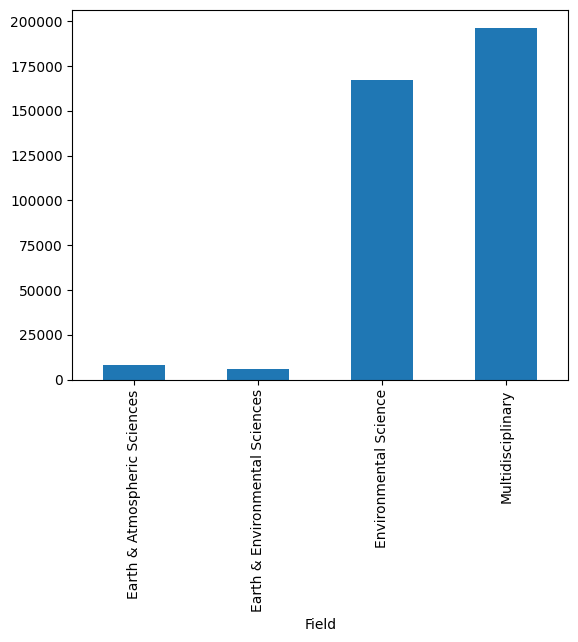

In [ ]:
journal_to_field = {
    "Nature Communications": "Multidisciplinary",
    "Nature Climate Change": "Environmental Science",
    "Nature": "Multidisciplinary",
    "npj Climate and Atmospheric Science": "Earth & Atmospheric Sciences",
    "Science Advances": "Multidisciplinary",
    "Communications Earth & Environment": "Earth & Environmental Sciences",
    "Science": "Multidisciplinary",
    "PNAS": "Multidisciplinary"
}

data_field = data_grouped[['DOI', 'Journal', 'ResearchRegion', 'Theme', 'Year Published', 'Citation', 'Altmetric']].drop_duplicates()
data_field["Field"] = data_field["Journal"].map(journal_to_field)
data_field.groupby("Field")["Citation"].sum().plot(kind="bar")

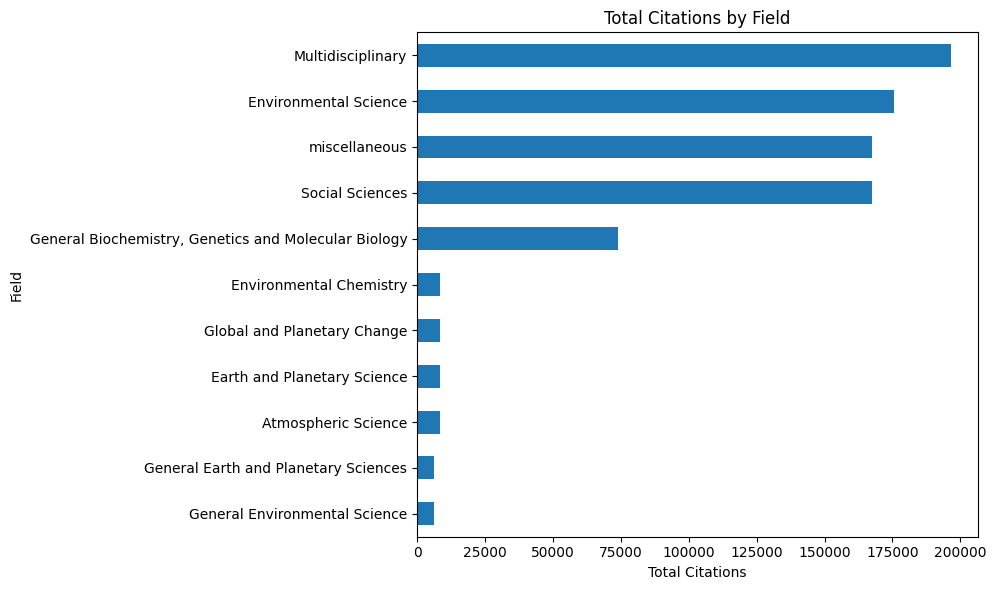

In [ ]:
# Manually define the Scopus field mapping from your provided data
journal_to_field = {
    "Nature": ["Multidisciplinary"],
    "Nature Climate Change": ["Social Sciences", "Environmental Science", "miscellaneous"],
    "Nature Communications": ["Multidisciplinary", "General Biochemistry, Genetics and Molecular Biology"],
    "Proceedings of the National Academy of Sciences of the United States": ["Multidisciplinary"],
    "Communications Earth & Environment": ["General Earth and Planetary Sciences", "General Environmental Science"],
    "Science": ["Multidisciplinary"],
    "Science Advances": ["Multidisciplinary"],
    "npj Climate and Atmospheric Science": ["Atmospheric Science", "Global and Planetary Change", "Environmental Chemistry", "Environmental Science", "Earth and Planetary Science"]
}

journal_field_df = pd.DataFrame([
    {"Journal": journal, "Field": field}
    for journal, fields in journal_to_field.items()
    for field in fields
])
# Clean journal names and merge
data_field = data_grouped[['DOI', 'Journal', 'ResearchRegion', 'Theme', 'Year Published', 'Citation', 'Altmetric']].drop_duplicates()
data_field["Journal"] = data_field["Journal"].str.strip()

# Merge to assign field(s)
data_field = data_field.merge(journal_field_df, on="Journal", how="left")

data_field.groupby("Field")["Citation"].sum().sort_values().plot(kind="barh", figsize=(10,6), title="Total Citations by Field")
plt.xlabel("Total Citations")
plt.tight_layout()
plt.show()


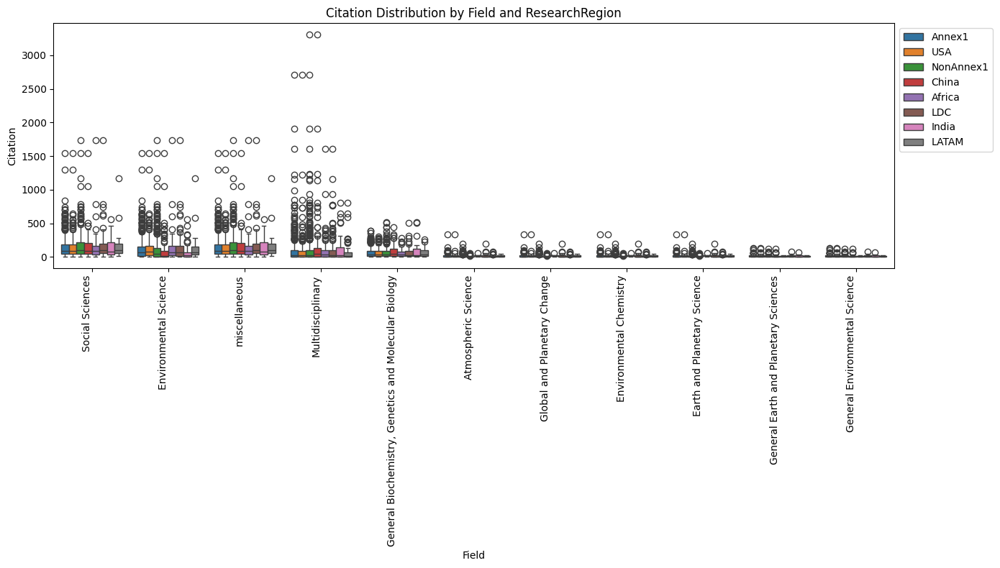

In [ ]:
# Filter outliers
data_field = data_field[~data_field['ResearchRegion'].isin(['Bangladesh', 'Sudan', 'DRC'])]

plt.figure(figsize=(14, 8))
sns.boxplot(data=data_field, x="Field", y="Citation", hue="ResearchRegion")
plt.title("Citation Distribution by Field and ResearchRegion")
plt.xticks(rotation=90, ha="right")
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

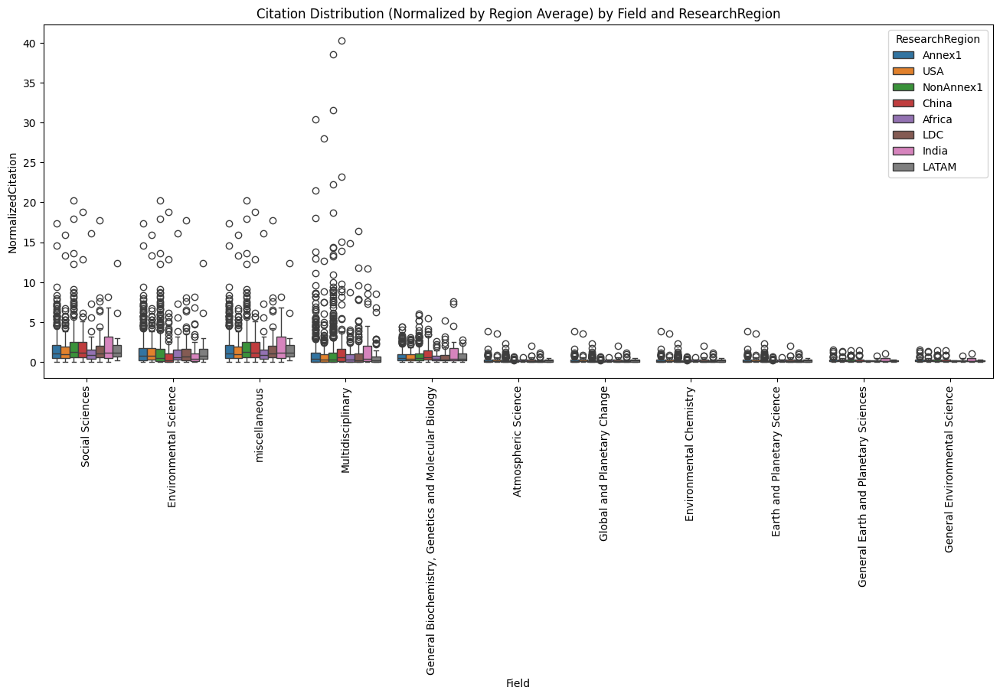

In [ ]:
region_avg = data_field.groupby("ResearchRegion")["Citation"].mean().rename("RegionAvgCitation")
data_field = data_field.merge(region_avg, on="ResearchRegion")
data_field["NormalizedCitation"] = data_field["Citation"] / data_field["RegionAvgCitation"]

plt.figure(figsize=(16, 6))
sns.boxplot(data=data_field, x="Field", y="NormalizedCitation", hue="ResearchRegion")
plt.title("Citation Distribution (Normalized by Region Average) by Field and ResearchRegion")
plt.xticks(rotation=90)
# plt.tight_layout()
plt.savefig("field_analysis_normalised_region.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

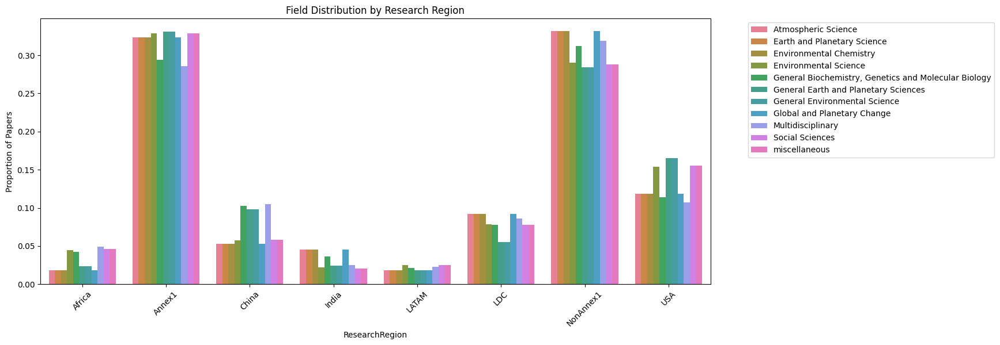

In [ ]:

# Count per region per field
data_field = data_field[~data_field['ResearchRegion'].isin(['Bangladesh', 'Sudan', 'DRC'])]
field_counts = data_field.groupby(["ResearchRegion", "Field"])['Citation'].sum().reset_index(name="count")

# Normalize within each ResearchRegion
field_counts["Proportion"] = field_counts.groupby("Field")["count"].transform(lambda x: x / x.sum())

plt.figure(figsize=(15,6))
sns.barplot(data=field_counts, x="ResearchRegion", y="Proportion", hue="Field")
plt.title("Field Distribution by Research Region")
plt.ylabel("Proportion of Papers")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.savefig("field_analysis_normalised_fieldavg.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()


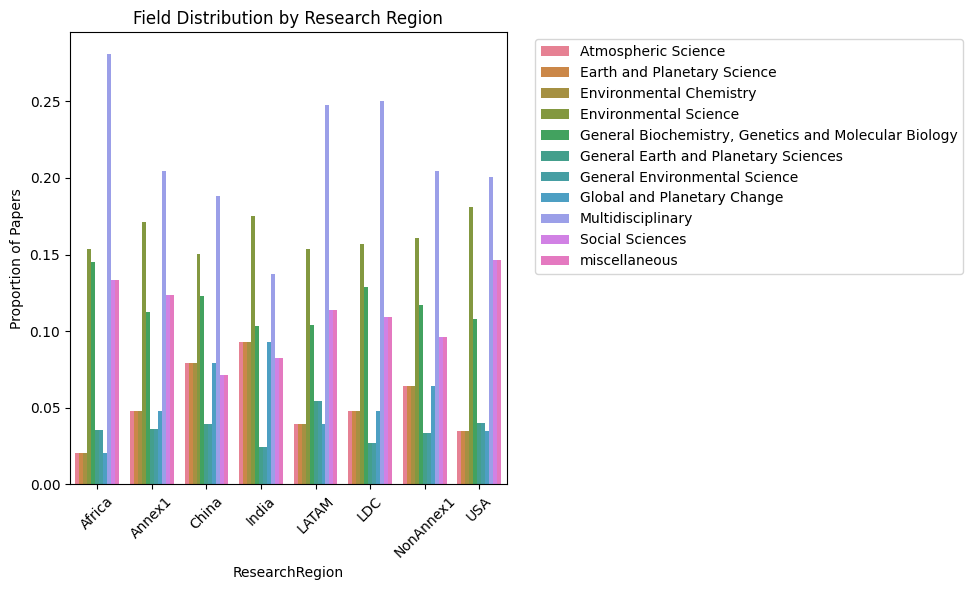

In [ ]:

# Count per region per field
field_counts = data_field.groupby(["ResearchRegion", "Field"]).size().reset_index(name="count")

# Normalize within each ResearchRegion
field_counts["Proportion"] = field_counts.groupby("ResearchRegion")["count"].transform(lambda x: x / x.sum())

plt.figure(figsize=(10,6))
sns.barplot(data=field_counts, x="ResearchRegion", y="Proportion", hue="Field")
plt.title("Field Distribution by Research Region")
plt.ylabel("Proportion of Papers")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


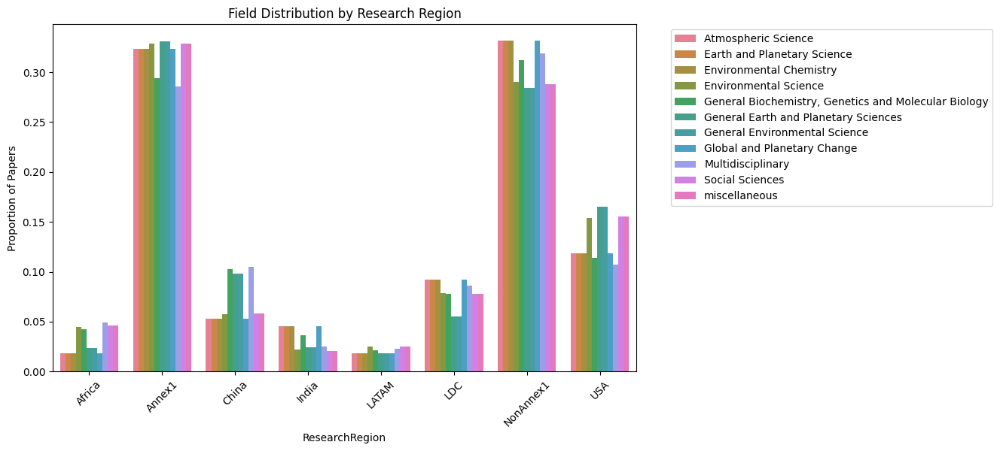

In [ ]:

# Count per region per field
field_counts = data_field.groupby(["ResearchRegion", "Field"])['Citation'].sum().reset_index(name="count")

# Normalize within each ResearchRegion
field_counts["Proportion"] = field_counts.groupby("Field")["count"].transform(lambda x: x / x.sum())

plt.figure(figsize=(10,6))
sns.barplot(data=field_counts, x="ResearchRegion", y="Proportion", hue="Field")
plt.title("Field Distribution by Research Region")
plt.ylabel("Proportion of Papers")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.show()


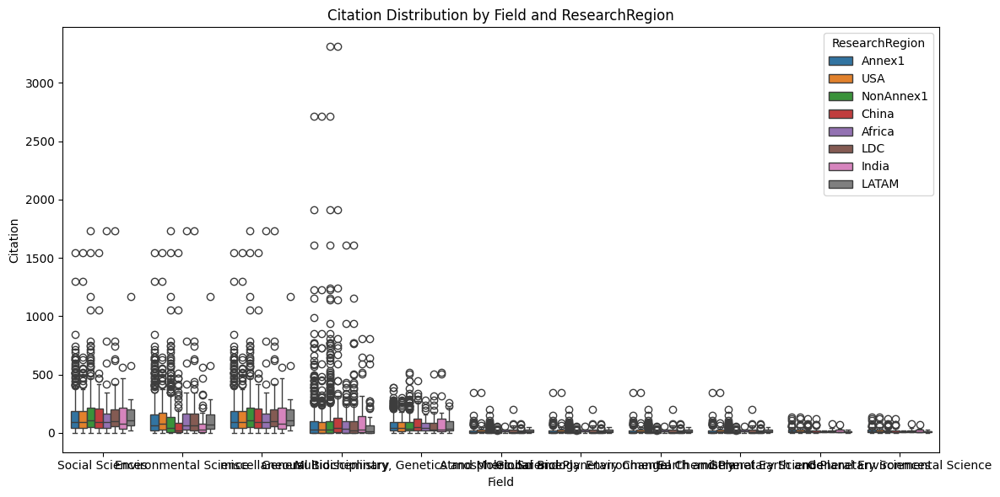

In [ ]:
# Citation distribution within field
data_field = data_field[~data_field['ResearchRegion'].isin(['Bangaldesh', 'Sudan', 'DRC'])]
plt.figure(figsize=(12, 6))
sns.boxplot(data=data_field, x="Field", y="Citation", hue="ResearchRegion")
plt.title("Citation Distribution by Field and ResearchRegion")
# plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
region_avg = data_field.groupby("ResearchRegion")["Citation"].mean().rename("RegionAvgCitation")
data_field = data_field.merge(region_avg, on="ResearchRegion")
data_field["NormalizedCitation"] = data_field["Citation"] / data_field["RegionAvgCitation"]

plt.figure(figsize=(14, 6))
sns.boxplot(data=data_field, x="Field", y="NormalizedCitation", hue="ResearchRegion")
plt.title("Citation Distribution (Normalized by Region Average) by Field and ResearchRegion")
# plt.xticks(rotation=45)
# plt.tight_layout()
plt.show()

KeyError: 'RegionAvgCitation'

In [ ]:
# Citation distribution within field
plt.figure(figsize=(12, 6))
sns.boxplot(data=data_field, x="ResearchRegion", y="Citation", hue="Field")
plt.title("Citation Distribution by Field and ResearchRegion")
# plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Thematic Analysis

In [ ]:
data_theme = data_grouped[['DOI', 'ResearchRegion', 'Theme', 'Year Published', 'Citation', 'Altmetric']].drop_duplicates()
data_theme

,DOI,ResearchRegion,Theme,Year Published,Citation,Altmetric
0,https://doi.org/10.1038/s41558-019-0468-y,Annex1,"['Climate Impact on Ecosystems', 'Scientific M...",2019,30.0,5.0
1,https://doi.org/10.1038/s41558-019-0468-y,USA,"['Climate Impact on Ecosystems', 'Scientific M...",2019,30.0,5.0
2,https://doi.org/10.1126/science.1222135,Annex1,Scientific Modeling & Predictions,2012,0.0,131.0
3,https://doi.org/10.1038/s41558-022-01520-4,Annex1,"['Scientific Modeling & Predictions', 'Climate...",2022,0.0,773.0
4,https://doi.org/10.1038/s41558-022-01520-4,NonAnnex1,"['Scientific Modeling & Predictions', 'Climate...",2022,0.0,773.0
...,...,...,...,...,...,...
3835,https://doi.org/10.1038/s41558-020-00963-x,NonAnnex1,"['Climate Impact on Ecosystems', 'Scientific M...",2021,87.0,452.0
3836,https://doi.org/10.1038/s41558-023-01746-w,Annex1,"['Human Health & Climate Change', 'Adaptation ...",2023,4.0,101.0
3837,https://doi.org/10.1038/s41558-023-01746-w,NonAnnex1,"['Human Health & Climate Change', 'Adaptation ...",2023,4.0,101.0
3838,https://doi.org/10.1038/s41612-019-0091-7,LDC,"['Scientific Modeling & Predictions', 'Climate...",2019,76.0,72.0


In [ ]:
# data_theme['Theme'] = data_theme['Theme_ModelExampleChange']
data_theme['Theme'] = data_theme['Theme'].apply(ensure_list)
data_theme['Theme_First'] = data_theme['Theme'].apply(lambda x: x[0])
data_theme['Theme_First'] = data_theme['Theme_First'].replace(theme_mapping)
data_theme = data_theme[data_theme['Theme_First'] != 'No Theme']
data_theme = data_theme.explode('Theme')
data_theme['Theme'] = data_theme['Theme'].replace(theme_mapping)
data_theme = data_theme[data_theme['Theme'] != 'No Theme']
data_theme = data_theme.drop_duplicates()
data_theme

,DOI,ResearchRegion,Theme,Year Published,Citation,Altmetric,Theme_First
0,https://doi.org/10.1038/s41558-019-0468-y,Annex1,Impacts on Earth Systems,2019,30.0,5.0,Impacts on Earth Systems
0,https://doi.org/10.1038/s41558-019-0468-y,Annex1,"Scientific data, models, and prediction",2019,30.0,5.0,Impacts on Earth Systems
1,https://doi.org/10.1038/s41558-019-0468-y,USA,Impacts on Earth Systems,2019,30.0,5.0,Impacts on Earth Systems
1,https://doi.org/10.1038/s41558-019-0468-y,USA,"Scientific data, models, and prediction",2019,30.0,5.0,Impacts on Earth Systems
2,https://doi.org/10.1126/science.1222135,Annex1,"Scientific data, models, and prediction",2012,0.0,131.0,"Scientific data, models, and prediction"
...,...,...,...,...,...,...,...
3837,https://doi.org/10.1038/s41558-023-01746-w,NonAnnex1,Adaptation & Resilience,2023,4.0,101.0,Human Health & Climate Change
3838,https://doi.org/10.1038/s41612-019-0091-7,LDC,"Scientific data, models, and prediction",2019,76.0,72.0,"Scientific data, models, and prediction"
3838,https://doi.org/10.1038/s41612-019-0091-7,LDC,Impacts on Earth Systems,2019,76.0,72.0,"Scientific data, models, and prediction"
3839,https://doi.org/10.1038/s41612-019-0091-7,NonAnnex1,"Scientific data, models, and prediction",2019,76.0,72.0,"Scientific data, models, and prediction"


In [ ]:
data_theme[data_theme['ResearchRegion'] == 'LATAM']

,DOI,ResearchRegion,Theme,Year Published,Citation,Altmetric,Theme_First
30,https://doi.org/10.1038/s41586-020-2780-0,LATAM,"Scientific data, models, and prediction",2020,807.0,1838.0,"Scientific data, models, and prediction"
30,https://doi.org/10.1038/s41586-020-2780-0,LATAM,Impacts on Earth Systems,2020,807.0,1838.0,"Scientific data, models, and prediction"
50,https://doi.org/10.1038/s41612-023-00409-z,LATAM,Impacts on Earth Systems,2023,3.0,41.0,Impacts on Earth Systems
50,https://doi.org/10.1038/s41612-023-00409-z,LATAM,"Scientific data, models, and prediction",2023,3.0,41.0,Impacts on Earth Systems
114,https://doi.org/10.1038/s41467-021-21871-4,LATAM,Impacts on Earth Systems,2021,16.0,45.0,Impacts on Earth Systems
...,...,...,...,...,...,...,...
3651,https://doi.org/10.1126/sciadv.1602602,LATAM,Economic & Policy Implications,2017,0.0,34.0,Impacts on Earth Systems
3698,https://doi.org/10.1038/s43247-023-00828-z,LATAM,Mitigation Strategies,2023,11.0,32.0,Mitigation Strategies
3719,https://doi.org/10.1038/nclimate1453,LATAM,Impacts on Earth Systems,2012,146.0,35.0,Impacts on Earth Systems
3719,https://doi.org/10.1038/nclimate1453,LATAM,Adaptation & Resilience,2012,146.0,35.0,Impacts on Earth Systems


In [ ]:
# data_theme = data_theme[~(data_theme['Theme'].isin(['Climate Change Impacts on Ecosystems', 'Climate Change Ecology', \
# 'Climate Change/Climate Change Impacts', 'Climate Change Mitigation', 'Climate Change Adaptation', 'Climate-change policy']))]

In [ ]:
theme_counts = data_theme.groupby('Theme')['DOI'].nunique().sort_values(ascending=False).reset_index().rename(columns={'DOI': 'NumPapers'})
theme_counts

#
# Theme	NumPapers
# 0	Impacts on Earth Systems	1059
# 1	Scientific data, models, and prediction	645
# 2	Adaptation & Resilience	306
# 3	Mitigation Strategies	282
# 4	Economic & Policy Implications	255
# 5	Human Health & Climate Change	174
# 6	Climate Justice & Equity	77
# 7	Public Perception & Communication	52


,Theme,NumPapers
0,Impacts on Earth Systems,1132
1,"Scientific data, models, and prediction",679
2,Adaptation & Resilience,317
3,Mitigation Strategies,286
4,Economic & Policy Implications,259
5,Human Health & Climate Change,175
6,Climate Justice & Equity,75
7,Public Perception & Communication,52


In [ ]:
data_theme['DOI'].nunique()

1860

In [ ]:
theme_counts_new = data_theme.groupby('Theme')['DOI'].nunique().sort_values(ascending=False).reset_index().rename(columns={'DOI': 'NumPapers'})
theme_counts_new['Percentage'] = theme_counts_new['NumPapers'] * 100 / 1791
theme_counts_new[['Theme', 'Percentage']]

,Theme,Percentage
0,Impacts on Earth Systems,63.204913
1,"Scientific data, models, and prediction",37.911781
2,Adaptation & Resilience,17.699609
3,Mitigation Strategies,15.968733
4,Economic & Policy Implications,14.461195
5,Human Health & Climate Change,9.771078
6,Climate Justice & Equity,4.187605
7,Public Perception & Communication,2.903406


/tmp/ipython-input-4127453788.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


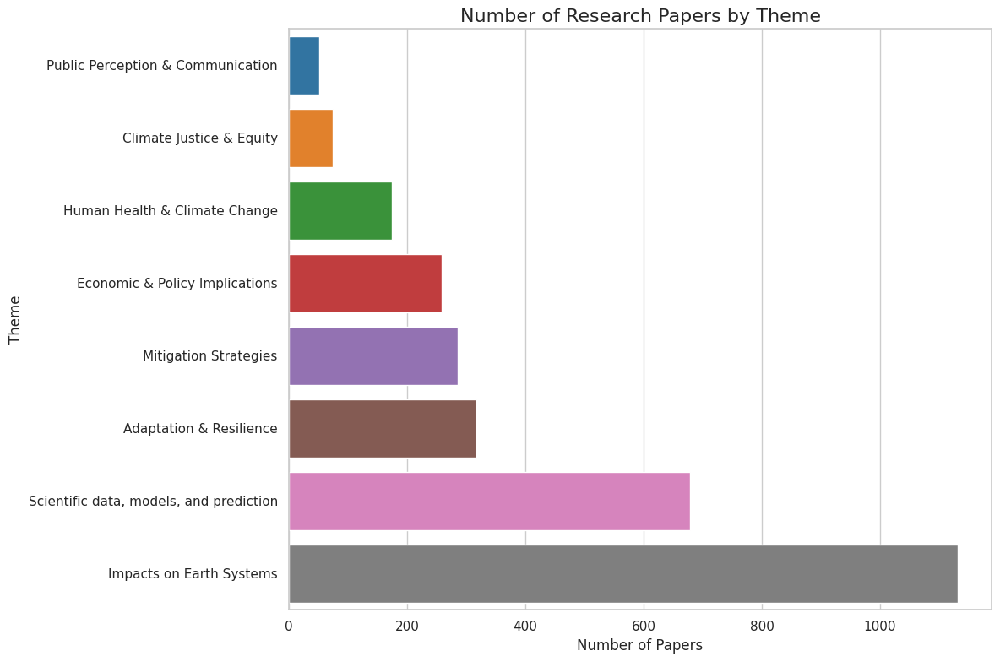

In [ ]:
# Set Seaborn style
sns.set(style="whitegrid")

# Sort the themes in descending order
theme_counts = theme_counts.sort_values(by='NumPapers', ascending=True)  # ascending=True for horizontal bars

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(
    data=theme_counts,
    x='NumPapers',
    y='Theme',
    palette='tab10'  # You can change the color palette to 'mako', 'Blues', etc.
)

plt.title('Number of Research Papers by Theme', fontsize=16)
plt.xlabel('Number of Papers')
plt.ylabel('Theme')
plt.tight_layout()
# plt.savefig("modelexamplechange_allthemes_papers_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

['Impacts on Earth Systems', 'Scientific data, models, and prediction', 'Adaptation & Resilience', 'Mitigation Strategies', 'Economic & Policy Implications', 'Human Health & Climate Change', 'Climate Justice & Equity', 'Public Perception & Communication']


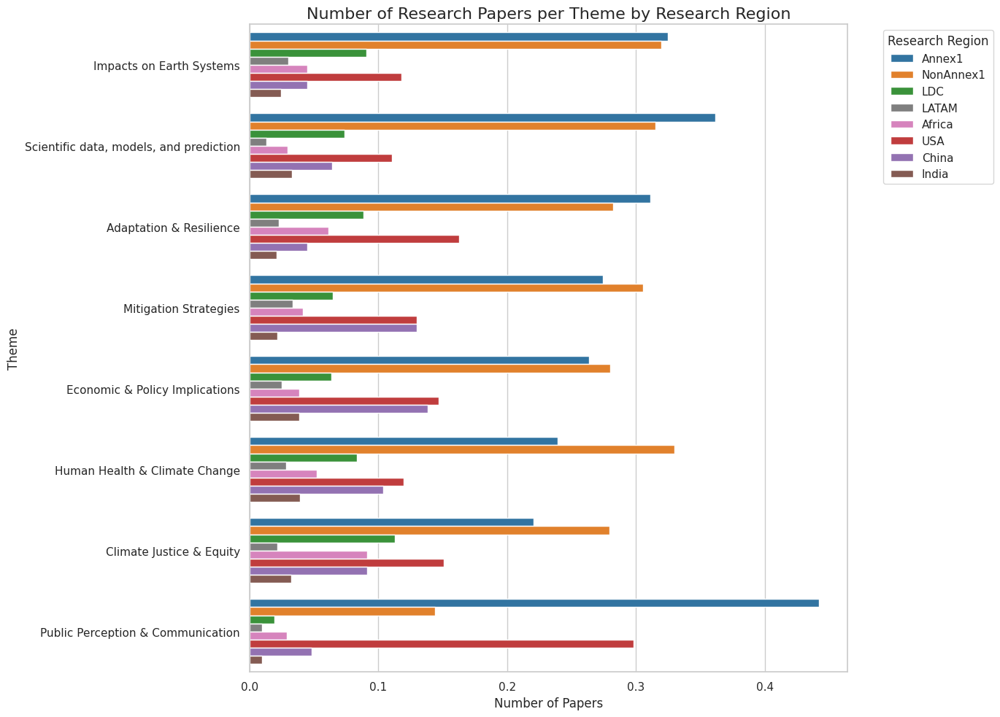

In [ ]:
# Now count unique DOIs per (Theme, ResearchRegion)
theme_region_counts = (
    data_theme.groupby(['Theme', 'ResearchRegion'])['DOI']
    .nunique()
    .reset_index(name='NumPapers')
)

theme_totals = (
    theme_region_counts
    .groupby('Theme')['NumPapers']
    .sum()
    .reset_index(name='TotalPapers')
)

theme_region_normalized = pd.merge(theme_region_counts, theme_totals, on='Theme')

# Step 4: Calculate proportion per region within theme
theme_region_normalized['Proportion'] = theme_region_normalized['NumPapers'] / theme_region_normalized['TotalPapers']


theme_order = (theme_region_counts
               .groupby('Theme')['NumPapers']
               .sum()
               .sort_values(ascending=False)
               .index.tolist())

region_order = ['Annex1', 'NonAnnex1', 'LDC', 'LATAM', 'Africa', 'USA', 'China', 'India']

print(theme_order)

plt.figure(figsize=(14, 10))
sns.set(style="whitegrid")

# Make the horizontal grouped bar plot
sns.barplot(
    # data=theme_region_counts,
    data=theme_region_normalized,
    y='Theme',
    x = 'Proportion',
    # x='NumPapers',
    hue='ResearchRegion',
    order=theme_order,
    hue_order=region_order,
    palette=region_palette
)

plt.title("Number of Research Papers per Theme by Research Region", fontsize=16)
plt.ylabel("Theme")
plt.xlabel("Number of Papers")
plt.legend(title='Research Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("normalized_allthemes_region_distri_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

['Impacts on Earth Systems', 'Scientific data, models, and prediction', 'Adaptation & Resilience', 'Mitigation Strategies', 'Economic & Policy Implications', 'Human Health & Climate Change', 'Climate Justice & Equity', 'Public Perception & Communication']


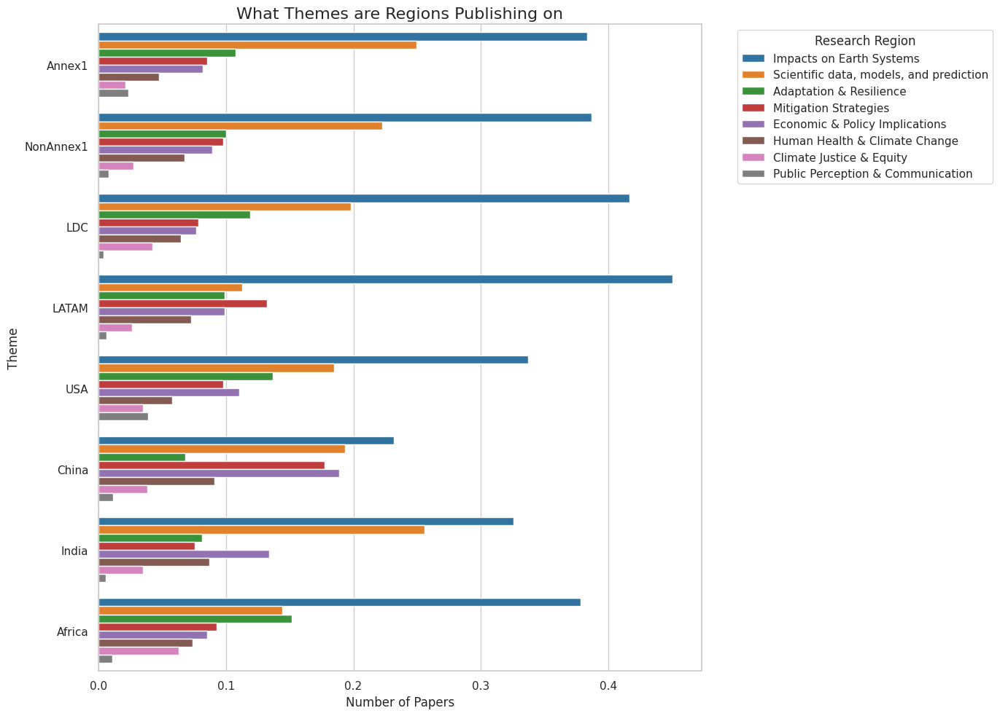

In [ ]:
# Now count unique DOIs per (Theme, ResearchRegion)
theme_region_counts = (
    data_theme.groupby(['Theme', 'ResearchRegion'])['DOI']
    .nunique()
    .reset_index(name='NumPapers')
)

# Step 2: Get total papers per ResearchRegion
region_totals = (
    theme_region_counts
    .groupby('ResearchRegion')['NumPapers']
    .sum()
    .reset_index(name='TotalPapers')

)

# Step 3: Merge totals back into the original dataframe
theme_region_normalized = pd.merge(theme_region_counts, region_totals, on='ResearchRegion')

# Step 4: Normalize to get proportion of papers for each theme *within* each region
theme_region_normalized['Proportion'] = theme_region_normalized['NumPapers'] / theme_region_normalized['TotalPapers']


theme_order = (theme_region_counts
               .groupby('Theme')['NumPapers']
               .sum()
               .sort_values(ascending=False)
               .index.tolist())

region_order = ['Annex1', 'NonAnnex1', 'LDC', 'LATAM', 'USA', 'China', 'India', 'Africa']

print(theme_order)

plt.figure(figsize=(14, 10))
sns.set(style="whitegrid")

# Make the horizontal grouped bar plot
sns.barplot(
    # data=theme_region_counts,
    data=theme_region_normalized,
    y='ResearchRegion',
    # x='NumPapers',
    x='Proportion',
    hue='Theme',
    order=region_order,
    hue_order=theme_order,
    palette='tab10'
)

plt.title("What Themes are Regions Publishing on", fontsize=16)
plt.ylabel("Theme")
plt.xlabel("Number of Papers")
plt.legend(title='Research Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("normalized_allthemes_theme_distri_per_region.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
theme_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

annex1_data = data_theme[data_theme['ResearchRegion'] == 'Annex1']
themes = list(annex1_data['Theme'].unique())

for theme in theme_order:
  counts = annex1_data[annex1_data['Theme'] == theme].groupby('Year Published')['DOI'].nunique()
  line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=1.5, label=theme)
  theme_handles.append(line)

years = sorted(annex1_data['Year Published'].unique())
theme_legend = ax.legend(handles=theme_handles, loc='upper left', title='Themes', fontsize=11)
plt.title('Distribution of Themes over the years for Annex-1 Countries')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications in Theme', fontsize=11)
plt.xticks(years)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("allthemes_themes_over_years_annex1.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
theme_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

non_annex1_data = data_theme[data_theme['ResearchRegion'] == 'NonAnnex1']
themes = list(non_annex1_data['Theme'].unique())

for theme in theme_order:
  counts = non_annex1_data[non_annex1_data['Theme'] == theme].groupby('Year Published')['DOI'].nunique()
  line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=1.5, label=theme)
  theme_handles.append(line)
  print()

years = sorted(non_annex1_data['Year Published'].unique())
theme_legend = ax.legend(handles=theme_handles, loc='upper left', title='Themes', fontsize=11)
plt.title('Distribution of Themes over the years for NonAnnex-1 Countries')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications in Theme', fontsize=11)
plt.xticks(years)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("allthemes_themes_over_years_nonannex1.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
theme_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

annex1_data = data_theme[data_theme['ResearchRegion'] == 'LDC']
themes = list(annex1_data['Theme'].unique())

for theme in theme_order:
  counts = annex1_data[annex1_data['Theme'] == theme].groupby('Year Published')['DOI'].nunique()
  line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=1.5, label=theme)
  theme_handles.append(line)

years = sorted(annex1_data['Year Published'].unique())
theme_legend = ax.legend(handles=theme_handles, loc='upper left', title='Themes', fontsize=11)
plt.title('Distribution of Themes over the years for LDC Countries')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications in Theme', fontsize=11)
plt.xticks(years)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("allthemes_themes_over_years_ldc.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
theme_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

annex1_data = data_theme[data_theme['ResearchRegion'] == 'Africa']
themes = list(annex1_data['Theme'].unique())

for theme in theme_order:
  counts = annex1_data[annex1_data['Theme'] == theme].groupby('Year Published')['DOI'].nunique()
  line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=1.5, label=theme)
  theme_handles.append(line)

years = sorted(annex1_data['Year Published'].unique())
theme_legend = ax.legend(handles=theme_handles, loc='upper left', title='Themes', fontsize=11)
plt.title('Distribution of Themes over the years for African Countries')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications in Theme', fontsize=11)
plt.xticks(years)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("allthemes_themes_over_years_africa.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
theme_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

annex1_data = data_theme[data_theme['ResearchRegion'] == 'LATAM']
themes = list(annex1_data['Theme'].unique())

for theme in theme_order:
  counts = annex1_data[annex1_data['Theme'] == theme].groupby('Year Published')['DOI'].nunique()
  line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=1.5, label=theme)
  theme_handles.append(line)

years = sorted(annex1_data['Year Published'].unique())
theme_legend = ax.legend(handles=theme_handles, loc='upper left', title='Themes', fontsize=11)
plt.title('Distribution of Themes over the years for LATAM Countries')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications in Theme', fontsize=11)
plt.xticks(years)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("allthemes_themes_over_years_latam.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
data_theme_citation = data_theme[['DOI', 'Theme', 'Citation']].drop_duplicates()
citation_per_theme = data_theme_citation.groupby('Theme')['Citation'].sum().sort_values(ascending=False)

# Plot
plt.figure(figsize=(8, 7))
plt.bar(citation_per_theme.index, citation_per_theme.values)
plt.xticks(rotation=90)
plt.xlabel('Theme')
plt.ylabel('Total Citations')
plt.title('Total Citations per Theme')
plt.tight_layout()
plt.savefig("allthemes_citations_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
data_theme_citation = data_theme[['DOI', 'Theme', 'Citation']].drop_duplicates()
citation_per_theme = data_theme_citation.groupby('Theme')['Citation'].sum() / \
                     data_theme_citation.groupby('Theme')['Citation'].count()
citation_per_theme = citation_per_theme.sort_values(ascending=False)

# Plot
plt.figure(figsize=(8, 7))
plt.bar(citation_per_theme.index, citation_per_theme.values)
plt.xticks(rotation=90)
plt.xlabel('Theme')
plt.ylabel('Normalized Citations')
plt.title('Normalized Citations per Theme')
plt.tight_layout()
plt.savefig("allthemes_normalized_citations_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
data_theme_altmetric = data_theme[['DOI', 'Theme', 'Altmetric']].drop_duplicates()
altmetric_per_theme = data_theme_altmetric.groupby('Theme')['Altmetric'].sum()
altmetric_per_theme = altmetric_per_theme.sort_values(ascending=False)

# Plot
plt.figure(figsize=(8, 7))
plt.bar(altmetric_per_theme.index, altmetric_per_theme.values)
plt.xticks(rotation=90)
plt.xlabel('Theme')
plt.ylabel('Total Altmetrics')
plt.title('Total Altmetrics per Theme')
plt.tight_layout()
plt.savefig("allthemes_altmetrics_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# Count per region per field
data_theme_citation = data_theme[['ResearchRegion', 'Theme']].drop_duplicates()
theme_citation_counts = data_theme_citation.groupby(["ResearchRegion", "Theme"]).size().reset_index(name="count")

# Normalize within each ResearchRegion
theme_citation_counts["Proportion"] = theme_citation_counts.groupby("ResearchRegion")["count"].transform(lambda x: x / x.sum())

plt.figure(figsize=(10,6))
sns.barplot(data=theme_citation_counts, x="ResearchRegion", y="Proportion", hue="Theme")
plt.title("Theme Distribution by Research Region")
plt.ylabel("Proportion of Papers")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.show()


In [ ]:
order = ['Public Perception & Communication',  'Impacts on Earth Systems', ]

/tmp/ipython-input-1931802099.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


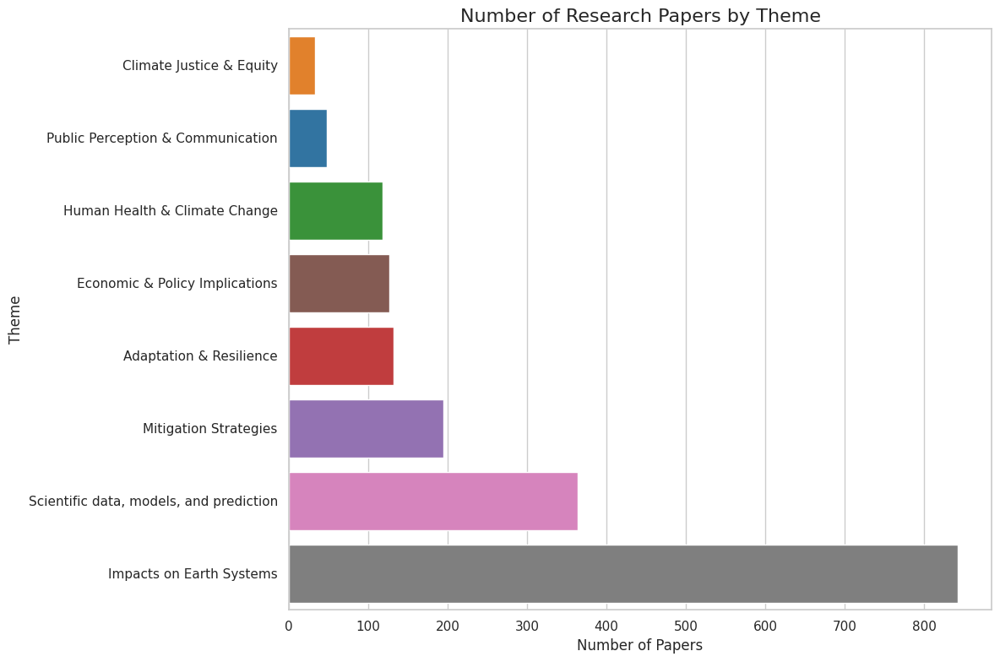

In [ ]:
unique_theme_counts = data_theme.groupby('Theme_First')['DOI'].nunique().sort_values(ascending=False).reset_index().rename(columns={'DOI': 'NumPapers'})

# Set Seaborn style
sns.set(style="whitegrid")
tab10 = plt.get_cmap('tab10').colors

custom_order = [1, 0, 2, 5, 3, 4, 6, 7]
custom_palette = [tab10[i] for i in custom_order]

# Sort the themes in descending order
unique_theme_counts = unique_theme_counts.sort_values(by='NumPapers', ascending=True)  # ascending=True for horizontal bars

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(
    data=unique_theme_counts,
    x='NumPapers',
    y='Theme_First',
    palette=custom_palette  # You can change the color palette to 'mako', 'Blues', etc.
)

plt.title('Number of Research Papers by Theme', fontsize=16)
plt.xlabel('Number of Papers')
plt.ylabel('Theme')
plt.tight_layout()
# plt.savefig("1theme_papers_per_theme.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
region_values = {}
region_values['USA'] = []
region_values['LDC'] = []

year_values = {}
year_values['2021'] = []
year_values['2022'] = []
year_values['2023'] = []

for year in ['2021', '2022', '2023']:
  data_theme_ldc_usa = data_theme[data_theme['Year Published'] == year]
  data_theme_ldc = data_theme_ldc_usa[data_theme_ldc_usa['ResearchRegion'] == 'LDC']
  data_theme_usa = data_theme_ldc_usa[data_theme_ldc_usa['ResearchRegion'] == 'USA']

  ldc_distri = data_theme_ldc.groupby('Theme_First')['DOI'].nunique().sort_values(ascending=False)
  usa_distri = data_theme_usa.groupby('Theme_First')['DOI'].nunique().sort_values(ascending=False)
  ldc_usa_distri = pd.concat([ldc_distri, usa_distri], axis=1)
  ldc_usa_distri.columns = ['LDC', 'USA']  # Give clear names
  ldc_usa_distri = ldc_usa_distri.sort_index()
  ldc_usa_distri['LDC'] = ldc_usa_distri['LDC'].fillna(0)

  region_values['USA'].append(ldc_usa_distri['USA'].values)
  region_values['LDC'].append(ldc_usa_distri['LDC'].values)

  year_values[year].append(ldc_usa_distri['USA'].values)
  year_values[year].append(ldc_usa_distri['LDC'].values)

In [ ]:
year_values

{'2021': [array([ 4,  3,  4,  3, 24,  5,  1,  9]),
  array([ 2.,  3.,  0.,  4., 18.,  3.,  1.,  4.])],
 '2022': [array([ 4,  6,  5,  1, 24,  8,  2, 11]),
  array([ 5.,  0.,  1.,  4., 18.,  3.,  0.,  7.])],
 '2023': [array([ 9,  6, 13,  7, 28, 10,  4, 12]),
  array([ 5.,  0.,  2.,  6., 26.,  4.,  0., 16.])]}

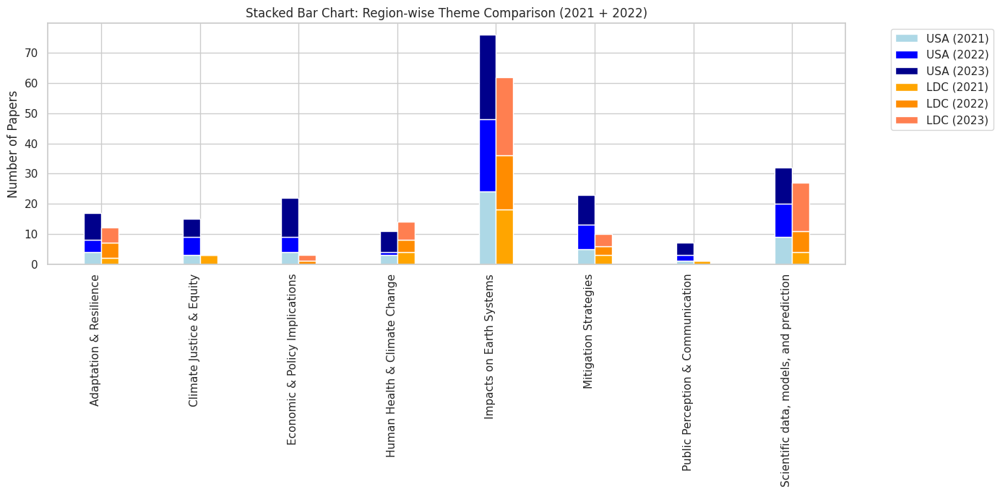

In [ ]:
themes = ldc_usa_distri.index.to_list()
regions = ['USA', 'LDC']

x = np.arange(len(themes))  # for each theme
width = 0.35 / len(regions)  # bar width per region per group

fig, ax = plt.subplots(figsize=(14, 7))

colors = {
    'USA_2021': 'lightblue',
    'USA_2022': 'blue',
    'USA_2023': 'darkblue',
    'LDC_2021': 'orange',
    'LDC_2022': 'darkorange',
    'LDC_2023': 'coral'
}

# Loop through each region to create bars for each
for i, region in enumerate(regions):
    values_2021 = region_values[region][0]
    values_2022 = region_values[region][1]
    values_2023 = region_values[region][2]

    # Offset each region within each theme group
    xpos = x + i * width

    ax.bar(xpos, values_2021, width=width, label=f'{region} (2021)', color=colors[f'{region}_2021'])
    ax.bar(xpos, values_2022, width=width, bottom=values_2021, label=f'{region} (2022)', color=colors[f'{region}_2022'])
    ax.bar(xpos, values_2023, width=width, bottom=values_2021 + values_2022, label=f'{region} (2023)', color=colors[f'{region}_2023'])

# X-axis setup
group_width = width * len(regions)
ax.set_xticks(x + group_width / 2 - width / 2)
ax.set_xticklabels(themes, rotation=90, ha='right')

ax.set_ylabel("Number of Papers")
ax.set_title("Stacked Bar Chart: Region-wise Theme Comparison (2021 + 2022)")
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

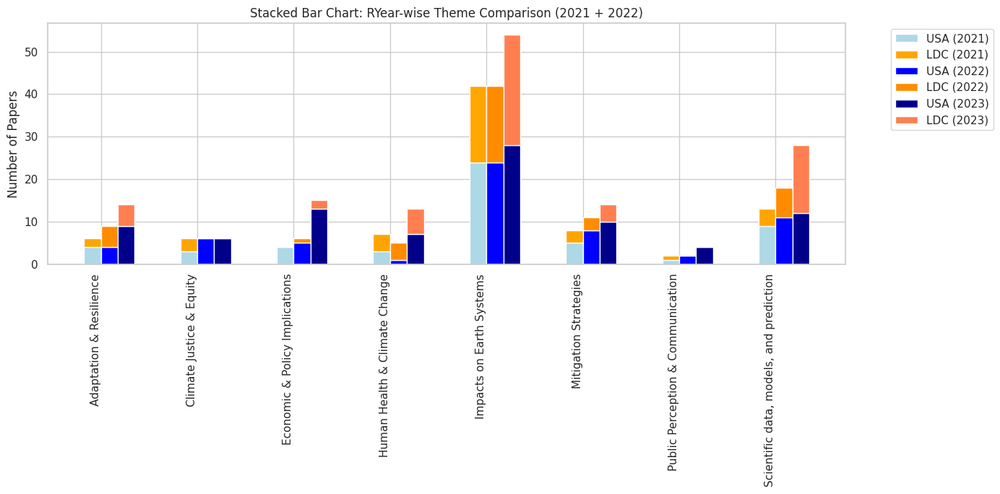

In [ ]:
themes = ldc_usa_distri.index.to_list()
regions = ['USA', 'LDC']

x = np.arange(len(themes))  # for each theme
width = 0.35 / len(regions)  # bar width per region per group

fig, ax = plt.subplots(figsize=(14, 7))

colors = {
    'USA_2021': 'lightblue',
    'USA_2022': 'blue',
    'USA_2023': 'darkblue',
    'LDC_2021': 'orange',
    'LDC_2022': 'darkorange',
    'LDC_2023': 'coral'
}

# Loop through each region to create bars for each
for i, year in enumerate(['2021', '2022', '2023']):
    # values_2021 = region_values[region][0]
    # values_2022 = region_values[region][1]
    # values_2023 = region_values[region][2]
    values_usa = year_values[year][0]
    values_ldc = year_values[year][1]

    # Offset each region within each theme group
    xpos = x + i * width

    ax.bar(xpos, values_usa, width=width, label=f'USA ({year})', color=colors[f'USA_{year}'])
    ax.bar(xpos, values_ldc, width=width, bottom=values_usa, label=f'LDC ({year})', color=colors[f'LDC_{year}'])

# X-axis setup
group_width = width * len(regions)
ax.set_xticks(x + group_width / 2 - width / 2)
ax.set_xticklabels(themes, rotation=90, ha='right')

ax.set_ylabel("Number of Papers")
ax.set_title("Stacked Bar Chart: RYear-wise Theme Comparison (2021 + 2022)")
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
usa_year_diff  = year_values['2022'][0] - year_values['2021'][0]
ldc_year_diff  = year_values['2022'][1] - year_values['2021'][1]
usa_year_diff

array([ 0,  3,  1, -2,  0,  3,  1,  2])

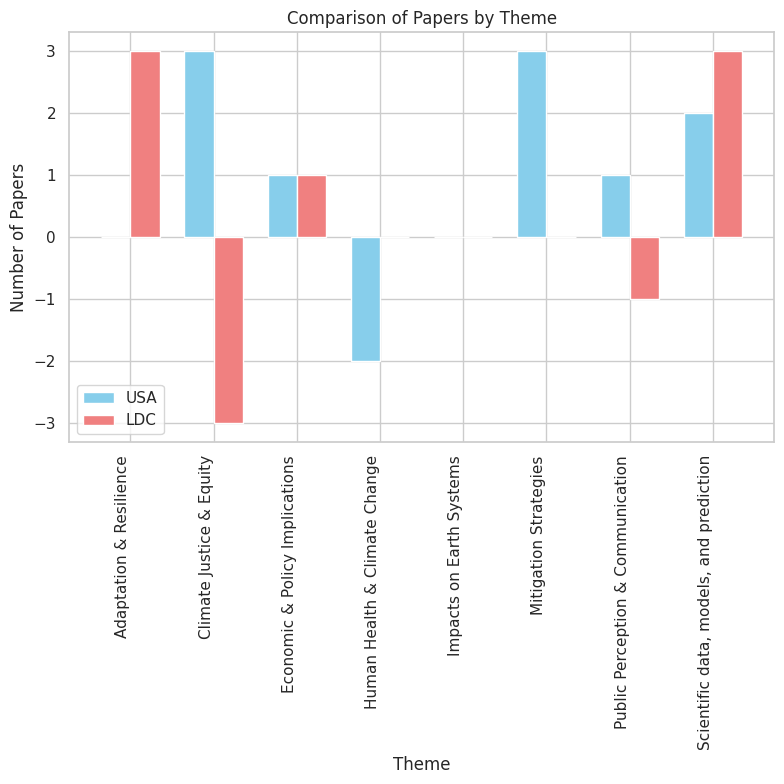

In [ ]:
# Settings
x = np.arange(len(ldc_usa_distri))  # one spot for each theme
width = 0.35  # width of each bar

fig, ax = plt.subplots(figsize=(8, 8))
ax.bar(x - width/2, usa_year_diff, width, label='USA', color='skyblue')
ax.bar(x + width/2, ldc_year_diff, width, label='LDC', color='lightcoral')

# Labels and title
ax.set_xlabel('Theme')
ax.set_ylabel('Number of Papers')
ax.set_title('Comparison of Papers by Theme')
ax.set_xticks(x)
ax.set_xticklabels(ldc_usa_distri.index, rotation=90, ha='right')
ax.legend()

plt.tight_layout()
# plt.savefig("1theme_LDC_vs_USA_themes_diff.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()


In [ ]:
region_values = {}
region_values['USA'] = []
region_values['LDC'] = []

year_values = {}
year_values['2021'] = []
year_values['2022'] = []
year_values['2023'] = []

for year in ['2021', '2022', '2023']:
  data_theme_ldc_usa = data_theme[data_theme['Year Published'] == year]
  data_theme_ldc = data_theme_ldc_usa[data_theme_ldc_usa['ResearchRegion'] == 'LDC']
  data_theme_usa = data_theme_ldc_usa[data_theme_ldc_usa['ResearchRegion'] == 'USA']

  ldc_distri = data_theme_ldc.groupby('Theme_First')['Altmetric'].sum().sort_values(ascending=False)
  usa_distri = data_theme_usa.groupby('Theme_First')['Altmetric'].sum().sort_values(ascending=False)
  ldc_usa_distri = pd.concat([ldc_distri, usa_distri], axis=1)
  ldc_usa_distri.columns = ['LDC', 'USA']  # Give clear names
  ldc_usa_distri = ldc_usa_distri.sort_index()
  ldc_usa_distri['LDC'] = ldc_usa_distri['LDC'].fillna(0)

  region_values['USA'].append(ldc_usa_distri['USA'].values)
  region_values['LDC'].append(ldc_usa_distri['LDC'].values)

  year_values[year].append(ldc_usa_distri['USA'].values)
  year_values[year].append(ldc_usa_distri['LDC'].values)

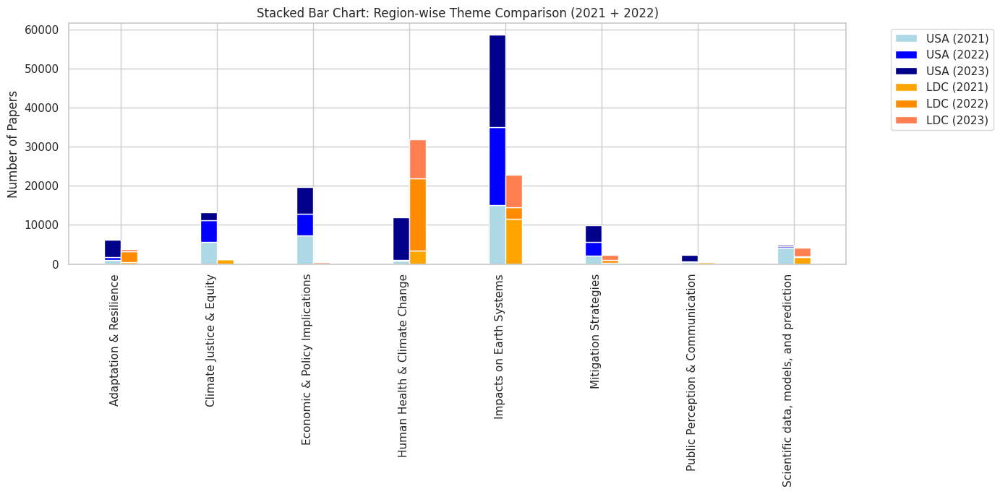

In [ ]:
themes = ldc_usa_distri.index.to_list()
regions = ['USA', 'LDC']

x = np.arange(len(themes))  # for each theme
width = 0.35 / len(regions)  # bar width per region per group

fig, ax = plt.subplots(figsize=(14, 7))

colors = {
    'USA_2021': 'lightblue',
    'USA_2022': 'blue',
    'USA_2023': 'darkblue',
    'LDC_2021': 'orange',
    'LDC_2022': 'darkorange',
    'LDC_2023': 'coral'
}

# Loop through each region to create bars for each
for i, region in enumerate(regions):
    values_2021 = region_values[region][0]
    values_2022 = region_values[region][1]
    values_2023 = region_values[region][2]

    # Offset each region within each theme group
    xpos = x + i * width

    ax.bar(xpos, values_2021, width=width, label=f'{region} (2021)', color=colors[f'{region}_2021'])
    ax.bar(xpos, values_2022, width=width, bottom=values_2021, label=f'{region} (2022)', color=colors[f'{region}_2022'])
    ax.bar(xpos, values_2023, width=width, bottom=values_2021 + values_2022, label=f'{region} (2023)', color=colors[f'{region}_2023'])

# X-axis setup
group_width = width * len(regions)
ax.set_xticks(x + group_width / 2 - width / 2)
ax.set_xticklabels(themes, rotation=90, ha='right')

ax.set_ylabel("Number of Papers")
ax.set_title("Stacked Bar Chart: Region-wise Theme Comparison (2021 + 2022)")
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

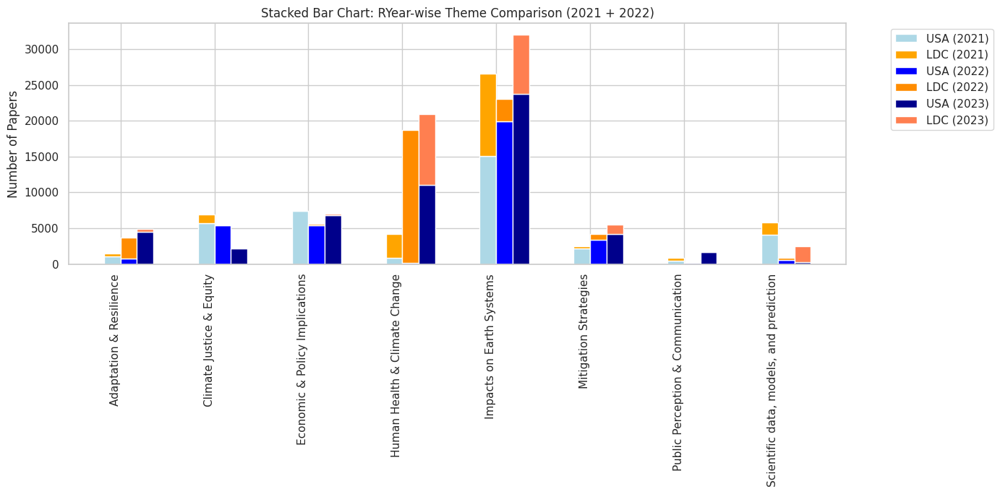

In [ ]:
themes = ldc_usa_distri.index.to_list()
regions = ['USA', 'LDC']

x = np.arange(len(themes))  # for each theme
width = 0.35 / len(regions)  # bar width per region per group

fig, ax = plt.subplots(figsize=(14, 7))

colors = {
    'USA_2021': 'lightblue',
    'USA_2022': 'blue',
    'USA_2023': 'darkblue',
    'LDC_2021': 'orange',
    'LDC_2022': 'darkorange',
    'LDC_2023': 'coral'
}

# Loop through each region to create bars for each
for i, year in enumerate(['2021', '2022', '2023']):
    # values_2021 = region_values[region][0]
    # values_2022 = region_values[region][1]
    # values_2023 = region_values[region][2]
    values_usa = year_values[year][0]
    values_ldc = year_values[year][1]

    # Offset each region within each theme group
    xpos = x + i * width

    ax.bar(xpos, values_usa, width=width, label=f'USA ({year})', color=colors[f'USA_{year}'])
    ax.bar(xpos, values_ldc, width=width, bottom=values_usa, label=f'LDC ({year})', color=colors[f'LDC_{year}'])

# X-axis setup
group_width = width * len(regions)
ax.set_xticks(x + group_width / 2 - width / 2)
ax.set_xticklabels(themes, rotation=90, ha='right')

ax.set_ylabel("Number of Papers")
ax.set_title("Stacked Bar Chart: RYear-wise Theme Comparison (2021 + 2022)")
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
# freq_df = data_grouped.copy()
# freq_df = freq_df.explode('Regions_updated')
# freq_df = freq_df[freq_df['Regions_updated'].isin(country_check_list_lower)]
# freq_df = freq_df.groupby('Regions_updated')['DOI'].count().reset_index()
# freq_df = freq_df.sort_values('DOI', ascending=False)
# freq_df.columns = ['Regions', 'Overall Occurrences across Data']
# freq_df.to_csv('freq_region_analysis_4Dec.csv', index=False)

# Publication Analysis

In [ ]:
data_grouped[data_grouped['DOI'] == 'https://doi.org/10.1126/sciadv.abq2616'][['DOI', 'Regions_updated', 'ResearchRegion']]

,DOI,Regions_updated,ResearchRegion
1011,https://doi.org/10.1126/sciadv.abq2616,"[ghana, nigeria, cameroon, sudan]",Africa
1012,https://doi.org/10.1126/sciadv.abq2616,[sudan],LDC
1013,https://doi.org/10.1126/sciadv.abq2616,"[ghana, nigeria, cameroon, sudan]",NonAnnex1
1014,https://doi.org/10.1126/sciadv.abq2616,[sudan],Sudan


In [ ]:
data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Africa' in x)]['DOI']

,DOI
18,https://doi.org/10.1126/science.aav6821
43,https://doi.org/10.1038/s41467-023-42886-z
67,https://doi.org/10.1038/s41558-020-0898-6
70,https://doi.org/10.1126/sciadv.abb2459
102,https://doi.org/10.1038/s41558-019-0638-y
...,...
3794,https://doi.org/10.1038/s41558-019-0512-y
3811,https://doi.org/10.1038/s41467-022-30866-8
3825,https://doi.org/10.1038/s41558-021-01034-5
3828,https://doi.org/10.1038/s41467-020-18317-8


In [ ]:
data_grouped[data_grouped['ResearchRegion'].isin(['Bangladesh', 'Sudan', 'DRC'])].sort_values('ResearchRegion').to_csv('test_3ldcs.csv')

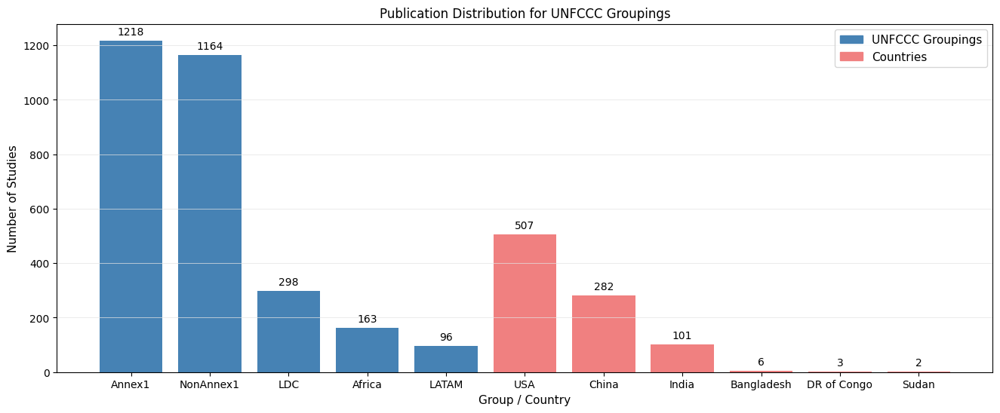

In [ ]:
# Old Code
# # Calculate the total number of males and females
# total_annex1 = data_subset['Annex1'].sum()
# total_non_annex1 = data_subset['NonAnnex1'].sum()
# total_ldc = data_subset['LDC'].sum()
# total_china = data_subset['China'].sum()
# total_india = data_subset['India'].sum()
# total_usa = data_subset['USA'].sum()
# # total_brazil = data_subset['Brazil'].sum()

# Skewness - New Code
total_annex1 = data_grouped[data_grouped['ResearchRegion'] == 'Annex1']['DOI'].nunique()
total_non_annex1 = data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']['DOI'].nunique()
total_ldc = data_grouped[data_grouped['ResearchRegion'] == 'LDC']['DOI'].nunique()
total_africa = data_grouped[data_grouped['ResearchRegion'] == 'Africa']['DOI'].nunique()
total_latam = data_grouped[data_grouped['ResearchRegion'] == 'LATAM']['DOI'].nunique()
total_china = data_grouped[data_grouped['ResearchRegion'] == 'China']['DOI'].nunique()
total_india = data_grouped[data_grouped['ResearchRegion'] == 'India']['DOI'].nunique()
total_usa = data_grouped[data_grouped['ResearchRegion'] == 'USA']['DOI'].nunique()
total_drc = data_grouped[data_grouped['ResearchRegion'] == 'DRC']['DOI'].nunique()
total_bangladesh = data_grouped[data_grouped['ResearchRegion'] == 'Bangladesh']['DOI'].nunique()
total_sudan = data_grouped[data_grouped['ResearchRegion'] == 'Sudan']['DOI'].nunique()


# total_annex1 = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['DOI'].nunique()
# total_non_annex1 = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'NonAnnex1' in x)]['DOI'].nunique()
# total_ldc = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'LDC' in x)]['DOI'].nunique()
# total_china = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'China' in x)]['DOI'].nunique()
# total_india = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'India' in x)]['DOI'].nunique()
# total_usa = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)]['DOI'].nunique()
# total_africa = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Africa' in x)]['DOI'].nunique()
# total_drc = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'DRC' in x)]['DOI'].nunique()
# total_bangladesh = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Bangladesh' in x)]['DOI'].nunique()
# total_sudan = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Sudan' in x)]['DOI'].nunique()

plt.figure(figsize=(16, 6))

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral', 'lightcoral', 'lightcoral', 'lightcoral']
counts = [total_annex1, total_non_annex1, total_ldc, total_africa, total_latam, total_usa, total_china, total_india, total_bangladesh, total_drc, total_sudan]

# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)

for i, val in enumerate(counts):
    plt.text(i, val + max(counts)*0.01, str(val), ha='center', va='bottom', fontsize=10)

# Plot the counts
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India', 'Bangladesh', 'DR of Congo', 'Sudan'], \
         counts, color=colors)
plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Number of Studies', fontsize=11)
# plt.ylim(0, 500)
plt.title('Publication Distribution for UNFCCC Groupings')
plt.savefig("regionwise_publications.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# 1213, 1091, 304, 165, 504, 281, 100, 6, 3, 2

In [ ]:
data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Africa' in x)]['DOI'].nunique()

163

In [ ]:
# Create the data
categories = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'USA', 'China', 'India']
counts = [
    data_grouped[data_grouped['ResearchRegion'] == 'Annex1']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'LDC']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'Africa']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'USA']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'China']['DOI'].nunique(),
    data_grouped[data_grouped['ResearchRegion'] == 'India']['DOI'].nunique(),
]
groupings = ['Region', 'Region', 'Region', 'Region', 'Country', 'Country', 'Country']

# Create a DataFrame
plot_data = pd.DataFrame({
    'Category': categories,
    'Count': counts,
    'Grouping': groupings
})

# Plot using Plotly Express
fig = px.bar(
    plot_data,
    x='Category',
    y='Count',
    color='Grouping',
    title='Publication Distribution for UNFCCC Groupings',
    labels={'Category': 'Group / Country', 'Count': 'Number of Studies'},
    color_discrete_map={'Region': 'steelblue', 'Country': 'lightcoral'}
)

# Customize layout
fig.update_layout(
    legend_title_text='Grouping',
    xaxis_title='Group / Country',
    yaxis_title='Number of Studies',
    yaxis=dict(gridcolor='#e3e3e3'),
)

fig.show()

In [ ]:
total_annex1, total_non_annex1, total_ldc, total_latam, total_china, total_india, total_usa

(1218, 1164, 298, 96, 282, 101, 507)

In [ ]:
total = data_grouped['DOI'].nunique()
total

1864

In [ ]:
total_usa / data_grouped['DOI'].nunique()

0.2719957081545064

In [ ]:
# total = total_annex1 + total_non_annex1

In [ ]:
(total_ldc + total_africa) / total

0.2473175965665236

In [ ]:
total_africa / total

0.08744635193133048

In [ ]:
test = data_grouped[data_grouped['ResearchRegion'] == 'LDC']['Regions_updated']
test = test.explode('Regions_updated')
test_list = list(test.unique())
counter_list = []
for country in test_list:
  if country in [c.lower() for c in ldc]:
    counter_list.append(country)

In [ ]:
len(counter_list)

19

In [ ]:
test_list

['africa',
 'asia',
 'madagascar',
 'southeast asia',
 'west africa',
 'south asia',
 'ethiopia',
 'bangladesh',
 'central africa',
 'north africa',
 'uganda',
 'angola',
 'east africa',
 'sahelian africa',
 'democratic republic of congo',
 'sudan',
 'tanzania',
 'nepal',
 'bhutan',
 'kiribati',
 'cambodia',
 'benin',
 'zambia',
 'myanmar',
 'rwanda',
 'laos',
 'afghanistan',
 'sierra leone']

In [ ]:
total_annex1

1218

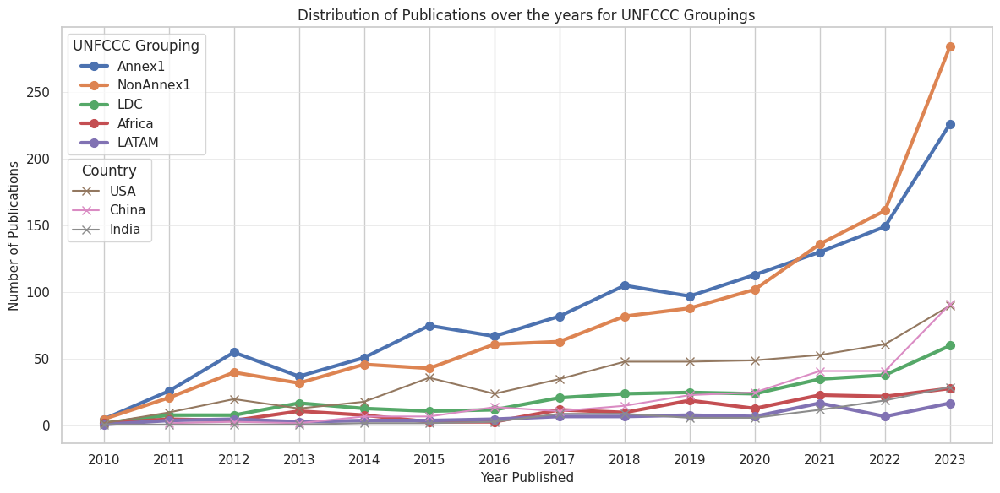

In [ ]:
# Old Code
# # Group by 'Year Published' and sum the binary columns
# grouped = data_grouped.groupby('Year Published').sum()

# plt.figure(figsize=(15, 6))
# plt.plot(grouped.index, grouped['Annex1'], label='Annex1')
# plt.plot(grouped.index, grouped['NonAnnex1'], label='NonAnnex1')
# plt.plot(grouped.index, grouped['LDC'], label='LDC')
# plt.plot(grouped.index, grouped['USA'], label='USA')
# plt.plot(grouped.index, grouped['China'], label='China')
# plt.plot(grouped.index, grouped['India'], label='India')
# # plt.plot(grouped.index, grouped['Brazil'], label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Studies')
# plt.title('Distribution of Studies over the Years')
# plt.legend()
# plt.show()

region_handles = []
country_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

# Loop through each ResearchRegion and plot the counts by year
for research_region in research_regions:
    counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].nunique()
    # counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['DOI'].nunique()
    # Determine line width and marker based on region type
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(counts.index, counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region)
        country_handles.append(line)
    else:
        line, = ax.plot(counts.index, counts.values, marker='o', markersize=7, linewidth=3, label=research_region)
        region_handles.append(line)

# First legend for regions
region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)

# Second legend for countries, placed below the region legend
ax.add_artist(region_legend)  # Add the region legend first
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.7), title='Country', fontsize=11)

# Add a custom legend for line thickness
# region_line = mlines.Line2D([], [], color='black', linewidth=2.5, label='Region')
# country_line = mlines.Line2D([], [], color='black', linewidth=1.5, label='Country')
# plt.legend(handles=[region_line, country_line], loc='upper left', title='Line Thickness')

plt.title('Distribution of Publications over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Number of Publications', fontsize=11)
plt.xticks(counts.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("yearwise_publications.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# List of regions and countries
research_regions = ['Annex1', 'NonAnnex1', 'LDC', 'LATAM', 'USA', 'Africa', 'China', 'India']

# Prepare data for Plotly
plot_data = []

# Group data by year and research region
for research_region in research_regions:
    counts = (
        data_grouped[data_grouped['ResearchRegion'] == research_region]
        .groupby('Year Published')['DOI']
        .nunique()
        .reset_index(name='Count')
    )
    counts['ResearchRegion'] = research_region
    plot_data.append(counts)

# Combine all regions into a single DataFrame
plot_data = pd.concat(plot_data, ignore_index=True)

# Determine line style based on region type
plot_data['LineStyle'] = plot_data['ResearchRegion'].apply(
    lambda x: 'dash' if x in ['USA', 'China', 'India', 'DRC', 'Sudan', 'Bangladesh'] else 'solid'
)
plot_data['Marker'] = plot_data['ResearchRegion'].apply(
    lambda x: 'diamond' if x in ['USA', 'China', 'India','DRC', 'Sudan', 'Bangladesh'] else 'circle'
)

# Create an interactive line plot
fig = px.line(
    plot_data,
    x='Year Published',
    y='Count',
    color='ResearchRegion',
    line_dash='LineStyle',
    symbol='Marker',
    title='Distribution of Publications over the Years for UNFCCC Groupings',
    labels={'Year Published': 'Year Published', 'Count': 'Number of Publications', 'ResearchRegion': 'Grouping'},
    hover_data={'LineStyle': False, 'Marker': False}
)

# Update layout for customization
fig.update_layout(
    legend_title_text='Grouping',
    xaxis_title='Year Published',
    yaxis_title='Number of Publications',
    xaxis=dict(tickmode='linear'),  # Ensure all years appear
    yaxis=dict(gridcolor='#e3e3e3'),
    plot_bgcolor='white',
    legend=dict(
        title_font_size=11,
        font_size=11,
        tracegroupgap=10,  # Space between grouped legends
    ),
    hoverlabel=dict(
        bgcolor="white",  # Background color for hover box
        font_size=11,
    ),
)

# Simplify legend labels
fig.for_each_trace(
    lambda trace: trace.update(
        name=trace.name.split(",")[0],  # Remove appended styles (e.g., "dash, x")
        showlegend=True,
        mode='lines+markers',
    )
)

# Show the plot
fig.show()

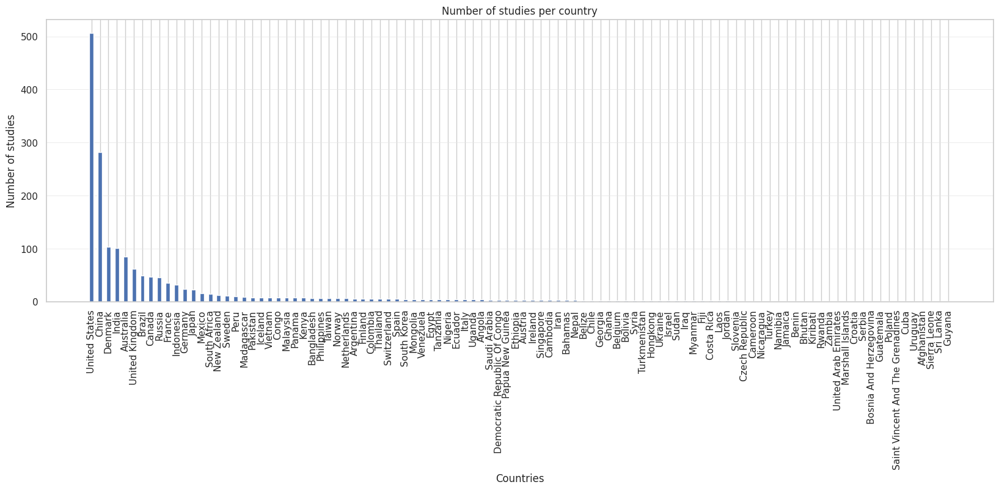

In [ ]:
# Old Code
# country_data = data_grouped[~data_subset['Regions_updated'].isin(non_annex1_regions + other_regions)]

# value_counts = country_data['Regions_updated'].value_counts()

# # Plot the chart
# plt.figure(figsize=(20, 6))
# plt.bar(value_counts.index, value_counts.values, width=0.5)
# plt.xlabel('Countries')
# plt.ylabel('Number of studies')
# plt.title('Number of studies per country')
# plt.xticks(rotation=90)
# plt.show()

# New Code - Skewness
country_data = data_grouped[['DOI', 'Regions_updated']]
country_data = country_data.explode(['Regions_updated'])
country_data = country_data.drop_duplicates()

country_data = country_data[~country_data['Regions_updated'].isin(exclude_regions)]
all_country_publications = country_data['Regions_updated'].value_counts()

# Plot the chart
plt.figure(figsize=(20, 6))
plt.bar(all_country_publications.index.str.title(), all_country_publications.values, width=0.5)
plt.xlabel('Countries', fontsize=12)
plt.ylabel('Number of studies', fontsize=12)
plt.title('Number of studies per country')
plt.xticks(rotation=90)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
# plt.ylim(0, 450)
plt.savefig("countrywise_publications.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

# Welsch Test

In [ ]:
all_country_publications

,count
Regions_updated,
united states,507
china,282
denmark,103
india,101
australia,85
...,...
uruguay,1
afghanistan,1
sierra leone,1


In [ ]:
all_country_publications.keys()

Index(['united states', 'china', 'denmark', 'india', 'australia',
       'united kingdom', 'brazil', 'canada', 'russia', 'france',
       ...
       'serbia', 'guatemala', 'poland', 'saint vincent and the grenadines',
       'cuba', 'uruguay', 'afghanistan', 'sierra leone', 'sri lanka',
       'guyana'],
      dtype='object', name='Regions_updated', length=102)

In [ ]:
annex1_country_count = []
nonannex1_country_count = []
for country in annex1:
  if country.lower() in all_country_publications.keys():
    annex1_country_count.append(all_country_publications[country.lower()])

for country in non_annex1:
  if country.lower() in all_country_publications.keys():
    nonannex1_country_count.append(all_country_publications[country.lower()])

In [ ]:
from scipy.stats import ttest_ind

# annex1_publications = [...]  # Publication counts for each Annex-1 country
# nonannex1_publications = [...]  # Publication counts for each Non-Annex1 country
t_stat, p_value = ttest_ind(annex1_country_count, nonannex1_country_count, equal_var=False)
print(f"T-test Statistic: {t_stat}, p-value: {p_value}")

T-test Statistic: 1.4538920116999143, p-value: 0.15695317958226876


Interpretation: On a per-country basis, the publication output between Annex-1 and Non-Annex1 countries appears similar, suggesting that the total difference is likely due to group size or other aggregate effects rather than per-country disparities.

In [ ]:
np.sum(annex1_country_count)

np.int64(1009)

In [ ]:
from scipy.stats import chisquare

publication_country_counts = [np.sum(annex1_country_count), np.sum(nonannex1_country_count)]
chisq_stat, p_value = chisquare(publication_country_counts)
print(f"Chi-Square Statistic: {chisq_stat}, p-value: {p_value}")


Chi-Square Statistic: 53.14918414918415, p-value: 3.0915381920791246e-13


Interpretation: There is strong evidence that the total publication counts differ more than expected by chance, even though the raw counts (1128 vs. 1133) are close. This could be due to the test's sensitivity to small proportional differences when the overall counts are large.

In [ ]:
# Calculate means and standard deviations
mean_annex1 = np.mean(annex1_country_count)
std_annex1 = np.std(annex1_country_count, ddof=1)  # ddof=1 for sample std
mean_nonannex1 = np.mean(nonannex1_country_count)
std_nonannex1 = np.std(nonannex1_country_count, ddof=1)

# Calculate pooled standard deviation
n1, n2 = len(annex1_country_count), len(nonannex1_country_count)
pooled_std = np.sqrt(((n1 - 1) * std_annex1**2 + (n2 - 1) * std_nonannex1**2) / (n1 + n2 - 2))

# Calculate Cohen's d
cohens_d = (mean_annex1 - mean_nonannex1) / pooled_std
print(f"Cohen's d: {cohens_d}")

Cohen's d: 0.4819680910712423


In [ ]:
mean_ratio = mean_annex1 / mean_nonannex1
print(f"Ratio of Means: {mean_ratio}")

Ratio of Means: 3.964325003928965


# Journal Wise Counts

In [ ]:
# data_subset['Journal'].value_counts()
# data_grouped['Journal'].value_counts()

In [ ]:
# Old code
# # Calculate the total number of males and females
# total_annex1 = data_subset.groupby('Journal')['Annex1'].sum()
# total_non_annex1 = data_subset.groupby('Journal')[['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']].sum()

# # Set up color scheme
# color_map = mpl.colormaps['tab20']  # You can change 'tab10' to another colormap like 'viridis', 'plasma', etc.
# colors = color_map.colors[:len(total_non_annex1.columns)]   # Generate as many colors as there are regions

# # Plot the counts
# ax = total_non_annex1.plot(kind='bar', stacked=False, color=colors)
# plt.xlabel('Journal')
# plt.ylabel('Number of Studies')
# plt.xticks(range(len(total_non_annex1.index)), \
#  ['Nature', 'Nature Climate', 'Nature Comm', 'Science', 'PNAS', 'NPJ'])
# plt.title('Region-Wise Distribution')
# plt.show()

In [ ]:

# Old code - normalised graph
# temp_new = exploded_data[exploded_data['ResearchRegion'] != '']
# temp = temp_new.groupby('Journal')[['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']]
# new_graph = temp.sum() / temp.count()
# new_graph.plot(kind='bar', figsize=(9, 6))
# plt.xlabel('Journal')
# plt.ylabel('Number of Studies')
# plt.xticks(range(len(new_graph.index)), \
#  ['Nature', 'Nature Climate', 'Nature Comm', 'Science', 'PNAS', 'NPJ'])
# plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
# plt.title('Region-Wise Distribution')
# plt.show()

In [ ]:
data_subset['Journal'].value_counts()

,count
Journal,
Nature Communications,1465
Nature Climate Change,1400
npj Climate and Atmospheric Science,715
Nature,490
Science Advances,452
Communications Earth & Environment,442
Science,257
PNAS,163


In [ ]:
data_subset[data_subset['Journal'] == 'Science Advances']

,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,Regions_updated,ResearchRegion,Theme
4516,Old World megadroughts and pluvials during the...,,2015-11-06,2015,2015-11-06,climatology,Science Advances,https://doi.org/10.1126/sciadv.1500561,"['Edward R. Cook', 'Richard Seager', 'Yochanan...",['Edward R. Cook'],...,0.0,0,,Climate model projections suggest widespread d...,Instrumental observations show that the Medite...,,Instrumental observations show that the Medite...,asia,Annex1,Scientific Modeling & Predictions
4516,Old World megadroughts and pluvials during the...,,2015-11-06,2015,2015-11-06,climatology,Science Advances,https://doi.org/10.1126/sciadv.1500561,"['Edward R. Cook', 'Richard Seager', 'Yochanan...",['Edward R. Cook'],...,0.0,0,,Climate model projections suggest widespread d...,Instrumental observations show that the Medite...,,Instrumental observations show that the Medite...,asia,NonAnnex1,Scientific Modeling & Predictions
4516,Old World megadroughts and pluvials during the...,,2015-11-06,2015,2015-11-06,climatology,Science Advances,https://doi.org/10.1126/sciadv.1500561,"['Edward R. Cook', 'Richard Seager', 'Yochanan...",['Edward R. Cook'],...,0.0,0,,Climate model projections suggest widespread d...,Instrumental observations show that the Medite...,,Instrumental observations show that the Medite...,asia,LDC,Scientific Modeling & Predictions
4516,Old World megadroughts and pluvials during the...,,2015-11-06,2015,2015-11-06,climatology,Science Advances,https://doi.org/10.1126/sciadv.1500561,"['Edward R. Cook', 'Richard Seager', 'Yochanan...",['Edward R. Cook'],...,0.0,0,,Climate model projections suggest widespread d...,Instrumental observations show that the Medite...,,Instrumental observations show that the Medite...,europe,Annex1,Scientific Modeling & Predictions
4516,Old World megadroughts and pluvials during the...,,2015-11-06,2015,2015-11-06,climatology,Science Advances,https://doi.org/10.1126/sciadv.1500561,"['Edward R. Cook', 'Richard Seager', 'Yochanan...",['Edward R. Cook'],...,0.0,0,,Climate model projections suggest widespread d...,Instrumental observations show that the Medite...,,Instrumental observations show that the Medite...,europe,NonAnnex1,Scientific Modeling & Predictions
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4924,Mutualistic interactions reshuffle the effects...,,2019-05-15,2019,2019-05-15,"ecology, ecology",Science Advances,https://doi.org/10.1126/sciadv.aav2539,"['Jordi Bascompte', 'María B. García', 'Raúl O...",['Jordi Bascompte'],...,0.0,0,,Climatically induced local species extinctions...,"Climate change affects the physiology, abundan...",,"Climate change affects the physiology, abundan...",europe,Annex1,Climate Impact on Ecosystems
4924,Mutualistic interactions reshuffle the effects...,,2019-05-15,2019,2019-05-15,"ecology, ecology",Science Advances,https://doi.org/10.1126/sciadv.aav2539,"['Jordi Bascompte', 'María B. García', 'Raúl O...",['Jordi Bascompte'],...,0.0,0,,Climatically induced local species extinctions...,"Climate change affects the physiology, abundan...",,"Climate change affects the physiology, abundan...",europe,NonAnnex1,Climate Impact on Ecosystems
4925,Amazon rainforest photosynthesis increases in ...,,2020-11-20,2020,2020-11-20,"environmental studies, ecology, environmental ...",Science Advances,https://doi.org/10.1126/sciadv.abb7232,"['J. K. Green', 'J. Berry', 'P. Ciais', 'Y. Zh...",['J. K. Green'],...,0.0,0,,Earth system models predict that increases in ...,"Land surface models, as used in Earth system m...",,"Land surface models, as used in Earth system m...",amazon,NonAnnex1,"['Climate Impact on Ecosystems', 'Scientific M..."
4927,Ecosystem stability and Native American oyster...,,2020-07-10,2020,2020-07-10,"anthropology, anthropology, applied ecology",Science Advances,https://doi.o

In [ ]:
data_grouped['Journal'].value_counts()

,count
Journal,
Nature Communications,1062
Nature Climate Change,1020
npj Climate and Atmospheric Science,493
Nature,357
Communications Earth & Environment,324
Science Advances,309
Science,173
PNAS,102


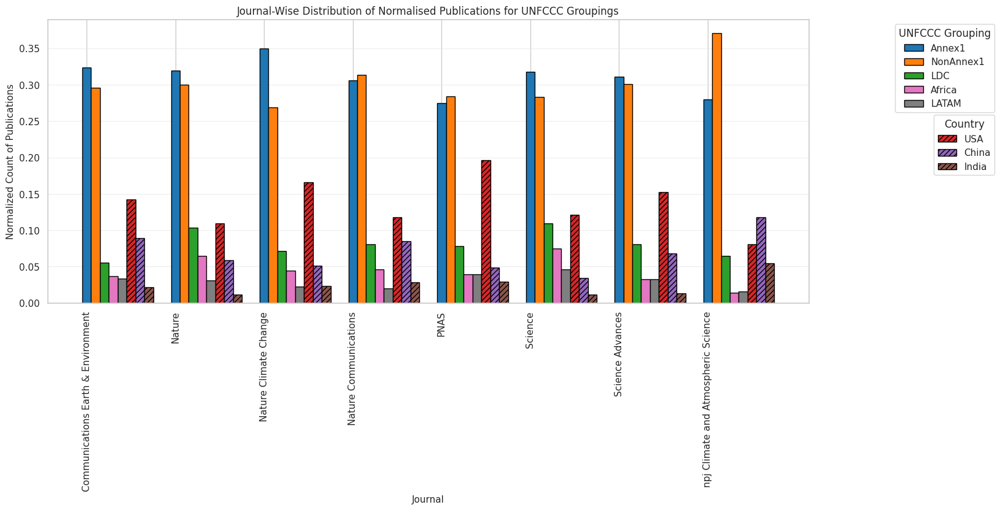

In [ ]:
data_journal = data_grouped[['Journal', 'ResearchRegion', 'DOI']]
data_journal = data_journal.explode('ResearchRegion')
data_journal = data_journal.groupby(['Journal', 'ResearchRegion'])['DOI'].nunique().reset_index()
data_journal.columns = ['Journal', 'ResearchRegion', 'RegionCounts']

data_journal_norm = data_journal.groupby('Journal')['RegionCounts'].sum().reset_index()
data_journal_norm.columns = ['Journal', 'JournalCounts']

data_journal = pd.merge(data_journal, data_journal_norm, on='Journal', how='left')
data_journal['NormalisedCount'] = data_journal['RegionCounts'] / data_journal['JournalCounts']

journals = data_journal['Journal'].unique()
regions = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India']
values = {region: [] for region in regions}

for region in regions:
    # print()
    for journal in journals:
        # print(journal)
        count = data_journal[(data_journal['Journal'] == journal) & (data_journal['ResearchRegion'] == region)]
        values[region].append(count['NormalisedCount'].values[0] if not count.empty else 0)

x = np.arange(len(journals))
bar_width = 0.1
fig, ax = plt.subplots(figsize=(16, 6))

for i, region in enumerate(regions):
    ax.bar(x + i * bar_width, values[region], width=bar_width, label=region, color = region_palette[region],
           hatch='////' if region in ['USA', 'China', 'India'] else '', edgecolor='black')

colors = plt.cm.tab10.colors
# region_patches = [mpatches.Rectangle((0, 0), 1, 1, facecolor=colors[i % len(colors)], edgecolor='black') for i in range(4)]
# country_patches = [mpatches.Rectangle((0, 0), 1, 1, facecolor=colors[i % len(colors)], edgecolor='black', hatch='////') for i in range(4, 7)]
region_patches = [mpatches.Rectangle((0, 0), 1, 1, facecolor=region_palette[r], edgecolor='black') for r in ['Annex1','NonAnnex1','LDC','Africa','LATAM']]
country_patches = [mpatches.Rectangle((0, 0), 1, 1, facecolor=region_palette[r], edgecolor='black', hatch='////') for r in ['USA','China','India']]

region_legend = ax.legend(handles=region_patches, labels=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], title='UNFCCC Grouping', loc='upper right',
          bbox_to_anchor=(1.25, 1), frameon=True, fontsize=11)
country_legend = ax.legend(handles=country_patches, labels=['USA', 'China', 'India'], title='Country', loc='upper right',
          bbox_to_anchor=(1.25, 0.68), frameon=True, fontsize=11)
ax.add_artist(region_legend)

# Formatting the plot
plt.title('Journal-Wise Distribution of Normalised Publications for UNFCCC Groupings')
plt.ylabel('Normalized Count of Publications', fontsize=11)
plt.xlabel('Journal', fontsize=11)
plt.xticks(range(0, 8), journals, rotation=90)
#  ['Communications Eath & Environment', 'Nature', 'Nature Climate', 'Nature Communications', 'PNAS', 'Science', 'npj Climate And Atmospheric Science'], rotation=90)
# plt.ylim(0, 0.45)
# plt.legend(title='Region', loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.savefig("long_journalwise_publications.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# Prepare the data in long format
data_journal = data_grouped[['Journal', 'ResearchRegion', 'DOI']]
data_journal = data_journal.explode('ResearchRegion')
data_journal = data_journal.groupby(['Journal', 'ResearchRegion'])['DOI'].count().reset_index()
data_journal.columns = ['Journal', 'ResearchRegion', 'RegionCounts']

data_journal_norm = data_journal.groupby('Journal')['RegionCounts'].sum().reset_index()
data_journal_norm.columns = ['Journal', 'JournalCounts']

data_journal = pd.merge(data_journal, data_journal_norm, on='Journal', how='left')
data_journal['NormalizedCount'] = data_journal['RegionCounts'] / data_journal['JournalCounts']

# Grouped bar chart
fig = go.Figure()

regions = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India', 'Bangladesh', 'DRC', 'Sudan']
hatch_patterns = {'USA': '\\', 'China': '\\', 'India': '\\', 'Bangladesh': '\\', 'DRC': '\\', 'Sudan': '\\', 'Annex1': None, 'NonAnnex1': None, 'LDC': None}

# Create a bar for each region
for region in regions:
    region_data = data_journal[data_journal['ResearchRegion'] == region]
    fig.add_trace(go.Bar(
        x=region_data['Journal'],
        y=region_data['NormalizedCount'],
        name=region,
        marker=dict(
            pattern_shape=hatch_patterns[region],  # Apply hatch pattern for specific regions
            line=dict(color='black', width=1)
        )
    ))

# Layout for the plot
fig.update_layout(
    barmode='group',
    title='Journal-Wise Distribution of Normalized Publications for UNFCCC Groupings',
    xaxis=dict(title='Journal', tickangle=90),
    yaxis=dict(title='Normalized Count of Publications'),
    legend_title_text='Grouping',
    template='plotly_white'
)

fig.show()

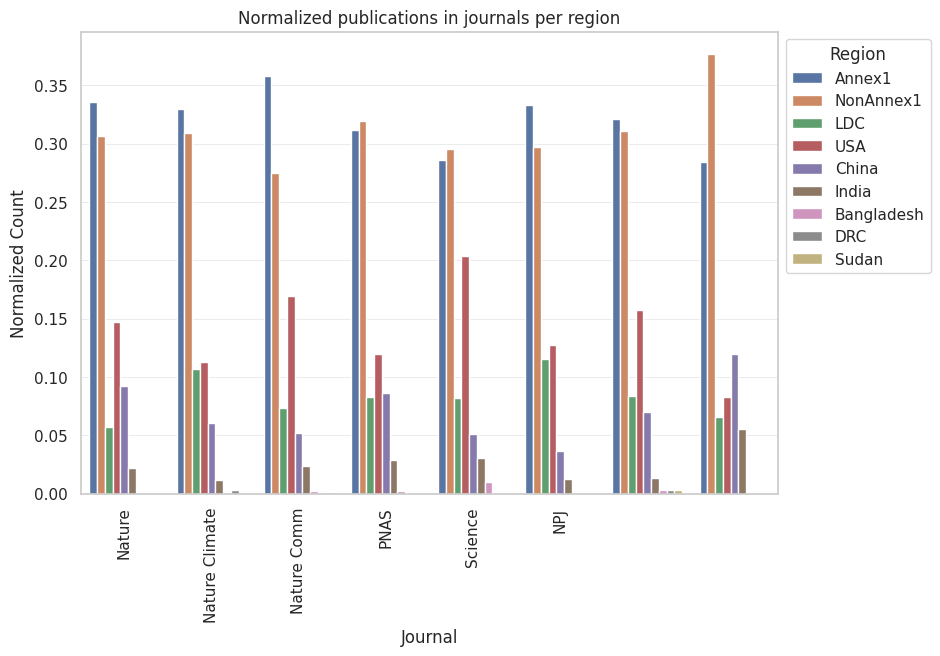

In [ ]:
data_journal = data_grouped[['Journal', 'ResearchRegion', 'DOI']]
data_journal = data_journal.explode('ResearchRegion')
data_journal = data_journal.groupby(['Journal', 'ResearchRegion'])['DOI'].count().reset_index()
data_journal.columns = ['Journal', 'ResearchRegion', 'RegionCounts']

data_journal_norm = data_journal.groupby('Journal')['RegionCounts'].sum().reset_index()
data_journal_norm.columns = ['Journal', 'JournalCounts']

data_journal = pd.merge(data_journal, data_journal_norm, on='Journal', how='left')
data_journal['NormalisedCount'] = data_journal['RegionCounts'] / data_journal['JournalCounts']
# data_journal

# Create a grouped bar plot
plt.figure(figsize=(9, 6))
sns.barplot(data=data_journal, x='Journal', y='NormalisedCount', hue='ResearchRegion',\
            hue_order=['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India', 'Bangladesh', 'DRC', 'Sudan'])

# Formatting the plot
plt.title('Normalized publications in journals per region')
plt.ylabel('Normalized Count')
plt.xlabel('Journal')
plt.xticks(range(0, 6), ['Nature', 'Nature Climate', 'Nature Comm', 'PNAS', 'Science', 'NPJ'], rotation=90,)
# plt.ylim(0, 0.45)
plt.legend(title='Region', loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.show()

# **Citation Analysis**

/tmp/ipython-input-24630654.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  annex1_citations_all['CitationBin'] = pd.cut(annex1_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)


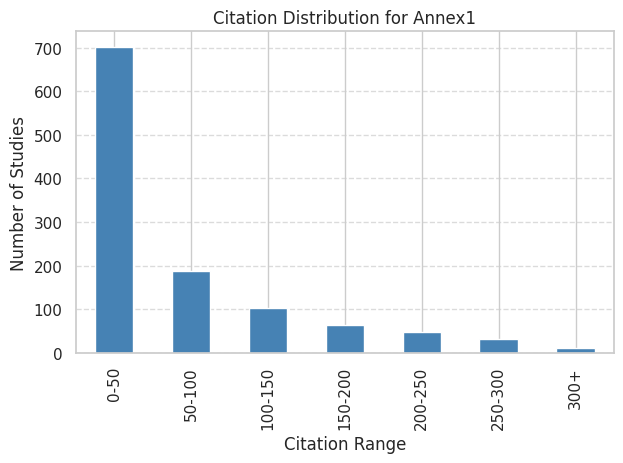

In [ ]:
annex1_citations_all = data_grouped[data_grouped['ResearchRegion'] == 'Annex1']

# Define citation bins
bins = [0, 250, 500, 750, 1000, 1250, 1500]
bins = [0, 50, 100, 150, 200, 250, 300, 350]
labels = ['0-50', '50-100', '100-150', '150-200', '200-250', '250-300', '300+']

# Bin the citation counts
annex1_citations_all['CitationBin'] = pd.cut(annex1_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)

# Count how many studies fall into each bin
annex1_citation_bin_counts = annex1_citations_all['CitationBin'].value_counts().sort_index()

# plt.figure(figsize=(8, 5))
annex1_citation_bin_counts.plot(kind='bar', color='steelblue')
plt.title('Citation Distribution for Annex1')
plt.xlabel('Citation Range')
plt.ylabel('Number of Studies')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3063476153.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_annex1_citations_all['CitationBin'] = pd.cut(non_annex1_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)


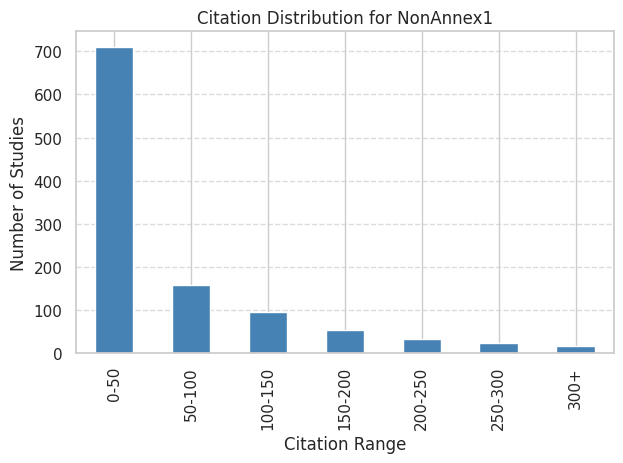

In [ ]:
non_annex1_citations_all = data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']

# Define citation bins
bins = [0, 250, 500, 750, 1000, 1250, 1500]
bins = [0, 50, 100, 150, 200, 250, 300, 350]
labels = ['0-50', '50-100', '100-150', '150-200', '200-250', '250-300', '300+']

# Bin the citation counts
non_annex1_citations_all['CitationBin'] = pd.cut(non_annex1_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)

# Count how many studies fall into each bin
non_annex1_citation_bin_counts = non_annex1_citations_all['CitationBin'].value_counts().sort_index()

# plt.figure(figsize=(8, 5))
non_annex1_citation_bin_counts.plot(kind='bar', color='steelblue')
plt.title('Citation Distribution for NonAnnex1')
plt.xlabel('Citation Range')
plt.ylabel('Number of Studies')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/tmp/ipython-input-1598823296.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



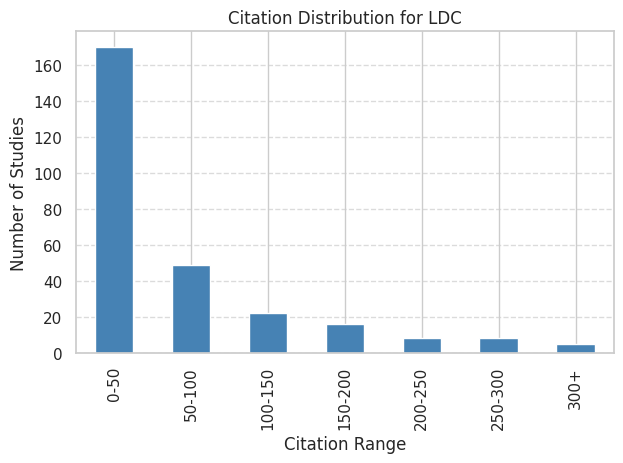

In [ ]:
ldc_citations_all = data_grouped[data_grouped['ResearchRegion'] == 'LDC']

# Define citation bins
bins = [0, 250, 500, 750, 1000, 1250, 1500]
bins = [0, 50, 100, 150, 200, 250, 300, 350]
labels = ['0-50', '50-100', '100-150', '150-200', '200-250', '250-300', '300+']

# Bin the citation counts
ldc_citations_all['CitationBin'] = pd.cut(ldc_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)

# Count how many studies fall into each bin
ldc_citation_bin_counts = ldc_citations_all['CitationBin'].value_counts().sort_index()

# plt.figure(figsize=(8, 5))
ldc_citation_bin_counts.plot(kind='bar', color='steelblue')
plt.title('Citation Distribution for LDC')
plt.xlabel('Citation Range')
plt.ylabel('Number of Studies')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/tmp/ipython-input-871244699.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



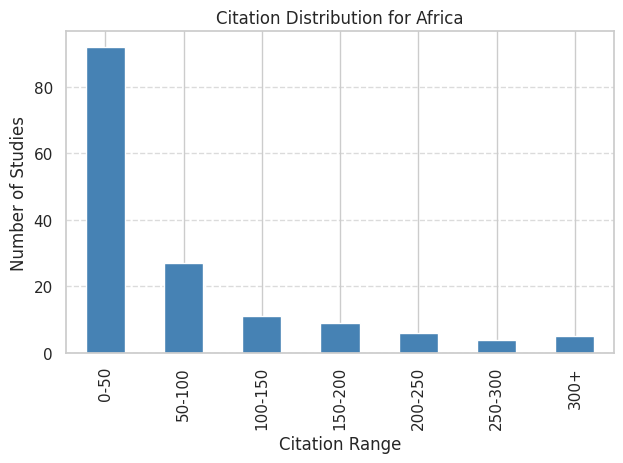

In [ ]:
africa_citations_all = data_grouped[data_grouped['ResearchRegion'] == 'Africa']

# Define citation bins
bins = [0, 250, 500, 750, 1000, 1250, 1500]
bins = [0, 50, 100, 150, 200, 250, 300, 350]
labels = ['0-50', '50-100', '100-150', '150-200', '200-250', '250-300', '300+']

# Bin the citation counts
africa_citations_all['CitationBin'] = pd.cut(africa_citations_all['Citation'], bins=bins, labels=labels, include_lowest=True)

# Count how many studies fall into each bin
africa_citations_bin_counts = africa_citations_all['CitationBin'].value_counts().sort_index()

# plt.figure(figsize=(8, 5))
africa_citations_bin_counts.plot(kind='bar', color='steelblue')
plt.title('Citation Distribution for Africa')
plt.xlabel('Citation Range')
plt.ylabel('Number of Studies')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# all_citation_counts = pd.DataFrame()

annex1_citation_bin_counts = annex1_citation_bin_counts.reset_index()
annex1_citation_bin_counts.columns = ['CitationBins', 'Counts']
annex1_citation_bin_counts['Region'] = 'Annex1'

non_annex1_citation_bin_counts = non_annex1_citation_bin_counts.reset_index()
non_annex1_citation_bin_counts.columns = ['CitationBins', 'Counts']
non_annex1_citation_bin_counts['Region'] = 'NonAnnex1'

ldc_citation_bin_counts = ldc_citation_bin_counts.reset_index()
ldc_citation_bin_counts.columns = ['CitationBins', 'Counts']
ldc_citation_bin_counts['Region'] = 'LDC'

africa_citations_bin_counts = africa_citations_bin_counts.reset_index()
africa_citations_bin_counts.columns = ['CitationBins', 'Counts']
africa_citations_bin_counts['Region'] = 'Africa'

all_citation_counts = pd.concat([annex1_citation_bin_counts, non_annex1_citation_bin_counts, ldc_citation_bin_counts, africa_citations_bin_counts], ignore_index=True)

pivot_df = all_citation_counts.pivot(index='CitationBins', columns='Region', values='Counts').fillna(0)
pivot_df = pivot_df[['Annex1', 'NonAnnex1', 'LDC', 'Africa']]

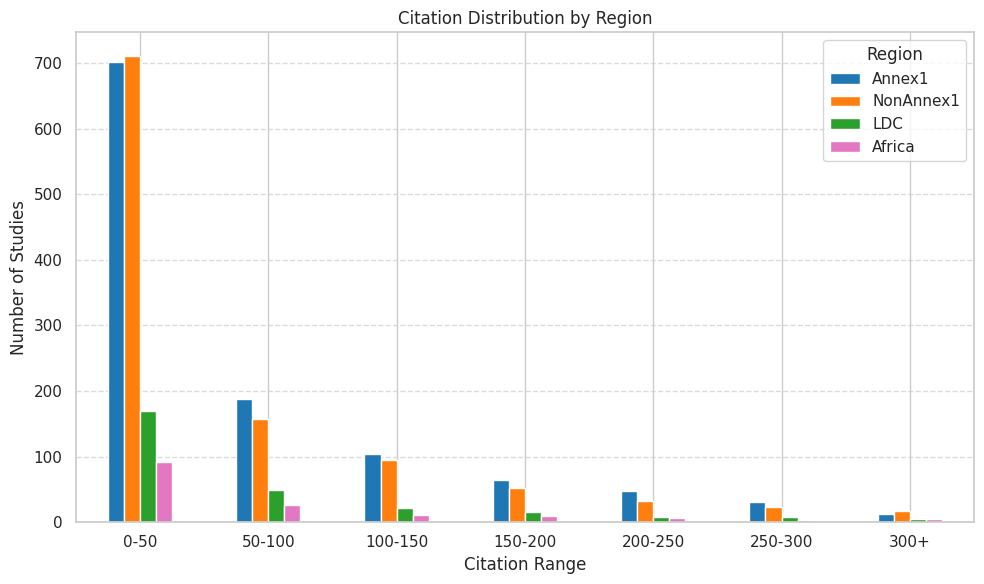

In [ ]:
# Plot

tab10_colors = list(plt.get_cmap('tab10').colors)

# Adjust the colors list to match the number of regions (columns in pivot_df)
num_bars = pivot_df.shape[1]
custom_colors = tab10_colors[:num_bars]  # Use tab10 colors for all bars

# Replace the last color with pink (matplotlib tab10 pink is #e377c2 or tab10[6])
custom_colors[-1] = tab10_colors[6]

pivot_df.plot(kind='bar', figsize=(10, 6), color=custom_colors)
plt.title('Citation Distribution by Region')
plt.xlabel('Citation Range')
plt.ylabel('Number of Studies')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Region')
plt.tight_layout()
# plt.savefig("citation_binned_distribution_by_region.png", dpi=600)
plt.show()

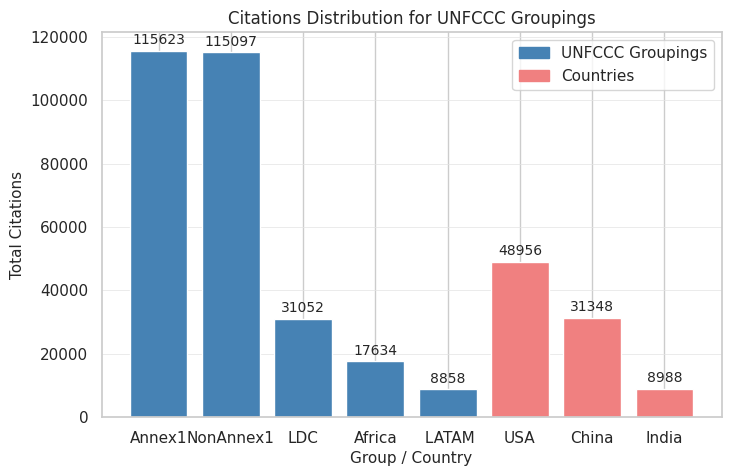

In [ ]:
# Old Code
# annex1_citations = data_subset.groupby('Annex1')['Citation'].sum()[1]
# non_annex1_citations = data_subset.groupby('NonAnnex1')['Citation'].sum()[1]
# ldc_citations = data_subset.groupby('LDC')['Citation'].sum()[1]
# usa_citations = data_subset.groupby('USA')['Citation'].sum()[1]
# china_citations = data_subset.groupby('China')['Citation'].sum()[1]
# india_citations = data_subset.groupby('India')['Citation'].sum()[1]
# # brazil_citations = data_subset.groupby('Brazil')['Citation'].sum()[1]

# plt.bar(['NonAnnex1', 'USA', 'Annex1', 'China', 'India', 'LDC'], \
#         [non_annex1_citations, usa_citations, annex1_citations, china_citations, india_citations, ldc_citations])
# plt.xlabel('Region')
# plt.ylabel('Total number of Citations')
# plt.title('Region-Wise Citations Distribution')
# plt.show()

# # New Code - Skewness
# annex1_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['Citation'].sum()
# non_annex1_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'NonAnnex1' in x)]['Citation'].sum()
# ldc_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'LDC' in x)]['Citation'].sum()
# africa_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Africa' in x)]['Citation'].sum()
# usa_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)]['Citation'].sum()
# china_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'China' in x)]['Citation'].sum()
# india_citations = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'India' in x)]['Citation'].sum()

plt.figure(figsize=(8, 5))

annex1_citations = data_grouped[data_grouped['ResearchRegion'] == 'Annex1']['Citation'].sum()
non_annex1_citations = data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']['Citation'].sum()
ldc_citations = data_grouped[data_grouped['ResearchRegion'] == 'LDC']['Citation'].sum()
africa_citations = data_grouped[data_grouped['ResearchRegion'] == 'Africa']['Citation'].sum()
latam_citations = data_grouped[data_grouped['ResearchRegion'] == 'LATAM']['Citation'].sum()
usa_citations = data_grouped[data_grouped['ResearchRegion'] == 'USA']['Citation'].sum()
china_citations = data_grouped[data_grouped['ResearchRegion'] == 'China']['Citation'].sum()
india_citations = data_grouped[data_grouped['ResearchRegion'] == 'India']['Citation'].sum()
bangladesh_citations = data_grouped[data_grouped['ResearchRegion'] == 'Bangladesh']['Citation'].sum()
sudan_citations = data_grouped[data_grouped['ResearchRegion'] == 'Sudan']['Citation'].sum()
drc_citations = data_grouped[data_grouped['ResearchRegion'] == 'DRC']['Citation'].sum()

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)

citation_counts = [annex1_citations, non_annex1_citations, ldc_citations, africa_citations, latam_citations, usa_citations, china_citations, india_citations]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa',' LATAM', 'USA', 'China', 'India'], \
        citation_counts, color=colors)

for i, val in enumerate(citation_counts):
    plt.text(i, val + max(citation_counts)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.title('Citations Distribution for UNFCCC Groupings')
# plt.ylim(0, 60000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.savefig("total_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
citation_test = data_grouped[['DOI', 'ResearchRegion', 'Citation']].drop_duplicates()
citation_test

,DOI,ResearchRegion,Citation
0,https://doi.org/10.1038/s41558-019-0468-y,Annex1,30.0
1,https://doi.org/10.1038/s41558-019-0468-y,USA,30.0
2,https://doi.org/10.1126/science.1222135,Annex1,0.0
3,https://doi.org/10.1038/s41558-022-01520-4,Annex1,0.0
4,https://doi.org/10.1038/s41558-022-01520-4,NonAnnex1,0.0
...,...,...,...
3835,https://doi.org/10.1038/s41558-020-00963-x,NonAnnex1,87.0
3836,https://doi.org/10.1038/s41558-023-01746-w,Annex1,4.0
3837,https://doi.org/10.1038/s41558-023-01746-w,NonAnnex1,4.0
3838,https://doi.org/10.1038/s41612-019-0091-7,LDC,76.0


In [ ]:
citation_test.groupby('ResearchRegion')['Citation'].agg(['count', 'mean', 'median', 'max']).reset_index()

,ResearchRegion,count,mean,median,max
0,Africa,163,108.184049,38.0,1735.0
1,Annex1,1218,94.928571,33.5,2714.0
2,Bangladesh,6,111.166667,76.5,313.0
3,China,282,111.163121,26.0,3311.0
4,DRC,3,48.000000,51.0,93.0
5,India,101,88.990099,24.0,807.0
6,LATAM,96,92.270833,23.0,1171.0
7,LDC,298,104.201342,28.0,1735.0
8,NonAnnex1,1164,98.880584,26.0,3311.0
9,Sudan,2,5.500000,5.5,11.0


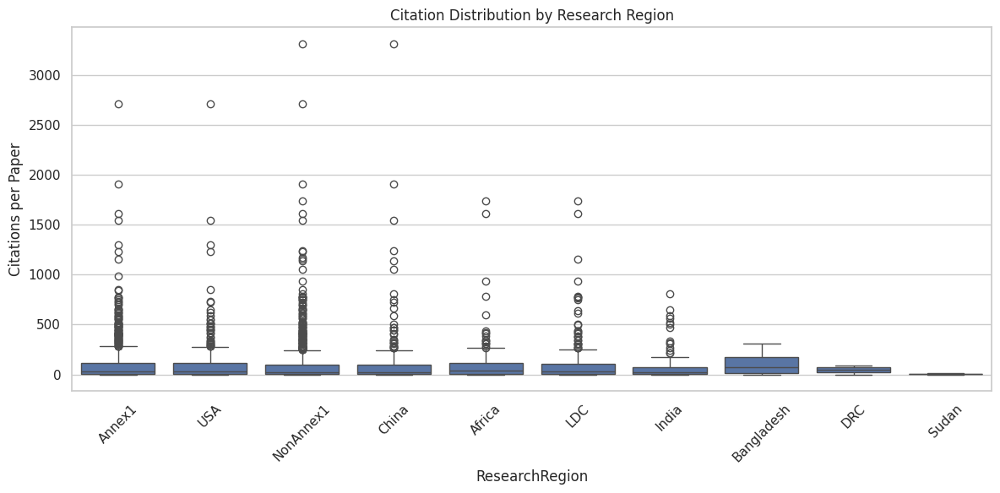

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.boxplot(data=citation_test, x='ResearchRegion', y='Citation')
plt.title("Citation Distribution by Research Region")
plt.ylabel("Citations per Paper")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("citation_outliers.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()


/tmp/ipython-input-766670041.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




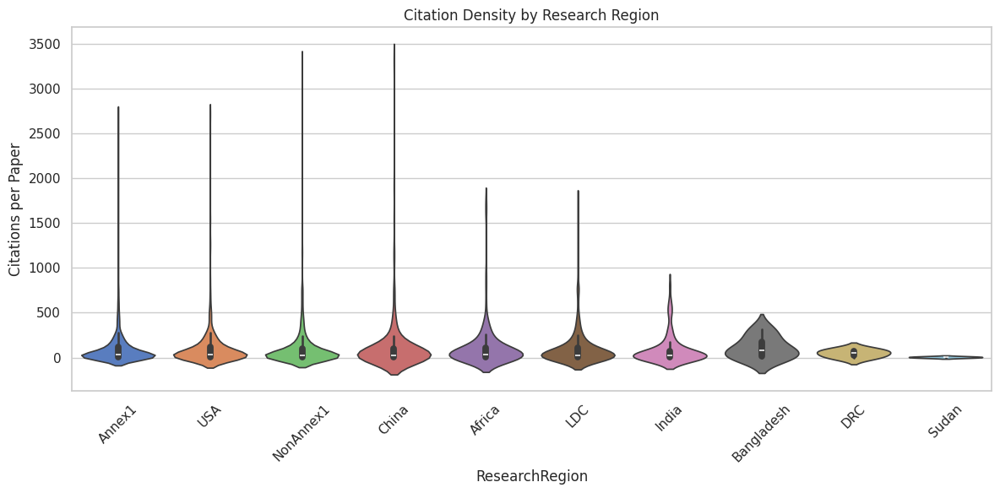

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=citation_test, x='ResearchRegion', y='Citation', inner='box', palette='muted')
plt.title("Citation Density by Research Region")
plt.ylabel("Citations per Paper")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/tmp/ipython-input-1581425378.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




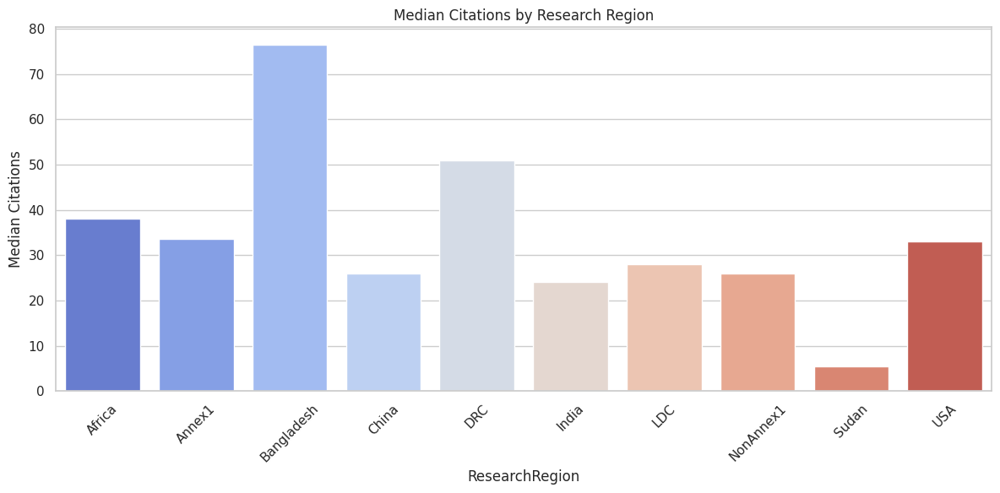

In [ ]:
summary_stats = citation_test.groupby('ResearchRegion')['Citation'].agg(['count', 'mean', 'median', 'max']).reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(data=summary_stats, x='ResearchRegion', y='median', palette='coolwarm')
plt.title("Median Citations by Research Region")
plt.ylabel("Median Citations")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/tmp/ipython-input-2166972083.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




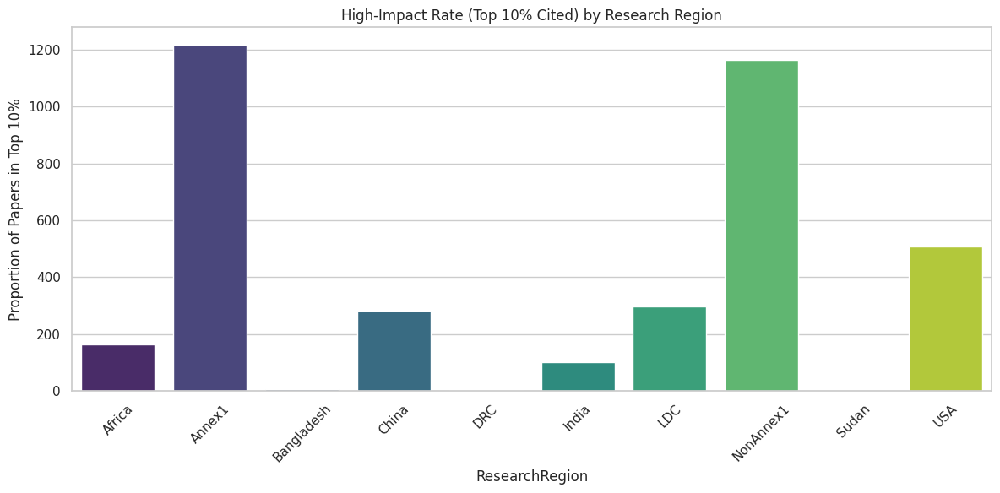

In [ ]:
# Step 1: Determine threshold for top 10% citations
top_10_threshold = citation_test['Citation'].quantile(0.90)

# Step 2: Tag high-impact papers
citation_test['HighImpact'] = citation_test['Citation'] >= top_10_threshold

# Step 3: Calculate high-impact rate per region
high_impact_rate = citation_test.groupby('ResearchRegion')['HighImpact'].count().reset_index()

# Step 4: Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=high_impact_rate, x='ResearchRegion', y='HighImpact', palette='viridis')
plt.title("High-Impact Rate (Top 10% Cited) by Research Region")
plt.ylabel("Proportion of Papers in Top 10%")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# Total citations per region
total_citations_by_region = citation_test.groupby('ResearchRegion')['Citation'].sum().reset_index()
total_citations_by_region.columns = ['ResearchRegion', 'TotalCitations']

# Merge with publication counts
pub_counts = citation_test['ResearchRegion'].value_counts().reset_index()
pub_counts.columns = ['ResearchRegion', 'PublicationCount']

citation_weighted = total_citations_by_region.merge(pub_counts, on='ResearchRegion')
citation_weighted['CitationsPerPaper'] = citation_weighted['TotalCitations'] / citation_weighted['PublicationCount']
citation_weighted['CitationsAsPercentOfTotal'] = 100 * citation_weighted['TotalCitations'] / citation_weighted['TotalCitations'].sum()

citation_weighted.sort_values(by='CitationsAsPercentOfTotal', ascending=False)


,ResearchRegion,TotalCitations,PublicationCount,CitationsPerPaper,CitationsAsPercentOfTotal
1,Annex1,115623.0,1218,94.928571,31.290052
7,NonAnnex1,115097.0,1164,98.880584,31.147705
9,USA,48956.0,507,96.560158,13.248539
3,China,31348.0,282,111.163121,8.483438
6,LDC,31052.0,298,104.201342,8.403334
0,Africa,17634.0,163,108.184049,4.772137
5,India,8988.0,101,88.990099,2.432345
2,Bangladesh,667.0,6,111.166667,0.180504
4,DRC,144.0,3,48.000000,0.038969
8,Sudan,11.0,2,5.500000,0.002977


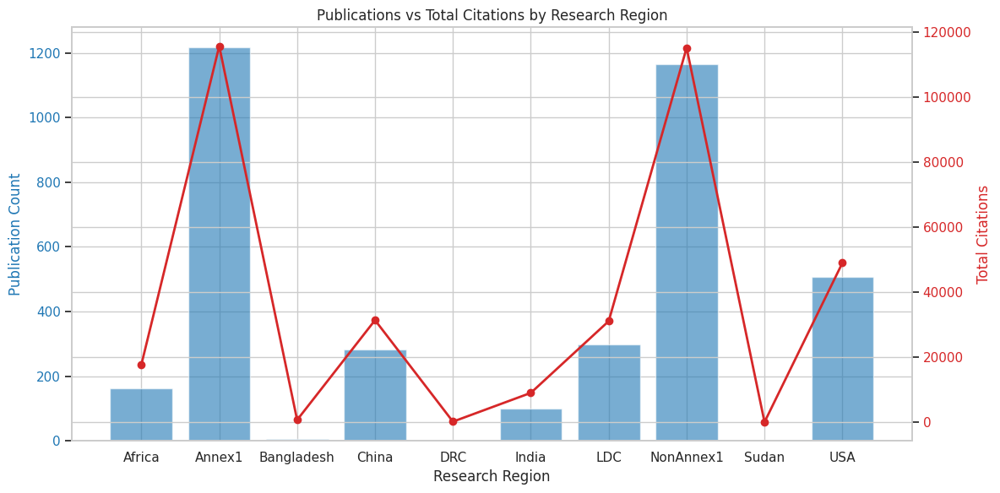

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Calculate total citations and publication count per region
total_citations = citation_test.groupby('ResearchRegion')['Citation'].sum().reset_index()
total_citations.columns = ['ResearchRegion', 'TotalCitations']

pub_counts = citation_test['ResearchRegion'].value_counts().reset_index()
pub_counts.columns = ['ResearchRegion', 'PublicationCount']

# Step 2: Merge data
citation_weighted = pd.merge(total_citations, pub_counts, on='ResearchRegion')

# Step 3: Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Left y-axis: publication count (bars)
color = 'tab:blue'
ax1.set_xlabel('Research Region')
ax1.set_ylabel('Publication Count', color=color)
ax1.bar(citation_weighted['ResearchRegion'], citation_weighted['PublicationCount'], color=color, alpha=0.6)
ax1.tick_params(axis='y', labelcolor=color)

# Right y-axis: total citations (line)
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Total Citations', color=color)
ax2.plot(citation_weighted['ResearchRegion'], citation_weighted['TotalCitations'],
         color=color, marker='o', linewidth=2)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Publications vs Total Citations by Research Region')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
drc_citations

np.float64(144.0)

In [ ]:
bangladesh_citations

np.float64(667.0)

In [ ]:
total_drc

3

In [ ]:
sudan_citations

np.float64(11.0)

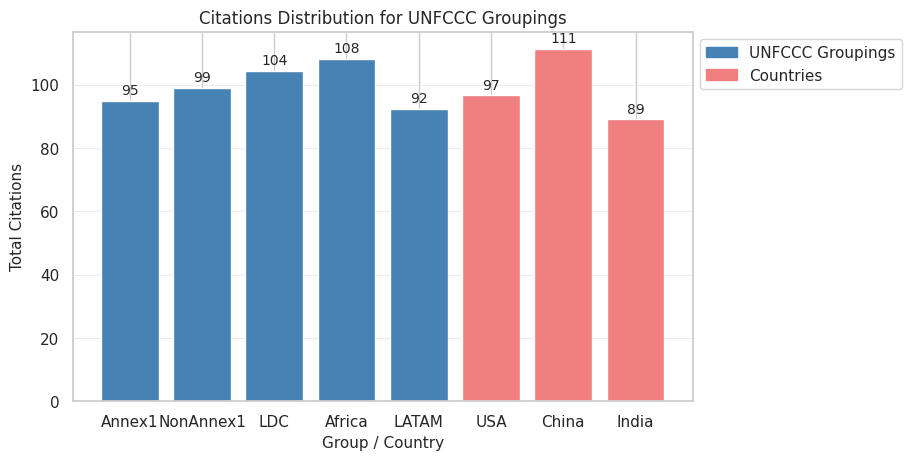

In [ ]:
# New Code - Skewness
annex1_citations_n = annex1_citations / total_annex1
non_annex1_citations_n = non_annex1_citations / total_non_annex1
ldc_citations_n = ldc_citations / total_ldc
africa_citations_n = africa_citations / total_africa
latam_citations_n = latam_citations / total_latam
usa_citations_n = usa_citations / total_usa
china_citations_n = china_citations / total_china
india_citations_n = india_citations / total_india
bangladesh_citations_n = bangladesh_citations / total_bangladesh
sudan_citations_n = sudan_citations / total_sudan
drc_citations_n = drc_citations / total_drc

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

plt.figure(figsize=(8, 4.8))
# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11, loc='upper left', bbox_to_anchor=(1, 1))

normalised_citation_counts = [annex1_citations_n, non_annex1_citations_n, ldc_citations_n, africa_citations_n, latam_citations_n, usa_citations_n, china_citations_n, india_citations_n]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India'], \
        normalised_citation_counts, color=colors)

for i, val in enumerate(normalised_citation_counts):
    plt.text(i, val + max(normalised_citation_counts)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.title('Citations Distribution for UNFCCC Groupings')
# plt.ylim(0, 60000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.savefig("normalized_total_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
print(bangladesh_citations_n, sudan_citations_n, drc_citations_n)

111.16666666666667 5.5 48.0


In [ ]:
print(non_annex1_citations_n, annex1_citations_n, ldc_citations_n, usa_citations_n, china_citations_n, india_citations_n)

98.88058419243987 94.92857142857143 104.20134228187919 96.56015779092702 111.16312056737588 88.99009900990099


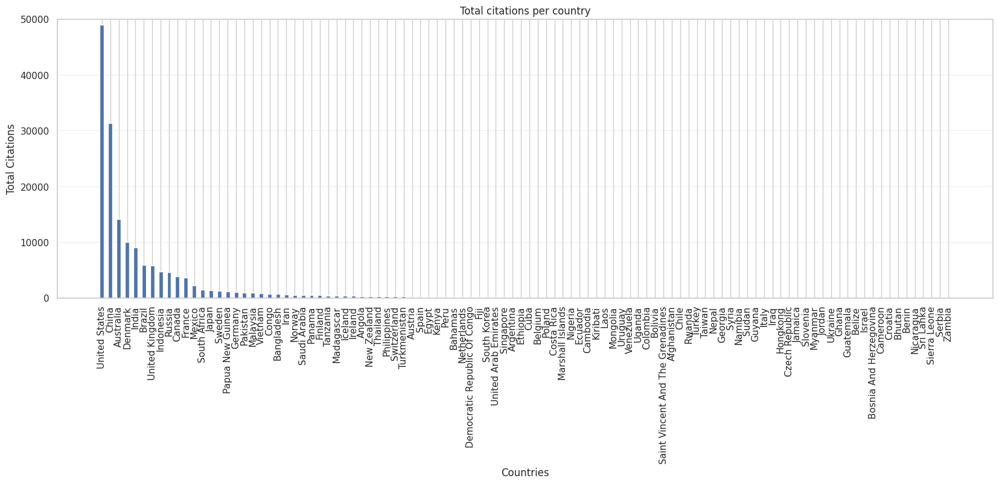

In [ ]:

# Old Code
# country_data = data_subset[~data_subset['Regions_updated'].isin(regions_to_exclude)]
# country_data = data_subset[~data_subset['Regions_updated'].isin(regions_to_exclude)]
# country_wise_citations = country_data.groupby('Regions_updated')['Citation'].sum().sort_values(ascending=False)

# # Plot the chart
# plt.figure(figsize=(20, 6))
# plt.bar(country_wise_citations.index, country_wise_citations.values, width=0.5)
# plt.xlabel('Countries')
# plt.ylabel('Total Number of Citations')
# plt.title('Number of Citations per Country')
# plt.xticks(rotation=90)
# plt.show()

# New Code - skewness
country_data = data_grouped[['DOI', 'Regions_updated', 'Citation']]
country_data = country_data.explode(['Regions_updated'])
country_data = country_data.drop_duplicates()
country_data = country_data[~country_data['Regions_updated'].isin(exclude_regions)]
all_country_citations = country_data.groupby('Regions_updated')['Citation'].sum().sort_values(ascending=False)
all_country_citations

# Plot the chart
plt.figure(figsize=(20, 6))
plt.bar(all_country_citations.index.str.title(), all_country_citations.values, width=0.5)
plt.xlabel('Countries', fontsize=12)
plt.ylabel('Total Citations', fontsize=12)
plt.title('Total citations per country')
plt.xticks(rotation=90)
plt.ylim(0, 50000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.show()

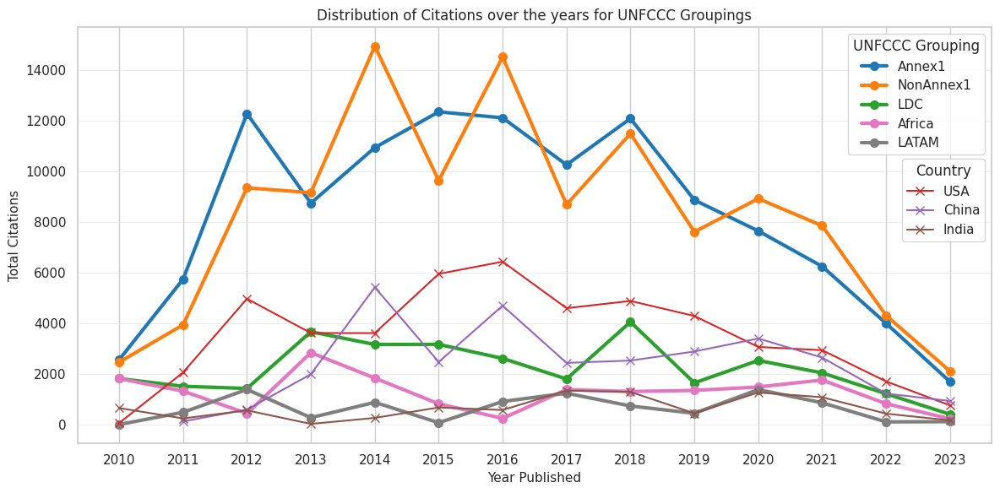

In [ ]:
# Old Code

# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_citations = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Citation'].sum()
# non_annex1_year_wise_citations = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Citation'].sum()
# ldc_year_wise_citations = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Citation'].sum()
# usa_year_wise_citations = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Citation'].sum()
# china_year_wise_citations = data_subset[data_subset['China'] == 1].groupby('Year Published')['Citation'].sum()
# india_year_wise_citations = data_subset[data_subset['India'] == 1].groupby('Year Published')['Citation'].sum()
# # brazil_year_wise_citations = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Citation'].sum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_citations.index, annex1_year_wise_citations.values, label='Annex1')
# plt.plot(non_annex1_year_wise_citations.index, non_annex1_year_wise_citations.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_citations.index, ldc_year_wise_citations.values, label='LDC')
# plt.plot(usa_year_wise_citations.index, usa_year_wise_citations.values, label='USA')
# plt.plot(china_year_wise_citations.index, china_year_wise_citations.values, label='China')
# plt.plot(india_year_wise_citations.index, india_year_wise_citations.values, label='India')
# # plt.plot(brazil_year_wise_citations.index, brazil_year_wise_citations.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Citations')
# plt.title('Distribution of Citations over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation'].sum()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(citation_counts.index, citation_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(citation_counts.index, citation_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper right', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper right', bbox_to_anchor=(1, 0.7), title='Country', fontsize=11)

# for research_region in research_regions:
#     citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Citation'].sum()
#     plt.plot(citation_counts.index, citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Citations over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.xticks(citation_counts.index)
# plt.legend(title='UNFCCC')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("yearwise_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

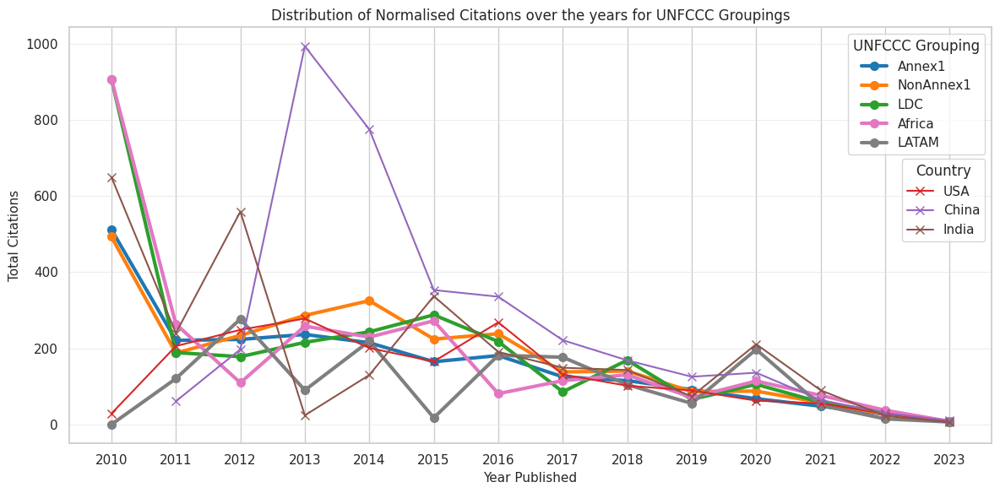

In [ ]:

# Old Code

# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_citations = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Citation'].sum()
# non_annex1_year_wise_citations = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Citation'].sum()
# ldc_year_wise_citations = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Citation'].sum()
# usa_year_wise_citations = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Citation'].sum()
# china_year_wise_citations = data_subset[data_subset['China'] == 1].groupby('Year Published')['Citation'].sum()
# india_year_wise_citations = data_subset[data_subset['India'] == 1].groupby('Year Published')['Citation'].sum()
# # brazil_year_wise_citations = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Citation'].sum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_citations.index, annex1_year_wise_citations.values, label='Annex1')
# plt.plot(non_annex1_year_wise_citations.index, non_annex1_year_wise_citations.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_citations.index, ldc_year_wise_citations.values, label='LDC')
# plt.plot(usa_year_wise_citations.index, usa_year_wise_citations.values, label='USA')
# plt.plot(china_year_wise_citations.index, china_year_wise_citations.values, label='China')
# plt.plot(india_year_wise_citations.index, india_year_wise_citations.values, label='India')
# # plt.plot(brazil_year_wise_citations.index, brazil_year_wise_citations.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Citations')
# plt.title('Distribution of Citations over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation'].sum()
    # print(research_region)
    # print(data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].nunique())
    # print(data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].count())
    publication_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].nunique()
    # print(citation_counts)
    # print(publication_counts)
    print()
    citation_norm = citation_counts / publication_counts
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(citation_norm.index, citation_norm.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(citation_norm.index, citation_norm.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper right', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper right', bbox_to_anchor=(1, 0.7), title='Country', fontsize=11)

# for research_region in research_regions:
#     citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Citation'].sum()
#     plt.plot(citation_counts.index, citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Normalised Citations over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.xticks(citation_counts.index)
# plt.legend(title='UNFCCC')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("normalized_yearwise_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

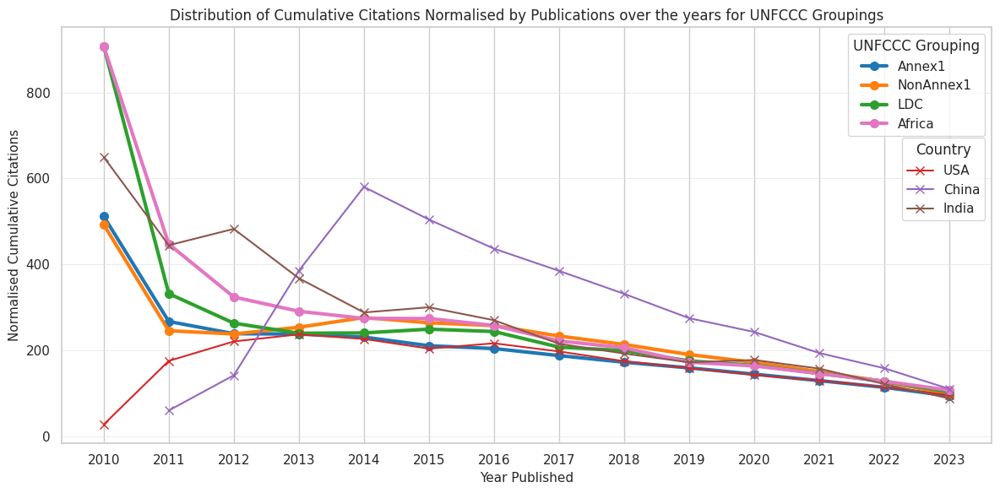

In [ ]:
# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_citations = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# non_annex1_year_wise_citations = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# ldc_year_wise_citations = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# usa_year_wise_citations = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# china_year_wise_citations = data_subset[data_subset['China'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# india_year_wise_citations = data_subset[data_subset['India'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# # brazil_year_wise_citations = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Citation'].sum().cumsum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_citations.index, annex1_year_wise_citations.values, label='Annex1')
# plt.plot(non_annex1_year_wise_citations.index, non_annex1_year_wise_citations.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_citations.index, ldc_year_wise_citations.values, label='LDC')
# plt.plot(usa_year_wise_citations.index, usa_year_wise_citations.values, label='USA')
# plt.plot(china_year_wise_citations.index, china_year_wise_citations.values, label='China')
# plt.plot(india_year_wise_citations.index, india_year_wise_citations.values, label='India')
# # plt.plot(brazil_year_wise_citations.index, brazil_year_wise_citations.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Cumulative Number of Citations')
# plt.title('Distribution of Cumulative Citations over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fix, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation'].sum().cumsum()
    cumulative_publication_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].nunique().cumsum()

    norm_cumulative_count = cumulative_citation_counts / cumulative_publication_counts
    # print(cumulative_citation_counts)
    # print(cumulative_publication_counts)
    # print(norm_cumulative_count)
    # print()

    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(norm_cumulative_count.index, norm_cumulative_count.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(norm_cumulative_count.index, norm_cumulative_count.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper right', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper right', bbox_to_anchor=(1, 0.75), title='Country', fontsize=11)

# for research_region in research_regions:
#     cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)]\
#                                                                             .groupby('Year Published')['Citation'].sum().cumsum()
#     plt.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Cumulative Citations Normalised by Publications over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Normalised Cumulative Citations', fontsize=11)
plt.xticks(norm_cumulative_count.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.ylim(0, 60000)
# plt.savefig("normalized_cumulative_yearwise_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

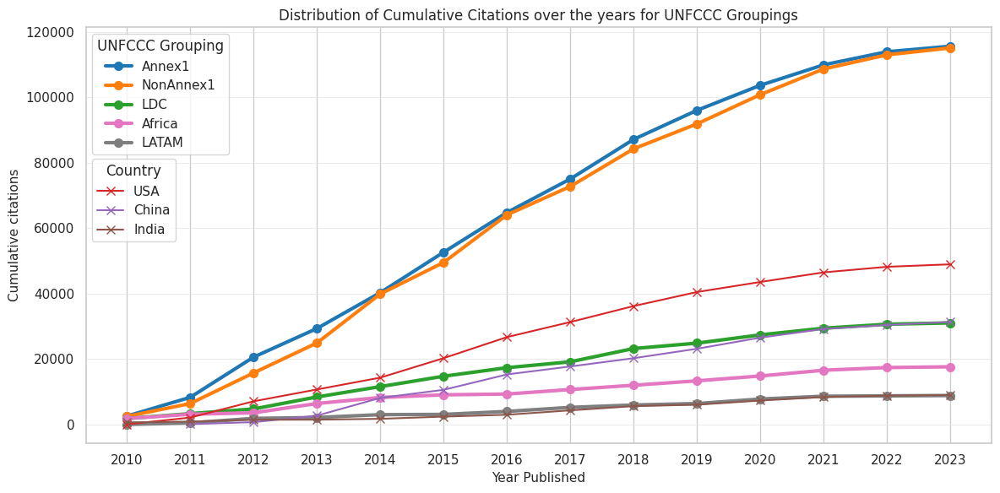

In [ ]:
# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_citations = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# non_annex1_year_wise_citations = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# ldc_year_wise_citations = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# usa_year_wise_citations = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# china_year_wise_citations = data_subset[data_subset['China'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# india_year_wise_citations = data_subset[data_subset['India'] == 1].groupby('Year Published')['Citation'].sum().cumsum()
# # brazil_year_wise_citations = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Citation'].sum().cumsum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_citations.index, annex1_year_wise_citations.values, label='Annex1')
# plt.plot(non_annex1_year_wise_citations.index, non_annex1_year_wise_citations.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_citations.index, ldc_year_wise_citations.values, label='LDC')
# plt.plot(usa_year_wise_citations.index, usa_year_wise_citations.values, label='USA')
# plt.plot(china_year_wise_citations.index, china_year_wise_citations.values, label='China')
# plt.plot(india_year_wise_citations.index, india_year_wise_citations.values, label='India')
# # plt.plot(brazil_year_wise_citations.index, brazil_year_wise_citations.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Cumulative Number of Citations')
# plt.title('Distribution of Cumulative Citations over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fix, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation'].sum().cumsum()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.7), title='Country', fontsize=11)

# for research_region in research_regions:
#     cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)]\
#                                                                             .groupby('Year Published')['Citation'].sum().cumsum()
#     plt.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Cumulative Citations over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Cumulative citations', fontsize=11)
plt.xticks(cumulative_citation_counts.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.ylim(0, 60000)
plt.savefig("cumulative_yearwise_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
df_usa = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)][['DOI', 'Year Published', 'Citation', 'ResearchRegion', 'Regions_updated']]
df_usa

,DOI,Year Published,Citation,ResearchRegion,Regions_updated
1,https://doi.org/10.1038/s41558-019-0468-y,2019,30.0,USA,[united states]
8,https://doi.org/10.1038/s41612-018-0032-x,2018,20.0,USA,[united states]
23,https://doi.org/10.1038/ncomms7599,2015,12.0,USA,[united states]
27,https://doi.org/10.1126/science.1234532,2013,0.0,USA,[united states]
32,https://doi.org/10.1038/nclimate1826,2013,81.0,USA,[united states]
...,...,...,...,...,...
3696,https://doi.org/10.1126/sciadv.adi2718,2023,0.0,USA,[united states]
3703,https://doi.org/10.1038/s43247-022-00505-7,2022,2.0,USA,[united states]
3705,https://doi.org/10.1126/sciadv.abe6417,2021,0.0,USA,[united states]
3709,https://doi.org/10.1038/s41467-021-22747-3,2021,32.0,USA,[united states]


In [ ]:
df_usa

,DOI,Year Published,Citation,ResearchRegion,Regions_updated
1,https://doi.org/10.1038/s41558-019-0468-y,2019,30.0,USA,[united states]
8,https://doi.org/10.1038/s41612-018-0032-x,2018,20.0,USA,[united states]
23,https://doi.org/10.1038/ncomms7599,2015,12.0,USA,[united states]
27,https://doi.org/10.1126/science.1234532,2013,0.0,USA,[united states]
32,https://doi.org/10.1038/nclimate1826,2013,81.0,USA,[united states]
...,...,...,...,...,...
3696,https://doi.org/10.1126/sciadv.adi2718,2023,0.0,USA,[united states]
3703,https://doi.org/10.1038/s43247-022-00505-7,2022,2.0,USA,[united states]
3705,https://doi.org/10.1126/sciadv.abe6417,2021,0.0,USA,[united states]
3709,https://doi.org/10.1038/s41467-021-22747-3,2021,32.0,USA,[united states]


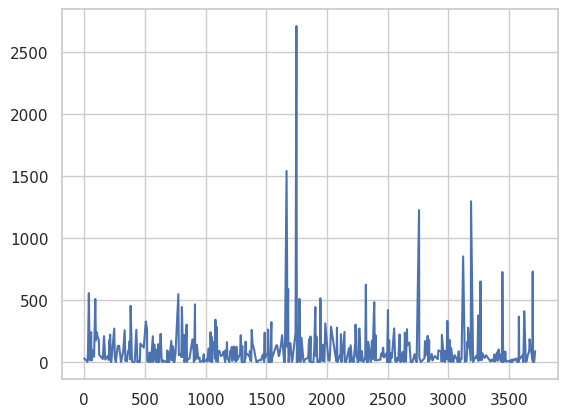

In [ ]:
plt.plot(df_usa['Citation'])

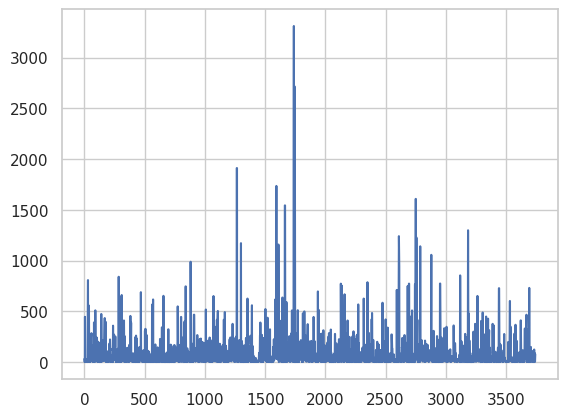

In [ ]:
plt.plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['Citation'])

In [ ]:
data_grouped.sort_values('Year Published').reset_index()

,index,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
0,1882,Increase in African dust flux at the onset of ...,Dust emissions from the Sahara/Sahel region of...,2010-07-08,2010,2010-07-08,"['Climate change', 'Environmental sciences', '...",Nature,https://doi.org/10.1038/nature09213,"['Stefan Mulitza', 'David Heslop', 'Daniela Pi...",...,208.0,0,,The Sahara Desert is the largest source of min...,We have constructed a long-term record of Afri...,,,LDC,"['Climate Impact on Ecosystems', 'Climate Just...","[africa, west africa]"
1,1883,Increase in African dust flux at the onset of ...,Dust emissions from the Sahara/Sahel region of...,2010-07-08,2010,2010-07-08,"['Climate change', 'Environmental sciences', '...",Nature,https://doi.org/10.1038/nature09213,"['Stefan Mulitza', 'David Heslop', 'Daniela Pi...",...,208.0,0,,The Sahara Desert is the largest source of min...,We have constructed a long-term record of Afri...,,,NonAnnex1,"['Climate Impact on Ecosystems', 'Climate Just...","[africa, west africa]"
2,3612,Vertical extension of the subglacial drainage ...,Water within glaciers and ice sheets has the p...,2010-09-29,2010,2010-09-29,"['Cryospheric science', 'Geology', 'Science', ...",Nature,https://doi.org/10.1038/nature09398,"['Joel T. Harper', 'John H. Bradford', 'Neil F...",...,57.0,0,,Water plays a first-order role in basal slidin...,Glacier sliding motion is frequently tied to t...,,,Annex1,Climate Impact on Ecosystems,[united states]
3,3613,Vertical extension of the subglacial drainage ...,Water within glaciers and ice sheets has the p...,2010-09-29,2010,2010-09-29,"['Cryospheric science', 'Geology', 'Science', ...",Nature,https://doi.org/10.1038/nature09398,"['Joel T. Harper', 'John H. Bradford', 'Neil F...",...,57.0,0,,Water plays a first-order role in basal slidin...,Glacier sliding motion is frequently tied to t...,,,USA,Climate Impact on Ecosystems,[united states]
4,1814,Ice-sheet acceleration driven by melt supply v...,Recent observations in Greenland have led to t...,2010-12-08,2010,2010-12-08,"['Cryospheric science', 'Science', 'Humanities...",Nature,https://doi.org/10.1038/nature09618,['Christian Schoof'],...,480.0,0,,Increased ice velocities in Greenland are con...,The effective pressure in the subglacial drain...,,,Annex1,Climate Impact on Ecosystems,[denmark]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3739,2604,Prevalence and predictors of wind energy oppos...,Local opposition poses a significant barrier t...,2023-09-25,2023,2023-09-25,"['climate change', 'renewable energy', 'energy...",PNAS,https://doi.org/10.1073/pnas.2302313120,"['Leah C. Stokes', 'Emma Franzblau', 'Jessica ...",...,0.0,0,,Addressing climate change requires societies t...,"Across North America, the electricity system i...","For the United States, we identified the popul...","Across North America, the electricity system i...",Annex1,"['Public Perception & Communication', 'Climate...","[canada, north america, united states]"
3740,2600,Present and future of the South Asian summer m...,An iconic feature of the Indian Summer Monsoon...,2023-10-25,2023,2023-10-25,"['Climate sciences', 'Projection and predictio...",npj Climate and Atmospheric Science,https://doi.org/10.1038/s41612-023-00485-1,"['Prolay Saha', 'Rahul Mahanta', 'B. N. Goswami']",...,1.0,0,,An iconic feature of the Indian Summer Monsoon...,"Traditionally, June–September (JJAS) is the ac...",The daily pressure level air temperature with ...,,NonAnnex1,"['Climate Impact on Ecosystems', 'Scientific M...",[india]
3741,407,Atmospheric modes fiddling the simulated ENSO ...,The El Niño-Southern Oscillation (ENSO) is cru...,2023-12-19,2023,2023-12-19,"['Atmospheric dynamics', 'Climate and Earth sy...",npj Climate and Atmospheric Science,https://doi.org/10.1038/s41612-023-00537-6,"['Jiuwei Zhao', 'Ruife

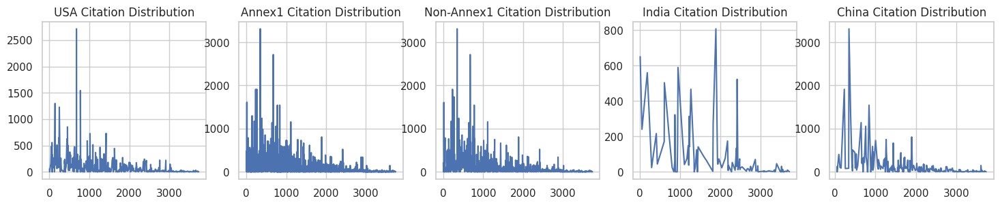

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(18, 3))
data_grouped = data_grouped.sort_values('Year Published').reset_index()
axs[0].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)]['Citation'])
axs[0].set_title("USA Citation Distribution")

axs[1].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['Citation'])
axs[1].set_title("Annex1 Citation Distribution")

axs[2].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'NonAnnex1' in x)]['Citation'])
axs[2].set_title("Non-Annex1 Citation Distribution")

axs[3].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'India' in x)]['Citation'])
axs[3].set_title("India Citation Distribution")

axs[4].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'China' in x)]['Citation'])
axs[4].set_title("China Citation Distribution")

plt.show()

In [ ]:
data_grouped[data_grouped['Citation'] > 250]

,index,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
4,1814,Ice-sheet acceleration driven by melt supply v...,Recent observations in Greenland have led to t...,2010-12-08,2010,2010-12-08,"['Cryospheric science', 'Science', 'Humanities...",Nature,https://doi.org/10.1038/nature09618,['Christian Schoof'],...,480.0,0,,Increased ice velocities in Greenland are con...,The effective pressure in the subglacial drain...,,,Annex1,Climate Impact on Ecosystems,[denmark]
8,1071,Dominant control of the South Asian monsoon by...,Heat emitted from the Tibetan plateau as dry h...,2010-01-14,2010,2010-01-14,"['Atmospheric dynamics', 'Climate change', 'Sc...",Nature,https://doi.org/10.1038/nature08707,"['William R. Boos', 'Zhiming Kuang']",...,650.0,0,,"The Tibetan plateau, like any landmass, emits ...",The Tibetan plateau has long been held to serv...,,,India,Scientific Modeling & Predictions,[india]
10,2749,Recent decline in the global land evapotranspi...,An acceleration of the global hydrological cyc...,2010-10-21,2010,2010-10-21,"['Climate change', 'Climate-change impacts', '...",Nature,https://doi.org/10.1038/nature09396,"['Martin Jung', 'Markus Reichstein', 'Philippe...",...,1607.0,0,,More than half of the solar energy absorbed by...,Land evapotranspiration (ET) is a central proc...,,,Africa,"['Climate Impact on Ecosystems', 'Scientific M...",[africa]
11,2750,Recent decline in the global land evapotranspi...,An acceleration of the global hydrological cyc...,2010-10-21,2010,2010-10-21,"['Climate change', 'Climate-change impacts', '...",Nature,https://doi.org/10.1038/nature09396,"['Martin Jung', 'Markus Reichstein', 'Philippe...",...,1607.0,0,,More than half of the solar energy absorbed by...,Land evapotranspiration (ET) is a central proc...,,,Annex1,"['Climate Impact on Ecosystems', 'Scientific M...",[australia]
12,2751,Recent decline in the global land evapotranspi...,An acceleration of the global hydrological cyc...,2010-10-21,2010,2010-10-21,"['Climate change', 'Climate-change impacts', '...",Nature,https://doi.org/10.1038/nature09396,"['Martin Jung', 'Markus Reichstein', 'Philippe...",...,1607.0,0,,More than half of the solar energy absorbed by...,Land evapotranspiration (ET) is a central proc...,,,LDC,"['Climate Impact on Ecosystems', 'Scientific M...",[africa]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2419,1502,Future global urban water scarcity and potenti...,Urbanization and climate change are together e...,2021-08-03,2021,2021-08-03,"['Environmental sciences', 'Geography', 'Water...",Nature Communications,https://doi.org/10.1038/s41467-021-25026-3,"['Chunyang He', 'Zhifeng Liu', 'Jianguo Wu', '...",...,522.0,0,,Urbanization and climate change are together e...,The world is rapidly urbanizing. From 1950 to ...,"To assess future urban water scarcity, we used...",,India,"['Adaptation & Resilience', 'Economic & Policy...",[india]
2878,645,Climate change increases cross-species viral t...,"At least 10,000 virus species have the ability...",2022-04-28,2022,2022-04-28,"['Biogeography', 'Environmental health', 'Micr...",Nature,https://doi.org/10.1038/s41586-022-04788-w,"['Colin J. Carlson', 'Gregory F. Albery', 'Cor...",...,341.0,0,,"At least 10,000 virus species have the ability...","In the face of rapid environmental change, sur...",Here we developed global maps for terrestrial ...,Our study establishes a macroecological link b...,NonAnnex1,"['Human Health & Climate Change', 'Climate Imp...","[africa, asia]"
2903,644,Climate change increases cross-species viral t...,"At least 10,000 virus species have the ability...",2022-04-28,2022,2022-04-28,"['Biogeography', 'Environmental health', 'Micr...",Nature,https://doi.org/10.1038/s41586-022-04788-w,"['Colin J. Carlson', 'Gregory F. Albery', 'Cor...",...,341.0,0,,"At least 10,000 virus species hav

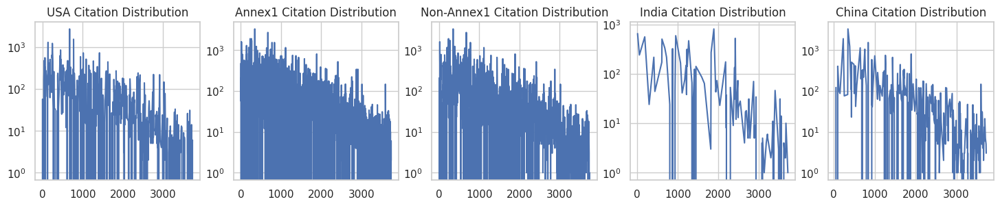

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(18, 3))
axs[0].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)]['Citation'])
axs[0].set_yscale('log')
axs[0].set_title("USA Citation Distribution")

axs[1].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['Citation'])
axs[1].set_yscale('log')
axs[1].set_title("Annex1 Citation Distribution")

axs[2].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'NonAnnex1' in x)]['Citation'])
axs[2].set_yscale('log')
axs[2].set_title("Non-Annex1 Citation Distribution")

axs[3].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'India' in x)]['Citation'])
axs[3].set_yscale('log')
axs[3].set_title("India Citation Distribution")

axs[4].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'China' in x)]['Citation'])
axs[4].set_yscale('log')
axs[4].set_title("China Citation Distribution")

plt.show()

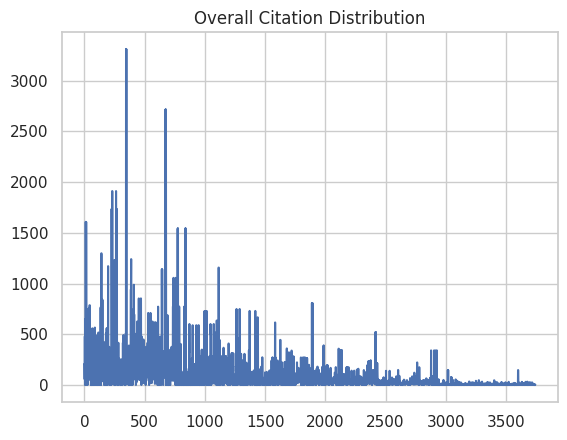

In [ ]:
plt.plot(data_grouped['Citation'])
plt.title("Overall Citation Distribution")
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x7d357d863350>,
 'caps': [<matplotlib.lines.Line2D at 0x7d357da9ccd0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7d357d861990>],
 'medians': [<matplotlib.lines.Line2D at 0x7d357db7fc50>],
 'fliers': [<matplotlib.lines.Line2D at 0x7d357db7f250>],
 'means': []}

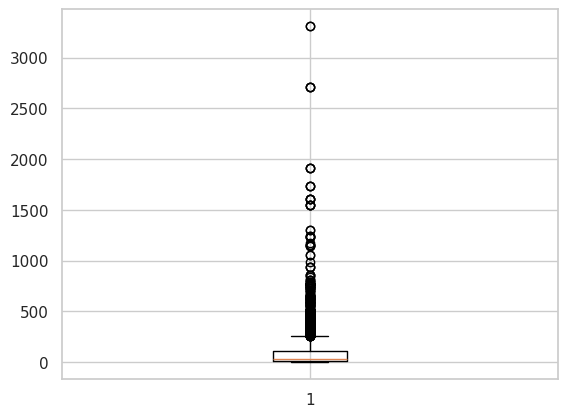

In [ ]:
plt.boxplot(data_grouped['Citation'])

In [ ]:
data_grouped['Citation'].quantile(0.90)

np.float64(243.0)

In [ ]:
data_grouped['Citation_Updated'] = data_grouped['Citation'].apply(lambda x: 243.0 if x > 243.0 else x)
data_grouped[data_grouped['Citation'] > 243.0][['Citation', 'Citation_Updated']]

,Citation,Citation_Updated
5,445.0,243.0
28,807.0,243.0
29,807.0,243.0
30,807.0,243.0
31,807.0,243.0
...,...,...
3765,466.0,243.0
3784,329.0,243.0
3785,329.0,243.0
3788,730.0,243.0


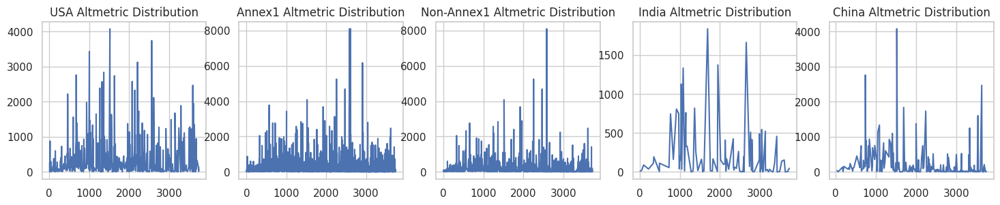

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(18, 3))
data_grouped = data_grouped.sort_values('Year Published').reset_index()
axs[0].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'USA' in x)]['Altmetric'])
axs[0].set_title("USA Altmetric Distribution")

axs[1].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'Annex1' in x)]['Altmetric'])
axs[1].set_title("Annex1 Altmetric Distribution")

axs[2].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'NonAnnex1' in x)]['Altmetric'])
axs[2].set_title("Non-Annex1 Altmetric Distribution")

axs[3].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'India' in x)]['Altmetric'])
axs[3].set_title("India Altmetric Distribution")

axs[4].plot(data_grouped[data_grouped['ResearchRegion'].apply(lambda x: 'China' in x)]['Altmetric'])
axs[4].set_title("China Altmetric Distribution")

plt.show()

In [ ]:
df_usa[df_usa['Citation'] > 1500]

,DOI,Year Published,Citation,ResearchRegion,Regions_updated
1667,https://doi.org/10.1038/nclimate3004,2016,1543.0,USA,[united states]
1748,https://doi.org/10.1038/nature20584,2016,2714.0,USA,[united states]


## Following graph is if we trim extreme values of citations

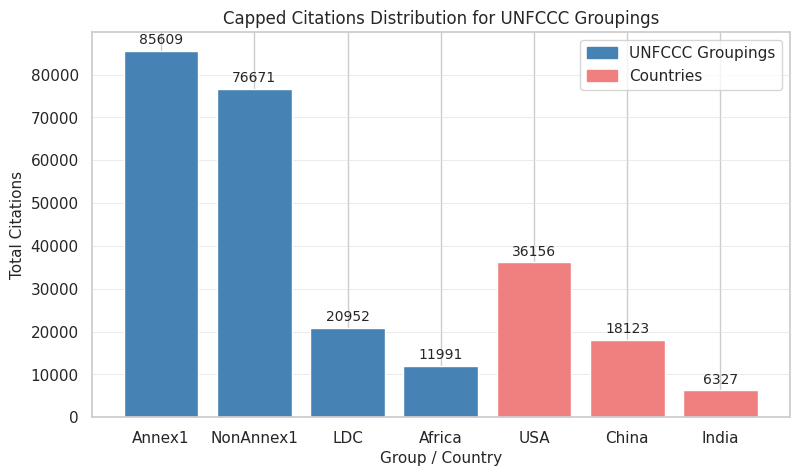

In [ ]:
# New Code - Skewness


annex1_citations = data_grouped[data_grouped['ResearchRegion'] == 'Annex1']['Citation_Updated'].sum()
non_annex1_citations = data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']['Citation_Updated'].sum()
ldc_citations = data_grouped[data_grouped['ResearchRegion'] == 'LDC']['Citation_Updated'].sum()
africa_citations = data_grouped[data_grouped['ResearchRegion'] == 'Africa']['Citation_Updated'].sum()
usa_citations = data_grouped[data_grouped['ResearchRegion'] == 'USA']['Citation_Updated'].sum()
china_citations = data_grouped[data_grouped['ResearchRegion'] == 'China']['Citation_Updated'].sum()
india_citations = data_grouped[data_grouped['ResearchRegion'] == 'India']['Citation_Updated'].sum()

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

plt.figure(figsize=(9, 5))

# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)

capped_citation_counts = [annex1_citations, non_annex1_citations, ldc_citations, africa_citations, usa_citations, china_citations, india_citations]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'USA', 'China', 'India'], \
        capped_citation_counts, color=colors)

for i, val in enumerate(capped_citation_counts):
    plt.text(i, val + max(capped_citation_counts)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.title('Capped Citations Distribution for UNFCCC Groupings')
# plt.ylim(0, 60000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
# plt.savefig("capped_total_citations.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

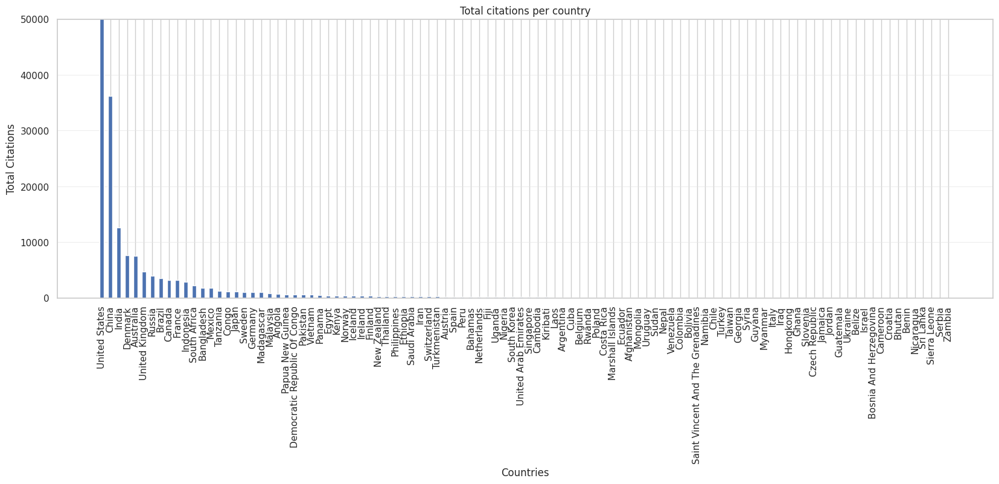

In [ ]:
# New Code - skewness
country_data = data_grouped[['Regions_updated', 'Citation_Updated']]
country_data = country_data.explode(['Regions_updated'])
country_data = country_data[~country_data['Regions_updated'].isin(exclude_regions)]
all_country_citations = country_data.groupby('Regions_updated')['Citation_Updated'].sum().sort_values(ascending=False)
all_country_citations

# Plot the chart
plt.figure(figsize=(20, 6))
plt.bar(all_country_citations.index.str.title(), all_country_citations.values, width=0.5)
plt.xlabel('Countries', fontsize=12)
plt.ylabel('Total Citations', fontsize=12)
plt.title('Total citations per country')
plt.xticks(rotation=90)
plt.ylim(0, 50000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.show()

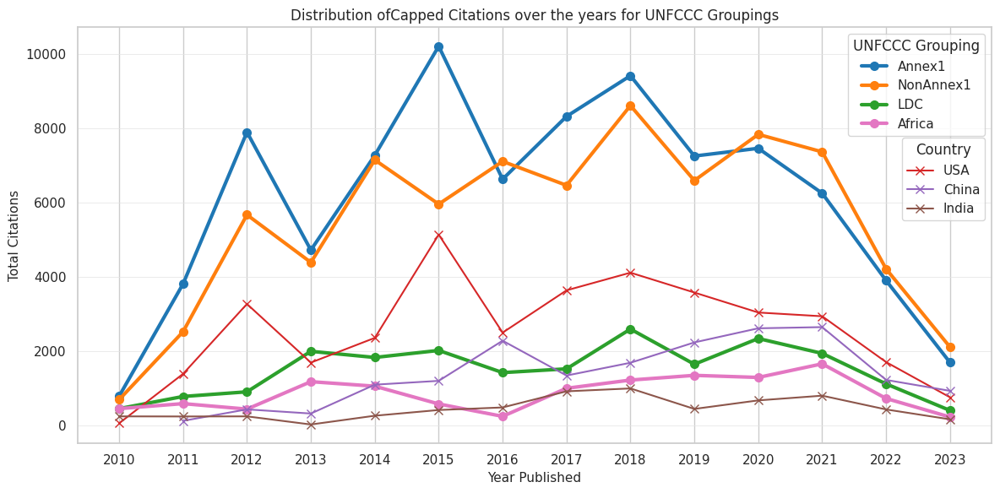

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation_Updated'].sum()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(citation_counts.index, citation_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(citation_counts.index, citation_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper right', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper right', bbox_to_anchor=(1, 0.75), title='Country', fontsize=11)

# for research_region in research_regions:
#     citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Citation'].sum()
#     plt.plot(citation_counts.index, citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution ofCapped Citations over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Citations', fontsize=11)
plt.xticks(citation_counts.index)
# plt.legend(title='UNFCCC')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.show()

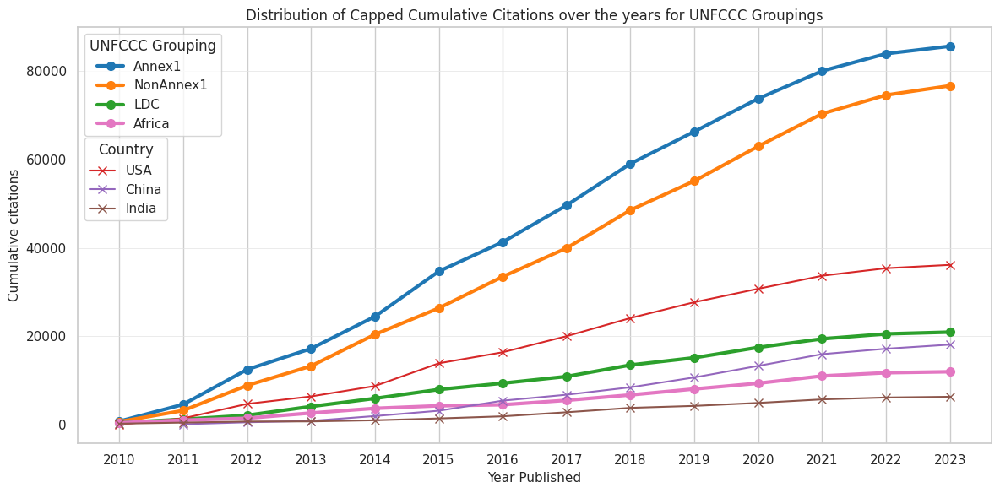

In [ ]:
fix, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Citation_Updated'].sum().cumsum()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.75), title='Country', fontsize=11)

# for research_region in research_regions:
#     cumulative_citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)]\
#                                                                             .groupby('Year Published')['Citation'].sum().cumsum()
#     plt.plot(cumulative_citation_counts.index, cumulative_citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Capped Cumulative Citations over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Cumulative citations', fontsize=11)
plt.xticks(cumulative_citation_counts.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.ylim(0, 60000)
# plt.savefig("capped_citations_cumulative_yearwise.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

# Altmetric Analysis

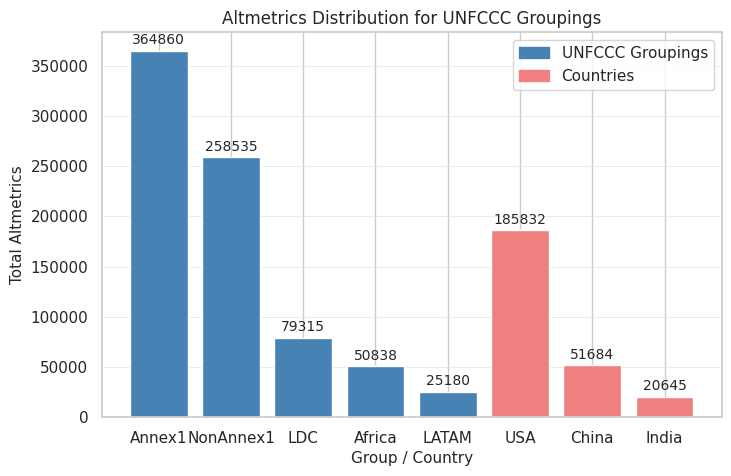

In [ ]:
# Old Code
# annex1_altmetric = data_subset.groupby('Annex1')['Altmetric'].sum()[1]
# non_annex1_altmetric = data_subset.groupby('NonAnnex1')['Altmetric'].sum()[1]
# ldc_altmetric = data_subset.groupby('LDC')['Altmetric'].sum()[1]
# usa_altmetric = data_subset.groupby('USA')['Altmetric'].sum()[1]
# china_altmetric = data_subset.groupby('China')['Altmetric'].sum()[1]
# india_altmetric = data_subset.groupby('India')['Altmetric'].sum()[1]
# # brazil_altmetric = data_subset.groupby('Brazil')['Altmetric'].sum()[1]

# plt.bar(['USA', 'NonAnnex1', 'Annex1', 'China', 'India', 'LDC'], \
#         [usa_altmetric, non_annex1_altmetric, annex1_altmetric, china_altmetric, india_altmetric, ldc_altmetric])
# plt.xlabel('Region')
# plt.ylabel('Total number of Altmetrics')
# plt.title('Region-Wise Altmetrics Distribution')
# plt.show()

annex1_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'Annex1']['Altmetric'].sum()
non_annex1_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'NonAnnex1']['Altmetric'].sum()
ldc_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'LDC']['Altmetric'].sum()
africa_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'Africa']['Altmetric'].sum()
latam_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'LATAM']['Altmetric'].sum()
usa_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'USA']['Altmetric'].sum()
china_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'China']['Altmetric'].sum()
india_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'India']['Altmetric'].sum()
bangladesh_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'Bangladesh']['Altmetric'].sum()
sudan_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'Sudan']['Altmetric'].sum()
drc_altmetric = data_grouped[data_grouped['ResearchRegion'] == 'DRC']['Altmetric'].sum()

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

plt.figure(figsize=(8, 5))
# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)

altmetric_counts = [annex1_altmetric, non_annex1_altmetric, ldc_altmetric, africa_altmetric, latam_altmetric, usa_altmetric, china_altmetric, india_altmetric]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India'], \
        altmetric_counts, color=colors)

for i, val in enumerate(altmetric_counts):
    plt.text(i, val + max(altmetric_counts)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Total Altmetrics', fontsize=11)
plt.title('Altmetrics Distribution for UNFCCC Groupings')
# plt.ylim(0, 160000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.savefig("total_altmetrics.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
bangladesh_altmetric

np.float64(1223.0)

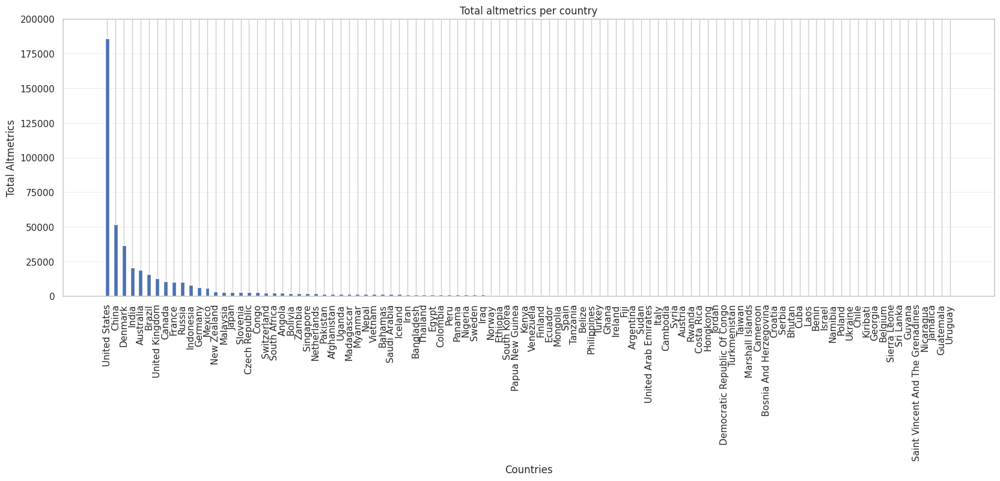

In [ ]:
# country_data = data_subset[~data_subset['Regions_updated'].isin(regions_to_exclude)]
# country_wise_altmetric = country_data.groupby('Regions_updated')['Altmetric'].sum().sort_values(ascending=False)

# # Plot the chart
# plt.figure(figsize=(20, 6))
# plt.bar(country_wise_altmetric.index, country_wise_altmetric.values, width=0.5)
# plt.xlabel('Countries')
# plt.ylabel('Total Number of Altmetrics')
# plt.title('Number of Altmetrics per Country')
# plt.xticks(rotation=90)
# plt.show()

# New Code - skewness
country_data = data_grouped[['DOI', 'Regions_updated', 'Altmetric']]
country_data = country_data.explode(['Regions_updated'])
country_data = country_data.drop_duplicates()
country_data = country_data[~country_data['Regions_updated'].isin(exclude_regions)]
all_country_altmetrics = country_data.groupby('Regions_updated')['Altmetric'].sum().sort_values(ascending=False)
all_country_altmetrics

# Plot the chart
plt.figure(figsize=(20, 6))
plt.bar(all_country_altmetrics.index.str.title(), all_country_altmetrics.values, width=0.5)
plt.xlabel('Countries', fontsize=12)
plt.ylabel('Total Altmetrics', fontsize=12)
plt.title('Total altmetrics per country')
plt.xticks(rotation=90)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.ylim(0, 200000)
plt.show()

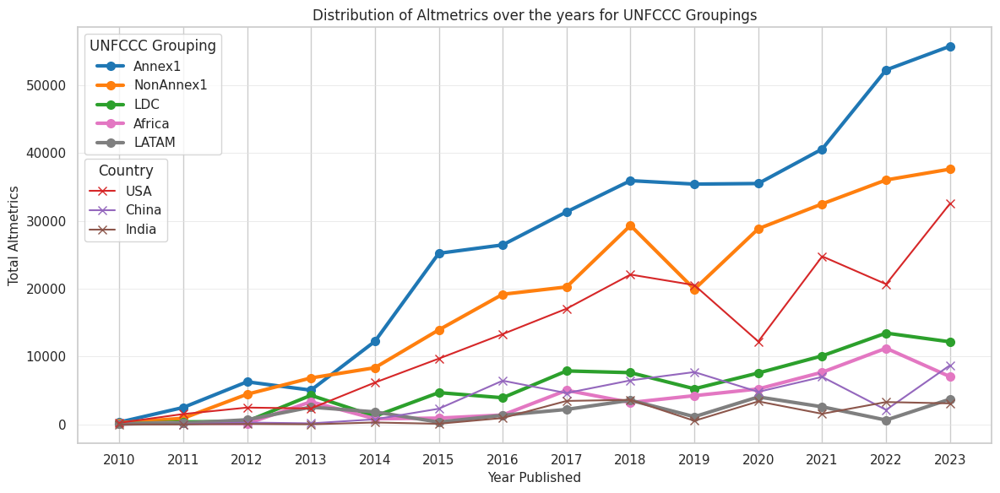

In [ ]:
# Old Code
# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_altmetrics = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Altmetric'].sum()
# non_annex1_year_wise_altmetrics = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Altmetric'].sum()
# ldc_year_wise_altmetrics = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Altmetric'].sum()
# usa_year_wise_altmetrics = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Altmetric'].sum()
# china_year_wise_altmetrics = data_subset[data_subset['China'] == 1].groupby('Year Published')['Altmetric'].sum()
# india_year_wise_altmetrics = data_subset[data_subset['India'] == 1].groupby('Year Published')['Altmetric'].sum()
# # brazil_year_wise_altmetrics = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Altmetric'].sum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_altmetrics.index, annex1_year_wise_altmetrics.values, label='Annex1')
# plt.plot(non_annex1_year_wise_altmetrics.index, non_annex1_year_wise_altmetrics.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_altmetrics.index, ldc_year_wise_altmetrics.values, label='LDC')
# plt.plot(usa_year_wise_altmetrics.index, usa_year_wise_altmetrics.values, label='USA')
# plt.plot(china_year_wise_altmetrics.index, china_year_wise_altmetrics.values, label='China')
# plt.plot(india_year_wise_altmetrics.index, india_year_wise_altmetrics.values, label='India')
# # plt.plot(brazil_year_wise_altmetrics.index, brazil_year_wise_altmetrics.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Altmetrics')
# plt.title('Distribution of Altmetrics over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    altmetric_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Altmetric'].sum()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(altmetric_counts.index, altmetric_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(altmetric_counts.index, altmetric_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.7), title='Country', fontsize=11)

# for research_region in research_regions:
#     altmetric_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Altmetric'].sum()
#     plt.plot(altmetric_counts.index, altmetric_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Altmetrics over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Altmetrics', fontsize=11)
plt.xticks(altmetric_counts.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.ylim(0, 25000)
plt.savefig("yearwise_altmetrics.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

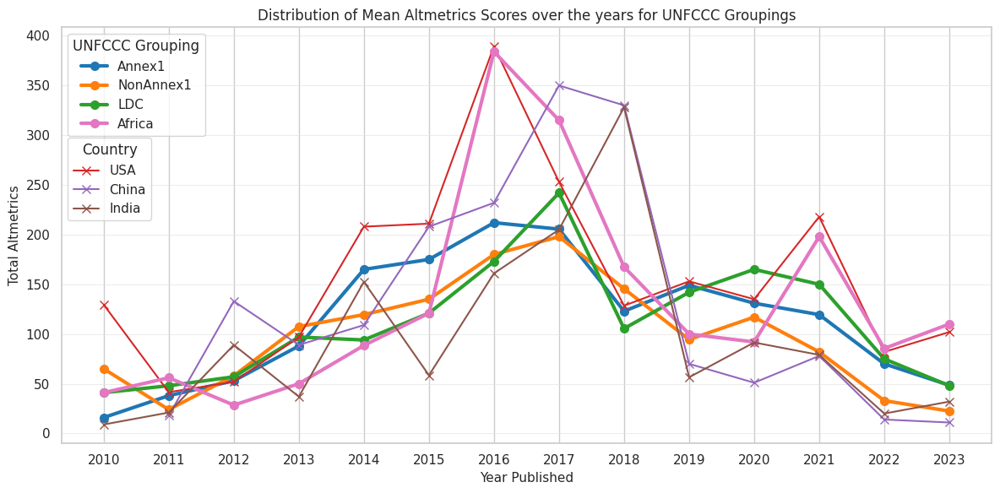

In [ ]:
# Old Code
# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_altmetrics = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Altmetric'].sum()
# non_annex1_year_wise_altmetrics = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Altmetric'].sum()
# ldc_year_wise_altmetrics = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Altmetric'].sum()
# usa_year_wise_altmetrics = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Altmetric'].sum()
# china_year_wise_altmetrics = data_subset[data_subset['China'] == 1].groupby('Year Published')['Altmetric'].sum()
# india_year_wise_altmetrics = data_subset[data_subset['India'] == 1].groupby('Year Published')['Altmetric'].sum()
# # brazil_year_wise_altmetrics = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Altmetric'].sum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_altmetrics.index, annex1_year_wise_altmetrics.values, label='Annex1')
# plt.plot(non_annex1_year_wise_altmetrics.index, non_annex1_year_wise_altmetrics.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_altmetrics.index, ldc_year_wise_altmetrics.values, label='LDC')
# plt.plot(usa_year_wise_altmetrics.index, usa_year_wise_altmetrics.values, label='USA')
# plt.plot(china_year_wise_altmetrics.index, china_year_wise_altmetrics.values, label='China')
# plt.plot(india_year_wise_altmetrics.index, india_year_wise_altmetrics.values, label='India')
# # plt.plot(brazil_year_wise_altmetrics.index, brazil_year_wise_altmetrics.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Altmetrics')
# plt.title('Distribution of Altmetrics over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    altmetric_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Altmetric'].median()
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(altmetric_counts.index, altmetric_counts.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(altmetric_counts.index, altmetric_counts.values, marker='o', markersize=7, linewidth=3, label=research_region, color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.75), title='Country', fontsize=11)

# for research_region in research_regions:
#     altmetric_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Altmetric'].sum()
#     plt.plot(altmetric_counts.index, altmetric_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Mean Altmetrics Scores over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Altmetrics', fontsize=11)
plt.xticks(altmetric_counts.index)
# plt.legend(title='Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.ylim(0, 25000)
# plt.savefig("median_yearwise_altmetrics.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

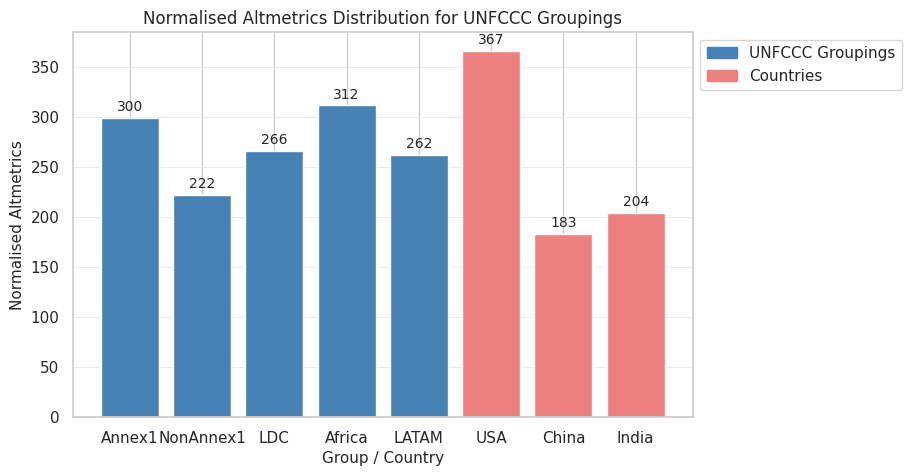

In [ ]:
# New Code - Skewness
annex1_altmetrics_n = annex1_altmetric / total_annex1
non_annex1_altmetrics_n = non_annex1_altmetric / total_non_annex1
ldc_altmetrics_n = ldc_altmetric / total_ldc
africa_altmetrics_n = africa_altmetric / total_africa
latam_altmetrics_n = latam_altmetric / total_latam
usa_altmetrics_n = usa_altmetric / total_usa
china_altmetrics_n = china_altmetric / total_china
india_altmetrics_n = india_altmetric / total_india

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

plt.figure(figsize=(8, 5))
# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11, loc='upper left', bbox_to_anchor=(1, 1))

normalized_altmetric_counts = [annex1_altmetrics_n, non_annex1_altmetrics_n, ldc_altmetrics_n, africa_altmetrics_n, latam_altmetrics_n, usa_altmetrics_n, china_altmetrics_n, india_altmetrics_n]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India'], \
        normalized_altmetric_counts, color=colors)

for i, val in enumerate(normalized_altmetric_counts):
    plt.text(i, val + max(normalized_altmetric_counts)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Normalised Altmetrics', fontsize=11)
plt.title('Normalised Altmetrics Distribution for UNFCCC Groupings')
# plt.ylim(0, 60000)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.savefig("normalized_altmetrics.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
print(annex1_altmetrics_n, non_annex1_altmetrics_n, ldc_altmetrics_n, usa_altmetrics_n, china_altmetrics_n, india_altmetrics_n)

299.5566502463054 222.1091065292096 266.1577181208054 366.5325443786982 183.27659574468086 204.40594059405942


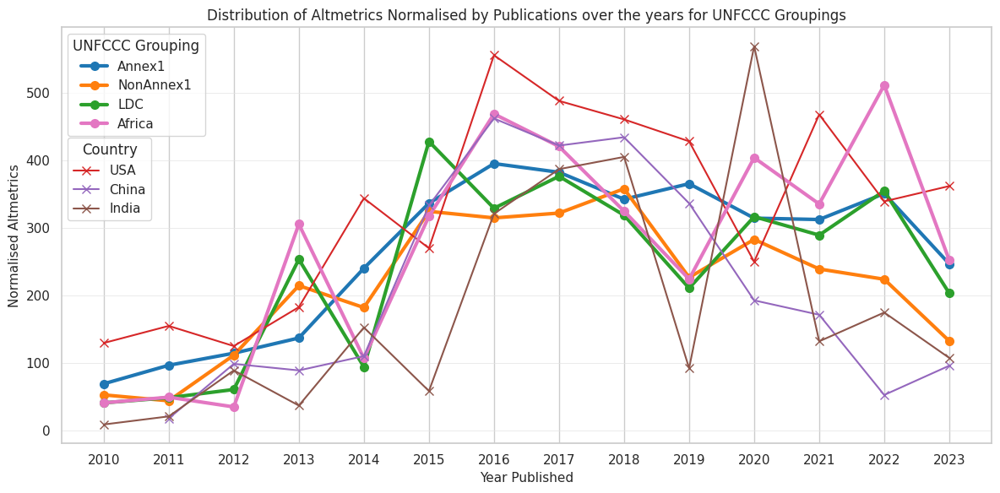

In [ ]:
# Old Code

# # Group by 'Year Published' and sum the binary columns
# annex1_year_wise_citations = data_subset[data_subset['Annex1'] == 1].groupby('Year Published')['Citation'].sum()
# non_annex1_year_wise_citations = data_subset[data_subset['NonAnnex1'] == 1].groupby('Year Published')['Citation'].sum()
# ldc_year_wise_citations = data_subset[data_subset['LDC'] == 1].groupby('Year Published')['Citation'].sum()
# usa_year_wise_citations = data_subset[data_subset['USA'] == 1].groupby('Year Published')['Citation'].sum()
# china_year_wise_citations = data_subset[data_subset['China'] == 1].groupby('Year Published')['Citation'].sum()
# india_year_wise_citations = data_subset[data_subset['India'] == 1].groupby('Year Published')['Citation'].sum()
# # brazil_year_wise_citations = data_subset[data_subset['Brazil'] == 1].groupby('Year Published')['Citation'].sum()

# plt.figure(figsize=(15, 6))
# plt.plot(annex1_year_wise_citations.index, annex1_year_wise_citations.values, label='Annex1')
# plt.plot(non_annex1_year_wise_citations.index, non_annex1_year_wise_citations.values, label='NonAnnex1')
# plt.plot(ldc_year_wise_citations.index, ldc_year_wise_citations.values, label='LDC')
# plt.plot(usa_year_wise_citations.index, usa_year_wise_citations.values, label='USA')
# plt.plot(china_year_wise_citations.index, china_year_wise_citations.values, label='China')
# plt.plot(india_year_wise_citations.index, india_year_wise_citations.values, label='India')
# # plt.plot(brazil_year_wise_citations.index, brazil_year_wise_citations.values, label='Brazil')

# plt.xlabel('Year Published')
# plt.ylabel('Total Number of Citations')
# plt.title('Distribution of Citations over the Years')
# plt.legend()
# plt.show()

# New Code - Skewness

fig, ax = plt.subplots(figsize=(12, 6))

region_handles = []
country_handles = []

for research_region in research_regions:
    altmetric_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['Altmetric'].sum()
    publication_counts = data_grouped[data_grouped['ResearchRegion'] == research_region].groupby('Year Published')['DOI'].nunique()
    # print(altmetric_counts)
    # print(publication_counts)
    # print()
    altmetric_norm = altmetric_counts / publication_counts
    if research_region in ['USA', 'China', 'India']:
        line, = ax.plot(altmetric_norm.index, altmetric_norm.values, marker='x', markersize=7, linewidth=1.5, label=research_region, color=region_palette[research_region])
        country_handles.append(line)
    else:
        line, = ax.plot(altmetric_norm.index, altmetric_norm.values, marker='o', markersize=7, linewidth=3, label=research_region,color=region_palette[research_region])
        region_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.75), title='Country', fontsize=11)

# for research_region in research_regions:
#     citation_counts = data_grouped[data_grouped['ResearchRegion'].apply(lambda x: research_region in x)].groupby('Year Published')['Citation'].sum()
#     plt.plot(citation_counts.index, citation_counts.values, marker='o', markersize=3, linewidth=1.5, label=research_region)

plt.title('Distribution of Altmetrics Normalised by Publications over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Normalised Altmetrics', fontsize=11)
plt.xticks(altmetric_norm.index)
# plt.legend(title='UNFCCC')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
# plt.savefig("normalized_yearwise_altmetrics.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# #NER

# def extract_country(address):
#     # Process the address with spaCy
#     doc = NER(address)

#     # Extract countries from named entities
#     countries = [ent.text for ent in doc.ents if ent.label_ == "GPE"]

#     print(countries)

#     # Check if any country names were extracted
#     if countries:
#         return countries[-1]  # Assuming the last entity found is the country
#     else:
#         return None

In [ ]:
# extract_country("School of Geographical Sciences and Cabot Institute for the Environment, University of Bristol, Bristol, UK")

# Publications vs Altmetrics

In [ ]:
# data_subset = exploded_data[exploded_data['Global'] != 1]
# data_subset.shape

In [ ]:
# annex1_altmetric = data_subset.groupby('Annex1')['Altmetric'].sum()[1]
# non_annex1_altmetric = data_subset.groupby('NonAnnex1')['Altmetric'].sum()[1]
# ldc_altmetric = data_subset.groupby('LDC')['Altmetric'].sum()[1]
# usa_altmetric= data_subset.groupby('USA')['Altmetric'].sum()[1]
# china_altmetric = data_subset.groupby('China')['Altmetric'].sum()[1]
# india_altmetric = data_subset.groupby('India')['Altmetric'].sum()[1]
# # brazil_altmetric = data_subset.groupby('Brazil')['Altmetric'].sum()[1]

# plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India'], \
#         [annex1_altmetric, non_annex1_altmetric, ldc_altmetric, usa_altmetric, china_altmetric, india_altmetric])
# plt.xlabel('Region')
# plt.ylabel('Total number of Altmetrics')
# plt.title('Region-Wise Altmetrics Distribution')
# plt.show()

In [ ]:
# annex1_altmetric_scatter = data_subset[data_subset['Annex1'] == 1]['Altmetric']
# non_annex1_altmetric_scatter = data_subset[data_subset['NonAnnex1'] == 1]['Altmetric']
# ldc_altmetric_scatter = data_subset[data_subset['LDC'] == 1]['Altmetric']
# usa_altmetric_scatter = data_subset[data_subset['USA'] == 1]['Altmetric']
# china_altmetric_scatter = data_subset[data_subset['China'] == 1]['Altmetric']
# india_altmetric_scatter = data_subset[data_subset['India'] == 1]['Altmetric']
# # brazil_altmetric_scatter = data_subset[data_subset['Brazil'] == 1]['Altmetric']

In [ ]:
# # Calculate total number of publications and altmetrics for each region
# region_data = []

# # Loop through the region columns and calculate total publications and altmetric scores
# for region in ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']:  # Add more region columns as needed
#     total_publications = data_subset[region].sum()
#     total_altmetric = data_subset.loc[data_subset[region] == 1, 'Altmetric'].sum()
#     region_data.append({'Region': region, 'Number of Publications': total_publications, 'Altmetric': total_altmetric})

# # Create a new DataFrame from the results
# region_df = pd.DataFrame(region_data)

# # Create a scatter plot
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=region_df, x='Number of Publications', y='Altmetric', hue='Region', palette='Set1', s=100)

# # Add labels and title
# plt.xlabel('Number of Publications')
# plt.ylabel('Altmetric')
# plt.title('Altmetric vs Number of Publications by Region')
# plt.legend(title='Region')
# plt.show()

In [ ]:
# # Calculate total number of publications and altmetrics for each region
# region_data = []

# # Loop through the region columns and calculate total publications and altmetric scores
# for region in ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']:  # Add more region columns as needed
#     total_publications = data_subset[region].sum()
#     total_altmetric = data_subset.loc[data_subset[region] == 1, 'Altmetric'].sum()
#     region_data.append({'Region': region, 'Number of Publications': total_publications, 'Altmetric': total_altmetric})

# # Create a new DataFrame from the results
# region_df = pd.DataFrame(region_data)

# # Create a scatter plot
# plt.figure(figsize=(10, 6))
# sns.barplot(data=region_df, x='Number of Publications', y='Altmetric', hue='Region')

# # Add labels and title
# plt.xlabel('Number of Publications')
# plt.ylabel('Altmetric')
# plt.title('Altmetric vs Number of Publications by Region')
# plt.legend(title='Region')
# plt.show()

# Author Analysis

In [ ]:
# data_subset = exploded_data[exploded_data['Global'] != 1]
data_subset.shape

(5384, 23)

In [ ]:
data_grouped.groupby(['DOI'])['ResearchRegion'].count().reset_index().sort_values('ResearchRegion', ascending=False).head(10)

,DOI,ResearchRegion
1656,https://doi.org/10.1126/sciadv.1602602,7
1075,https://doi.org/10.1038/s41558-022-01576-2,6
79,https://doi.org/10.1038/nature21403,6
1119,https://doi.org/10.1038/s41586-020-2448-9,6
1218,https://doi.org/10.1038/s41612-019-0094-4,6
1619,https://doi.org/10.1073/pnas.2305427120,6
976,https://doi.org/10.1038/s41558-020-00958-8,6
523,https://doi.org/10.1038/s41467-019-10876-9,6
653,https://doi.org/10.1038/s41467-021-23584-0,6
679,https://doi.org/10.1038/s41467-021-26692-z,6


In [ ]:
data_grouped[data_grouped['DOI'] == 'https://doi.org/10.1126/sciadv.1602602']

,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
3647,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,Africa,"['Climate Impact on Ecosystems', 'Economic & P...","[sierra leone, democratic republic of congo, m..."
3648,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,Bangladesh,"['Climate Impact on Ecosystems', 'Economic & P...",[bangladesh]
3649,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,DRC,"['Climate Impact on Ecosystems', 'Economic & P...",[democratic republic of congo]
3650,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,India,"['Climate Impact on Ecosystems', 'Economic & P...",[india]
3651,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,LATAM,"['Climate Impact on Ecosystems', 'Economic & P...","[brazil, peru]"
3652,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,LDC,"['Climate Impact on Ecosystems', 'Economic & P...","[laos, democratic republic of congo, banglades..."
3653,Unsustainable development pathways caused by t...,,2017-07-12,2017,2017-07-12,environmental studies,Science Advances,https://doi.org/10.1126/sciadv.1602602,"['Luis Roman Carrasco', 'Thi Phuong Le Nghiem'...","['Luis Roman Carrasco', 'Thi Phuong Le Nghiem']",...,0.0,0,,Global sustainability strategies require asses...,The world has observed marked gains in economi...,,The world has observed marked gains in economi...,NonAnnex1,"['Climate Impact on Ecosystems', 'Economic & P...","[laos, sri lanka, peru, democratic republic of..."


In [ ]:
all_authors = data_grouped.copy()
all_authors['Authors'] = all_authors['Authors'].apply(ast.literal_eval)
all_authors = all_authors['Authors']
author_count = []
for author in all_authors:
  for each_author in author:
    if each_author not in author_count:
      # print(each_author)
      author_count.append(each_author)
all_authors

,Authors
0,"[Lydia J. S. Vaughn, Margaret S. Torn]"
1,"[Lydia J. S. Vaughn, Margaret S. Torn]"
2,"[Martin Melles, Julie Brigham-Grette, Pavel S...."
3,"[Samuel Bartusek, Kai Kornhuber, Mingfang Ting]"
4,"[Samuel Bartusek, Kai Kornhuber, Mingfang Ting]"
...,...
3835,"[Antonios Mamalakis, James T. Randerson, Jin-Y..."
3836,"[Váleri N. Vásquez, Lara M. Kueppers, Gordana ..."
3837,"[Váleri N. Vásquez, Lara M. Kueppers, Gordana ..."
3838,"[Caroline M. Wainwright, John H. Marsham, Rich..."


In [ ]:
len(author_count)

12811

In [ ]:
data_author = data_grouped.groupby(['DOI', 'AuthorCountry', 'Year Published'])['ResearchRegion'].unique().reset_index()
data_author['AuthorCountry'] = data_author['AuthorCountry'].apply(ast.literal_eval)

In [ ]:
data_author[data_author['DOI'] == 'https://doi.org/10.1038/s41558-022-01576-2']

,DOI,AuthorCountry,Year Published,ResearchRegion
1075,https://doi.org/10.1038/s41558-022-01576-2,"{'Greg Muttitt': 'Switzerland', 'James Price':...",2023,"[Africa, Annex1, China, India, NonAnnex1, USA]"


In [ ]:
# country_data = data_subset[~data_subset['Regions_updated'].isin(non_annex1_regions + other_regions)]
# country_counter = Counter()
# for author_dict in data_subset['AuthorCountry']:
#   for author, country in author_dict.items():
#     if country:  # Ensure the country is not None
#       standardized_country = country_mapping.get(country, country)
#       if country not in non_annex1_regions + other_regions:
#         country_counter[standardized_country] += 1

In [ ]:
# # country_counts = pd.DataFrame.from_dict(country_counter, orient='index', columns=['Count'])

# # Sort the DataFrame by the count
# # country_counts = country_counts.sort_values(by='Count', ascending=False)

# # Convert the counter to a sorted list of tuples for plotting
# country_counts = sorted(country_counter.items(), key=lambda x: x[1], reverse=True)

# # Extract the countries and their counts
# countries, counts = zip(*country_counts)

# # Plot the bar graph
# plt.figure(figsize=(24, 6))
# # country_counts.plot(kind='bar', legend=False)
# plt.bar(countries, counts, width=0.5)
# plt.title('Number of Authors by Country')
# plt.xlabel('Country')
# plt.ylabel('Number of Authors')
# plt.xticks(rotation=90)
# plt.show()

In [ ]:
data_grouped[data_grouped['DOI'] == 'https://doi.org/10.1126/science.1222135']

,Title,Description,Date Published,Year Published,Date Modified,Keywords,Journal,DOI,Authors,CorrespondingAuthors,...,Citation,Downloads,Other Metrics,Abstract,Text,Methods,Conclusions,ResearchRegion,Theme,Regions_updated
2,2.8 Million Years of Arctic Climate Change fro...,The high-northern latitudes of the Arctic have...,2012-06-21,2012,2012-06-21,atmos,Science,https://doi.org/10.1126/science.1222135,"['Martin Melles', 'Julie Brigham-Grette', 'Pav...",['Martin Melles'],...,0.0,0,,The reliability of Arctic climate predictions ...,\n,,\n,Annex1,Scientific Modeling & Predictions,[russia]


In [ ]:
# data_author = data_author[data_author['DOI'] == 'https://doi.org/10.1126/science.1222135']
# data_author = data_author.head(20)

In [ ]:
data_author[data_author['DOI'] == 'https://doi.org/10.1038/nature08707']

,DOI,AuthorCountry,Year Published,ResearchRegion
0,https://doi.org/10.1038/nature08707,"{'William R. Boos': None, 'Zhiming Kuang': None}",2010,"[India, NonAnnex1]"


In [ ]:
list(data_author['AuthorCountry'])

[{'William R. Boos': None, 'Zhiming Kuang': None},
 {'Cristian Gudasz': 'Sweden',
  'David Bastviken': 'Sweden',
  'Kristin Steger': 'Sweden',
  'Katrin Premke': 'Sweden',
  'Sebastian Sobek': 'Sweden',
  'Lars J. Tranvik': 'Sweden'},
 {'Stefan Mulitza': 'Germany',
  'David Heslop': 'Germany',
  'Daniela Pittauerova': 'Germany',
  'Helmut W. Fischer': 'Germany',
  'Inka Meyer': 'Germany',
  'Jan-Berend Stuut': 'Germany',
  'Matthias Zabel': 'Germany',
  'Gesine Mollenhauer': 'Germany',
  'James A. Collins': 'Germany',
  'Henning Kuhnert': 'Germany',
  'Michael Schulz': 'Germany'},
 {'Martin Jung': 'Germany',
  'Markus Reichstein': 'Germany',
  'Philippe Ciais': 'France',
  'Sonia I. Seneviratne': 'Switzerland',
  'Justin Sheffield': 'USA',
  'Michael L. Goulden': None,
  'Gordon Bonan': 'USA',
  'Alessandro Cescatti': 'Italy',
  'Jiquan Chen': 'USA',
  'Richard de Jeu': 'Netherlands',
  'A. Johannes Dolman': 'Netherlands',
  'Werner Eugster': 'Switzerland',
  'Dieter Gerten': 'Germany'

In [ ]:
data_none_countries = pd.read_csv("author_none_updated.csv")
data_none_countries_2 = pd.read_csv("author_none_updated_extras.csv")
data_none_countries = pd.concat([data_none_countries, data_none_countries_2]).drop_duplicates()
data_none_countries['Region'] = data_none_countries['Region'].fillna('')
data_none_countries

,Unnamed: 0,DOI,Author,Region
0,0,https://doi.org/10.1038/nature08707,William R. Boos,USA
1,1,https://doi.org/10.1038/nature08707,Zhiming Kuang,USA
2,2,https://doi.org/10.1038/nature09396,Michael L. Goulden,USA
3,3,https://doi.org/10.1038/nature10259,Fuu Ming Kai,USA
4,4,https://doi.org/10.1038/nature10259,Stanley C. Tyler,USA
...,...,...,...,...
36,36,https://doi.org/10.1126/science.aaz8881,Louis R. Redfern,USA
37,37,https://doi.org/10.1126/science.aaz8881,Shinya Moribe,USA
38,38,https://doi.org/10.1126/science.aaz8881,Timur Islamoglu,USA
39,39,https://doi.org/10.1126/science.aaz8881,J. Fraser Stoddart,USA


In [ ]:
data_none_countries[(data_none_countries['DOI'] == 'https://doi.org/10.1038/s41558-023-01776-4') & \
                    (data_none_countries['Author'] == "Maria do Socorro")]['Region'].iloc[0]

''

In [ ]:
none_counter = 0
dois = []
authors = []
extra_dois = []
extra_authors = []
for i, row in data_author.iterrows():
  doi = row['DOI']
  author_dict = row['AuthorCountry']
  for author, country in author_dict.items():
    if country == None:
      upd_country = data_none_countries[(data_none_countries['DOI'] == doi) & (data_none_countries['Author'] == author)]['Region'].iloc[0]
      print(doi, author, country, upd_country)
      dois.append(doi)
      authors.append(author)
      none_counter += 1

https://doi.org/10.1038/nature08707 William R. Boos None USA
https://doi.org/10.1038/nature08707 Zhiming Kuang None USA
https://doi.org/10.1038/nature09396 Michael L. Goulden None USA
https://doi.org/10.1038/nature10259 Fuu Ming Kai None USA
https://doi.org/10.1038/nature10259 Stanley C. Tyler None USA
https://doi.org/10.1038/nature10259 James T. Randerson None USA
https://doi.org/10.1038/nature10283 M. Syndonia Bret-Harte None USA
https://doi.org/10.1038/nature10352 Murat Aydin None USA
https://doi.org/10.1038/nature10352 Kristal R. Verhulst None USA
https://doi.org/10.1038/nature10352 Eric S. Saltzman None USA
https://doi.org/10.1038/nature10352 Donald R. Blake None USA
https://doi.org/10.1038/nature10352 Qi Tang None USA
https://doi.org/10.1038/nature10352 Michael J. Prather None USA
https://doi.org/10.1038/nature10588 Michael L. Goulden None USA
https://doi.org/10.1038/nature10588 David Y. Hollinger None USA
https://doi.org/10.1038/nature10588 Gabriel Katul None USA
https://doi.org

In [ ]:
# pd.DataFrame({'DOI': extra_dois, 'Author': extra_authors}).to_csv('author_none_extra.csv')

In [ ]:
# pd.DataFrame({"DOI": dois, "Author": authors}).drop_duplicates().to_csv('author_none.csv')

In [ ]:
country_counter = defaultdict(int)
found_author = {}
author_doi_tracker = defaultdict(set)
check_counter = 0

# for author_dict in data_author['AuthorCountry']:
for i, row in data_author.iterrows():
  doi = row['DOI']
  author_dict = row['AuthorCountry']
  for author, country in author_dict.items():
    author_doi_tracker[author].add(doi)
    # print(author, country)
    if author not in found_author.keys():
      found_author[author] = country
    else:
      if country != found_author[author]:
        #print("\n⚠️ Found repeated author with different countries:")
        if country != None and found_author[author] != None:
          check_counter += 1
        if country == None or found_author[author] == None:
          print(author)
          print("Original Country: %s, New Country: %s" % (found_author[author], country))
          print(author_doi_tracker[author])
        if found_author[author] == None:
          found_author[author] = country
          print("Replaced Original country")
        if country == None:
          country = found_author[author]
          print("Replaced New Country")
    if author not in author_count:
      print(author, country)
    if country:
      country = clean_regions(country)[0]
      if country in region_check_list_lower and country not in exclude_regions:
        country_counter[country] += 1

Donald R. Blake
Original Country: USA, New Country: None
{'https://doi.org/10.1038/nature10352', 'https://doi.org/10.1038/nature10259'}
Replaced New Country
M. Lupascu
Original Country: Singapore, New Country: None
{'https://doi.org/10.1038/nclimate2058', 'https://doi.org/10.1038/nature20150'}
Replaced New Country
David Y. Hollinger
Original Country: None, New Country: USA
{'https://doi.org/10.1038/nature10588', 'https://doi.org/10.1038/nclimate2253'}
Replaced Original country
James T. Randerson
Original Country: None, New Country: USA
{'https://doi.org/10.1038/nclimate3329', 'https://doi.org/10.1038/nature10259', 'https://doi.org/10.1038/nclimate1658'}
Replaced Original country
William R. Boos
Original Country: None, New Country: USA
{'https://doi.org/10.1038/nature08707', 'https://doi.org/10.1038/nclimate3412'}
Replaced Original country
Wolfram Schlenker
Original Country: None, New Country: USA
{'https://doi.org/10.1038/ncomms13931', 'https://doi.org/10.1038/nclimate1832'}
Replaced O

In [ ]:
check_counter

494

In [ ]:
sum(country_counter.values())

15790

In [ ]:
len(author_count)

12811

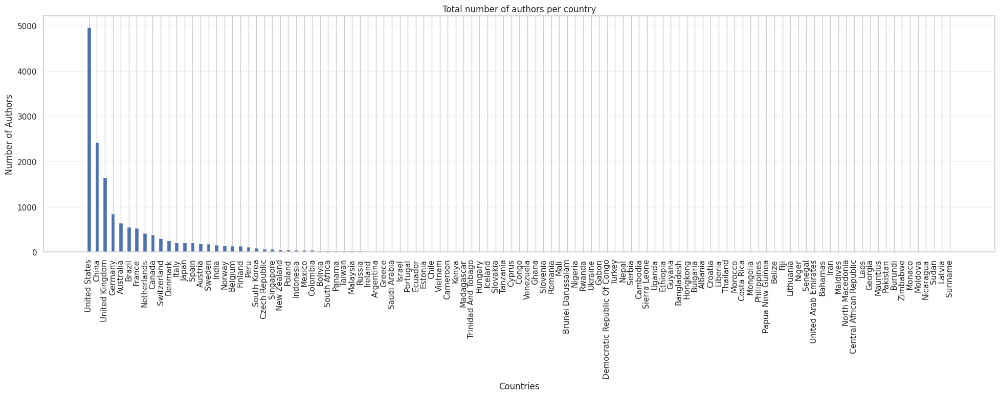

In [ ]:
# country_counter = defaultdict(int)
# for author_dict in data_author['AuthorCountry']:
#   for author, country in author_dict.items():
#     if country:
#       country = clean_regions(country)[0]
#       if country in region_check_list_lower and country not in exclude_regions:
#         country_counter[country] += 1
# country_counter = dict(sorted(country_counter.items(), key=lambda x: x[1], reverse=True))

country_counter = defaultdict(int)
for i, row in data_author.iterrows():
  doi = row['DOI']
  author_dict = row['AuthorCountry']
  for author, country in author_dict.items():
    if country == None:
      country = data_none_countries[(data_none_countries['DOI'] == doi) & (data_none_countries['Author'] == author)]['Region'].iloc[0]
    if country and country != '':
      # print(country)
      country = clean_regions(country)[0]
      if country in region_check_list_lower and country not in exclude_regions:
        country_counter[country] += 1
country_counter = dict(sorted(country_counter.items(), key=lambda x: x[1], reverse=True))

# Plot the bar graph
plt.figure(figsize=(24, 6))
plt.bar(pd.Series(country_counter.keys()).str.title(), country_counter.values(), width=0.5)
plt.title('Total number of authors per country')
plt.xlabel('Countries', fontsize=12)
plt.ylabel('Number of Authors', fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.show()

<Figure size 640x480 with 0 Axes>

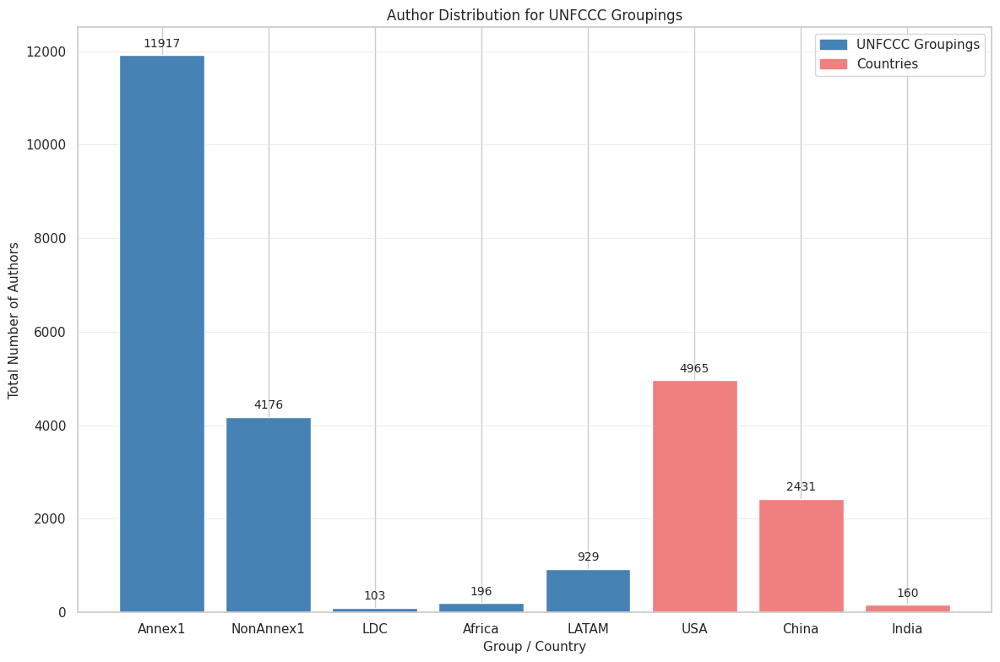

In [ ]:
# Initialize Counters for each classification
# annex1_counter = Counter()
# non_annex1_counter = Counter()
# ldc_counter = Counter()
# usa_counter = Counter()
# india_counter = Counter()
# china_counter = Counter()
annex1_count = 0
non_annex1_count = 0
ldc_count = 0
africa_count = 0
latam_count = 0
usa_count = 0
india_count = 0
china_count = 0
counter = 0
bangladesh_count = 0
sudan_count = 0
drc_count = 0

# for author_dict in data_author['AuthorCountry']:
for i, row in data_author.iterrows():
  doi = row['DOI']
  author_dict = row['AuthorCountry']
  for author, country in author_dict.items():
    counter += 1
    if country == None:
      country = data_none_countries[(data_none_countries['DOI'] == doi) & (data_none_countries['Author'] == author)]['Region'].iloc[0]
    if country and country != '':
      country = clean_regions(country)[0]
      region = get_author_regions(country)
      if 'Annex1' in region:
        annex1_count += 1
      if 'NonAnnex1' in region:
        non_annex1_count += 1
      if 'LDC' in region:
        ldc_count += 1
      if 'Africa' in region:
        africa_count += 1
      if 'LATAM' in region:
        latam_count += 1
      if 'USA' in region:
        usa_count += 1
      if 'India' in region:
        india_count += 1
      if 'China' in region:
        china_count += 1
      if 'Bangladesh' in region:
        bangladesh_count += 1
      if 'Sudan' in region:
        sudan_count += 1
      if 'DRC' in region:
        drc_count += 1

# Plot the bar graph
plt.figure()

# Define colors and hatch patterns for each bar
colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']

plt.figure(figsize=(12, 8))
# Create custom legend patches
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)

counts_author = [annex1_count, non_annex1_count, ldc_count, africa_count, latam_count, usa_count, china_count, india_count]

plt.bar(['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India'], \
        counts_author, color=colors)

for i, val in enumerate(counts_author):
    plt.text(i, val + max(counts_author)*0.01, str(val), ha='center', va='bottom', fontsize=10)

plt.title('Author Distribution for UNFCCC Groupings')
plt.xlabel('Group / Country', fontsize=11)
plt.ylabel('Total Number of Authors', fontsize=11)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
# plt.ylim(0, 6000)
plt.tight_layout()
plt.savefig("total_author.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
sum(country_counter.values())

16076

In [ ]:
annex1_count, non_annex1_count, ldc_count, africa_count, latam_count, usa_count, china_count, india_count

(11917, 4176, 103, 196, 929, 4965, 2431, 160)

In [ ]:
annex1_count, non_annex1_count, ldc_count, africa_count, usa_count, china_count, india_count, bangladesh_count, sudan_count, drc_count
#(11354, 3708, 103, 188, 4738, 2403, 158, 5, 1, 7)

(11917, 4176, 103, 196, 4965, 2431, 160, 5, 1, 7)

In [ ]:
# total_authors = annex1_count + non_annex1_count
total_authors = len(author_count)
total_authors

12811

In [ ]:
annex1_count / total_authors

0.9302162204355632

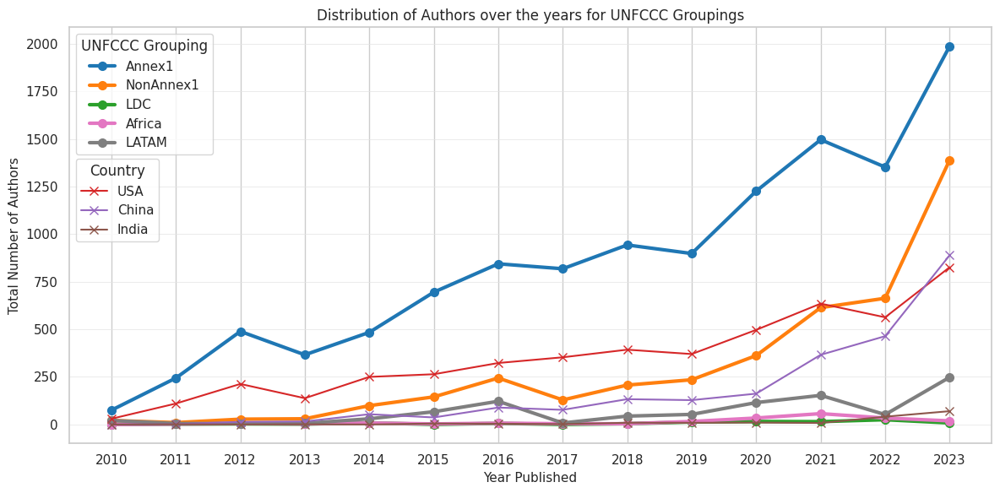

In [ ]:
# Old Code
# # Summarize the counts for each classification and year
# years = sorted(set(data_subset['Year Published']))

# annex1_counts = [sum(year_annex1[year].values()) for year in years]
# non_annex1_counts = [sum(year_non_annex1[year].values()) for year in years]
# ldc_counts = [sum(year_ldc[year].values()) for year in years]
# usa_counts = [sum(year_usa[year].values()) for year in years]
# india_counts = [sum(year_india[year].values()) for year in years]
# china_counts = [sum(year_china[year].values()) for year in years]
# # brazil_counts = [sum(year_brazil[year].values()) for year in years]

# # Plot the line chart
# plt.figure(figsize=(12, 6))
# plt.plot(years, annex1_counts, label='Annex1')
# plt.plot(years, non_annex1_counts, label='NonAnnex1')
# plt.plot(years, ldc_counts, label='LDC')
# plt.plot(years, usa_counts, label='USA')
# plt.plot(years, india_counts, label='India')
# plt.plot(years, china_counts, label='China')
# # plt.plot(years, brazil_counts, label='Brazil')
# plt.title('Year-wise Number of Authors by Classification')
# plt.xlabel('Year')
# plt.ylabel('Number of Authors')
# plt.legend()
# plt.tight_layout()
# plt.show()

# year_annex1 = defaultdict(Counter)
# year_non_annex1 = defaultdict(Counter)
# year_ldc = defaultdict(Counter)
# year_usa = defaultdict(Counter)
# year_china = defaultdict(Counter)
# year_india = defaultdict(Counter)
# # year_brazil = defaultdict(Counter)

# New Code - Skewness

year_annex1_counts = defaultdict(int)
year_nonannex1_counts = defaultdict(int)
year_ldc_counts = defaultdict(int)
year_africa_counts = defaultdict(int)
year_latam_counts = defaultdict(int)
year_usa_counts = defaultdict(int)
year_china_counts = defaultdict(int)
year_india_counts = defaultdict(int)

# Iterate through the AuthorCountry column to update the counters
for idx, row in data_author.iterrows():
  year = row['Year Published']
  author_dict = row['AuthorCountry']
  doi = row['DOI']
  for author, country in author_dict.items():
    if country == None:
      country = data_none_countries[(data_none_countries['DOI'] == doi) & (data_none_countries['Author'] == author)]['Region'].iloc[0]
    if country and country != '':
    # if country:  # Ensure the country is not None
      country = clean_regions(country)[0]
      region = get_author_regions(country)
      if 'Annex1' in region:
        year_annex1_counts[year] += 1
      if 'NonAnnex1' in region:
        year_nonannex1_counts[year] += 1
      if 'LDC' in region:
        year_ldc_counts[year] += 1
      if 'Africa' in region:
        year_africa_counts[year] += 1
      if 'LATAM' in region:
        year_latam_counts[year] += 1
      if 'USA' in region:
        year_usa_counts[year] += 1
      if 'India' in region:
        year_india_counts[year] += 1
      if 'China' in region:
        year_china_counts[year] += 1

years = sorted(set(data_author['Year Published']))

year_annex1_counts = [year_annex1_counts[year] for year in years]
year_nonannex1_counts = [year_nonannex1_counts[year] for year in years]
year_ldc_counts = [year_ldc_counts[year] for year in years]
year_africa_counts = [year_africa_counts[year] for year in years]
year_latam_counts = [year_latam_counts[year] for year in years]
year_usa_counts = [year_usa_counts[year] for year in years]
year_india_counts = [year_india_counts[year] for year in years]
year_china_counts = [year_china_counts[year] for year in years]

# Plot the line chart
# plt.figure(figsize=(12, 6))

region_handles = []
country_handles = []

fig, ax = plt.subplots(figsize=(12, 6))

# plt.plot(years, year_annex1_counts, marker='o', markersize=3, linewidth=1.5, label='Annex1')
# plt.plot(years, year_nonannex1_counts, marker='o', markersize=3, linewidth=1.5, label='NonAnnex1')
# plt.plot(years, year_ldc_counts, marker='o', markersize=3, linewidth=1.5, label='LDC')
# plt.plot(years, year_usa_counts, marker='o', markersize=3, linewidth=1.5, label='USA')
# plt.plot(years, year_india_counts, marker='o', markersize=3, linewidth=1.5, label='India')
# plt.plot(years, year_china_counts, marker='o', markersize=3, linewidth=1.5, label='China')

line, = ax.plot(years, year_annex1_counts, marker='o', markersize=7, linewidth=3, label='Annex1', color=region_palette['Annex1'])
region_handles.append(line)

line, = ax.plot(years, year_nonannex1_counts, marker='o', markersize=7, linewidth=3, label='NonAnnex1', color=region_palette['NonAnnex1'])
region_handles.append(line)

line, = ax.plot(years, year_ldc_counts, marker='o', markersize=7, linewidth=3, label='LDC', color=region_palette['LDC'])
region_handles.append(line)

line, = ax.plot(years, year_africa_counts, marker='o', markersize=7, linewidth=3, label='Africa', color=region_palette['Africa'])
region_handles.append(line)

line, = ax.plot(years, year_latam_counts, marker='o', markersize=7, linewidth=3, label='LATAM', color=region_palette['LATAM'])
region_handles.append(line)

line, = ax.plot(years, year_usa_counts, marker='x', markersize=7, linewidth=1.5, label='USA', color=region_palette['USA'])
country_handles.append(line)

line, = ax.plot(years, year_china_counts, marker='x', markersize=7, linewidth=1.5, label='China', color=region_palette['China'])
country_handles.append(line)

line, = ax.plot(years, year_india_counts, marker='x', markersize=7, linewidth=1.5, label='India', color=region_palette['India'])
country_handles.append(line)

region_legend = ax.legend(handles=region_handles, loc='upper left', title='UNFCCC Grouping', fontsize=11)
ax.add_artist(region_legend)
ax.legend(handles=country_handles, loc='upper left', bbox_to_anchor=(0, 0.7), title='Country', fontsize=11)

plt.title('Distribution of Authors over the years for UNFCCC Groupings')
plt.xlabel('Year Published', fontsize=11)
plt.ylabel('Total Number of Authors', fontsize=11)
# plt.legend(title='Region')
plt.tight_layout()
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
# plt.ylim(0, 1000)
plt.savefig("yearwise_author.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

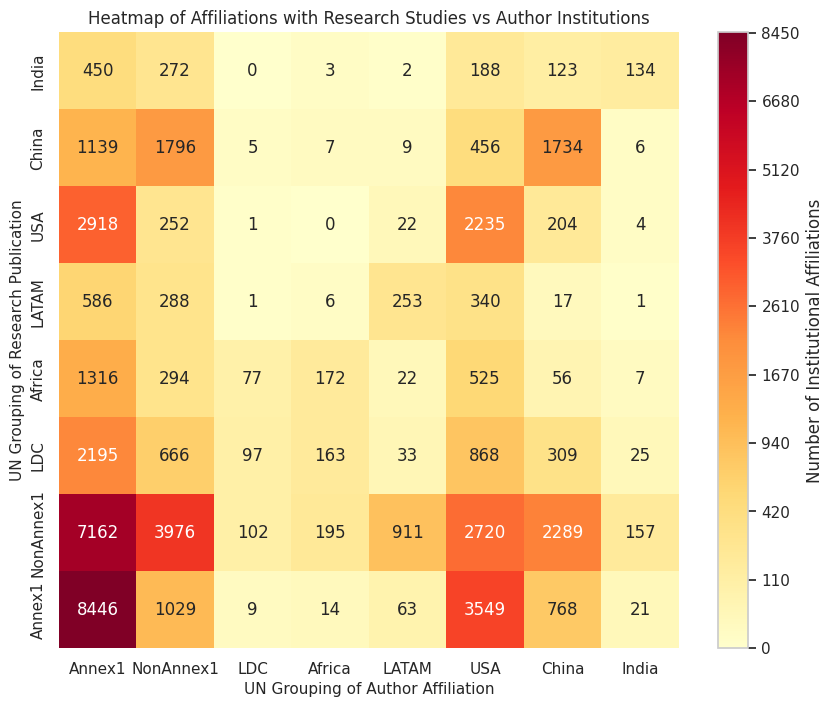

In [ ]:
intersection_counter = Counter()
for idx, row in data_author.iterrows():
  all_research_region = row['ResearchRegion']
  author_dict = row['AuthorCountry']
  doi = row['DOI']
  for author, country in author_dict.items():
    if country == None:
      country = data_none_countries[(data_none_countries['DOI'] == doi) & (data_none_countries['Author'] == author)]['Region'].iloc[0]
    if country and country != '':
      country = clean_regions(country)[0]
      all_author_region = get_author_regions(country)
      for research_region in all_research_region:
        for author_region in all_author_region:
          intersection_counter[(research_region, author_region)] += 1

matrix = np.zeros((len(research_regions), len(research_regions)))
for i, research in enumerate(research_regions):
    for j, author in enumerate(research_regions):
        matrix[i, j] = intersection_counter.get((research, author), 0)

matrix_flipped = np.flipud(matrix)
matrix_rounded = np.round(np.sqrt(matrix_flipped), 0)

raw_max = np.max(matrix_flipped)  # This is where your actual data values come from
rounded_max = math.ceil(raw_max / 10.0) * 10  # Round up to nearest 10 or whatever
vmax = np.sqrt(rounded_max)

plt.figure(figsize=(10, 8))
# norm = Normalize(vmin=0, vmax=np.max(matrix_flipped))
norm = Normalize(vmin=0, vmax=vmax)
heatmap = sns.heatmap(matrix_rounded, annot=matrix_flipped, fmt="g", cmap="YlOrRd", \
                      xticklabels=research_regions, yticklabels=research_regions[::-1], cbar=False)
colorbar = plt.colorbar(heatmap.collections[0], orientation='vertical')
colorbar.set_label('Number of Institutional Affiliations')

# tick_values = np.linspace(0, np.max(matrix_rounded), 10)
# original_tick_labels = np.round(tick_values**2, 0)  # Square to get the original scale
tick_values = np.linspace(0, vmax, 10)
original_tick_labels = [int(math.ceil((v**2) / 10.0) * 10) for v in tick_values]

colorbar.set_ticks(tick_values)
colorbar.set_ticklabels([int(label) for label in original_tick_labels])

plt.xlabel('UN Grouping of Author Affiliation', fontsize=11)
plt.ylabel('UN Grouping of Research Publication', fontsize=11)
plt.title('Heatmap of Affiliations with Research Studies vs Author Institutions')
plt.savefig("heatmap_author.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
# Calculate the intersection counts
intersection_counter = Counter()
for idx, row in data_author.iterrows():
    all_research_region = row['ResearchRegion']
    author_dict = row['AuthorCountry']
    for author, country in author_dict.items():
        if country:
            country = clean_regions(country)[0]
            all_author_region = get_author_regions(country)
            for research_region in all_research_region:
                for author_region in all_author_region:
                    intersection_counter[(research_region, author_region)] += 1

# Create the matrix
matrix = np.zeros((len(research_regions), len(research_regions)))
for i, research in enumerate(research_regions):
    for j, author in enumerate(research_regions):
        matrix[i, j] = intersection_counter.get((research, author), 0)

# Flip and round the matrix
matrix_flipped = np.flipud(matrix)
matrix_rounded = np.round(np.sqrt(matrix_flipped), 0)

# Create the heatmap
fig = go.Figure(data=go.Heatmap(
    z=matrix_rounded,
    x=research_regions,
    y=research_regions[::-1],
    colorscale='YlOrRd',
    colorbar=dict(
        title="Number of Publications",
        tickvals=np.linspace(0, np.max(matrix_rounded), 6),  # Adjust the number of ticks
        ticktext=[str(int(i ** 2)) for i in np.linspace(0, np.max(matrix_rounded), 6)],  # Display original scale labels
        ticks="outside",  # Place ticks outside the color bar
        tickangle=0  # Ensure tick labels are horizontally aligned
    ),
    text=matrix_flipped,  # Values to display inside the boxes
    hoverinfo='x+y+text',  # Show the text (numbers) when hovering
    texttemplate='%{text}',
))

# Set layout and axis labels
fig.update_layout(
    title="Heatmap of Publications: Research Groups vs Author Groups",
    xaxis=dict(title="Author Group", ticks=""),
    yaxis=dict(title="Research Group", ticks=""),
    xaxis_nticks=len(research_regions),  # Set the number of ticks on the x-axis
    yaxis_nticks=len(research_regions),  # Set the number of ticks on the y-axis
    template="plotly_white",
    height=800,  # Set height and width to make it square
    width=1000,
    autosize=False,
    showlegend=False  # Hides the color legend
)

# Show the plot
fig.show()

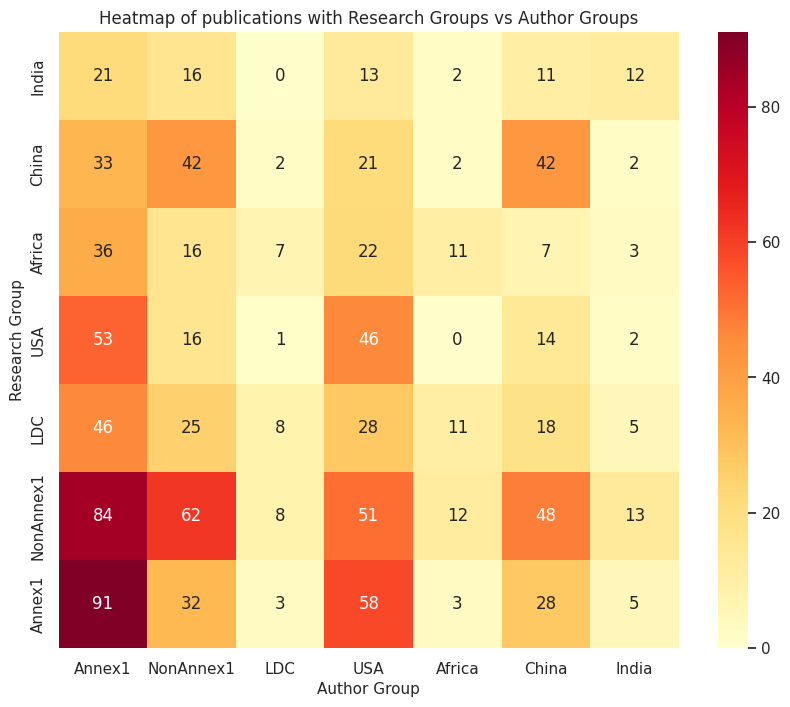

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(matrix_rounded, annot=True, fmt="g", cmap="YlOrRd", xticklabels=research_regions, yticklabels=research_regions[::-1])
plt.xlabel('Author Group', fontsize=11)
plt.ylabel('Research Group', fontsize=11)
plt.title('Heatmap of publications with Research Groups vs Author Groups')
plt.show()

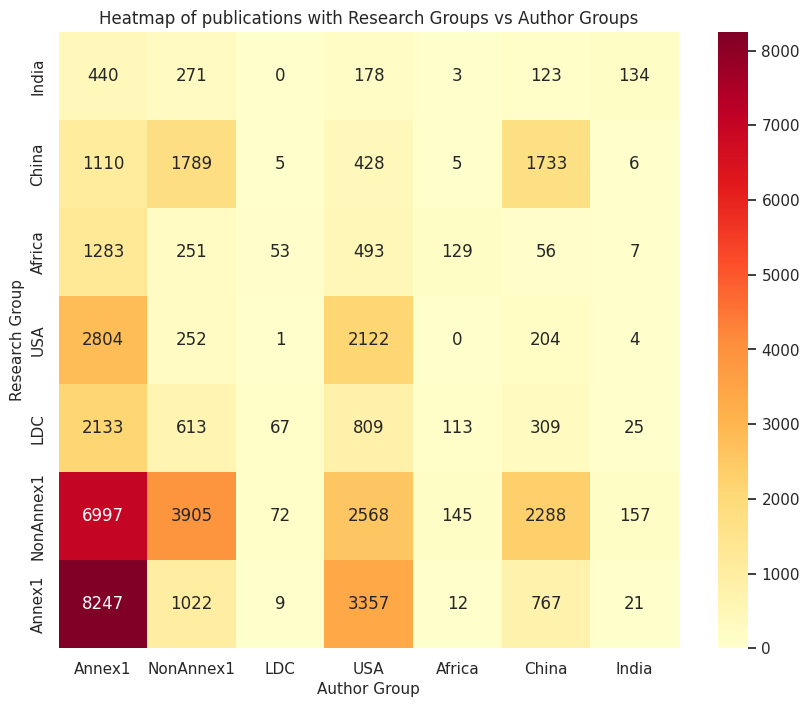

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(matrix_flipped, annot=True, fmt="g", cmap="YlOrRd", xticklabels=research_regions, yticklabels=research_regions[::-1])
plt.xlabel('Author Group', fontsize=11)
plt.ylabel('Research Group', fontsize=11)
plt.title('Heatmap of publications with Research Groups vs Author Groups')
plt.show()

In [ ]:
# # Bubble Chart - Old
# # Prepare data for plotting
# x_labels = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']
# y_labels = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']
# bubble_data = [(x, y, intersection_counter[(x, y)]) for x in x_labels for y in y_labels]

# # Plot the bubble chart
# plt.figure()
# for (x, y, size) in bubble_data:
#     plt.scatter(y, x, s=size*20, alpha=0.5, edgecolors="w", linewidth=2)

# # Add labels and title
# plt.xlabel('Author Region')
# plt.ylabel('Research Region')
# plt.title('Bubble Chart of Author Regions vs Research Regions')
# plt.xticks(ticks=range(len(y_labels)), labels=y_labels)
# plt.yticks(ticks=range(len(x_labels)), labels=x_labels)
# plt.grid(True)
# plt.show()

In [ ]:
# # Prepare data for plotting
# x_labels = ['Annex1', 'NonAnnex1', 'LDC']
# y_labels = ['Annex1', 'NonAnnex1', 'LDC']
# bubble_data = [(x, y, intersection_counter[(x, y)]) for x in x_labels for y in y_labels]

# # Plot the bubble chart
# plt.figure()
# for (x, y, size) in bubble_data:
#     plt.scatter(y, x, s=size*20, alpha=0.5, edgecolors="w", linewidth=2)

# # Add labels and title
# plt.xlabel('Author Region')
# plt.ylabel('Research Region')
# plt.title('Bubble Chart of Author Regions vs Research Regions')
# plt.xticks(ticks=range(len(y_labels)), labels=y_labels)
# plt.yticks(ticks=range(len(x_labels)), labels=x_labels)
# plt.grid(True)
# plt.show()

In [ ]:
# plt.figure(figsize=(10, 8))
# for i, author in enumerate(author_regions):
#     for j, research in enumerate(research_regions):
#         size = intersection_counter.get((author, research), 0)
#         plt.scatter(i, j, s=size * 20, alpha=0.5)

# # Setting labels
# plt.xticks(ticks=range(len(research_regions)), labels=research_regions)
# plt.yticks(ticks=range(len(author_regions)), labels=author_regions)
# plt.xlabel('Research Region')
# plt.ylabel('Author Region')
# plt.title('Bubble Plot of Author Regions vs Research Regions')
# plt.grid(True)
# plt.show()


In [ ]:
# # Define region groups with corresponding colors
# region_colors = {
#     'Annex1': 'blue',
#     'NonAnnex1': 'green',
#     'LDC': 'red',
#     'USA': 'orange',
#     'China': 'purple',
#     'India': 'brown',
#     'Brazil': 'pink',
# }

# # Plotting the bubble plot with specific colors
# plt.figure(figsize=(10, 8))
# for i, author in enumerate(author_regions):
#     for j, research in enumerate(research_regions):
#         size = intersection_counter.get((author, research), 0)
#         if size > 0:  # Plot only if there's an intersection
#             color = region_colors[research]  # Use the research region's color
#             plt.scatter(i, j, s=size * 20, alpha=0.5, color=color, edgecolors="w", linewidth=2)

# # Setting labels and title
# plt.xticks(ticks=range(len(research_regions)), labels=research_regions)
# plt.yticks(ticks=range(len(author_regions)), labels=author_regions)
# plt.xlabel('Research Region')
# plt.ylabel('Author Region')
# plt.title('Bubble Plot of Author Regions vs Research Regions with Intuitive Colors')
# plt.grid(True)
# plt.show()


# Vulnerability Index

In [ ]:
vulnerability = pd.read_csv('vulnerability.csv')
vulnerability = vulnerability[['Name', '2022']]
vulnerability['Name'] = vulnerability['Name'].apply(clean_regions)
vulnerability = vulnerability.explode('Name')
vulnerability.columns = ['Regions_updated', 'VulnerabilityIndex']
vulnerability

,Regions_updated,VulnerabilityIndex
0,afghanistan,0.586021
1,albania,0.386332
2,algeria,0.364310
3,andorra,NaN
4,angola,0.508869
...,...,...
187,venezuela,0.373603
188,vietnam,0.457708
189,yemen,0.521058
190,zambia,0.487666


In [ ]:
population = pd.read_csv('population_projection.csv')
population = population[population['Year'] == 2023][['Entity', 'Population (historical)']]
population['Entity'] = [country.lower() for country in population['Entity']]
population.loc[population['Entity'] == 'czechia','Entity'] = 'czech republic'
population.loc[population['Entity'] == 'hong kong','Entity'] = 'hongkong'
population.loc[population['Entity'] == 'brunei','Entity'] = 'brunei darussalam'
population = population[population['Entity'].isin(region_check_list_lower)]
population = population[~population['Entity'].isin(exclude_regions)]
population.columns = ['Regions_updated', 'Population']
population

,Regions_updated,Population
337,afghanistan,41454762.0
1171,albania,2811660.0
1509,algeria,46164221.0
2191,andorra,80868.0
2529,angola,36749907.0
...,...,...
76857,venezuela,28300860.0
77195,vietnam,100352189.0
78089,yemen,39390800.0
78550,zambia,20723968.0


In [ ]:
data_country = data_grouped[['Regions_updated', 'ResearchRegion', 'DOI', 'Altmetric']]
data_country = data_country.explode('Regions_updated')
data_country = data_country[~data_country['Regions_updated'].isin(exclude_regions)]
data_country

,Regions_updated,ResearchRegion,DOI,Altmetric
0,united states,Annex1,https://doi.org/10.1038/s41558-019-0468-y,5.0
1,united states,USA,https://doi.org/10.1038/s41558-019-0468-y,5.0
2,russia,Annex1,https://doi.org/10.1126/science.1222135,131.0
6,united states,Annex1,https://doi.org/10.1038/s41612-018-0032-x,21.0
8,united states,USA,https://doi.org/10.1038/s41612-018-0032-x,21.0
...,...,...,...,...
3828,south africa,Africa,https://doi.org/10.1038/s41467-020-18317-8,25.0
3829,south africa,NonAnnex1,https://doi.org/10.1038/s41467-020-18317-8,25.0
3830,australia,Annex1,https://doi.org/10.1038/nclimate1743,324.0
3836,australia,Annex1,https://doi.org/10.1038/s41558-023-01746-w,101.0


In [ ]:
data_country = pd.merge(data_country, vulnerability, on='Regions_updated', how='left')
data_country = pd.merge(data_country, population, on='Regions_updated', how='left')
data_country['VulnerabilityIndex'] = data_country['VulnerabilityIndex'].fillna(0)
data_country.shape

(2856, 6)

In [ ]:
data_country[data_country['Regions_updated'] == 'taiwan']

,Regions_updated,ResearchRegion,DOI,Altmetric,VulnerabilityIndex,Population
583,taiwan,NonAnnex1,https://doi.org/10.1038/s41467-020-19979-0,17.0,0.0,23317145.0
1100,taiwan,NonAnnex1,https://doi.org/10.1038/s41612-023-00383-6,1.0,0.0,23317145.0
2142,taiwan,NonAnnex1,https://doi.org/10.1038/s41612-019-0082-8,3.0,0.0,23317145.0
2363,taiwan,NonAnnex1,https://doi.org/10.1126/science.aax5758,74.0,0.0,23317145.0
2546,taiwan,NonAnnex1,https://doi.org/10.1038/s41612-023-00528-7,15.0,0.0,23317145.0
2558,taiwan,NonAnnex1,https://doi.org/10.1038/s41467-023-43114-4,109.0,0.0,23317145.0


In [ ]:
data_country[data_country['Population'].isna()]

,Regions_updated,ResearchRegion,DOI,Altmetric,VulnerabilityIndex,Population


In [ ]:
# data_country['ResearchRegion'] = data_country['ResearchRegion'].astype(str)
data_country_grouped = data_country.groupby(['Regions_updated', 'ResearchRegion', 'VulnerabilityIndex', 'Population'])\
                                   .agg({'DOI': 'count', 'Altmetric': 'sum'}).reset_index()
data_country_grouped.columns = ['Regions_updated', 'ResearchRegion', 'VulnerabilityIndex', 'Population', 'NumPublications', 'Altmetrics']
data_country_grouped

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0
1,afghanistan,NonAnnex1,0.586021,41454762.0,1,1569.0
2,angola,Africa,0.508869,36749907.0,4,2442.0
3,angola,LDC,0.508869,36749907.0,4,2442.0
4,angola,NonAnnex1,0.508869,36749907.0,4,2442.0
...,...,...,...,...,...,...
158,venezuela,NonAnnex1,0.373603,28300860.0,4,697.0
159,vietnam,NonAnnex1,0.457708,100352189.0,8,1422.0
160,zambia,Africa,0.487666,20723968.0,1,2050.0
161,zambia,LDC,0.487666,20723968.0,1,2050.0


In [ ]:
data_country_grouped['NumPublications_log'] = np.log(data_country_grouped['NumPublications'])
data_country_grouped['NumPublications_sqrt'] = np.sqrt(data_country_grouped['NumPublications'])
data_country_grouped['Altmetrics_log'] = np.log(data_country_grouped['Altmetrics'])
data_country_grouped['Altmetrics_sqrt'] = np.sqrt(data_country_grouped['Altmetrics'])

In [ ]:
data_country_grouped[data_country_grouped['ResearchRegion'].isin(['USA', 'India', 'China', 'Sudan', 'DRC', 'Bangladesh'])]

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
10,bangladesh,Bangladesh,0.554273,1.714670e+08,6,1223.0,1.791759,2.449490,7.109062,34.971417
33,china,China,0.353355,1.422585e+09,282,51684.0,5.641907,16.792856,10.852904,227.341153
46,democratic republic of congo,DRC,0.561573,1.057897e+08,3,224.0,1.098612,1.732051,5.411646,14.966630
70,india,India,0.453668,1.438070e+09,101,20645.0,4.615121,10.049876,9.935228,143.683680
136,sudan,Sudan,0.601057,5.004280e+07,2,323.0,0.693147,1.414214,5.777652,17.972201
154,united states,USA,0.298076,3.434773e+08,507,185832.0,6.228511,22.516660,12.132598,431.082359


In [ ]:
# data_country_grouped['VulnerabilityIndex'] = data_country_grouped['VulnerabilityIndex'].replace(-999, )
# data_country_grouped['ResearchRegion'] = data_country_grouped['ResearchRegion'].apply(ast.literal_eval)
# data_country_grouped = data_country_grouped.explode('ResearchRegion')
# data_country_grouped

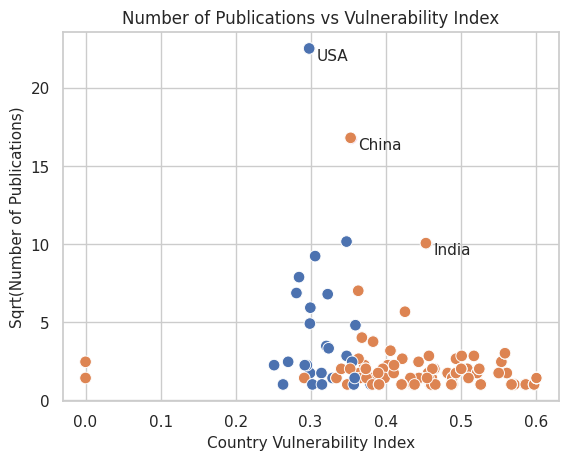

In [ ]:
for country in ['USA', 'India', 'China']:
    test_country_data = data_country_grouped[data_country_grouped['ResearchRegion'] == country]
    sns.scatterplot(data=test_country_data, y='NumPublications_sqrt', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')
    for _, row in test_country_data.iterrows():
        plt.text(row['VulnerabilityIndex'] + 0.01, row['NumPublications_sqrt'] + 0.02, country,
                 ha='left', va='top', fontsize=11)

other_data = data_country_grouped[~data_country_grouped['ResearchRegion'].isin(['USA', 'India', 'China'])]
sns.scatterplot(data=other_data, y='NumPublications_sqrt', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, legend=False)

# plt.legend(title='UNFCCC Grouping', title_fontsize=11, fontsize=11,  loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Number of Publications vs Vulnerability Index")
plt.ylabel("Sqrt(Number of Publications)", fontsize=11)
plt.xlabel("Country Vulnerability Index", fontsize=11)
plt.show()

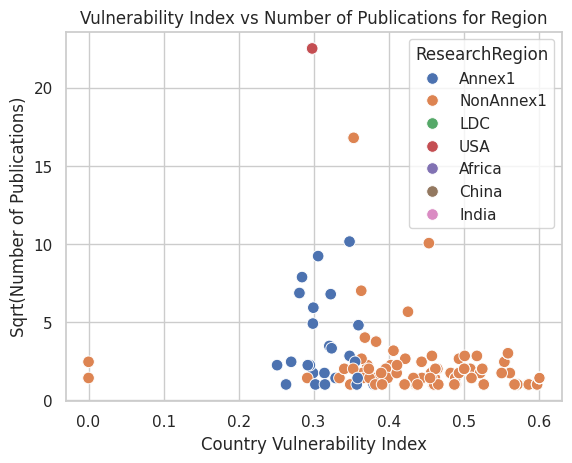

In [ ]:
sns.scatterplot(data=data_country_grouped, y='NumPublications_sqrt', x='VulnerabilityIndex', hue='ResearchRegion', \
                hue_order=research_regions, s=70)
plt.title("Vulnerability Index vs Number of Publications for Region")
plt.ylabel("Sqrt(Number of Publications)")
plt.xlabel("Country Vulnerability Index")
plt.show()

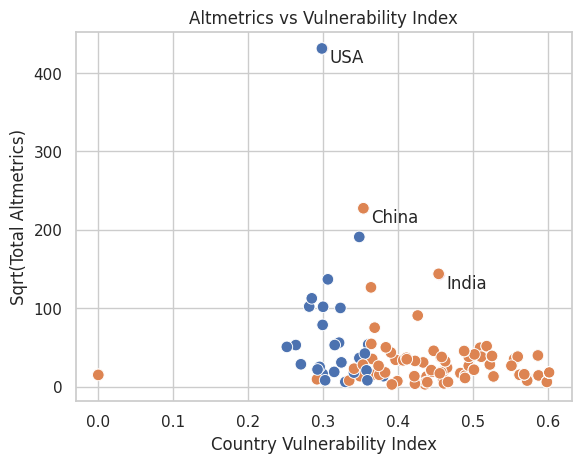

In [ ]:
for country in ['USA', 'India', 'China']:
    test_country_data = data_country_grouped[data_country_grouped['ResearchRegion'] == country]
    sns.scatterplot(data=test_country_data, y='Altmetrics_sqrt', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')
    for _, row in test_country_data.iterrows():
        plt.text(row['VulnerabilityIndex'] + 0.01, row['Altmetrics_sqrt'] + 0.02, country,
                 ha='left', va='top', fontsize=12)

other_data = data_country_grouped[~data_country_grouped['ResearchRegion'].isin(['USA', 'India', 'China'])]
sns.scatterplot(data=other_data, y='Altmetrics_sqrt', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC'], s=70, legend=False)

# plt.legend(title='UNFCCC Grouping', title_fontsize=12, fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Altmetrics vs Vulnerability Index")
plt.ylabel("Sqrt(Total Altmetrics)")
plt.xlabel("Country Vulnerability Index")
plt.show()

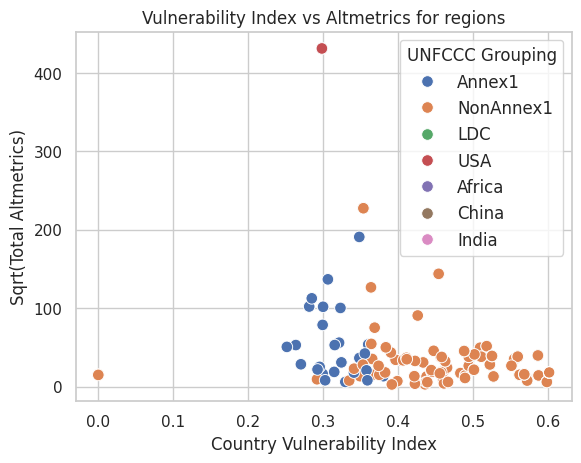

In [ ]:
sns.scatterplot(data=data_country_grouped, y='Altmetrics_sqrt', x='VulnerabilityIndex', hue='ResearchRegion', \
                hue_order=research_regions, s=70)
plt.title("Vulnerability Index vs Altmetrics for regions")
plt.legend(title='UNFCCC Grouping', title_fontsize=12, fontsize=12)
plt.ylabel("Sqrt(Total Altmetrics)", fontsize=12)
plt.xlabel("Country Vulnerability Index", fontsize=12)
plt.show()

    ResearchRegion   Population  NumPublications_sqrt
139            USA  343477332.0              22.51666
   ResearchRegion    Population  NumPublications_sqrt
59          India  1.438070e+09             10.049876
   ResearchRegion    Population  NumPublications_sqrt
28          China  1.422585e+09             16.792856


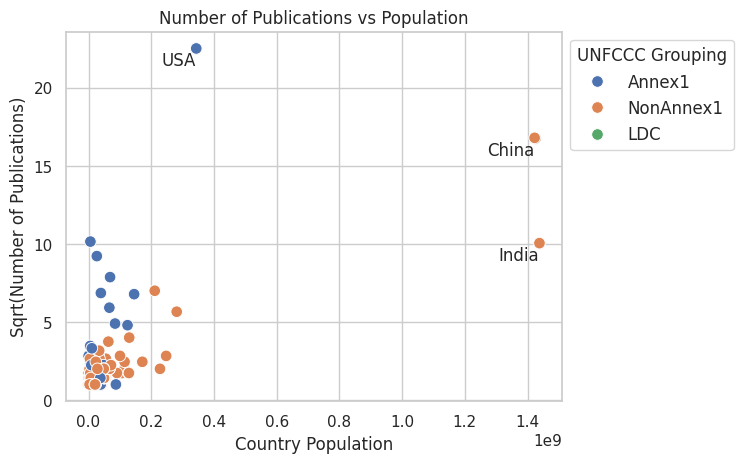

In [ ]:
# plt.figure(figsize=(8, 7))
for country in ['USA', 'India', 'China']:
    test_country_data = data_country_grouped[data_country_grouped['ResearchRegion'] == country]
    print(test_country_data[['ResearchRegion', 'Population', 'NumPublications_sqrt']])
    sns.scatterplot(data=test_country_data, y='NumPublications_sqrt', x='Population',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')
    for _, row in test_country_data.iterrows():
        plt.text(row['Population'] + 0.5, row['NumPublications_sqrt'] - 0.2, country,
                 ha='right', va='top', fontsize=12)

other_data = data_country_grouped[~data_country_grouped['ResearchRegion'].isin(['USA', 'India', 'China'])]
sns.scatterplot(data=other_data, y='NumPublications_sqrt', x='Population',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC'], s=70)

plt.legend(title='UNFCCC Grouping', title_fontsize=12, fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Number of Publications vs Population")
plt.ylabel("Sqrt(Number of Publications)", fontsize=12)
plt.xlabel("Country Population", fontsize=12)
plt.show()

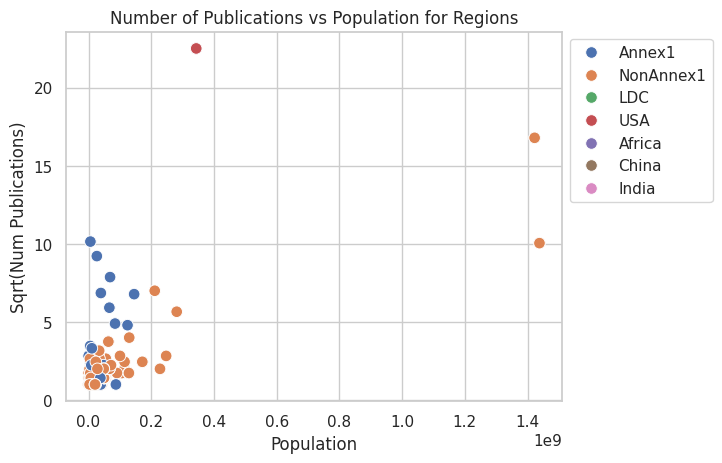

In [ ]:
sns.scatterplot(data=data_country_grouped, y='NumPublications_sqrt', x='Population', hue='ResearchRegion', \
                hue_order=research_regions, s=70)
plt.title("Number of Publications vs Population for Regions")
plt.ylabel("Sqrt(Num Publications)")
plt.xlabel("Population")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

In [ ]:
data_country_grouped[data_country_grouped['ResearchRegion'] == 'China']['Regions_updated'].unique()

array(['china'], dtype=object)

In [ ]:
data_country_grouped['ResearchRegion'].value_counts()

,count
ResearchRegion,
NonAnnex1,75
Annex1,27
LDC,19
Africa,19
Bangladesh,1
China,1
DRC,1
India,1
Sudan,1


In [ ]:
other_data

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
1,afghanistan,NonAnnex1,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
2,angola,Africa,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
4,angola,NonAnnex1,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
...,...,...,...,...,...,...,...,...,...,...
141,venezuela,NonAnnex1,0.373603,28300860.0,4,697.0,1.386294,2.000000,6.546785,26.400758
142,vietnam,NonAnnex1,0.457708,100352189.0,8,1422.0,2.079442,2.828427,7.259820,37.709415
143,zambia,Africa,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926
144,zambia,LDC,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926


/tmp/ipython-input-1056320579.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_data['region_priority'] = other_data['ResearchRegion'].map(priority_order)


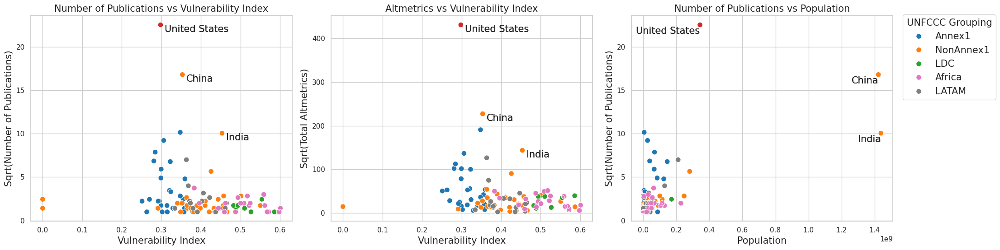

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# for country in ['USA', 'India', 'China']:
# for country in ['united states', 'india', 'china', 'hongkong', 'taiwan']:
# for country in ['united states', 'india', 'china', 'sudan', 'democratic republic of congo', 'bangladesh']:
for country in ['united states', 'india', 'china']:
    # test_country_data = data_country_grouped[data_country_grouped['ResearchRegion'] == country]
    test_country_data = data_country_grouped[data_country_grouped['Regions_updated'] == country]
    # print(test_country_data[['ResearchRegion', 'Population', 'NumPublications_sqrt', 'VulnerabilityIndex', 'Altmetrics_sqrt']])
    # First plot: Vulnerability Index vs Number of Publications
    sns.scatterplot(ax=axes[0], data=test_country_data, y='NumPublications_sqrt', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_', palette=region_palette)
    # Second plot: Vulnerability Index vs Altmetrics
    sns.scatterplot(ax=axes[1], data=test_country_data, y='Altmetrics_sqrt', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_', palette=region_palette)
    # Third plot: Population vs Number of Publications
    sns.scatterplot(ax=axes[2], data=test_country_data, y='NumPublications_sqrt', x='Population',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_', palette=region_palette)

    for _, row in test_country_data.iterrows():
        axes[0].text(row['VulnerabilityIndex'] + 0.01, row['NumPublications_sqrt'] + 0.02, country.title(),
                     ha='left', va='top', fontsize=15)
        axes[1].text(row['VulnerabilityIndex'] + 0.01, row['Altmetrics_sqrt'] + 0.02, country.title(),
                     ha='left', va='top', fontsize=15)
        axes[2].text(row['Population'] + 0.01, row['NumPublications_sqrt'] - 0.2, country.title(),
                     ha='right', va='top', fontsize=15)

priority_order = {'LATAM': 3, 'Africa': 4, 'LDC': 2, 'NonAnnex1': 1, 'Annex1': 0}

other_data = data_country_grouped[~data_country_grouped['Regions_updated'].isin(['united states', 'india', 'china'])]
other_data['region_priority'] = other_data['ResearchRegion'].map(priority_order)

# Keep only the top-priority row for each country (lowest priority number wins)
other_data = other_data.sort_values('region_priority')

# First plot: Vulnerability Index vs Number of Publications
sns.scatterplot(ax=axes[0], data=other_data, y='NumPublications_sqrt', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[0].legend_.remove()
axes[0].set_title("Number of Publications vs Vulnerability Index", fontsize=15)
axes[0].set_ylabel("Sqrt(Number of Publications)", fontsize=15)
axes[0].set_xlabel("Vulnerability Index", fontsize=15)

# Second plot: Vulnerability Index vs Altmetrics
sns.scatterplot(ax=axes[1], data=other_data, y='Altmetrics_sqrt', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[1].legend_.remove()
axes[1].set_title("Altmetrics vs Vulnerability Index", fontsize=15)
axes[1].set_ylabel("Sqrt(Total Altmetrics)", fontsize=15)
axes[1].set_xlabel("Vulnerability Index", fontsize=15)

# Third plot: Population vs Number of Publications
sns.scatterplot(ax=axes[2], data=other_data, y='NumPublications_sqrt', x='Population',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[2].legend_.remove()
axes[2].set_title("Number of Publications vs Population", fontsize=15)
axes[2].set_ylabel("Sqrt(Number of Publications)", fontsize=15)
axes[2].set_xlabel("Population", fontsize=15)

# Remove legends from individual plots and create one common legend
handles, labels = axes[2].get_legend_handles_labels()
fig.legend(handles, labels, title='UNFCCC Grouping', title_fontsize=15, fontsize=15, bbox_to_anchor=(1.11, 0.9), loc='upper right')


# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the common legend
plt.savefig("scatterplots.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

/tmp/ipython-input-1945211231.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_data['region_priority'] = other_data['ResearchRegion'].map(priority_order)


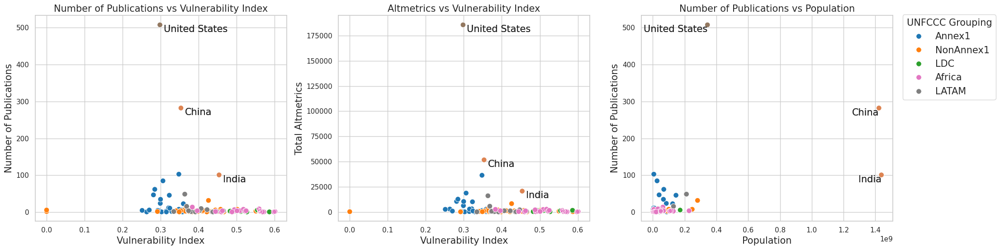

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# for country in ['USA', 'India', 'China']:
# for country in ['united states', 'india', 'china', 'hongkong', 'taiwan']:
# for country in ['united states', 'india', 'china', 'sudan', 'democratic republic of congo', 'bangladesh']:
for country in ['united states', 'india', 'china']:
    # test_country_data = data_country_grouped[data_country_grouped['ResearchRegion'] == country]
    test_country_data = data_country_grouped[data_country_grouped['Regions_updated'] == country]
    # print(test_country_data[['ResearchRegion', 'Population', 'NumPublications', 'VulnerabilityIndex', 'Altmetrics']])
    # First plot: Vulnerability Index vs Number of Publications
    sns.scatterplot(ax=axes[0], data=test_country_data, y='NumPublications', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')
    # Second plot: Vulnerability Index vs Altmetrics
    sns.scatterplot(ax=axes[1], data=test_country_data, y='Altmetrics', x='VulnerabilityIndex',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')
    # Third plot: Population vs Number of Publications
    sns.scatterplot(ax=axes[2], data=test_country_data, y='NumPublications', x='Population',
                    hue='ResearchRegion', hue_order=research_regions,
                    s=70, legend=False, label='_nolegend_')

    for _, row in test_country_data.iterrows():
        axes[0].text(row['VulnerabilityIndex'] + 0.01, row['NumPublications'] + 0.02, country.title(),
                     ha='left', va='top', fontsize=15)
        axes[1].text(row['VulnerabilityIndex'] + 0.01, row['Altmetrics'] + 0.02, country.title(),
                     ha='left', va='top', fontsize=15)
        axes[2].text(row['Population'] + 0.01, row['NumPublications'] - 0.2, country.title(),
                     ha='right', va='top', fontsize=15)

priority_order = {'Africa': 4, 'LATAM': 3, 'LDC': 2, 'NonAnnex1': 1, 'Annex1': 0}

other_data = data_country_grouped[~data_country_grouped['Regions_updated'].isin(['united states', 'india', 'china'])]
other_data['region_priority'] = other_data['ResearchRegion'].map(priority_order)

# Keep only the top-priority row for each country (lowest priority number wins)
other_data = other_data.sort_values('region_priority')

# First plot: Vulnerability Index vs Number of Publications
sns.scatterplot(ax=axes[0], data=other_data, y='NumPublications', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[0].legend_.remove()
axes[0].set_title("Number of Publications vs Vulnerability Index", fontsize=15)
axes[0].set_ylabel("Number of Publications", fontsize=15)
axes[0].set_xlabel("Vulnerability Index", fontsize=15)

# Second plot: Vulnerability Index vs Altmetrics
sns.scatterplot(ax=axes[1], data=other_data, y='Altmetrics', x='VulnerabilityIndex',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[1].legend_.remove()
axes[1].set_title("Altmetrics vs Vulnerability Index", fontsize=15)
axes[1].set_ylabel("Total Altmetrics", fontsize=15)
axes[1].set_xlabel("Vulnerability Index", fontsize=15)

# Third plot: Population vs Number of Publications
sns.scatterplot(ax=axes[2], data=other_data, y='NumPublications', x='Population',
                hue='ResearchRegion', hue_order=['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM'], s=70, palette=region_palette)
axes[2].legend_.remove()
axes[2].set_title("Number of Publications vs Population", fontsize=15)
axes[2].set_ylabel("Number of Publications", fontsize=15)
axes[2].set_xlabel("Population", fontsize=15)

# Remove legends from individual plots and create one common legend
handles, labels = axes[2].get_legend_handles_labels()
fig.legend(handles, labels, title='UNFCCC Grouping', title_fontsize=15, fontsize=15, bbox_to_anchor=(1.11, 0.9), loc='upper right')


# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the common legend
plt.savefig("original_scale_scatterplots.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
data_country_grouped[data_country_grouped['Regions_updated'] == "denmark"]

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
41,denmark,Annex1,0.34789,5948134.0,103,36386.0,4.634729,10.148892,10.501939,190.751147


In [ ]:
data_country_grouped[data_country_grouped['Regions_updated'] == "australia"]

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
6,australia,Annex1,0.306046,26451125.0,85,18682.0,4.442651,9.219544,9.835316,136.682113


In [ ]:
# Assuming temp has columns 'NumPublications', 'population', 'ResearchRegions', and 'Country'
fig = px.scatter(
    data_frame=data_country_grouped,
    x='Population',
    y='NumPublications_sqrt',
    color='ResearchRegion',
    hover_name='Regions_updated',  # This will show the country name on hover
    category_orders={'ResearchRegion': research_regions},  # Ensures the order of colors in the legend
    size_max=None,  # Adjust the size of markers if needed
    title="Number of Publications vs Population for Regions"
)

# Update the layout for white background and custom gridlines
fig.update_layout(
    plot_bgcolor='white',  # Background inside the plot
    paper_bgcolor='white',  # Background outside the plot
    xaxis_title="Population",
    yaxis_title="Num Publications",
    legend_title="Regions",
    font=dict(color='black'),  # Ensure text is visible
    xaxis=dict(
        showgrid=True,  # Show gridlines for the x-axis
        gridcolor='lightgrey',  # Gridline color
        zerolinecolor='grey'  # Zero-line color (if applicable)
    ),
    yaxis=dict(
        showgrid=True,  # Show gridlines for the y-axis
        gridcolor='lightgrey',  # Gridline color
        zerolinecolor='grey'  # Zero-line color (if applicable)
    ),
    width=800,  # Set the width of the plot
    height=600
)

# Update marker size (control marker size explicitly)
fig.update_traces(marker=dict(size=10))  # Increase the marker size

# Show the plot
fig.show()


# Old Vulnerability + Population

In [ ]:
# data_vulnerability = data_grouped.copy()
# data_vulnerability['Regions_updated_lower'] = [country.lower() for country in data_vulnerability['Regions_updated']]
# data_vulnerability.head(5)

In [ ]:
# data_vulnerability_grouped = data_vulnerability.groupby(['Regions_updated', 'Regions_updated_lower'])['DOI'].count().reset_index()
# data_vulnerability_grouped.columns = ['Regions_updated', 'Regions_updated_lower', 'NumPublications']
# data_vulnerability_grouped = pd.merge(data_vulnerability_grouped, vulnerability, on='Regions_updated_lower', how='left')

In [ ]:
# data_vulnerability_grouped = data_vulnerability_grouped[data_vulnerability_grouped['VulnerabilityIndex'].isna() == False]
# data_vulnerability_grouped.shape

In [ ]:
# region = data_vulnerability[['Regions_updated_lower', 'ResearchRegions']].drop_duplicates(['Regions_updated_lower'])
# # region
# data_vulnerability_grouped = pd.merge(data_vulnerability_grouped, region, on='Regions_updated_lower')
# data_vulnerability_grouped.shape

In [ ]:
# temp = data_vulnerability_grouped.copy()
# temp = temp.explode('ResearchRegions')

In [ ]:
# sns.scatterplot(data=temp, x='NumPublications', y='VulnerabilityIndex', hue='ResearchRegions')
# plt.title("Vulnerability Index vs Number of Publications for regions")
# plt.show()

In [ ]:
# temp['NumPublications_log'] = np.log(temp['NumPublications'])
# temp['NumPublications_sqrt'] = np.sqrt(temp['NumPublications'])

In [ ]:
# sns.scatterplot(data=temp, y='NumPublications', x='VulnerabilityIndex', hue='ResearchRegions')
# plt.title("Vulnerability Index vs Number of Publications for regions")
# plt.show()

In [ ]:
# sorted_regions = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']
# sns.scatterplot(data=temp, y='NumPublications_log', x='VulnerabilityIndex', hue='ResearchRegions', \
#                 hue_order=sorted_regions, s=70)
# plt.title("Vulnerability Index vs Number of Publications for regions")
# plt.ylabel("Log(Number of Publications)")
# plt.xlabel("Country Vulnerability Index")
# plt.show()

Altmetric (Old)

In [ ]:
# data_vulnerability_grouped_alt = data_vulnerability.groupby(['Regions_updated', 'Regions_updated_lower'])['Altmetric'].sum().reset_index()
# data_vulnerability_grouped_alt.columns = ['Regions_updated', 'Regions_updated_lower', 'AltmetricsTotal']
# data_vulnerability_grouped_alt = pd.merge(data_vulnerability_grouped_alt, vulnerability, on='Regions_updated_lower', how='left')

In [ ]:
# data_vulnerability_grouped_alt = data_vulnerability_grouped_alt[data_vulnerability_grouped_alt['VulnerabilityIndex'].isna() == False]
# data_vulnerability_grouped_alt.shape

In [ ]:
# region = data_vulnerability[['Regions_updated_lower', 'ResearchRegions']].drop_duplicates(['Regions_updated_lower'])
# # region
# data_vulnerability_grouped_alt = pd.merge(data_vulnerability_grouped_alt, region, on='Regions_updated_lower')
# data_vulnerability_grouped_alt.shape

In [ ]:
# temp = data_vulnerability_grouped_alt.copy()
# temp = temp.explode('ResearchRegions')
# temp['AltmetricsTotal_log'] = np.log(temp['AltmetricsTotal'])
# temp['AltmetricsTotal_sqrt'] = np.sqrt(temp['AltmetricsTotal'])

In [ ]:
# sorted_regions = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']
# sns.scatterplot(data=temp, y='AltmetricsTotal', x='VulnerabilityIndex', hue='ResearchRegions', \
#                 hue_order=sorted_regions, s=70)
# plt.title("Vulnerability Index vs Altmetrics for regions")
# plt.ylabel("Total Altmetric Score")
# plt.xlabel("Country Vulnerability Index")
# plt.show()

Population with Number of Publications (Old)

In [ ]:
# population = pd.read_csv('population_projection.csv')
# population = population[population['Year'] == 2023]
# population['country'] = [c.lower() for c in population['Entity']]
# population = population[['country', 'Population (historical)']]
# population.columns = ['Regions_updated_lower', 'population']
# population

In [ ]:
# population = pd.read_csv('population_data.csv')
# population = population[['country', 'pop2024']]
# population['country'] = [c.lower() for c in population['country']]
# population.columns = ['Regions_updated_lower', 'population']
# population

In [ ]:
# data_pop_grouped = data_vulnerability.groupby(['Regions_updated', 'Regions_updated_lower'])['DOI'].count().reset_index()
# data_pop_grouped.columns = ['Regions_updated', 'Regions_updated_lower', 'NumPublications']
# data_pop_grouped

In [ ]:
# data_pop_grouped = pd.merge(data_pop_grouped, population, on='Regions_updated_lower', how='left')

In [ ]:
# data_pop_grouped = data_pop_grouped[data_pop_grouped['population'].isna() == False]
# data_pop_grouped.shape

In [ ]:
# data_pop_grouped = pd.merge(data_pop_grouped, region, on='Regions_updated_lower')
# data_pop_grouped.shape

In [ ]:
# temp = data_pop_grouped.copy()
# temp = temp.explode('ResearchRegions')
# temp['NumPublications_log'] = np.log(temp['NumPublications'])
# temp['NumPublications_sqrt'] = np.sqrt(temp['NumPublications'])

In [ ]:
# sorted_regions = ['Annex1', 'NonAnnex1', 'LDC', 'USA', 'China', 'India']
# sns.scatterplot(data=temp, y='NumPublications_sqrt', x='population', hue='ResearchRegions', \
#                 hue_order=sorted_regions, s=70)
# plt.title("Number of Publications vs Population for Regions")
# plt.ylabel("Sqrt(Num Publications)")
# plt.xlabel("Population")
# plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
# plt.show()

In [ ]:
# import plotly.express as px

# # Assuming temp has columns 'NumPublications', 'population', 'ResearchRegions', and 'Country'
# fig = px.scatter(
#     data_frame=temp,
#     x='population',
#     y='NumPublications_sqrt',
#     color='ResearchRegions',
#     hover_name='Regions_updated',  # This will show the country name on hover
#     category_orders={'ResearchRegions': sorted_regions},  # Ensures the order of colors in the legend
#     size_max=None,  # Adjust the size of markers if needed
#     title="Number of Publications vs Population for Regions"
# )

# # Update the layout for white background and custom gridlines
# fig.update_layout(
#     plot_bgcolor='white',  # Background inside the plot
#     paper_bgcolor='white',  # Background outside the plot
#     xaxis_title="Population",
#     yaxis_title="Num Publications",
#     legend_title="Research Regions",
#     font=dict(color='black'),  # Ensure text is visible
#     xaxis=dict(
#         showgrid=True,  # Show gridlines for the x-axis
#         gridcolor='lightgrey',  # Gridline color
#         zerolinecolor='grey'  # Zero-line color (if applicable)
#     ),
#     yaxis=dict(
#         showgrid=True,  # Show gridlines for the y-axis
#         gridcolor='lightgrey',  # Gridline color
#         zerolinecolor='grey'  # Zero-line color (if applicable)
#     ),
#     width=800,  # Set the width of the plot
#     height=600
# )

# # Update marker size (control marker size explicitly)
# fig.update_traces(marker=dict(size=10))  # Increase the marker size

# # Show the plot
# fig.show()


# Standardize Region-Wise counts with Population

In [ ]:
data_country_grouped

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
1,afghanistan,NonAnnex1,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
2,angola,Africa,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
4,angola,NonAnnex1,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
...,...,...,...,...,...,...,...,...,...,...
158,venezuela,NonAnnex1,0.373603,28300860.0,4,697.0,1.386294,2.000000,6.546785,26.400758
159,vietnam,NonAnnex1,0.457708,100352189.0,8,1422.0,2.079442,2.828427,7.259820,37.709415
160,zambia,Africa,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926
161,zambia,LDC,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926


In [ ]:
ldc_country = data_country_grouped[data_country_grouped['ResearchRegion'] == 'LDC'].drop_duplicates()
ldc_country

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
11,bangladesh,LDC,0.554273,171466986.0,6,1223.0,1.791759,2.449490,7.109062,34.971417
17,benin,LDC,0.571565,14111035.0,1,92.0,0.000000,1.000000,4.521789,9.591663
19,bhutan,LDC,0.526791,786387.0,1,166.0,0.000000,1.000000,5.111988,12.884099
26,cambodia,LDC,0.482696,17423881.0,3,293.0,1.098612,1.732051,5.680173,17.117243
47,democratic republic of congo,LDC,0.561573,105789733.0,3,224.0,1.098612,1.732051,5.411646,14.966630
55,ethiopia,LDC,0.521954,128691696.0,3,790.0,1.098612,1.732051,6.672033,28.106939
83,kiribati,LDC,0.571662,132539.0,1,58.0,0.000000,1.000000,4.060443,7.615773
85,laos,LDC,0.488830,7665002.0,2,119.0,0.693147,1.414214,4.779123,10.908712


In [ ]:
ldc_vul = ldc_country.sort_values(['VulnerabilityIndex'], ascending=False).head(10)
ldc_vul

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
119,sudan,LDC,0.601057,50042799.0,2,323.0,0.693147,1.414214,5.777652,17.972201
109,sierra leone,LDC,0.597912,8460523.0,1,34.0,0.000000,1.000000,3.526361,5.830952
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
72,kiribati,LDC,0.571662,132539.0,1,58.0,0.000000,1.000000,4.060443,7.615773
15,benin,LDC,0.571565,14111035.0,1,92.0,0.000000,1.000000,4.521789,9.591663
103,rwanda,LDC,0.567822,13954474.0,1,244.0,0.000000,1.000000,5.497168,15.620499
39,democratic republic of congo,LDC,0.561573,105789733.0,3,224.0,1.098612,1.732051,5.411646,14.966630
77,madagascar,LDC,0.559079,31195936.0,9,1454.0,2.197225,3.000000,7.282074,38.131352
10,bangladesh,LDC,0.554273,171466986.0,6,1223.0,1.791759,2.449490,7.109062,34.971417
17,bhutan,LDC,0.526791,786387.0,1,166.0,0.000000,1.000000,5.111988,12.884099


In [ ]:
ldc_pop = ldc_country.sort_values(['Population'], ascending=False).head(10)
ldc_pop

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
10,bangladesh,LDC,0.554273,171466986.0,6,1223.0,1.791759,2.449490,7.109062,34.971417
46,ethiopia,LDC,0.521954,128691696.0,3,790.0,1.098612,1.732051,6.672033,28.106939
39,democratic republic of congo,LDC,0.561573,105789733.0,3,224.0,1.098612,1.732051,5.411646,14.966630
127,tanzania,LDC,0.500745,66617607.0,4,457.0,1.386294,2.000000,6.124683,21.377558
83,myanmar,LDC,0.510450,54133801.0,2,1442.0,0.693147,1.414214,7.273786,37.973675
119,sudan,LDC,0.601057,50042799.0,2,323.0,0.693147,1.414214,5.777652,17.972201
133,uganda,LDC,0.524806,48656604.0,4,1521.0,1.386294,2.000000,7.327123,39.000000
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
77,madagascar,LDC,0.559079,31195936.0,9,1454.0,2.197225,3.000000,7.282074,38.131352


In [ ]:
ldc_pop_vul = pd.concat([ldc_pop, ldc_vul]).drop_duplicates()
ldc_pop_vul

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
10,bangladesh,LDC,0.554273,171466986.0,6,1223.0,1.791759,2.449490,7.109062,34.971417
46,ethiopia,LDC,0.521954,128691696.0,3,790.0,1.098612,1.732051,6.672033,28.106939
39,democratic republic of congo,LDC,0.561573,105789733.0,3,224.0,1.098612,1.732051,5.411646,14.966630
127,tanzania,LDC,0.500745,66617607.0,4,457.0,1.386294,2.000000,6.124683,21.377558
83,myanmar,LDC,0.510450,54133801.0,2,1442.0,0.693147,1.414214,7.273786,37.973675
119,sudan,LDC,0.601057,50042799.0,2,323.0,0.693147,1.414214,5.777652,17.972201
133,uganda,LDC,0.524806,48656604.0,4,1521.0,1.386294,2.000000,7.327123,39.000000
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
77,madagascar,LDC,0.559079,31195936.0,9,1454.0,2.197225,3.000000,7.282074,38.131352


In [ ]:
ldc_pop_vul.sort_values('NumPublications', ascending=False)

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
77,madagascar,LDC,0.559079,31195936.0,9,1454.0,2.197225,3.000000,7.282074,38.131352
10,bangladesh,LDC,0.554273,171466986.0,6,1223.0,1.791759,2.449490,7.109062,34.971417
133,uganda,LDC,0.524806,48656604.0,4,1521.0,1.386294,2.000000,7.327123,39.000000
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596
127,tanzania,LDC,0.500745,66617607.0,4,457.0,1.386294,2.000000,6.124683,21.377558
39,democratic republic of congo,LDC,0.561573,105789733.0,3,224.0,1.098612,1.732051,5.411646,14.966630
46,ethiopia,LDC,0.521954,128691696.0,3,790.0,1.098612,1.732051,6.672033,28.106939
119,sudan,LDC,0.601057,50042799.0,2,323.0,0.693147,1.414214,5.777652,17.972201
83,myanmar,LDC,0.510450,54133801.0,2,1442.0,0.693147,1.414214,7.273786,37.973675
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605


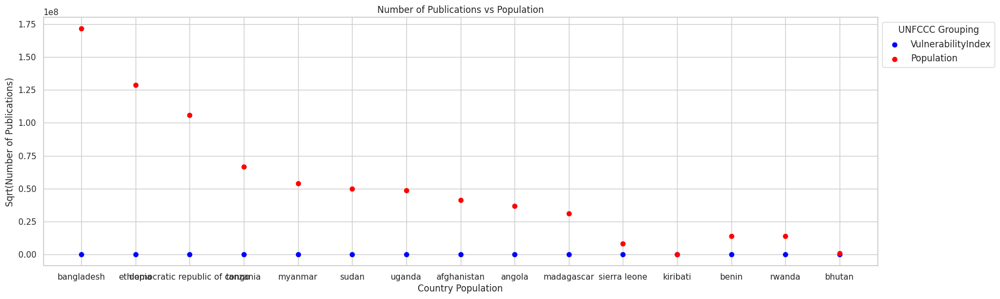

In [ ]:
fig, ax = plt.subplots(figsize=(20, 6))
plt.scatter(data=ldc_pop_vul, x='Regions_updated', y='VulnerabilityIndex', c = 'blue')
plt.scatter(data=ldc_pop_vul, x='Regions_updated', y='Population', c = 'red')
plt.legend(title='UNFCCC Grouping', title_fontsize=12, fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))
plt.title("Number of Publications vs Population")
plt.ylabel("Sqrt(Number of Publications)", fontsize=12)
plt.xlabel("Country Population", fontsize=12)
plt.show()
plt.show()

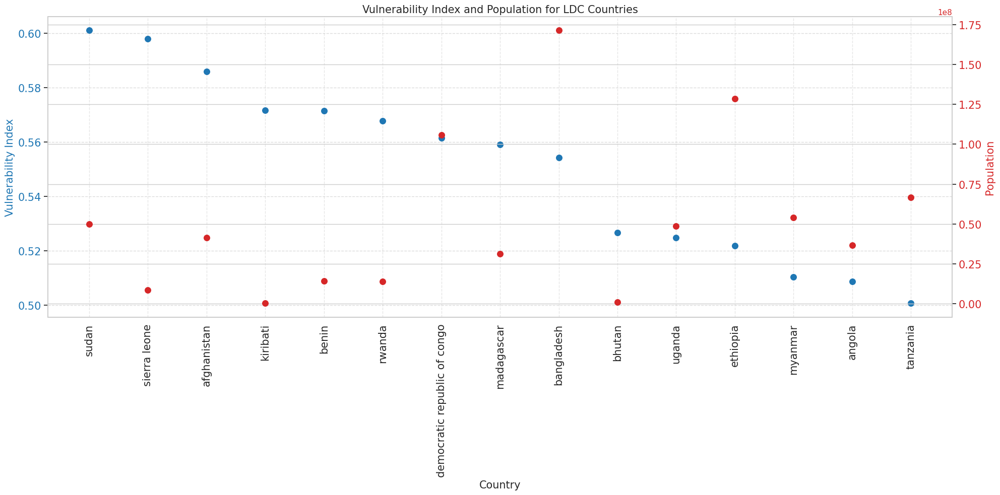

In [ ]:
fig, ax1 = plt.subplots(figsize=(20, 10))

ldc_pop_vul = ldc_pop_vul.sort_values(by=['VulnerabilityIndex', 'Population'], ascending=[False, False])

# First y-axis (for Vulnerability Index)
color = 'tab:blue'
ax1.grid(True, which='major', axis='y', linestyle='--', alpha=0.7)
ax1.set_xlabel('Country', fontsize=15)
ax1.set_ylabel('Vulnerability Index', color=color, fontsize=15)
ax1.scatter(ldc_pop_vul['Regions_updated'], ldc_pop_vul['VulnerabilityIndex'], color=color, s=70)
ax1.tick_params(axis='y', labelcolor=color, labelsize=15)
plt.xticks(rotation=90, fontsize=15)

# Second y-axis (for Population)
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Population', color=color, fontsize=15)
ax2.scatter(ldc_pop_vul['Regions_updated'], ldc_pop_vul['Population'], color=color, s=70)
ax2.tick_params(axis='y', labelcolor=color, labelsize=15)

ax1.grid(True, which='major', axis='x', linestyle='--', alpha=0.5)

plt.title('Vulnerability Index and Population for LDC Countries', fontsize=15)
plt.tight_layout()
plt.savefig("ldc_vul_pop.png", dpi=600, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [ ]:
data_country_grouped[data_country_grouped['Regions_updated'] == 'hongkong']

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt
57,hongkong,NonAnnex1,0.0,7442738.0,2,232.0,0.693147,1.414214,5.446737,15.231546


In [ ]:
data_region_grouped = data_country_grouped.groupby('ResearchRegion').agg({'NumPublications': 'sum', 'Population': 'sum'}).reset_index()
data_region_grouped['Normalised_Publications'] = data_region_grouped['NumPublications'] / data_region_grouped['Population']
data_region_grouped = data_region_grouped.sort_values('Normalised_Publications', ascending=False)
data_region_grouped

,ResearchRegion,NumPublications,Population,Normalised_Publications
10,USA,507,3.434773e+08,1.476080e-06
1,Annex1,1009,1.272894e+09,7.926820e-07
3,China,282,1.422585e+09,1.982307e-07
6,LATAM,113,6.009278e+08,1.880425e-07
8,NonAnnex1,707,6.066782e+09,1.165362e-07
5,India,101,1.438070e+09,7.023304e-08
0,Africa,74,1.057271e+09,6.999152e-08
7,LDC,52,8.477523e+08,6.133868e-08
9,Sudan,2,5.004280e+07,3.996579e-08
2,Bangladesh,6,1.714670e+08,3.499216e-08


In [ ]:
import scipy.stats as stats
import pandas as pd

df_stats = data_country_grouped.copy()

In [ ]:
df_stats['NormalisedPublications'] = df_stats['NumPublications'] / df_stats['Population']
df_stats

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt,NormalisedPublications
0,afghanistan,LDC,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605,2.412268e-08
1,afghanistan,NonAnnex1,0.586021,41454762.0,1,1569.0,0.000000,1.000000,7.358194,39.610605,2.412268e-08
2,angola,Africa,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596,1.088438e-07
3,angola,LDC,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596,1.088438e-07
4,angola,NonAnnex1,0.508869,36749907.0,4,2442.0,1.386294,2.000000,7.800573,49.416596,1.088438e-07
...,...,...,...,...,...,...,...,...,...,...,...
158,venezuela,NonAnnex1,0.373603,28300860.0,4,697.0,1.386294,2.000000,6.546785,26.400758,1.413385e-07
159,vietnam,NonAnnex1,0.457708,100352189.0,8,1422.0,2.079442,2.828427,7.259820,37.709415,7.971924e-08
160,zambia,Africa,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926,4.825331e-08
161,zambia,LDC,0.487666,20723968.0,1,2050.0,0.000000,1.000000,7.625595,45.276926,4.825331e-08


In [ ]:
annex1_pcp = list(df_stats[df_stats['ResearchRegion'] == 'Annex1']['NormalisedPublications'])  # Per-capita publications for Annex-1
non_annex1_pcp = list(df_stats[df_stats['ResearchRegion'] == 'NonAnnex1']['NormalisedPublications'])  # Per-capita publications for Non-Annex1

# Normality test
print("Annex-1 Normality Test:", stats.shapiro(annex1_pcp))
print("Non-Annex1 Normality Test:", stats.shapiro(non_annex1_pcp))

stat, p = stats.levene(annex1_pcp, non_annex1_pcp)
print("Levene's test for equal variances: p-value =", p)

#Annex-1 Normality Test: ShapiroResult(statistic=np.float64(0.41260511936130595), pvalue=np.float64(2.427265257114558e-09))
# Non-Annex1 Normality Test: ShapiroResult(statistic=np.float64(0.29145618141974317), pvalue=np.float64(3.0124364024136807e-17))
# Levene's test for equal variances: p-value = 0.28423246824230153

Annex-1 Normality Test: ShapiroResult(statistic=np.float64(0.41260511936130595), pvalue=np.float64(2.427265257114558e-09))
Non-Annex1 Normality Test: ShapiroResult(statistic=np.float64(0.29145618141974317), pvalue=np.float64(3.0124364024136807e-17))
Levene's test for equal variances: p-value = 0.28423246824230153


/tmp/ipython-input-1357583478.py:5: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/tmp/ipython-input-1357583478.py:6: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




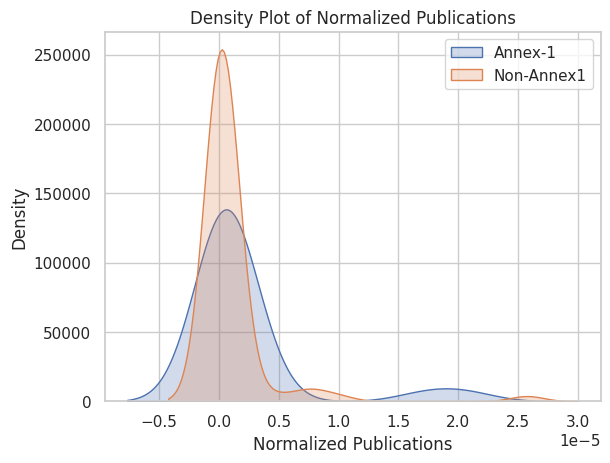

In [ ]:
# Density plots
import seaborn as sns
import matplotlib.pyplot as plt

sns.kdeplot(annex1_pcp, label="Annex-1", shade=True)
sns.kdeplot(non_annex1_pcp, label="Non-Annex1", shade=True)
plt.title("Density Plot of Normalized Publications")
plt.xlabel("Normalized Publications")
plt.ylabel("Density")
plt.legend()
plt.show()

In [ ]:
from scipy.stats import mannwhitneyu

# Mann-Whitney U test
u_stat, p_val = mannwhitneyu(annex1_pcp, non_annex1_pcp, alternative='two-sided')
print("Mann-Whitney U Test: U-statistic =", u_stat, ", p-value =", p_val)

# Interpret the result
if p_val < 0.05:
    print("The difference in per-capita publications between Annex-1 and Non-Annex1 is statistically significant.")
else:
    print("No significant difference in per-capita publications between the groups.")


Mann-Whitney U Test: U-statistic = 1394.0 , p-value = 0.003853508711694723
The difference in per-capita publications between Annex-1 and Non-Annex1 is statistically significant.


In [ ]:
# Effect size: Rank-biserial correlation
n1, n2 = len(annex1_pcp), len(non_annex1_pcp)
rank_biserial_corr = (u_stat - (n1 * n2 / 2)) / (n1 * n2 / 2)
print("Rank-Biserial Correlation (Effect Size):", rank_biserial_corr)

Rank-Biserial Correlation (Effect Size): 0.37679012345679014


In [ ]:
from statsmodels.stats.power import TTestIndPower

# Effect size (from Mann-Whitney U test)
effect_size = rank_biserial_corr  # previously computed

# Sample sizes for each group (Annex-1 and Non-Annex1)
n1 = len(annex1_pcp)  # Number of countries in Annex-1
n2 = len(non_annex1_pcp)  # Number of countries in Non-Annex1

# Significance level (alpha)
alpha = 0.05

# Instantiate the power analysis object
analysis = TTestIndPower()

# Calculate the power for the test
power = analysis.solve_power(effect_size=effect_size, nobs1=n1, alpha=alpha, ratio=n2/n1)
print(f"Power of the test: {power}")


Power of the test: 0.3832891666003354


## Annex1 vs LDC

In [ ]:
annex1_pcp = list(df_stats[df_stats['ResearchRegion'] == 'Annex1']['NormalisedPublications'])  # Per-capita publications for Annex-1
ldc_pcp = list(df_stats[df_stats['ResearchRegion'] == 'LDC']['NormalisedPublications'])  # Per-capita publications for Non-Annex1

# Normality test
print("Annex-1 Normality Test:", stats.shapiro(annex1_pcp))
print("LDC Normality Test:", stats.shapiro(ldc_pcp))

stat, p = stats.levene(annex1_pcp, ldc_pcp)
print("Levene's test for equal variances: p-value =", p)

Annex-1 Normality Test: ShapiroResult(statistic=np.float64(0.41260511936130595), pvalue=np.float64(2.427265257114558e-09))
LDC Normality Test: ShapiroResult(statistic=np.float64(0.3279468083668098), pvalue=np.float64(2.0687038510792817e-08))
Levene's test for equal variances: p-value = 0.26015411642497777


In [ ]:
from scipy.stats import mannwhitneyu

# Mann-Whitney U test
u_stat, p_val = mannwhitneyu(annex1_pcp, ldc_pcp, alternative='two-sided')
print("Mann-Whitney U Test: U-statistic =", u_stat, ", p-value =", p_val)

# Interpret the result
if p_val < 0.05:
    print("The difference in per-capita publications between Annex-1 and LDC is statistically significant.")
else:
    print("No significant difference in per-capita publications between the groups.")


Mann-Whitney U Test: U-statistic = 396.0 , p-value = 0.0019288668277076208
The difference in per-capita publications between Annex-1 and LDC is statistically significant.


In [ ]:
# Effect size: Rank-biserial correlation
n1, n2 = len(annex1_pcp), len(ldc_pcp)
rank_biserial_corr = (u_stat - (n1 * n2 / 2)) / (n1 * n2 / 2)
print("Rank-Biserial Correlation (Effect Size):", rank_biserial_corr)

Rank-Biserial Correlation (Effect Size): 0.543859649122807


In [ ]:
from statsmodels.stats.power import TTestIndPower

# Effect size (from Mann-Whitney U test)
effect_size = rank_biserial_corr  # previously computed

# Sample sizes for each group (Annex-1 and Non-Annex1)
n1 = len(annex1_pcp)  # Number of countries in Annex-1
n2 = len(ldc_pcp)  # Number of countries in Non-Annex1

# Significance level (alpha)
alpha = 0.05

# Instantiate the power analysis object
analysis = TTestIndPower()

# Calculate the power for the test
power = analysis.solve_power(effect_size=effect_size, nobs1=n1, alpha=alpha, ratio=n2/n1)
print(f"Power of the test: {power}")

Power of the test: 0.4273299593553801


# Other Stats

In [ ]:
from scipy.stats import mannwhitneyu

# Cliff's Delta
u_statistic, p_value = mannwhitneyu(annex1_pcp, non_annex1_pcp, alternative='two-sided')
cliff_delta = (u_statistic - (len(annex1_pcp) * len(non_annex1_pcp)) / 2) / (len(annex1_pcp) * len(non_annex1_pcp) / 2)
print(f"Cliff's Delta: {cliff_delta}")

Cliff's Delta: 0.37679012345679014


In [ ]:
import numpy as np

# Sample data (your normalized publication data)
# annex1_pcp = np.array([4.82e-08, 1.13e-07, 5.21e-08, 1.90e-08, 6.45e-08])  # Example Annex-1 data
# non_annex1_pcp = np.array([1.02e-08, 2.56e-08, 8.41e-08, 1.77e-08, 4.62e-08])  # Example Non-Annex1 data

# 1. Calculate observed difference (median difference)
observed_diff = np.median(annex1_pcp) - np.median(non_annex1_pcp)

# 2. Combine the data
combined_data = np.concatenate([annex1_pcp, non_annex1_pcp])

# 3. Permutation test: shuffle the data and calculate median differences
n_permutations = 10000  # Number of permutations
permuted_diffs = []

for _ in range(n_permutations):
    np.random.shuffle(combined_data)
    permuted_annex1 = combined_data[:len(annex1_pcp)]
    permuted_non_annex1 = combined_data[len(annex1_pcp):]
    permuted_diff = np.median(permuted_annex1) - np.median(permuted_non_annex1)
    permuted_diffs.append(permuted_diff)

# 4. Calculate p-value by comparing observed difference to permuted distribution
permuted_diffs = np.array(permuted_diffs)
p_value = np.mean(np.abs(permuted_diffs) >= np.abs(observed_diff))

# Output the results
print(f"Observed Median Difference: {observed_diff}")
print(f"p-value: {p_value}")


Observed Median Difference: 3.4556244085765997e-07
p-value: 0.0007


In [ ]:
# Bootstrap method to compute the confidence interval for median difference
n_bootstrap = 10000
bootstrap_diffs = []

for _ in range(n_bootstrap):
    sample_annex1 = np.random.choice(annex1_pcp, size=len(annex1_pcp), replace=True)
    sample_non_annex1 = np.random.choice(non_annex1_pcp, size=len(non_annex1_pcp), replace=True)
    bootstrap_diff = np.median(sample_annex1) - np.median(sample_non_annex1)
    bootstrap_diffs.append(bootstrap_diff)

# Calculate the 95% confidence interval
lower, upper = np.percentile(bootstrap_diffs, [2.5, 97.5])
print(f"95% Confidence Interval for Median Difference: ({lower}, {upper})")

95% Confidence Interval for Median Difference: (1.0902452489411406e-07, 7.84502359182524e-07)


In [ ]:
p_value

np.float64(0.0005)

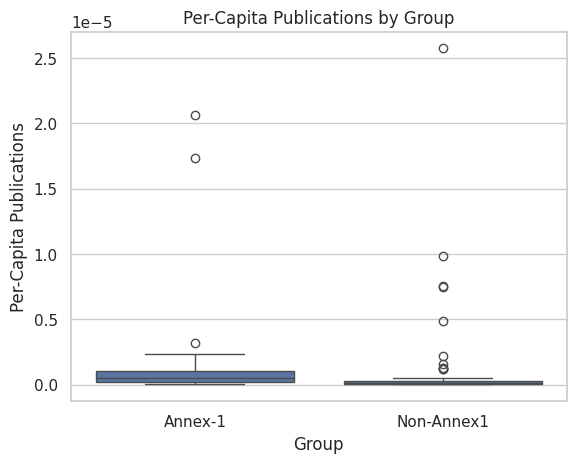

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Prepare data for visualization
data = pd.DataFrame({
    "Group": ["Annex-1"] * len(annex1_pcp) + ["Non-Annex1"] * len(non_annex1_pcp),
    "Per-Capita Publications": annex1_pcp + non_annex1_pcp
})

# Boxplot
sns.boxplot(x="Group", y="Per-Capita Publications", data=data)
plt.title("Per-Capita Publications by Group")
plt.show()


In [ ]:
df_stats[(df_stats['NormalisedPublications'] >= 0.2e-5) & (df_stats['NormalisedPublications'] <= 0.4e-5)]

,Regions_updated,ResearchRegion,VulnerabilityIndex,Population,NumPublications,Altmetrics,NumPublications_log,NumPublications_sqrt,Altmetrics_log,Altmetrics_sqrt,NormalisedPublications
7,australia,Annex1,0.306046,26451125.0,85,18682.0,4.442651,9.219544,9.835316,136.682113,0.000003
57,fiji,NonAnnex1,0.457165,924150.0,2,340.0,0.693147,1.414214,5.828946,18.439089,0.000002
102,new zealand,Annex1,0.320960,5172839.0,12,3125.0,2.484907,3.464102,8.047190,55.901699,0.000002


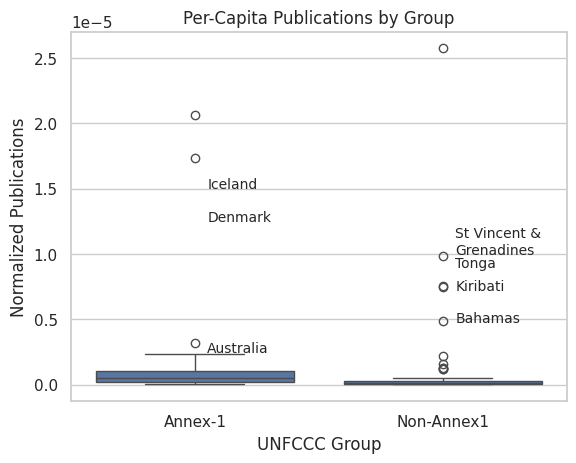

In [ ]:
# Visualization with annotations
sns.boxplot(x="Group", y="Per-Capita Publications", data=data)
plt.title("Per-Capita Publications by Group")
plt.ylabel("Normalized Publications")
plt.xlabel("UNFCCC Group")
plt.text(0.05, 1.5e-5, "Iceland", fontsize=10)
plt.text(0.05, 1.25e-5, "Denmark", fontsize=10)
plt.text(0.05, 0.25e-5, "Australia", fontsize=10)
plt.text(1.05, 0.72e-5, "Kiribati", fontsize=10)
plt.text(1.05, 0.48e-5, "Bahamas", fontsize=10)
plt.text(1.05, 1e-5, "St Vincent & \nGrenadines", fontsize=10)
plt.text(1.05, 0.9e-5, "Tonga", fontsize=10)
plt.show()


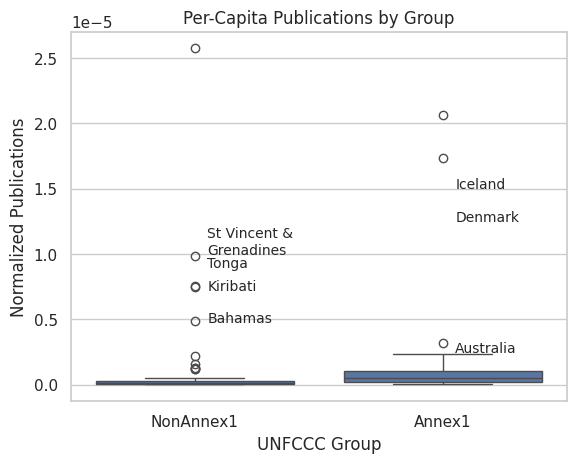

In [ ]:
# Visualization with annotations
df_stats_box = df_stats[df_stats['ResearchRegion'].isin(['Annex1', 'NonAnnex1'])]
sns.boxplot(x="ResearchRegion", y="NormalisedPublications", data=df_stats_box)
plt.title("Per-Capita Publications by Group")
plt.ylabel("Normalized Publications")
plt.xlabel("UNFCCC Group")
plt.text(1.05, 1.5e-5, "Iceland", fontsize=10)
plt.text(1.05, 1.25e-5, "Denmark", fontsize=10)
plt.text(1.05, 0.25e-5, "Australia", fontsize=10)
plt.text(0.05, 0.72e-5, "Kiribati", fontsize=10)
plt.text(0.05, 0.48e-5, "Bahamas", fontsize=10)
plt.text(0.05, 1e-5, "St Vincent & \nGrenadines", fontsize=10)
plt.text(0.05, 0.9e-5, "Tonga", fontsize=10)
plt.show()


#Results

The p-value from the Mann-Whitney U test to show statistical significance.
The rank-biserial correlation to indicate the strength of the difference.
A boxplot or similar chart to illustrate the results visually.

# Author Statistical Test

In [ ]:
country_counter

{'united states': 4965,
 'china': 2431,
 'united kingdom': 1647,
 'germany': 848,
 'australia': 652,
 'brazil': 554,
 'france': 532,
 'netherlands': 418,
 'canada': 391,
 'switzerland': 313,
 'denmark': 266,
 'italy': 221,
 'japan': 219,
 'spain': 214,
 'austria': 195,
 'sweden': 187,
 'india': 160,
 'norway': 147,
 'belgium': 138,
 'finland': 136,
 'peru': 114,
 'south korea': 93,
 'czech republic': 77,
 'singapore': 73,
 'new zealand': 58,
 'poland': 56,
 'indonesia': 47,
 'mexico': 46,
 'colombia': 45,
 'bolivia': 40,
 'south africa': 39,
 'panama': 36,
 'taiwan': 35,
 'malaysia': 34,
 'russia': 33,
 'ireland': 31,
 'argentina': 30,
 'greece': 29,
 'saudi arabia': 24,
 'israel': 22,
 'portugal': 21,
 'ecuador': 20,
 'estonia': 18,
 'chile': 18,
 'vietnam': 18,
 'cameroon': 18,
 'kenya': 17,
 'madagascar': 17,
 'trinidad and tobago': 16,
 'hungary': 14,
 'iceland': 14,
 'slovakia': 14,
 'tanzania': 13,
 'cyprus': 13,
 'congo': 13,
 'venezuela': 12,
 'ghana': 11,
 'slovenia': 11,
 'ro

In [ ]:
df_author = pd.DataFrame(list(country_counter.items()), columns=['Regions_updated', 'Author_count'])
df_author = pd.merge(df_author, population, on='Regions_updated', how='left')
df_author

,Regions_updated,Author_count,Population
0,united states,4965,3.434773e+08
1,china,2431,1.422585e+09
2,united kingdom,1647,6.868296e+07
3,germany,848,8.454823e+07
4,australia,652,2.645112e+07
...,...,...,...
104,moldova,1,3.067071e+06
105,nicaragua,1,6.823618e+06
106,sudan,1,5.004280e+07
107,latvia,1,1.882400e+06


In [ ]:
df_author = df_author[df_author['Population'].isna() == False]
df_author['ResearchRegion'] = df_author['Regions_updated'].apply(get_author_regions)
df_author = df_author.explode('ResearchRegion')
df_author['NormalisedAuthorCount'] = df_author['Author_count'] / df_author['Population']
df_author

,Regions_updated,Author_count,Population,ResearchRegion,NormalisedAuthorCount
0,united states,4965,3.434773e+08,Annex1,1.445510e-05
0,united states,4965,3.434773e+08,USA,1.445510e-05
1,china,2431,1.422585e+09,NonAnnex1,1.708861e-06
1,china,2431,1.422585e+09,China,1.708861e-06
2,united kingdom,1647,6.868296e+07,Annex1,2.397975e-05
...,...,...,...,...,...
106,sudan,1,5.004280e+07,Africa,1.998290e-08
106,sudan,1,5.004280e+07,Sudan,1.998290e-08
107,latvia,1,1.882400e+06,Annex1,5.312367e-07
108,suriname,1,6.288920e+05,NonAnnex1,1.590098e-06


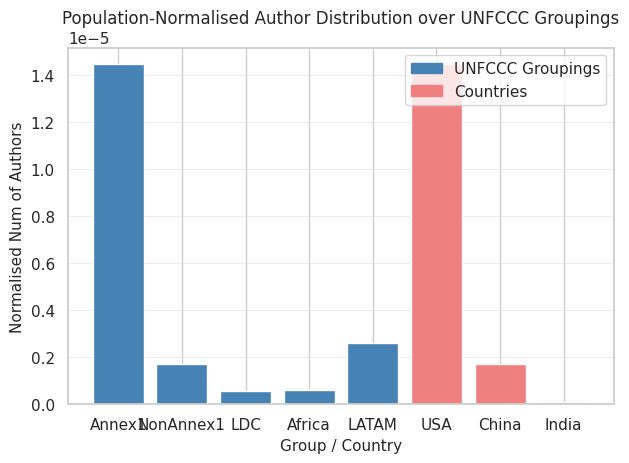

In [ ]:
region_order = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India']
region_vals = [df_author.loc[df_author['ResearchRegion'] == region, 'NormalisedAuthorCount'].values[0]
               for region in region_order]

colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)
plt.bar(region_order, region_vals, color=colors)
plt.title('Population-Normalised Author Distribution over UNFCCC Groupings')
plt.ylabel('Normalised Num of Authors', fontsize=11)
plt.xlabel('Group / Country', fontsize=11)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("population_normalised_authors.png", dpi=600, bbox_inches='tight', pad_inches=0.5)
plt.show()

In [ ]:
new_region_order = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'USA', 'China', 'India', 'Bangladesh', 'Sudan', 'DRC']
region_vals = [df_author.loc[df_author['ResearchRegion'] == region, 'NormalisedAuthorCount'].values[0]
               for region in new_region_order]
region_vals

[np.float64(1.4455102382127505e-05),
 np.float64(1.7088610576227407e-06),
 np.float64(5.449427771617431e-07),
 np.float64(6.169676936415595e-07),
 np.float64(1.4455102382127505e-05),
 np.float64(1.7088610576227407e-06),
 np.float64(1.1126026190511279e-07),
 np.float64(2.9160132318416093e-08),
 np.float64(1.9982895041502375e-08),
 np.float64(6.61689920325255e-08)]

In [ ]:
annex1_author_pcp = list(df_author[df_author['ResearchRegion'] == 'Annex1']['NormalisedAuthorCount'])  # Per-capita authors for Annex-1
non_annex1_author_pcp = list(df_author[df_author['ResearchRegion'] == 'NonAnnex1']['NormalisedAuthorCount'])  # Per-capita authors for Non-Annex1

# Normality test
print("Annex-1 Normality Test:", stats.shapiro(annex1_author_pcp))
print("Non-Annex1 Normality Test:", stats.shapiro(non_annex1_author_pcp))

stat, p = stats.levene(annex1_author_pcp, non_annex1_author_pcp)
print("Levene's test for equal variances: p-value =", p)

Annex-1 Normality Test: ShapiroResult(statistic=np.float64(0.8544665284049335), pvalue=np.float64(0.00016660413599291871))
Non-Annex1 Normality Test: ShapiroResult(statistic=np.float64(0.5585047408893182), pvalue=np.float64(2.754583488245895e-13))
Levene's test for equal variances: p-value = 1.6066098779893606e-10


In [ ]:
# Mann-Whitney U test
u_stat_author, p_val_author = mannwhitneyu(annex1_author_pcp, non_annex1_author_pcp, alternative='two-sided')
print("Mann-Whitney U Test: U-statistic =", u_stat_author, ", p-value =", p_val_author)

# Interpret the result
if p_val_author < 0.05:
    print("The difference in per-capita author count between Annex-1 and Non-Annex1 is statistically significant.")
else:
    print("No significant difference in per-capita author count between the groups.")

Mann-Whitney U Test: U-statistic = 2236.0 , p-value = 1.7298580341937457e-08
The difference in per-capita author count between Annex-1 and Non-Annex1 is statistically significant.


In [ ]:
n1_author, n2_author = len(annex1_author_pcp), len(non_annex1_author_pcp)
rank_biserial_corr_author = (u_stat_author - (n1_author * n2_author / 2)) / (n1_author * n2_author / 2)
print("Rank-Biserial Correlation (Effect Size):", rank_biserial_corr_author)

Rank-Biserial Correlation (Effect Size): 0.6575240919199407


In [ ]:
from statsmodels.stats.power import TTestIndPower

# Effect size (from Mann-Whitney U test)
effect_size_author = rank_biserial_corr_author  # previously computed

# Sample sizes for each group (Annex-1 and Non-Annex1)
n1_author = len(annex1_author_pcp)  # Number of countries in Annex-1
n2_author = len(non_annex1_author_pcp)  # Number of countries in Non-Annex1

# Significance level (alpha)
alpha = 0.05

# Instantiate the power analysis object
analysis_author = TTestIndPower()

# Calculate the power for the test
power_author = analysis_author.solve_power(effect_size=effect_size_author, nobs1=n1_author, alpha=alpha, ratio=n2_author/n1)
print(f"Power of the test: {power_author}")


Power of the test: 0.9286163534001475


In [ ]:
df_author[(df_author['NormalisedAuthorCount'] >= 0.5e-5) & (df_author['NormalisedAuthorCount'] <= 1e-5)]

,Regions_updated,Author_count,Population,ResearchRegion,NormalisedAuthorCount
6,france,532,66438828.0,Annex1,0.000008
8,canada,391,39299099.0,Annex1,0.000010
22,czech republic,77,10809722.0,Annex1,0.000007
31,panama,36,4458759.0,NonAnnex1,0.000008
31,panama,36,4458759.0,LATAM,0.000008
35,ireland,31,5196629.0,Annex1,0.000006
53,cyprus,13,1344979.0,Annex1,0.000010
57,slovenia,11,2118395.0,Annex1,0.000005
73,guyana,5,826360.0,NonAnnex1,0.000006
73,guyana,5,826360.0,LATAM,0.000006


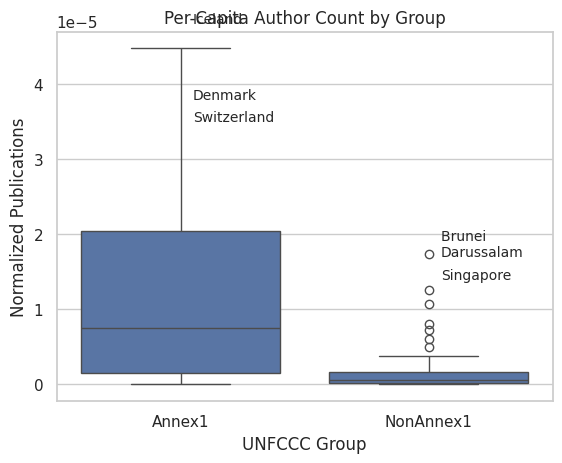

In [ ]:
# Visualization with annotations
df_author_box = df_author[df_author['ResearchRegion'].isin(['Annex1', 'NonAnnex1'])]
sns.boxplot(x="ResearchRegion", y="NormalisedAuthorCount", data=df_author_box)
plt.title("Per-Capita Author Count by Group")
plt.ylabel("Normalized Publications")
plt.xlabel("UNFCCC Group")
plt.text(0.05, 4.8e-5, "Iceland", fontsize=10)
plt.text(0.05, 3.8e-5, "Denmark", fontsize=10)
plt.text(0.05, 3.5e-5, "Switzerland", fontsize=10)
plt.text(1.05, 1.7e-5, "Brunei \nDarussalam", fontsize=10)
plt.text(1.05, 1.4e-5, "Singapore", fontsize=10)
# plt.text(0.05, 1e-5, "St Vincent & \nGrenadines", fontsize=10)
# plt.text(0.05, 0.9e-5, "Tonga", fontsize=10)
plt.show()

# Results

The p-value from the Mann-Whitney U test to show statistical significance (yes significant).
The rank-biserial correlation to indicate the strength of the difference (high effect).
A boxplot or similar chart to illustrate the results visually.

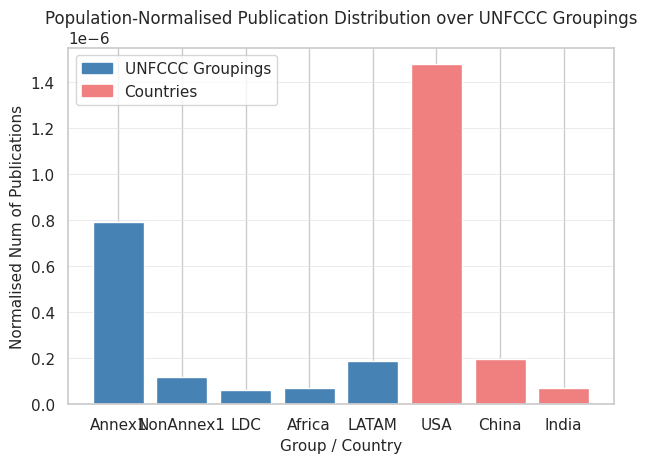

In [ ]:
region_order = ['Annex1', 'NonAnnex1', 'LDC', 'Africa', 'LATAM', 'USA', 'China', 'India']
region_vals = [data_region_grouped.loc[data_region_grouped['ResearchRegion'] == region, 'Normalised_Publications'].values[0]
               for region in region_order]

colors = ['steelblue', 'steelblue', 'steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch], fontsize=11)
plt.bar(region_order, region_vals, color=colors)

# for i, val in enumerate(region_vals):
#     plt.text(i, val + max(region_vals)*0.01, str(round(val)), ha='center', va='bottom', fontsize=10)

plt.title('Population-Normalised Publication Distribution over UNFCCC Groupings')
plt.ylabel('Normalised Num of Publications', fontsize=11)
plt.xlabel('Group / Country', fontsize=11)
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.savefig("population_normalised_publications.png", dpi=600, bbox_inches='tight', pad_inches=0.5)
plt.show()

In [ ]:
groupings = ['Region', 'Region', 'Region', 'Country', 'Country', 'Country']

# Create a DataFrame
plot_data = pd.DataFrame({
    'Category': region_order,
    'Count': region_vals,
    'Grouping': groupings
})

# Plot using Plotly Express
fig = px.bar(
    plot_data,
    x='Category',
    y='Count',
    color='Grouping',
    title='Population-Normalised Publication Distribution for UNFCCC Groupings',
    labels={'Category': 'Group / Country', 'Count': 'Normalised Publications'},
    color_discrete_map={'Region': 'steelblue', 'Country': 'lightcoral'}
)

# Customize layout
fig.update_layout(
    legend_title_text='Grouping',
    xaxis_title='Group / Country',
    yaxis_title='Normalised Number of Publications',
    yaxis=dict(gridcolor='#e3e3e3'),
    plot_bgcolor='white'
)

# st.plotly_chart(fig)

ValueError: All arrays must be of the same length

In [ ]:
colors = ['steelblue', 'steelblue', 'steelblue', 'lightcoral', 'lightcoral', 'lightcoral']
region_patch = mpatches.Patch(color='steelblue', label='UNFCCC Groupings')
country_patch = mpatches.Patch(color='lightcoral', label='Countries')
plt.legend(handles=[region_patch, country_patch])
plt.bar(data_region_grouped['ResearchRegion'], data_region_grouped['Normalised_Publications'])
plt.title('Normalised publications distribution over regions')
plt.ylabel('Normalised Num of Publications')
plt.xlabel('Region')
plt.grid(axis='y', color='#e3e3e3', linestyle='-', linewidth=0.5)
plt.tight_layout()
plt.show()

# Geospatial Analysis

In [ ]:
vulnerability = pd.read_csv('vulnerability.csv')
vulnerability = vulnerability[['Name', '2022']]
vulnerability['Regions_updated'] = vulnerability['Name'].apply(clean_regions)
vulnerability = vulnerability.explode('Regions_updated')
vulnerability.columns = ['Name', 'VulnerabilityIndex', 'Regions_updated']
vulnerability
# vulnerability.to_csv('check_vulnerability_countries.csv', index=False)

,Name,VulnerabilityIndex,Regions_updated
0,Afghanistan,0.586021,afghanistan
1,Albania,0.386332,albania
2,Algeria,0.364310,algeria
3,Andorra,NaN,andorra
4,Angola,0.508869,angola
...,...,...,...
187,"Venezuela, Bolivarian Republic o",0.373603,venezuela
188,Viet Nam,0.457708,vietnam
189,Yemen,0.521058,yemen
190,Zambia,0.487666,zambia


In [ ]:
data_pub = data_grouped[['Regions_updated', 'DOI', 'Altmetric']]
data_pub = data_pub.explode('Regions_updated')
data_pub = data_pub[~data_pub['Regions_updated'].isin(exclude_regions)]
# data_pub = data_pub.groupby(['Regions_updated', 'DOI', 'Altmetric'])['ResearchRegion'].unique().reset_index()
data_pub = data_pub.groupby('Regions_updated').agg({'DOI': 'count', 'Altmetric': 'sum'}).reset_index()
data_pub.columns = ['Regions_updated', 'NumPublications', 'Altmetrics']
# data_pub['ResearchRegion'] = data_pub['Regions_updated'].apply(get_region)

In [ ]:
# Load world map shapefile
world = gpd.read_file("shapefiles/ne_50m_admin_0_countries.shp")
world['rownum'] = range(len(world))
# world['Country'] = world['NAME'].replace(world_mapping)
world['Regions_updated'] = world['NAME'].apply(clean_regions)
world = world.explode('Regions_updated')
# world['Regions_updated'] = [country.lower() for country in world['Country']]
world = world.merge(vulnerability, on='Regions_updated', how='left')
world.loc[world['NAME'] == 'S. Sudan', 'VulnerabilityIndex'] = list(world.loc[world['NAME'] == 'Sudan', 'VulnerabilityIndex'])[0]
world.shape

(242, 173)

In [ ]:
world = world.merge(data_pub, on='Regions_updated', how='left')
world = world.merge(population, on='Regions_updated', how='left')
world['ResearchRegion'] = world['Regions_updated'].apply(get_region)
world.shape

(242, 177)

In [ ]:
world

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_UA,geometry,rownum,Regions_updated,Name,VulnerabilityIndex,NumPublications,Altmetrics,Population,ResearchRegion
0,Admin-0 country,1,3,Zimbabwe,ZWE,0,2,Sovereign country,1,Zimbabwe,...,None,"POLYGON ((31.28789 -22.40205, 31.19727 -22.344...",0,zimbabwe,Zimbabwe,0.495533,NaN,NaN,16340829.0,NonAnnex1
1,Admin-0 country,1,3,Zambia,ZMB,0,2,Sovereign country,1,Zambia,...,None,"POLYGON ((30.39609 -15.64307, 30.25068 -15.643...",1,zambia,Zambia,0.487666,3.0,6150.0,20723968.0,LDC
2,Admin-0 country,1,3,Yemen,YEM,0,2,Sovereign country,1,Yemen,...,None,"MULTIPOLYGON (((53.08564 16.64839, 52.58145 16...",2,yemen,Yemen,0.521058,NaN,NaN,39390800.0,LDC
3,Admin-0 country,3,2,Vietnam,VNM,0,2,Sovereign country,1,Vietnam,...,None,"MULTIPOLYGON (((104.06396 10.39082, 104.08301 ...",3,vietnam,Viet Nam,0.457708,8.0,1422.0,100352189.0,NonAnnex1
4,Admin-0 country,5,3,Venezuela,VEN,0,2,Sovereign country,1,Venezuela,...,None,"MULTIPOLYGON (((-60.82119 9.13838, -60.94141 9...",4,venezuela,"Venezuela, Bolivarian Republic o",0.373603,8.0,1394.0,28300860.0,NonAnnex1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,Admin-0 country,1,3,Afghanistan,AFG,0,2,Sovereign country,1,Afghanistan,...,None,"POLYGON ((66.52227 37.34849, 66.82773 37.37129...",237,afghanistan,Afghanistan,0.586021,2.0,3138.0,41454762.0,LDC
238,Admin-0 country,1,5,Kashmir,KAS,0,2,Indeterminate,None,Siachen Glacier,...,Unrecognized,"POLYGON ((77.04863 35.10991, 77.00449 35.19634...",238,siachen glacier,NaN,NaN,NaN,NaN,NaN,
239,Admin-0 country,3,4,Antarctica,ATA,0,2,Indeterminate,1,Antarctica,...,None,"MULTIPOLYGON (((-45.71777 -60.5209, -45.49971 ...",239,antarctica,NaN,NaN,NaN,NaN,NaN,
240,Admin-0 country,3,6,Netherlands,NL1,1,2,Country,1,Sint Maarten,...,None,"POLYGON ((-63.12305 18.06895, -63.01118 18.068...",240,sint maarten,NaN,NaN,NaN,NaN,NaN,


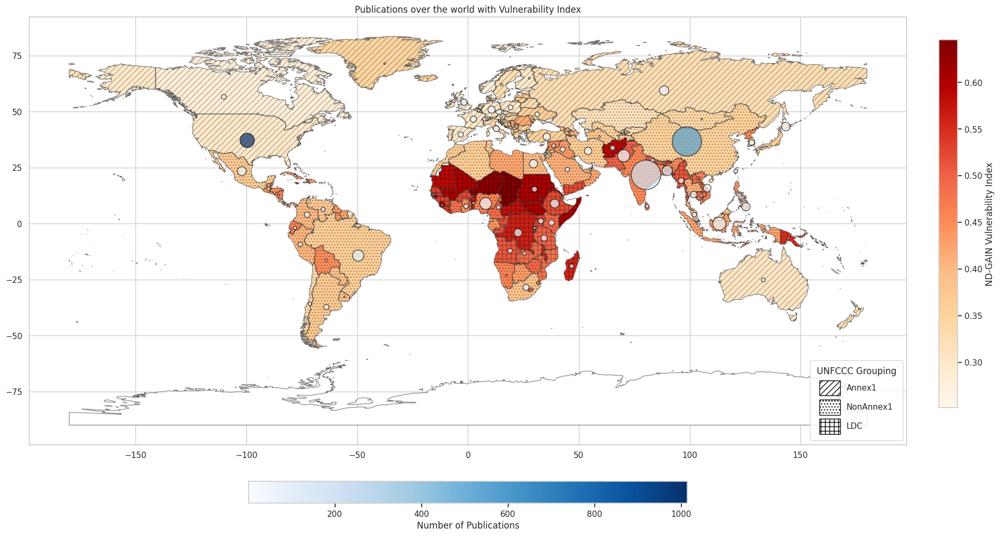

In [ ]:
# Plot the world map with ND-GAIN Vulnerability Index
fig, ax = plt.subplots(1, 1, figsize=(26, 18))

# Create the map with a color scheme for the vulnerability index
world.plot(column='VulnerabilityIndex', ax=ax, legend=True,
           cmap='OrRd', missing_kwds={'color': 'white'}, edgecolor='darkgrey', linewidth=0.5,
           legend_kwds={'label': "ND-GAIN Vulnerability Index",
                        'orientation': "vertical",
                        'shrink': 0.5, # Shrink the height of the legend
                        'pad': 0.03,
                        # 'aspect': 30,   # Adjust the aspect ratio for better fit
                      })

# # Set the title and show the plot
# ax.set_title('ND-GAIN Vulnerability Index by Country', fontsize=16)

hatch_patterns = {'Annex1': '///', 'NonAnnex1': '...', 'LDC': '++', None:''}

# Apply hatching based on ResearchRegion
for idx, row in world.iterrows():
    category = row['ResearchRegion']
    hatch = hatch_patterns.get(category, '')

    # Plot each country with the corresponding hatching pattern
    world[world.index == idx].plot(
        ax=ax,
        color='none',  # No fill color, just hatch
        edgecolor='black',  # Optional: Outline countries
        hatch=hatch,
        facecolor='black',
        alpha=0.3
    )

# Define marker shapes for each category
markers = {
    'Annex1': 'D',
    'NonAnnex1': 's',
    'LDC': '^',
    'USA': 'P',
    'India': 'X',
    'China': '*',
    'None': 'o'
}

# Use a sequential colormap for the number of publications
cmap = plt.colormaps.get_cmap('Blues')  # You can choose other sequential colormaps like 'Reds', 'Greens', etc.
norm = Normalize(vmin=world['NumPublications'].min(), vmax=world['NumPublications'].max())  # Normalize publication counts
# norm = LogNorm(vmin=max(world['NumPublications'].min(), 1), vmax=world['NumPublications'].max())
# norm = PowerNorm(gamma=0.4, vmin=world['NumPublications'].min(), vmax=world['NumPublications'].max())

# Add circles for publications, where size is based on population and color on normalized publication count
for idx, row in world.iterrows():
    if pd.notna(row['NumPublications']):

        category = row['ResearchRegion']
        marker = markers.get(category, 'o')  # Default to circle if not found

        # Get the color based on the number of publications
        circle_color = cmap(norm(row['NumPublications']))

        rep_point = row['geometry'].representative_point()

        ax.scatter(
            # row['geometry'].centroid.x,
            # row['geometry'].centroid.y,
            rep_point.x,
            rep_point.y,
            s=row['Population'] / 900000,  # Scale population for circle size
            color=circle_color,  # Use color from the colormap
            edgecolor='black',
            alpha=0.7,
            # marker=marker
        )

# Create colorbar to reflect the publication counts
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(np.array(world['NumPublications']))  # Set array for ScalarMappable

# Place the colorbar at the bottom, horizontally
# cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.4, pad=0.05)  # 'pad' adjusts the distance from the map
cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.5, pad=0.05)  # 'pad' adjusts the distance from the map
cbar.set_label('Number of Publications')  # Add label to the colorbar

# # Create custom legend handles for each category
# legend_handles = [
#     plt.Line2D([0], [0], marker=marker, color='w', label=category,
#                markerfacecolor='gray', markersize=10, markeredgecolor='black')
#     for category, marker in markers.items()
# ]

# # Add the marker legend to the plot
# ax.legend(handles=legend_handles, title="Research Regions", loc='lower right')

# Create custom legend handles for each hatch pattern
hatch_legend_handles = [
    mpatches.Patch(facecolor='white', hatch=hatch, edgecolor='black', label=category)
    for category, hatch in hatch_patterns.items() if hatch  # Exclude 'None' category or others without hatching
]

# Add the hatch legend to the plot
ax.legend(handles=hatch_legend_handles, title="UNFCCC Grouping", loc='lower right', frameon=True,
    labelspacing=0.5,  # Adjust spacing between legend entries
    borderpad=0.8,  # Adjust padding inside the legend box
    handleheight=2.5,  # Adjust handle height for larger hatching pattern
    handlelength=2.5,  # Adjust handle length for better visibility of the hatch
          )

plt.savefig("original_Scale_world_map_hd_blues.png", dpi=600, bbox_inches='tight', pad_inches=0.5)

# Show the final plot
plt.title("Publications over the world with Vulnerability Index")
plt.show()

In [ ]:
orig_world = world.copy()

In [ ]:
world['NumPublications'] = world['NumPublications'].fillna(0)
world['Population'] = world['Population'].fillna(0)
world['VulnerabilityIndex'] = world['VulnerabilityIndex'].fillna(0)

In [ ]:
# Create a list for the custom hover text
world['hover_text'] = (
    "Country: " + world['Regions_updated'] +
    "<br>Population: " + world['Population'].astype(str) +
    "<br>Number of Publications: " + world['NumPublications'].astype(str) +
    "<br>Vulnerability Index: " + world['VulnerabilityIndex'].astype(str) +
    "<br>UNFCCC Grouping: " + world['ResearchRegion'].astype(str)
)

In [ ]:
from shapely.geometry import MultiPolygon, Polygon
def create_hatch_lines(country_geometry, hatch_spacing=0.5):
    lines = []

    # Ensure MultiPolygon is iterable and handle Polygons
    polygons = []
    if isinstance(country_geometry, Polygon):
        polygons = [country_geometry]
    elif isinstance(country_geometry, MultiPolygon):
        polygons = [poly for poly in country_geometry.geoms]  # Ensure it's iterable
    else:
        return lines  # If not a valid geometry, return empty

    # Iterate through all polygons
    for polygon in polygons:
        if polygon.is_empty:
            continue

        # Extract the exterior boundary of the polygon
        exterior_coords = list(polygon.exterior.coords)
        lats, lons = zip(*exterior_coords)
        lat_min, lat_max = min(lats), max(lats)
        lon_min, lon_max = min(lons), max(lons)

        # Create diagonal hatch lines within the bounding box
        for offset in np.arange(lat_min, lat_max, hatch_spacing):
            line_lat = []
            line_lon = []
            for lat, lon in zip(lats, lons):
                if lat >= offset and lat <= offset + hatch_spacing:
                    line_lat.append(lat)
                    line_lon.append(lon)
            if line_lat and line_lon:
                lines.append((line_lat, line_lon))

    return lines

In [ ]:
fig = go.Figure()

world = world[world['VulnerabilityIndex'].isna() == False]
world['NumPublications'] = world['NumPublications'].fillna(0)
world['Population'] = world['Population'].fillna(0)

# Create a list for the custom hover text
world['hover_text'] = (
    "Country: " + world['Regions_updated'] +
    "<br>Population: " + world['Population'].astype(str) +
    "<br>Number of Publications: " + world['NumPublications'].astype(str) +
    "<br>Vulnerability Index: " + world['VulnerabilityIndex'].astype(str) +
    "<br>UNFCCC Grouping: " + world['ResearchRegion'].astype(str)
)

hatch_patterns = {'Annex1': 'dash', 'NonAnnex1': 'dot', 'LDC': 'longdashdot'}

fig.add_trace(go.Choropleth(
    locations=world['Regions_updated'],  # Match country names to Plotly's built-in geo map
    z=world['VulnerabilityIndex'],
    locationmode='country names',
    colorscale='YlOrRd',
    colorbar=dict(
        title=dict(
            text="ND-GAIN Vulnerability Index",  # Title text
            side="right"  # Title position (default is 'right')
        ),
        ticks='outside',  # Style the ticks
        # tickvals=[world['VulnerabilityIndex'].min(), world['VulnerabilityIndex'].max()],
        x=0.8,  # Adjust position horizontally (closer to the map)
        y=0.5,  # Center vertically
    ),
    # hoverinfo='none'
))

fig.update_layout(
    title="Publications Over the World with Vulnerability Index",
    geo=dict(
        showcoastlines=True,
        projection_type='equirectangular'
    ),
    margin={"r":0, "t":50, "l":0, "b":0},  # Reduce margins for better fit
)

fig.add_trace(go.Scattergeo(
    locations=world['Regions_updated'],
    locationmode='country names',
    mode='markers',
    text=world['hover_text'],  # Add custom hover text
    marker=dict(
        size=world['Population']/30000000,  # Scale population for size
        color=world['NumPublications'],
        colorscale='Blues',
        cmin=world['NumPublications'].min(),  # Min publication value
        cmax=world['NumPublications'].max(),
        line=dict(color='black', width=0.5),
        colorbar=dict(
            title="Number of Publications",
            ticks='outside',
            x=0.5,  # Center it horizontally
            y=-0.1,  # Position below the map
            xanchor='center',  # Horizontal alignment of the colorbar
            yanchor='top',
            orientation='h',
            len=0.6))))

# Add hatching overlays for Annex1, NonAnnex1, and LDC
hatch_patterns = {'Annex1': 'diagonal', 'NonAnnex1': 'horizontal', 'LDC': 'vertical'}
hatch_colors = {'Annex1': 'rgba(0, 0, 0, 0.5)', 'NonAnnex1': 'rgba(0, 0, 255, 0.5)', 'LDC': 'rgba(255, 0, 0, 0.5)'}

for region, pattern in hatch_patterns.items():
    subset = world[world['ResearchRegion'] == region]

    for _, row in subset.iterrows():
        hatch_lines = create_hatch_lines(row['geometry'])
        for line in hatch_lines:
            fig.add_trace(go.Scattergeo(
                lat=line[0],
                lon=line[1],
                mode='lines',
                line=dict(color=hatch_colors[region], width=1),
                showlegend=False
            ))

# # for region, pattern in hatch_patterns.items():
# subset = world[world['ResearchRegion'] == 'Annex1']
# countries = subset['Regions_updated']
# # for country in subset['Regions_updated']:
# fig.add_trace(go.Choropleth(
#     locations=countries,  # Single country
#     z=[1],  # Dummy z value
#     locationmode='country names',
#     colorscale=[[0, 'rgba(255,192,203,0.2)'], [1, 'rgba(255,192,203,0.2)']],  # Transparent gray
#     marker_line_color='gray',  # Add a gray border for distinction
#     showscale=False,  # No color scale for hatching
# ))



fig.show()


NameError: name 'create_hatch_lines' is not defined

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.colors import Normalize
import pandas as pd

# Normalize publication counts for the color scale
norm = Normalize(vmin=world['NumPublications'].min(), vmax=world['NumPublications'].max())

valid_vulnerability = world[world['VulnerabilityIndex'] > 0]['VulnerabilityIndex']
vulnerability_min = valid_vulnerability.min()
vulnerability_max = valid_vulnerability.max()

# Create a list for the custom hover text
world['hover_text'] = (
    "Country: " + world['Regions_updated'] +
    "<br>Population: " + world['Population'].astype(str) +
    "<br>Number of Publications: " + world['NumPublications'].astype(str) +
    "<br>Vulnerability Index: " + world['VulnerabilityIndex'].astype(str)
)

# Initialize the figure
fig = go.Figure()

# Add choropleth layer for the vulnerability index
fig.add_trace(go.Choropleth(
    locations=world['Regions_updated'],  # Match country names to Plotly's built-in geo map
    z=world['VulnerabilityIndex'],  # Vulnerability index as color scale
    locationmode='country names',
    zmin=vulnerability_min,  # Minimum value for color scaling
    zmax=vulnerability_max,
    colorscale='YlOrRd',
    # colorbar=dict(
    #     title='ND-GAIN Vulnerability Index',
    #     orientation='v'
    # ),
    hoverinfo='text',  # Show country and vulnerability index
    showscale=True,
))

# Get a colormap from Matplotlib
colormap = cm.get_cmap('Blues')

# # Add circles representing publications (scaled by population)
# for _, row in world.iterrows():
#     fig.add_trace(go.Scattergeo(
#         lon=[row['geometry'].centroid.x],
#         lat=[row['geometry'].centroid.y],
#         text=row['hover_text'],  # Add custom hover text
#         marker=dict(
#             size=row['Population'] / 50000000,  # Scale population for size
#             color='rgba' + str(colormap(norm(row['NumPublications']), bytes=True)),
#             line=dict(color='black', width=0.5)
#         ),
#         name=row['Regions_updated']  # Group in legend
#     ))


# Use a color scale for the NumPublications as a separate colorbar
fig.add_trace(go.Scattergeo(
    locations=world['Regions_updated'],
    locationmode='country names',
    mode='markers',
    marker=dict(
        size=10,  # Size of the marker can be adjusted
        color=world['NumPublications'],  # Use NumPublications for the color scale
        colorscale='Blues',  # Use Blues color scale
        cmin=world['NumPublications'].min(),  # Min publication value
        cmax=world['NumPublications'].max(),  # Max publication value
        colorbar=dict(
            title="Number of Publications",
            ticks='outside',
            tickvals=[world['NumPublications'].min(), world['NumPublications'].max()]
        )
    ),
    hoverinfo='text',
    text=world['hover_text'],  # Custom hover text
    showlegend=False  # Hide legend for this trace
))

# Update layout to include zoom and interaction
fig.update_layout(
    title="Publications Over the World with Vulnerability Index",
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type='equirectangular'
    ),
    margin={"r":0, "t":50, "l":0, "b":0},  # Reduce margins for better fit
    legend=dict(
        orientation="h",  # Make the legend horizontal
        yanchor="bottom",  # Anchor at the bottom
        y=-0.1,  # Move the legend below the plot
        xanchor="center",  # Center the legend
        x=0.5  # Center the legend horizontally
    )
)

# Show the interactive plot
fig.show()


In [ ]:
world[world['NAME'] == 'China'][['NAME', 'Name', 'Regions_updated', 'ResearchRegion', 'NumPublications', 'Population', 'VulnerabilityIndex']]

In [ ]:
world[world['NAME'] == 'Taiwan'][['NAME', 'Name', 'Regions_updated', 'ResearchRegion', 'NumPublications', 'Population', 'VulnerabilityIndex']]

In [ ]:
world[world['NAME'] == 'Hong Kong'][['NAME', 'Name', 'Regions_updated', 'ResearchRegion', 'NumPublications', 'Population', 'VulnerabilityIndex']]

In [ ]:
# test = data_subset.copy()
# test['Regions_updated_lower'] = [country.lower() for country in test['Regions_updated']]
# test['ResearchRegions'] = [region[0] for region in test['ResearchRegions']]
# test = test[['DOI', 'Year Published', 'ResearchRegions', 'Regions_updated', 'Regions_updated_lower', 'Altmetric', 'Citation']]
# test = test.groupby(['Regions_updated_lower', 'ResearchRegions']).agg({'DOI': 'count', 'Altmetric': 'sum', 'Citation': 'sum'}).reset_index()
# test.columns = ['Regions_updated_lower', 'ResearchRegions', 'NumPublications', 'AltmetricSum', 'CitationSum']
# test

In [ ]:
# pop_mapping = {'brunei': 'brunei darussalam',
#                'central african republic': 'africa',
#                'ivory coast': "cote d'ivoire",
#                'republic of the congo': 'congo',
#                'dr congo': 'congo, the democratic republic o',
#                'Dominican Rep.': 'dominican republic',
#                'south korea': 'korea, republic of',a
#                'north korea': "korea, democratic people's repub",
#                'laos': "lao people's democratic republic",
#                'libya': "libyan arab jamahiriya",
#                'micronesia': 'micronesia, federated states of',
#                'moldova': 'moldova, republic of',
#                'north macedonia': 'macedonia',
#                'St. Kitts and Nevis': 'saint kitts and nevis',
#                'St. Vin. and Gren.': 'saint vincent and the grenadines',
#                "São Tomé and Principe": 'sao tome and principe',
#                'Solomon Is.': 'solomon islands',
#                'eswatini': 'swaziland',
#                'syria': 'syrian arab republic',
#                'tanzania': 'tanzania, united republic of'}
# population_mapped = population.copy()
# population_mapped['Regions_updated_lower'] = population_mapped['Regions_updated_lower'].replace(pop_mapping)
# # uk = population_mapped.loc[population_mapped['Regions_updated_lower'] == 'united kingdom'].copy()
# # uk['Regions_updated_lower'] = 'england'
# # population_mapped = pd.concat([population_mapped, uk])
# # uk['Regions_updated_lower'] = 'scotland'
# # population_mapped = pd.concat([population_mapped, uk])
# population_mapped

In [ ]:
# vulnerability_joined = pd.merge(vulnerability_joined, population_mapped, on='Regions_updated_lower', how='left')

In [ ]:
# world_mapping = {'Antigua and Barb.': 'antigua and barbuda',
#                  'Bosnia and Herz.': 'bosnia and herzegovina',
#                  'Brunei': 'brunei darussalam',
#                  'Cabo Verde': 'cape verde',
#                  'Central African Rep.': 'africa',
#                  "Côte d'Ivoire": "cote d'ivoire",
#                  'Czechia': 'czech republic',
#                  'Dem. Rep. Congo': 'Congo, the Democratic Republic o',
#                  'Dominican Rep.': 'dominican republic',
#                  'Eq. Guinea': 'equatorial guinea',
#                  'South Korea': 'Korea, Republic of',
#                  'S. Sudan': 'sudan',
#                  'North Korea': "Korea, Democratic People's Repub",
#                  'Laos': "lao people's democratic republic",
#                  'Libya': "libyan arab jamahiriya",
#                  'North Macedonia': 'macedonia',
#                  'Marshall Is.': 'marshall islands',
#                  'St. Kitts and Nevis': 'saint kitts and nevis',
#                  'St. Vin. and Gren.': 'saint vincent and the grenadines',
#                  "São Tomé and Principe": 'sao tome and principe',
#                  'Solomon Is.': 'solomon islands',
#                  'eSwatini': 'swaziland',
#                  'Syria': 'syrian arab republic',
#                  'Tanzania': 'tanzania, united republic of',
#                  'United States of America': 'united states',
#                  }

# # Load world map shapefile
# world = gpd.read_file("shapefiles/ne_50m_admin_0_countries.shp")
# world['Country'] = world['NAME'].replace(world_mapping)
# world['Regions_updated_lower'] = [country.lower() for country in world['Country']]
# world = world.merge(vulnerability_joined, on='Regions_updated_lower', how='left')
# world.head()

In [ ]:
# temp_list = list(world[world['VulnerabilityIndex'].isna()]['NAME'].unique())
# temp_list.sort()
# temp_list

In [ ]:
# world = world[world.is_valid]

In [ ]:
# # Plot the world map with ND-GAIN Vulnerability Index
# fig, ax = plt.subplots(1, 1, figsize=(25, 22))

# # Create the map with a color scheme for the vulnerability index
# world.plot(column='VulnerabilityIndex', ax=ax, legend=True,
#            cmap='OrRd', missing_kwds={'color': 'lightyellow'},
#            legend_kwds={'label': "ND-GAIN Vulnerability Index",
#                         'orientation': "vertical",
#                         'shrink': 0.4, # Shrink the height of the legend
#                         'aspect': 30   # Adjust the aspect ratio for better fit
#                       })

# # # Set the title and show the plot
# # ax.set_title('ND-GAIN Vulnerability Index by Country', fontsize=16)

# # Use a sequential colormap for the number of publications
# cmap = plt.colormaps.get_cmap('Blues')  # You can choose other sequential colormaps like 'Reds', 'Greens', etc.
# norm = Normalize(vmin=test['NumPublications'].min(), vmax=test['NumPublications'].max())  # Normalize publication counts

# # Add circles for publications, where size is based on population and color on normalized publication count
# for idx, row in world.iterrows():
#     if pd.notna(row['NumPublications']):
#         # Get the color based on the number of publications
#         circle_color = cmap(norm(row['NumPublications']))

#         ax.scatter(
#             row['geometry'].centroid.x,
#             row['geometry'].centroid.y,
#             s=row['population'] / 1000000,  # Scale population for circle size
#             color=circle_color,  # Use color from the colormap
#             edgecolor='black',
#             alpha=0.7
#         )

# # Create colorbar to reflect the publication counts
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array(np.array(world['NumPublications']))  # Set array for ScalarMappable

# # Place the colorbar at the bottom, horizontally
# cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.4, pad=0.05)  # 'pad' adjusts the distance from the map
# cbar.set_label('Number of Publications')  # Add label to the colorbar

# # Show the final plot
# plt.title("World Map Colored by Vulnerability Index with Publication Circles")
# plt.show()

In [ ]:
# # Plot the world map with ND-GAIN Vulnerability Index
# fig, ax = plt.subplots(1, 1, figsize=(25, 22))

# # Create the map with a color scheme for the vulnerability index
# world.plot(column='VulnerabilityIndex', ax=ax, legend=True,
#            cmap='OrRd', missing_kwds={'color': 'lightyellow'},
#            legend_kwds={'label': "ND-GAIN Vulnerability Index",
#                         'orientation': "vertical",
#                         'shrink': 0.4, # Shrink the height of the legend
#                         'aspect': 30   # Adjust the aspect ratio for better fit
#                       })

# # # Set the title and show the plot
# # ax.set_title('ND-GAIN Vulnerability Index by Country', fontsize=16)

# # Use a sequential colormap for the population
# cmap = plt.colormaps.get_cmap('Blues')  # You can choose other sequential colormaps
# norm = Normalize(vmin=population_mapped['population'].min(), vmax=population_mapped['population'].max())  # Normalize population values

# # Add circles for publications, where size is based on population and color on normalized publication count
# for idx, row in world.iterrows():
#     if pd.notna(row['NumPublications']) and pd.notna(row['population']):
#         if row['geometry'].geom_type == 'MultiPolygon':
#             # If MultiPolygon, use the centroid of the largest part
#             largest_polygon = max(row['geometry'].geoms, key=lambda a: a.area)
#             centroid = largest_polygon.centroid
#         else:
#             # For single polygons, use the direct centroid
#             centroid = row['geometry'].centroid

#         circle_color = cmap(norm(row['population']))

#         ax.scatter(
#             centroid.x,
#             centroid.y,
#             s=row['NumPublications'] * 7,  # Scale population for circle size
#             color=circle_color,  # Use color from the colormap
#             edgecolor='black',
#             alpha=0.9
#         )

# # Create colorbar to reflect the publication counts
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array(np.array(world['population']))  # Set array for ScalarMappable

# # Place the colorbar at the bottom, horizontally
# cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', shrink=0.4, pad=0.05)  # 'pad' adjusts the distance from the map
# cbar.set_label('Population')  # Add label to the colorbar

# # Show the final plot
# plt.title("World Map Colored by Vulnerability Index with Publication Circles")
# plt.show()

In [ ]:
# world[world['NAME'] == 'United States of America']

In [ ]:
# world['NumPublications'] = world['NumPublications'].fillna(0)
# world['population'] = world['population'].fillna(0)

In [ ]:
# # Plot circles on top for publications
# # Define the color map for the number of publications
# publication_bins = [0, 20, 50, 100, float('inf')]  # Define publication bins
# publication_colors = ['lightblue', 'yellow', 'orange', 'red']  # Define colors for each bin

# # Create a color map based on the bins
# cmap = ListedColormap(publication_colors)

# # Function to assign colors based on bins
# def assign_color(publications):
#     if publications <= 20:
#         return 'lightblue'
#     elif 20 < publications <= 50:
#         return 'yellow'
#     elif 50 < publications <= 100:
#         return 'orange'
#     else:
#         return 'red'

# # Add circles for publications, where size is based on population and color on publication count
# for idx, row in world.iterrows():
#     if pd.notna(row['NumPublications']):
#         ax.scatter(
#             row['geometry'].centroid.x,
#             row['geometry'].centroid.y,
#             s=row['population'] / 1000,  # Scale population for circle size
#             color=assign_color(row['NumPublications']),  # Assign color based on number of publications
#             edgecolor='black',
#             alpha=0.7
#         )

# # Add legend for publication colors
# import matplotlib.patches as mpatches
# legend_labels = ['0-20', '20-50', '50-100', '100+']
# legend_colors = [mpatches.Patch(color=color) for color in publication_colors]
# plt.legend(legend_colors, legend_labels, title="Number of Publications", loc='lower left')

# # Show the final plot
# plt.title("World Map Colored by Vulnerability Index with Publication Circles")
# plt.show()

In [ ]:
# # Use a sequential colormap for the number of publications
# cmap = plt.cm.get_cmap('Blues')  # You can choose other sequential colormaps like 'Reds', 'Greens', etc.
# norm = Normalize(vmin=world['NumPublications'].min(), vmax=world['NumPublications'].max())  # Normalize publication counts

# # Add circles for publications, where size is based on population and color on normalized publication count
# for idx, row in world.iterrows():
#     if pd.notna(row['NumPublications']):
#         # Get the color based on the number of publications
#         circle_color = cmap(norm(row['NumPublications']))

#         ax.scatter(
#             row['geometry'].centroid.x,
#             row['geometry'].centroid.y,
#             s=row['population'] / 10000000,  # Scale population for circle size
#             color=circle_color,  # Use color from the colormap
#             edgecolor='black',
#             alpha=0.7
#         )

# # Create colorbar to reflect the publication counts
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array(world['NumPublications'])
# plt.colorbar(sm, label='Number of Publications', shrink=0.5, aspect=10)

# # Show the final plot
# plt.title("World Map Colored by Vulnerability Index with Publication Circles")
# plt.show()

In [ ]:
# world_temp = world[['Regions_updated_lower', 'SOVEREIGNT']]
# test = vulnerability.merge(world_temp, on='Regions_updated_lower', how='left')

In [ ]:
# temp_list = list(test[test['SOVEREIGNT'].isna()]['Regions_updated_lower'].unique())
# temp_list.sort()
# temp_list

In [ ]:
# world.to_csv('world_map_test.csv')

# Generating Analysis Docs

In [ ]:
# url = []
# criteria = []
# with open ('science_logs_1.txt', 'r') as f:
#     for row in csv.reader(f, delimiter=":"):
#       url.append("https:" + str(row[4]))
#       criteria.append(row[5].strip())

In [ ]:
# data = pd.DataFrame(data={"url": url, "criteria": criteria})
# data

In [ ]:
# data[data['criteria'] == "Criteria not met"].head(30)['url'].to_csv("science_criteria_not_met.csv", index=False)